한글 글꼴 버전 이용

In [ ]:
# 한글 폰트 설치
!sudo apt-get install -y fonts-nanum
!sudo fc-cache -fv
!rm ~/.cache/matplotlib -rf

Reading package lists... Done
Building dependency tree... Done
Reading state information... Done
fonts-nanum is already the newest version (20200506-1).
0 upgraded, 0 newly installed, 0 to remove and 29 not upgraded.
/usr/share/fonts: caching, new cache contents: 0 fonts, 1 dirs
/usr/share/fonts/truetype: caching, new cache contents: 0 fonts, 3 dirs
/usr/share/fonts/truetype/humor-sans: caching, new cache contents: 1 fonts, 0 dirs
/usr/share/fonts/truetype/liberation: caching, new cache contents: 16 fonts, 0 dirs
/usr/share/fonts/truetype/nanum: caching, new cache contents: 12 fonts, 0 dirs
/usr/local/share/fonts: caching, new cache contents: 0 fonts, 0 dirs
/root/.local/share/fonts: skipping, no such directory
/root/.fonts: skipping, no such directory
/usr/share/fonts/truetype: skipping, looped directory detected
/usr/share/fonts/truetype/humor-sans: skipping, looped directory detected
/usr/share/fonts/truetype/liberation: skipping, looped directory detected
/usr/share/fonts/truetype/

### Import

In [ ]:
# python module 호출하기
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
from sklearn.preprocessing import  OrdinalEncoder
from sklearn.ensemble import ExtraTreesClassifier
from scipy.stats import norm
from sklearn.metrics import roc_curve, auc
from sklearn.model_selection import train_test_split, StratifiedKFold
from sklearn.metrics import roc_curve, auc
from sklearn.metrics import roc_auc_score
from sklearn.preprocessing import MinMaxScaler
import warnings
warnings.filterwarnings('ignore')
%matplotlib inline

imblearn 모듈 설치

In [ ]:
!pip install imbalanced-learn

In [ ]:
from imblearn.combine import SMOTEENN

In [ ]:
!git clone --recursive https://github.com/Microsoft/LightGBM
%cd /content/LightGBM
!mkdir build
!cmake -DUSE_GPU=1
!make -j$(nproc)
!sudo apt-get -y install python-pip
!sudo -H pip install setuptools pandas numpy scipy scikit-learn -U
%cd /content/LightGBM/python-package/
!sudo python setup.py install --precompile

Cloning into 'LightGBM'...
remote: Enumerating objects: 35257, done.
remote: Counting objects: 100% (5452/5452), done.
remote: Compressing objects: 100% (561/561), done.
remote: Total 35257 (delta 5213), reused 4902 (delta 4889), pack-reused 29805 (from 2)
Receiving objects: 100% (35257/35257), 23.19 MiB | 32.49 MiB/s, done.
Resolving deltas: 100% (26341/26341), done.
Submodule 'include/boost/compute' (https://github.com/boostorg/compute) registered for path 'external_libs/compute'
Submodule 'eigen' (https://gitlab.com/libeigen/eigen.git) registered for path 'external_libs/eigen'
Submodule 'external_libs/fast_double_parser' (https://github.com/lemire/fast_double_parser.git) registered for path 'external_libs/fast_double_parser'
Submodule 'external_libs/fmt' (https://github.com/fmtlib/fmt.git) registered for path 'external_libs/fmt'
Cloning into '/content/LightGBM/external_libs/compute'...
remote: Enumerating objects: 21782, done.        
remote: Counting objects: 100% (19/19), done.   

optuna 모듈 설치

In [ ]:
# optuna를 통한 파라미터 튜닝
!pip install optuna

   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 383.6/383.6 kB 17.1 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 233.6/233.6 kB 19.2 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 78.5/78.5 kB 6.8 MB/s eta 0:00:00


In [ ]:
import matplotlib.font_manager as fm
fontpath = '/usr/share/fonts/truetype/nanum/NanumBarunGothic.ttf'
font_name = fm.FontProperties(fname=fontpath, size=10).get_name()

plt.rc('font', family=font_name)

### Data Load with csv, xlsx

In [ ]:
# data load하기 위해서 google drive 연동하기
from google.colab import drive
drive.mount('/content/drive')

Mounted at /content/drive


In [ ]:
# 압축 파일 해제
%cd /content/drive/MyDrive/data
!unzip -qq "/content/drive/MyDrive/data/open.zip"

/content/drive/MyDrive/data


In [ ]:
# 데이터 명세 설명
# data_manual = pd.read_excel("/data/데이터 명세.xlsx")
data_manual = pd.read_excel("/content/drive/MyDrive/data/데이터 명세.xlsx")
# 상위 35개 명세 설명
data_manual.head(34)

,번호,컬럼명,설명,범주형 여부,범주 정보,비고
0,1,시술 시기 코드,난임 시술을 받은 시기를 기준으로 코드 부여,1,"['TRCMWS', 'TRDQAZ', 'TRJXFG', 'TRVNRY', 'TRXQ...",NaN
1,2,시술 당시 나이,환자의 시술 당시 나이(연령대),1,"['만18-34세', '만35-37세', '만38-39세', '만40-42세', '...",NaN
2,3,임신 시도 또는 마지막 임신 경과 연수,환자가 처음 임신을 시도한 시점 또는 마지막 임신 이후 현재까지의 경과 연수 (년 단위),0,NaN,NaN
3,4,시술 유형,IVF 또는 DI 시술 여부,1,"['DI', 'IVF']",NaN
4,5,특정 시술 유형,IVF – 체외 수정 (시험관 아기 시술)\nICSI – 세포질 내 정자 주입\nI...,-,NaN,NaN
5,6,배란 자극 여부,배란 자극 치료가 사용되었는지 여부,1,"0: False, 1: True",NaN
6,7,배란 유도 유형,사용된 배란 유도 방법 유형,1,"['기록되지 않은 시행', '생식선 자극 호르몬', '세트로타이드 (억제제)', '...",NaN
7,8,단일 배아 이식 여부,선택적으로 단일 배아를 이식했는지 여부,1,"0: False, 1: True",NaN
8,9,착상 전 유전 검사 사용 여부,PGS(착상 전 유전 검사)가 시행되었는지 여부,1,"0: False, 1: True",NaN
9,10,착상 전 유전 진단 사용 여부,PGD(착상 전 유전 진단)가 시행되었는지 여부,1,"0: False, 1: True",NaN


In [ ]:
# 하위 34개 추출 (34 + 34 - 1 = 67개의 열 데이터 한다. )
data_manual.tail(34)

,번호,컬럼명,설명,범주형 여부,범주 정보,비고
34,35,DI 임신 횟수,DI 시술로 인한 임신 횟수,1,"['0회', '1회', '2회', '3회', '4회', '5회', '6회 이상']",NaN
35,36,총 출산 횟수,IVF 및 DI 시술로 출산한 횟수,1,"['0회', '1회', '2회', '3회', '4회', '5회', '6회 이상']",NaN
36,37,IVF 출산 횟수,IVF 시술로 출산한 횟수,1,"['0회', '1회', '2회', '3회', '4회', '5회', '6회 이상']",NaN
37,38,DI 출산 횟수,DI 시술로 출산한 횟수,1,"['0회', '1회', '2회', '3회', '4회', '5회', '6회 이상']",NaN
38,39,총 생성 배아 수,해당 시술에서 생성된 배아의 총 개수,0,NaN,NaN
39,40,미세주입된 난자 수,정자 미세주입(ICSI)으로 처리된 난자의 수,0,NaN,NaN
40,41,미세주입에서 생성된 배아 수,ICSI를 통해 생성된 배아의 수,0,NaN,NaN
41,42,이식된 배아 수,이식된 배아의 총 수,0,NaN,NaN
42,43,미세주입 배아 이식 수,ICSI 배아 중 이식된 배아의 수,0,NaN,NaN
43,44,저장된 배아 수,환자를 위해 저장된 배아의 수,0,NaN,NaN


In [ ]:
# train, test Dataframe 불러오기
train = pd.read_csv('/content/drive/MyDrive/data/train.csv').drop(columns=['ID'])
test = pd.read_csv('/content/drive/MyDrive/data/test.csv').drop(columns=['ID'])
# train = pd.read_csv('/data/train.csv').drop(columns=['ID'])
# test = pd.read_csv('/data/test.csv').drop(columns=['ID'])

In [ ]:
# train dataset 확인
train.head()

,시술 시기 코드,시술 당시 나이,임신 시도 또는 마지막 임신 경과 연수,시술 유형,특정 시술 유형,배란 자극 여부,배란 유도 유형,단일 배아 이식 여부,착상 전 유전 검사 사용 여부,착상 전 유전 진단 사용 여부,...,기증 배아 사용 여부,대리모 여부,PGD 시술 여부,PGS 시술 여부,난자 채취 경과일,난자 해동 경과일,난자 혼합 경과일,배아 이식 경과일,배아 해동 경과일,임신 성공 여부
0,TRZKPL,만18-34세,NaN,IVF,ICSI,1,기록되지 않은 시행,0.0,NaN,0.0,...,0.0,0.0,NaN,NaN,0.0,NaN,0.0,3.0,NaN,0
1,TRYBLT,만45-50세,NaN,IVF,ICSI,0,알 수 없음,0.0,NaN,0.0,...,0.0,0.0,NaN,NaN,0.0,NaN,0.0,NaN,NaN,0
2,TRVNRY,만18-34세,NaN,IVF,IVF,1,기록되지 않은 시행,0.0,NaN,0.0,...,0.0,0.0,NaN,NaN,0.0,NaN,0.0,2.0,NaN,0
3,TRJXFG,만35-37세,NaN,IVF,ICSI,1,기록되지 않은 시행,0.0,NaN,0.0,...,0.0,0.0,NaN,NaN,0.0,NaN,0.0,NaN,NaN,0
4,TRVNRY,만18-34세,NaN,IVF,ICSI,1,기록되지 않은 시행,0.0,NaN,0.0,...,0.0,0.0,NaN,NaN,0.0,NaN,0.0,3.0,NaN,0


In [ ]:
# test dataset 확인
test.head()

,시술 시기 코드,시술 당시 나이,임신 시도 또는 마지막 임신 경과 연수,시술 유형,특정 시술 유형,배란 자극 여부,배란 유도 유형,단일 배아 이식 여부,착상 전 유전 검사 사용 여부,착상 전 유전 진단 사용 여부,...,신선 배아 사용 여부,기증 배아 사용 여부,대리모 여부,PGD 시술 여부,PGS 시술 여부,난자 채취 경과일,난자 해동 경과일,난자 혼합 경과일,배아 이식 경과일,배아 해동 경과일
0,TRYBLT,만35-37세,NaN,IVF,IVF,1,기록되지 않은 시행,0.0,NaN,0.0,...,1.0,0.0,0.0,NaN,NaN,0.0,NaN,0.0,NaN,NaN
1,TRDQAZ,만18-34세,NaN,IVF,IVF,1,기록되지 않은 시행,0.0,NaN,0.0,...,1.0,0.0,0.0,NaN,NaN,0.0,NaN,0.0,NaN,NaN
2,TRCMWS,만40-42세,NaN,IVF,ICSI,1,기록되지 않은 시행,0.0,NaN,0.0,...,1.0,0.0,0.0,NaN,NaN,0.0,NaN,0.0,3.0,NaN
3,TRJXFG,만40-42세,NaN,IVF,ICSI,1,기록되지 않은 시행,0.0,NaN,0.0,...,1.0,0.0,0.0,NaN,NaN,0.0,NaN,0.0,2.0,NaN
4,TRJXFG,만35-37세,NaN,IVF,ICSI,1,기록되지 않은 시행,0.0,NaN,0.0,...,1.0,0.0,0.0,NaN,NaN,0.0,NaN,0.0,5.0,NaN


In [ ]:
# train 기본 정보 출력
train.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 256351 entries, 0 to 256350
Data columns (total 68 columns):
 #   Column                 Non-Null Count   Dtype  
---  ------                 --------------   -----  
 0   시술 시기 코드               256351 non-null  object 
 1   시술 당시 나이               256351 non-null  object 
 2   임신 시도 또는 마지막 임신 경과 연수  9370 non-null    float64
 3   시술 유형                  256351 non-null  object 
 4   특정 시술 유형               256349 non-null  object 
 5   배란 자극 여부               256351 non-null  int64  
 6   배란 유도 유형               256351 non-null  object 
 7   단일 배아 이식 여부            250060 non-null  float64
 8   착상 전 유전 검사 사용 여부       2718 non-null    float64
 9   착상 전 유전 진단 사용 여부       250060 non-null  float64
 10  남성 주 불임 원인             256351 non-null  int64  
 11  남성 부 불임 원인             256351 non-null  int64  
 12  여성 주 불임 원인             256351 non-null  int64  
 13  여성 부 불임 원인             256351 non-null  int64  
 14  부부 주 불임 원인             256351 non-nu

In [ ]:
# test 기본 정보 출력
test.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 90067 entries, 0 to 90066
Data columns (total 67 columns):
 #   Column                 Non-Null Count  Dtype  
---  ------                 --------------  -----  
 0   시술 시기 코드               90067 non-null  object 
 1   시술 당시 나이               90067 non-null  object 
 2   임신 시도 또는 마지막 임신 경과 연수  3297 non-null   float64
 3   시술 유형                  90067 non-null  object 
 4   특정 시술 유형               90067 non-null  object 
 5   배란 자극 여부               90067 non-null  int64  
 6   배란 유도 유형               90067 non-null  object 
 7   단일 배아 이식 여부            87891 non-null  float64
 8   착상 전 유전 검사 사용 여부       933 non-null    float64
 9   착상 전 유전 진단 사용 여부       87891 non-null  float64
 10  남성 주 불임 원인             90067 non-null  int64  
 11  남성 부 불임 원인             90067 non-null  int64  
 12  여성 주 불임 원인             90067 non-null  int64  
 13  여성 부 불임 원인             90067 non-null  int64  
 14  부부 주 불임 원인             90067 non-null  int64  
 15  부부

In [ ]:
# train 세부 기초 통계량 출력
train.describe()

,임신 시도 또는 마지막 임신 경과 연수,배란 자극 여부,단일 배아 이식 여부,착상 전 유전 검사 사용 여부,착상 전 유전 진단 사용 여부,남성 주 불임 원인,남성 부 불임 원인,여성 주 불임 원인,여성 부 불임 원인,부부 주 불임 원인,...,기증 배아 사용 여부,대리모 여부,PGD 시술 여부,PGS 시술 여부,난자 채취 경과일,난자 해동 경과일,난자 혼합 경과일,배아 이식 경과일,배아 해동 경과일,임신 성공 여부
count,9370.000000,256351.000000,250060.000000,2718.0,250060.000000,256351.000000,256351.000000,256351.000000,256351.000000,256351.000000,...,250060.000000,250060.000000,2179.0,1929.0,198863.0,1436.000000,202616.000000,212785.000000,40369.000000,256351.000000
mean,9.270651,0.771286,0.233476,1.0,0.012781,0.028516,0.013115,0.030724,0.012432,0.033068,...,0.009830,0.004195,1.0,1.0,0.0,0.001393,0.005385,3.254741,0.045629,0.258349
std,3.550313,0.420005,0.423043,0.0,0.112328,0.166441,0.113767,0.172568,0.110805,0.178814,...,0.098656,0.064633,0.0,0.0,0.0,0.037307,0.111504,1.715697,0.418672,0.437728
min,0.000000,0.000000,0.000000,1.0,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,...,0.000000,0.000000,1.0,1.0,0.0,0.000000,0.000000,0.000000,0.000000,0.000000
25%,7.000000,1.000000,0.000000,1.0,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,...,0.000000,0.000000,1.0,1.0,0.0,0.000000,0.000000,2.000000,0.000000,0.000000
50%,9.000000,1.000000,0.000000,1.0,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,...,0.000000,0.000000,1.0,1.0,0.0,0.000000,0.000000,3.000000,0.000000,0.000000
75%,11.000000,1.000000,0.000000,1.0,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,...,0.000000,0.000000,1.0,1.0,0.0,0.000000,0.000000,5.000000,0.000000,1.000000
max,20.000000,1.000000,1.000000,1.0,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,...,1.000000,1.000000,1.0,1.0,0.0,1.000000,7.000000,7.000000,7.000000,1.000000


In [ ]:
# test 세부 기초 통계량 출력
test.describe()

,임신 시도 또는 마지막 임신 경과 연수,배란 자극 여부,단일 배아 이식 여부,착상 전 유전 검사 사용 여부,착상 전 유전 진단 사용 여부,남성 주 불임 원인,남성 부 불임 원인,여성 주 불임 원인,여성 부 불임 원인,부부 주 불임 원인,...,신선 배아 사용 여부,기증 배아 사용 여부,대리모 여부,PGD 시술 여부,PGS 시술 여부,난자 채취 경과일,난자 해동 경과일,난자 혼합 경과일,배아 이식 경과일,배아 해동 경과일
count,3297.000000,90067.00000,87891.000000,933.0,87891.000000,90067.000000,90067.000000,90067.000000,90067.000000,90067.000000,...,87891.000000,87891.000000,87891.00000,781.0,671.0,70118.0,492.000000,71488.000000,74821.000000,13950.000000
mean,9.340916,0.77449,0.232788,1.0,0.012936,0.028956,0.012868,0.030455,0.012624,0.033309,...,0.842999,0.009148,0.00438,1.0,1.0,0.0,0.010163,0.005735,3.269363,0.045950
std,3.639339,0.41792,0.422611,0.0,0.113001,0.167684,0.112706,0.171837,0.111645,0.179442,...,0.363804,0.095206,0.06604,0.0,0.0,0.0,0.225417,0.111180,1.706527,0.418028
min,0.000000,0.00000,0.000000,1.0,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,...,0.000000,0.000000,0.00000,1.0,1.0,0.0,0.000000,0.000000,0.000000,0.000000
25%,7.000000,1.00000,0.000000,1.0,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,...,1.000000,0.000000,0.00000,1.0,1.0,0.0,0.000000,0.000000,2.000000,0.000000
50%,9.000000,1.00000,0.000000,1.0,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,...,1.000000,0.000000,0.00000,1.0,1.0,0.0,0.000000,0.000000,3.000000,0.000000
75%,12.000000,1.00000,0.000000,1.0,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,...,1.000000,0.000000,0.00000,1.0,1.0,0.0,0.000000,0.000000,5.000000,0.000000
max,20.000000,1.00000,1.000000,1.0,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,...,1.000000,1.000000,1.00000,1.0,1.0,0.0,5.000000,7.000000,7.000000,6.000000


### 단일 칼럼에 대한 결측치 대체하기

In [ ]:
# 결측치 대체하기

# 1. 임신 시도 또는 마지막 임신 경과 연수
print(train['임신 시도 또는 마지막 임신 경과 연수'].isnull().sum())
train['임신 시도 또는 마지막 임신 경과 연수'] = train['임신 시도 또는 마지막 임신 경과 연수'].fillna(train['임신 시도 또는 마지막 임신 경과 연수'].mean())
test['임신 시도 또는 마지막 임신 경과 연수'] = test['임신 시도 또는 마지막 임신 경과 연수'].fillna(train['임신 시도 또는 마지막 임신 경과 연수'].mean())
train = train.astype({'임신 시도 또는 마지막 임신 경과 연수': 'int64'})
test = test.astype({'임신 시도 또는 마지막 임신 경과 연수': 'int64'})
print(train['임신 시도 또는 마지막 임신 경과 연수'].isnull().sum())

# 2. 특정 시술 유형
print(train['특정 시술 유형'].isnull().sum())
train['특정 시술 유형'] =  train['특정 시술 유형'].fillna('ICSI')
test['특정 시술 유형'] =  test['특정 시술 유형'].fillna('ICSI')
print(train['특정 시술 유형'].isnull().sum())

# 3. 단일 배아 이식 여부
print(train['단일 배아 이식 여부'].isnull().sum())
train['단일 배아 이식 여부'] = train['단일 배아 이식 여부'].fillna(0.0)
test['단일 배아 이식 여부'] = test['단일 배아 이식 여부'].fillna(0.0)
train = train.astype({'단일 배아 이식 여부': 'int64'})
test = test.astype({'단일 배아 이식 여부': 'int64'})
print(train['단일 배아 이식 여부'].isnull().sum())

# 4. 착상 전 유전 검사 사용 여부
print(train['착상 전 유전 검사 사용 여부'].isnull().sum())
train['착상 전 유전 검사 사용 여부'] = train['착상 전 유전 검사 사용 여부'].fillna(1.0)
test['착상 전 유전 검사 사용 여부'] = test['착상 전 유전 검사 사용 여부'].fillna(1.0)
train = train.astype({'착상 전 유전 검사 사용 여부': 'int64'})
test = test.astype({'착상 전 유전 검사 사용 여부': 'int64'})
print(train['착상 전 유전 검사 사용 여부'].isnull().sum())

# 5. 착상 전 유전 진단 사용 여부
print(train['착상 전 유전 진단 사용 여부'].isnull().sum())
train['착상 전 유전 진단 사용 여부'] = train['착상 전 유전 진단 사용 여부'].fillna(0.0)
test['착상 전 유전 진단 사용 여부'] = test['착상 전 유전 진단 사용 여부'].fillna(0.0)
train = train.astype({'착상 전 유전 진단 사용 여부': 'int64'})
test = test.astype({'착상 전 유전 진단 사용 여부': 'int64'})
print(train['착상 전 유전 진단 사용 여부'].isnull().sum())

# 6. 배아 생성 주요 이유
print(train['배아 생성 주요 이유'].isnull().sum())
train['배아 생성 주요 이유'] = train['배아 생성 주요 이유'].fillna('현재 시술용')
test['배아 생성 주요 이유'] = test['배아 생성 주요 이유'].fillna('현재 시술용')
print(train['배아 생성 주요 이유'].isnull().sum())

# 7. 총 생성 배아 수
print(train['총 생성 배아 수'].isnull().sum())
train['총 생성 배아 수'] = train['총 생성 배아 수'].fillna(train['총 생성 배아 수'].mean())
test['총 생성 배아 수'] = test['총 생성 배아 수'].fillna(train['총 생성 배아 수'].mean())
train = train.astype({'총 생성 배아 수': 'int64'})
test = test.astype({'총 생성 배아 수': 'int64'})
print(train['총 생성 배아 수'].isnull().sum())

# 8. 미세주입된 난자 수
print(train['미세주입된 난자 수'].isnull().sum())
train['미세주입된 난자 수'] = train['미세주입된 난자 수'].fillna(train['미세주입된 난자 수'].mean())
test['미세주입된 난자 수'] = test['미세주입된 난자 수'].fillna(train['미세주입된 난자 수'].mean())
print(train['미세주입된 난자 수'].isnull().sum())

# 9. 미세주입에서 생성된 배아 수
print(train['미세주입에서 생성된 배아 수'].isnull().sum())
train['미세주입에서 생성된 배아 수'] = train['미세주입에서 생성된 배아 수'].fillna(train['미세주입에서 생성된 배아 수'].mean())
test['미세주입에서 생성된 배아 수'] = test['미세주입에서 생성된 배아 수'].fillna(train['미세주입에서 생성된 배아 수'].mean())
print(train['미세주입에서 생성된 배아 수'].isnull().sum())

# 10. 이식된 배아 수
print(train['이식된 배아 수'].isnull().sum())
train['이식된 배아 수'] = train['이식된 배아 수'].fillna(train['이식된 배아 수'].mean())
test['이식된 배아 수'] = test['이식된 배아 수'].fillna(train['이식된 배아 수'].mean())
print(train['이식된 배아 수'].isnull().sum())

# 11. 미세주입 배아 이식 수
print(train['미세주입 배아 이식 수'].isnull().sum())
train['미세주입 배아 이식 수'] = train['미세주입 배아 이식 수'].fillna(train['미세주입 배아 이식 수'].mean())
test['미세주입 배아 이식 수'] = test['미세주입 배아 이식 수'].fillna(train['미세주입 배아 이식 수'].mean())
print(train['미세주입 배아 이식 수'].isnull().sum())

# 12. 저장된 배아 수
print(train['저장된 배아 수'].isnull().sum())
train['저장된 배아 수'] = train['저장된 배아 수'].fillna(train['저장된 배아 수'].mean())
test['저장된 배아 수'] = test['저장된 배아 수'].fillna(train['저장된 배아 수'].mean())
print(train['저장된 배아 수'].isnull().sum())

# 13. 미세주입 후 저장된 배아 수
print(train['미세주입 후 저장된 배아 수'].isnull().sum())
train['미세주입 후 저장된 배아 수'] = train['미세주입 후 저장된 배아 수'].fillna(train['미세주입 후 저장된 배아 수'].mean())
test['미세주입 후 저장된 배아 수'] = test['미세주입 후 저장된 배아 수'].fillna(train['미세주입 후 저장된 배아 수'].mean())
print(train['미세주입 후 저장된 배아 수'].isnull().sum())

# 14. 해동된 배아 수
print(train['해동된 배아 수'].isnull().sum())
train['해동된 배아 수'] = train['해동된 배아 수'].fillna(train['해동된 배아 수'].mean())
test['해동된 배아 수'] = test['해동된 배아 수'].fillna(train['해동된 배아 수'].mean())
print(train['해동된 배아 수'].isnull().sum())

# 15. 해동 난자 수
print(train['해동 난자 수'].isnull().sum())
train['해동 난자 수'] = train['해동 난자 수'].fillna(train['해동 난자 수'].mean())
test['해동 난자 수'] = test['해동 난자 수'].fillna(train['해동 난자 수'].mean())
print(train['해동 난자 수'].isnull().sum())

# 16. 수집된 신선 난자 수
print(train['수집된 신선 난자 수'].isnull().sum())
train['수집된 신선 난자 수'] = train['수집된 신선 난자 수'].fillna(train['수집된 신선 난자 수'].mean())
test['수집된 신선 난자 수'] = test['수집된 신선 난자 수'].fillna(train['수집된 신선 난자 수'].mean())
print(train['수집된 신선 난자 수'].isnull().sum())

# 17. 저장된 신선 난자 수
print(train['저장된 신선 난자 수'].isnull().sum())
train['저장된 신선 난자 수'] = train['저장된 신선 난자 수'].fillna(train['저장된 신선 난자 수'].mean())
test['저장된 신선 난자 수'] = test['저장된 신선 난자 수'].fillna(train['저장된 신선 난자 수'].mean())
print(train['저장된 신선 난자 수'].isnull().sum())

# 18. 혼합된 난자 수
print(train['혼합된 난자 수'].isnull().sum())
train['혼합된 난자 수'] = train['혼합된 난자 수'].fillna(train['혼합된 난자 수'].mean())
test['혼합된 난자 수'] = test['혼합된 난자 수'].fillna(train['혼합된 난자 수'].mean())
print(train['혼합된 난자 수'].isnull().sum())

# 19. 파트너 정자와 혼합된 난자 수
print(train['파트너 정자와 혼합된 난자 수'].isnull().sum())
train['파트너 정자와 혼합된 난자 수'] = train['파트너 정자와 혼합된 난자 수'].fillna(train['파트너 정자와 혼합된 난자 수'].mean())
test['파트너 정자와 혼합된 난자 수'] = test['파트너 정자와 혼합된 난자 수'].fillna(train['파트너 정자와 혼합된 난자 수'].mean())
print(train['파트너 정자와 혼합된 난자 수'].isnull().sum())

# 20. 기증자 정자와 혼합된 난자 수
print(train['기증자 정자와 혼합된 난자 수'].isnull().sum())
train['기증자 정자와 혼합된 난자 수'] = train['기증자 정자와 혼합된 난자 수'].fillna(train['기증자 정자와 혼합된 난자 수'].mean())
test['기증자 정자와 혼합된 난자 수'] = test['기증자 정자와 혼합된 난자 수'].fillna(train['기증자 정자와 혼합된 난자 수'].mean())
print(train['기증자 정자와 혼합된 난자 수'].isnull().sum())

# 21. 동결 배아 사용 여부
print(train['동결 배아 사용 여부'].isnull().sum())
train['동결 배아 사용 여부'] = train['동결 배아 사용 여부'].fillna(0.0)
test['동결 배아 사용 여부'] = test['동결 배아 사용 여부'].fillna(0.0)
print(train['동결 배아 사용 여부'].isnull().sum())

# 22. 신선 배아 사용 여부
print(train['신선 배아 사용 여부'].isnull().sum())
train['신선 배아 사용 여부'] = train['신선 배아 사용 여부'].fillna(1.0)
test['신선 배아 사용 여부'] = test['신선 배아 사용 여부'].fillna(1.0)
print(train['신선 배아 사용 여부'].isnull().sum())

# 23. 기증 배아 사용 여부
print(train['기증 배아 사용 여부'].isnull().sum())
train['기증 배아 사용 여부'] = train['기증 배아 사용 여부'].fillna(0.0)
test['기증 배아 사용 여부'] = test['기증 배아 사용 여부'].fillna(0.0)
print(train['기증 배아 사용 여부'].isnull().sum())

# 24. 대리모 여부
print(train['대리모 여부'].isnull().sum())
train['대리모 여부'] = train['대리모 여부'].fillna(0.0)
test['대리모 여부'] = test['대리모 여부'].fillna(0.0)
print(train['대리모 여부'].isnull().sum())

# 25. PGD 시술 여부
print(train['PGD 시술 여부'].isnull().sum())
train['PGD 시술 여부'] = train['PGD 시술 여부'].fillna(1.0)
test['PGD 시술 여부'] = test['PGD 시술 여부'].fillna(1.0)
print(train['PGD 시술 여부'].isnull().sum())

# 26. PGS 시술 여부
print(train['PGS 시술 여부'].isnull().sum())
train['PGS 시술 여부'] = train['PGS 시술 여부'].fillna(1.0)
test['PGS 시술 여부'] = test['PGS 시술 여부'].fillna(1.0)
print(train['PGS 시술 여부'].isnull().sum())

# 27. 난자 채취 경과일
print(train['난자 채취 경과일'].isnull().sum())
train['난자 채취 경과일'] = train['난자 채취 경과일'].fillna(train['난자 채취 경과일'].mean())
test['난자 채취 경과일'] = test['난자 채취 경과일'].fillna(train['난자 채취 경과일'].mean())
print(train['난자 채취 경과일'].isnull().sum())

# 28. 난자 해동 경과일
print(train['난자 해동 경과일'].isnull().sum())
train['난자 해동 경과일'] = train['난자 해동 경과일'].fillna(train['난자 해동 경과일'].mean())
test['난자 해동 경과일'] = test['난자 해동 경과일'].fillna(train['난자 해동 경과일'].mean())
print(train['난자 해동 경과일'].isnull().sum())

# 29. 난자 혼합 경과일
print(train['난자 혼합 경과일'].isnull().sum())
train['난자 혼합 경과일'] = train['난자 혼합 경과일'].fillna(train['난자 혼합 경과일'].mean())
test['난자 혼합 경과일'] = test['난자 혼합 경과일'].fillna(train['난자 혼합 경과일'].mean())
print(train['난자 혼합 경과일'].isnull().sum())

# 30. 배아 이식 경과일
print(train['배아 이식 경과일'].isnull().sum())
train['배아 이식 경과일'] = train['배아 이식 경과일'].fillna(train['배아 이식 경과일'].mean())
test['배아 이식 경과일'] = test['배아 이식 경과일'].fillna(train['배아 이식 경과일'].mean())
print(train['배아 이식 경과일'].isnull().sum())

# 31. 배아 해동 경과일
print(train['배아 해동 경과일'].isnull().sum())
train['배아 해동 경과일'] = train['배아 해동 경과일'].fillna(train['배아 해동 경과일'].mean())
test['배아 해동 경과일'] = test['배아 해동 경과일'].fillna(train['배아 해동 경과일'].mean())
print(train['배아 해동 경과일'].isnull().sum())

# column별 데이터형 변환 float -> int64
train = train.astype({
    '총 생성 배아 수': 'int64',
    '미세주입된 난자 수': 'int64',
    '미세주입에서 생성된 배아 수': 'int64',
    '이식된 배아 수': 'int64',
    '미세주입 배아 이식 수': 'int64',
    '저장된 배아 수': 'int64',
    '미세주입 후 저장된 배아 수': 'int64',
    '해동된 배아 수': 'int64',
    '해동 난자 수': 'int64',
    '수집된 신선 난자 수': 'int64',
    '저장된 신선 난자 수': 'int64',
    '혼합된 난자 수': 'int64',
    '파트너 정자와 혼합된 난자 수': 'int64',
    '기증자 정자와 혼합된 난자 수': 'int64',
    '동결 배아 사용 여부': 'int64',
    '신선 배아 사용 여부': 'int64',
    '기증 배아 사용 여부': 'int64',
    '대리모 여부': 'int64',
    'PGD 시술 여부': 'int64',
    'PGS 시술 여부': 'int64',
    '난자 채취 경과일': 'int64',
    '난자 해동 경과일': 'int64',
    '난자 혼합 경과일': 'int64',
    '배아 이식 경과일': 'int64',
    '배아 해동 경과일': 'int64'
})
test = test.astype({
    '총 생성 배아 수': 'int64',
    '미세주입된 난자 수': 'int64',
    '미세주입에서 생성된 배아 수': 'int64',
    '이식된 배아 수': 'int64',
    '미세주입 배아 이식 수': 'int64',
    '저장된 배아 수': 'int64',
    '미세주입 후 저장된 배아 수': 'int64',
    '해동된 배아 수': 'int64',
    '해동 난자 수': 'int64',
    '수집된 신선 난자 수': 'int64',
    '저장된 신선 난자 수': 'int64',
    '혼합된 난자 수': 'int64',
    '파트너 정자와 혼합된 난자 수': 'int64',
    '기증자 정자와 혼합된 난자 수': 'int64',
    '동결 배아 사용 여부': 'int64',
    '신선 배아 사용 여부': 'int64',
    '기증 배아 사용 여부': 'int64',
    '대리모 여부': 'int64',
    'PGD 시술 여부': 'int64',
    'PGS 시술 여부': 'int64',
    '난자 채취 경과일': 'int64',
    '난자 해동 경과일': 'int64',
    '난자 혼합 경과일': 'int64',
    '배아 이식 경과일': 'int64',
    '배아 해동 경과일': 'int64'
})

246981
0
2
0
6291
0
253633
0
6291
0
6291
0
6291
0
6291
0
6291
0
6291
0
6291
0
6291
0
6291
0
6291
0
6291
0
6291
0
6291
0
6291
0
6291
0
6291
0
6291
0
6291
0
6291
0
6291
0
254172
0
254422
0
57488
0
254915
0
53735
0
43566
0
215982
0


In [ ]:
# 중복된 행 제거
train = train.drop_duplicates()

### 데이터 행에 대한 필터링

#### 68개에 대한 행에 연관 필터링

In [ ]:
# 데이터 필터링
# 1. 시술 당시 나이
train = train.loc[train['시술 당시 나이'] != '알 수 없음', :]
# 데이터 필터링
# 2. 임신 시도 또는 마지막 임신 경과 연수
train = train.loc[train['임신 시도 또는 마지막 임신 경과 연수'] >= 0, :]
# 데이터 필터링
# 3. 특정 시술 유형 열 필터링 후 제거
train.drop(['시술 유형'], axis=1, inplace=True)
test.drop(['시술 유형'], axis=1, inplace=True)
# 데이터 필터링
# 4. 배란 유도 유형 열 필터링
train = train.loc[train['배란 유도 유형'] != '생식선 자극 호르몬', :]
# 5. 착상 전 유전 진단 사용 여부 열 필터링
train = train.loc[(train['단일 배아 이식 여부'] != 1) | (train['착상 전 유전 진단 사용 여부'] != 0), :]
# 부부 주 불임 원인 열 필터링
w1 = (train['남성 주 불임 원인'] == 0) & (train['여성 주 불임 원인'] == 0) & (train['부부 주 불임 원인'] == 0)
w2 = (train['남성 주 불임 원인'] == 0) & (train['여성 주 불임 원인'] == 1) & (train['부부 주 불임 원인'] == 1)
w3 = (train['남성 주 불임 원인'] == 1) & (train['여성 주 불임 원인'] == 0) & (train['부부 주 불임 원인'] == 1)
w4 = (train['남성 주 불임 원인'] == 1) & (train['여성 주 불임 원인'] == 1) & (train['부부 주 불임 원인'] == 1)
# 부부 주 불임 원인 열 필터링
train = train.loc[w1 | w2 | w3 | w4, :]
# 부부 부 불임 원인 열 필터링
w1 = (train['남성 부 불임 원인'] == 0) & (train['여성 부 불임 원인'] == 0) & (train['부부 부 불임 원인'] == 0)
w2 = (train['남성 부 불임 원인'] == 0) & (train['여성 부 불임 원인'] == 1) & (train['부부 부 불임 원인'] == 1)
w3 = (train['남성 부 불임 원인'] == 1) & (train['여성 부 불임 원인'] == 0) & (train['부부 부 불임 원인'] == 1)
w4 = (train['남성 부 불임 원인'] == 1) & (train['여성 부 불임 원인'] == 1) & (train['부부 부 불임 원인'] == 1)
# 부부 부 불임 원인 열 필터링
train = train.loc[w1 | w2 | w3 | w4, :]
# 불임 원인 - 난관 질환 열 필터링
w1 = (train['여성 주 불임 원인'] == 0) & (train['여성 부 불임 원인'] == 0) & (train['불임 원인 - 난관 질환'] == 0)
w2 = (train['여성 주 불임 원인'] != 0) | (train['여성 부 불임 원인'] != 0)
# 불임 원인 - 난관 질환 열 필터링
train = train.loc[w1 | w2, :]
# 불임 원인 - 여성 요인 열 필터링
w1 = (train['여성 주 불임 원인'] == 0) & (train['여성 부 불임 원인'] == 0) & (train['불임 원인 - 여성 요인'] == 0)
w2 = (train['여성 주 불임 원인'] != 0) | (train['여성 부 불임 원인'] != 0)
# 불임 원인 - 여성 요인 열 필터링
train = train.loc[w1 | w2, :]
# 불임 원인 - 남성 요인 열 필터링
w1 = (train['남성 주 불임 원인'] == 0) & (train['남성 부 불임 원인'] == 0) & (train['불임 원인 - 남성 요인'] == 0)
w2 = (train['남성 주 불임 원인'] != 0) | (train['남성 부 불임 원인'] != 0)
# 불임 원인 - 남성 요인 열 필터링
train = train.loc[w1 | w2, :]
# 불임 원인 - 배란 장애 열 필터링
w1 = (train['여성 주 불임 원인'] == 0) & (train['여성 부 불임 원인'] == 0) & (train['불임 원인 - 배란 장애'] == 0)
w2 = (train['여성 주 불임 원인'] != 0) | (train['여성 부 불임 원인'] != 0)
# 불임 원인 - 배란 장애 열 필터링
train = train.loc[w1 | w2, :]
# 불임 원인 - 자궁경부 문제 열 필터링
w1 = (train['여성 주 불임 원인'] == 0) & (train['여성 부 불임 원인'] == 0) & (train['불임 원인 - 자궁경부 문제'] == 0)
w2 = (train['여성 주 불임 원인'] != 0) | (train['여성 부 불임 원인'] != 0)
# 불임 원인 - 자궁경부 문제 열 필터링
train = train.loc[w1 | w2, :]
# 불임 원인 - 자궁내막증 열 필터링
w1 = (train['여성 주 불임 원인'] == 0) & (train['여성 부 불임 원인'] == 0) & (train['불임 원인 - 자궁내막증'] == 0)
w2 = (train['여성 주 불임 원인'] != 0) | (train['여성 부 불임 원인'] != 0)
# 불임 원인 - 자궁내막증 열 필터링
train = train.loc[w1 | w2, :]
# 불임 원인 - 정자 농도 열 필터링
w1 = (train['남성 주 불임 원인'] == 0) & (train['남성 부 불임 원인'] == 0) & (train['불임 원인 - 정자 농도'] == 0)
w2 = (train['남성 주 불임 원인'] != 0) | (train['남성 부 불임 원인'] != 0)
# 불임 원인 - 정자 농도 열 필터링
train = train.loc[w1 | w2, :]
# 불임 원인 - 정자 면역학적 요인 열 필터링
w1 = (train['남성 주 불임 원인'] == 0) & (train['남성 부 불임 원인'] == 0) & (train['불임 원인 - 정자 면역학적 요인'] == 0)
w2 = (train['남성 주 불임 원인'] != 0) | (train['남성 부 불임 원인'] != 0)
# 불임 원인 - 정자 면역학적 요인 열 필터링'
train = train.loc[w1 | w2, :]
# 불임 원인 - 정자 운동성 열 필터링
w1 = (train['남성 주 불임 원인'] == 0) & (train['남성 부 불임 원인'] == 0) & (train['불임 원인 - 정자 운동성'] == 0)
w2 = (train['남성 주 불임 원인'] != 0) | (train['남성 부 불임 원인'] != 0)
# 불임 원인 - 정자 운동성 열 필터링
train = train.loc[w1 | w2, :]
# 불임 원인 - 정자 형태 열 필터링
w1 = (train['남성 주 불임 원인'] == 0) & (train['남성 부 불임 원인'] == 0) & (train['불임 원인 - 정자 형태'] == 0)
w2 = (train['남성 주 불임 원인'] != 0) | (train['남성 부 불임 원인'] != 0)
# 불임 원인 - 정자 형태 열 필터링
train = train.loc[w1 | w2, :]
# 배아 생성 주요 이유 열 필터링
# 1. 기증용, 현재 시술용 => 현재 시술용으로 대체
train.loc[train['배아 생성 주요 이유'] == '기증용, 현재 시술용', '배아 생성 주요 이유'] = '현재 시술용'
# 2. 기증용, 배아 저장용 => 배아 저장용으로 대체
train.loc[train['배아 생성 주요 이유'] == '기증용, 배아 저장용', '배아 생성 주요 이유'] = '배아 저장용'
# 3. 기증용, 난자 저장용 => 기증용으로 대체
train.loc[train['배아 생성 주요 이유'] == '기증용, 난자 저장용', '배아 생성 주요 이유'] = '기증용'
# 4. 배아 저장용, 현재 시술용 => 현재 시술용으로 대체
train.loc[train['배아 생성 주요 이유'] == '배아 저장용, 현재 시술용', '배아 생성 주요 이유'] = '현재 시술용'
# 5. 난자 저장용, 배아 저장용 => 배아 저장용으로 대체
train.loc[train['배아 생성 주요 이유'] == '난자 저장용, 배아 저장용', '배아 생성 주요 이유'] = '배아 저장용'
# 6. 기증용, 배아 저장용, 현재 시술용	 => 현재 시술용으로 대체
train.loc[train['배아 생성 주요 이유'] == '기증용, 배아 저장용, 현재 시술용', '배아 생성 주요 이유'] = '현재 시술용'
# 7. 연구용, 현재 시술용 => 현재 시술용으로 대체
train.loc[train['배아 생성 주요 이유'] == '연구용, 현재 시술용', '배아 생성 주요 이유'] = '현재 시술용'
# 8. 난자 저장용, 현재 시술용 => 현재 시술용으로 대체
train.loc[train['배아 생성 주요 이유'] == '난자 저장용, 현재 시술용', '배아 생성 주요 이유'] = '현재 시술용'
# 9. 난자 저장용, 배아 저장용, 연구용	 => 배아 저장용으로 대체
train.loc[train['배아 생성 주요 이유'] == '난자 저장용, 배아 저장용, 연구용', '배아 생성 주요 이유'] = '배아 저장용'
# 수집된/저장된 신선 난자 수에 대한 열 필터링
train = train.loc[train['수집된 신선 난자 수'] >= train['저장된 신선 난자 수'], :]
# 혼합된 난자 수와 파트너 정자와 혼합된 난자 수와 기증자 정자와 혼합된 난자 수에 대한 그룹화
w1 = (train['혼합된 난자 수'] >= train['파트너 정자와 혼합된 난자 수']) & (train['혼합된 난자 수'] >= train['기증자 정자와 혼합된 난자 수'])
train = train.loc[w1, :]
# 혼합된 난자수 총합 맞는지 필터링
train = train.loc[train['파트너 정자와 혼합된 난자 수'] + train['기증자 정자와 혼합된 난자 수'] == train['혼합된 난자 수'], :]

In [ ]:
# 중복된 행 제거
train = train.drop_duplicates()

### 데이터 시각화

1. 시술 시기 코드

시술 시기 코드 단일 / 다중 시각화

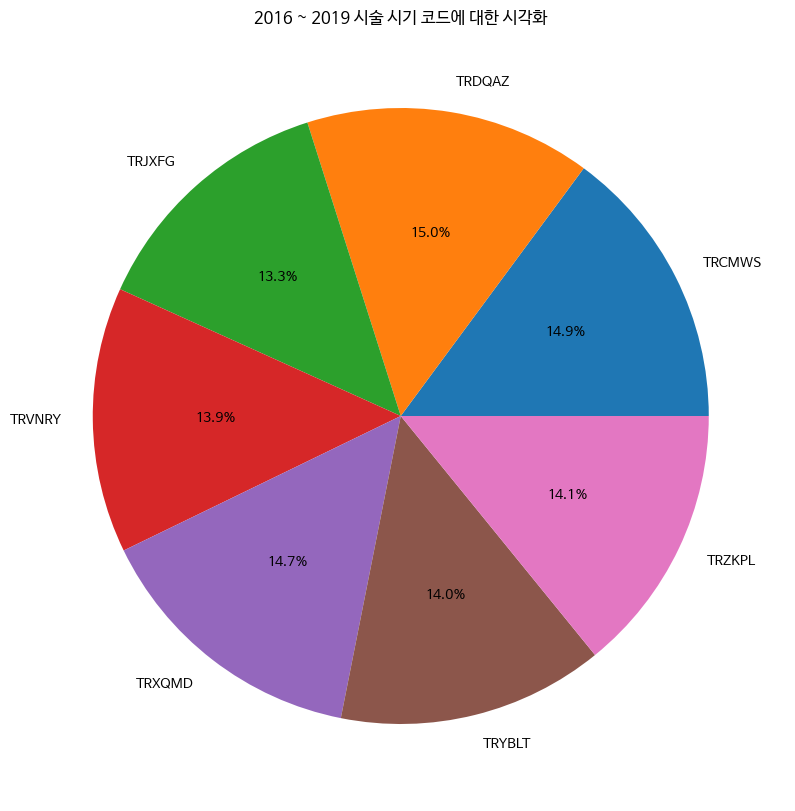

In [ ]:
# 시술 시기 코드 단일 시각화
age_similar_code = train.groupby(['시술 시기 코드'])['시술 시기 코드'].count()
age_similar_code = age_similar_code.to_frame(name='count')
# 시술 시기 코드 단일 시각화
plt.figure(figsize=(15, 10))
plt.pie(age_similar_code['count'],labels=age_similar_code.index, autopct='%.1f%%')
plt.title('2016 ~ 2019 시술 시기 코드에 대한 시각화')
plt.grid()
plt.show()

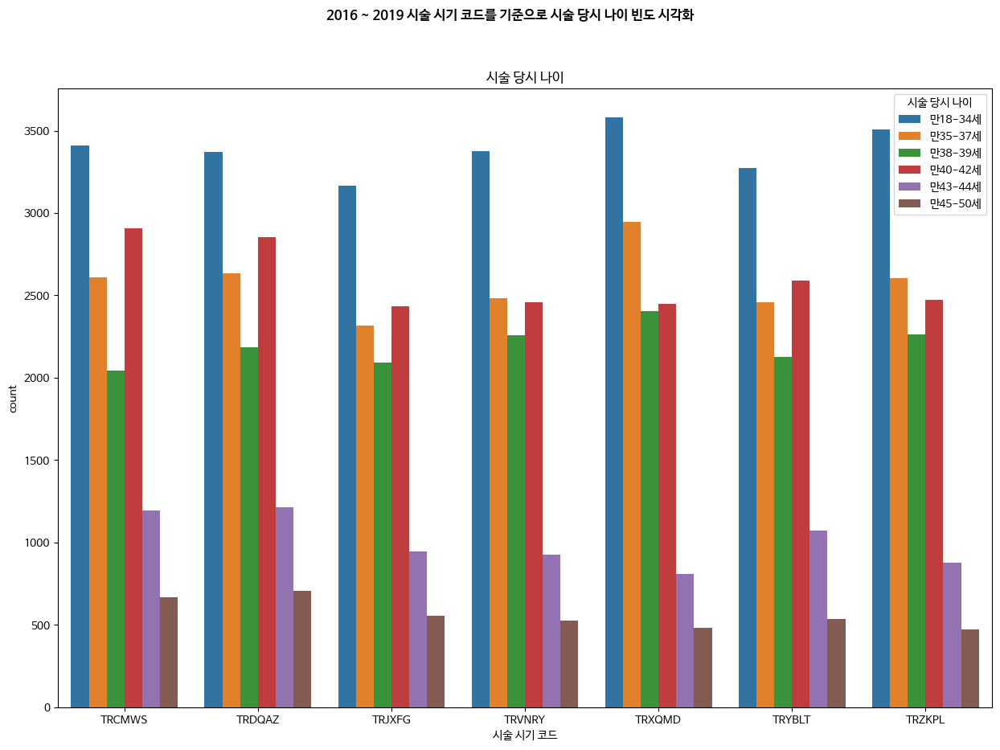

In [ ]:
# 시술 시기 코드 다중 시각화
# 시술 시기 코드 다중 시각화 - 시술 당시 나이 - 막대 그래프
curse_age_group = train.groupby(['시술 시기 코드', '시술 당시 나이'])['시술 당시 나이'].count()
curse_age_group = curse_age_group.to_frame(name='count')
fig = plt.figure(figsize=(15, 10))
area1 = fig.add_subplot(1, 1, 1)
ax1 = sns.barplot(data=curse_age_group, x='시술 시기 코드', y='count', hue='시술 당시 나이', ax=area1)
fig.suptitle('2016 ~ 2019 시술 시기 코드를 기준으로 시술 당시 나이 빈도 시각화', fontweight='bold')
area1.set_title('시술 당시 나이')
plt.show()

2. 시술 당시 나이

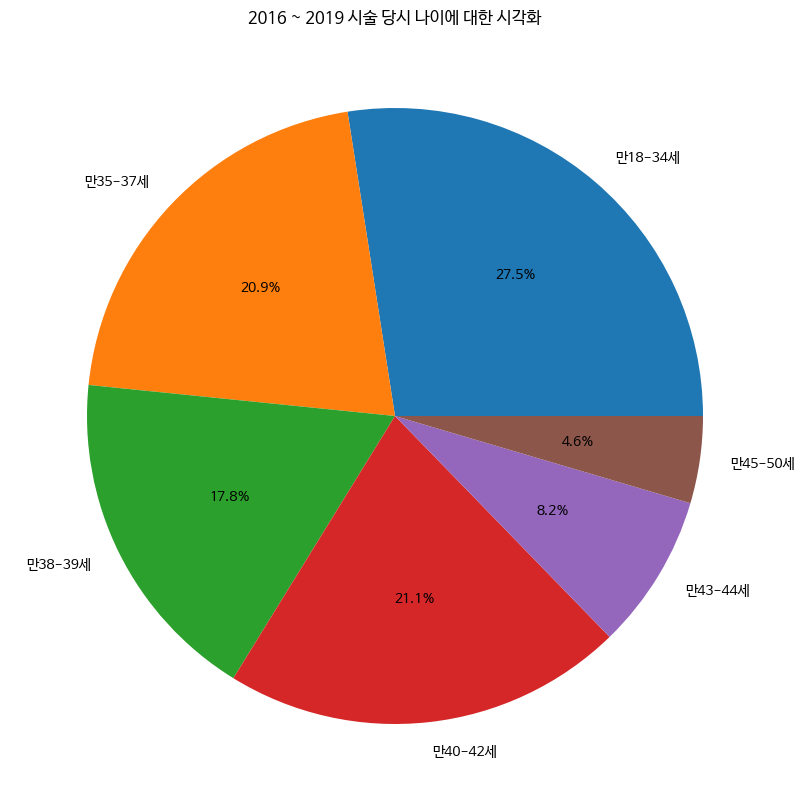

In [ ]:
# 시술 당시 나이 단일 시각화
curse_age = train.groupby(['시술 당시 나이'])['시술 당시 나이'].count()
curse_age = curse_age.to_frame(name='count')
# 시술 당시 나이 단일 시각화
plt.figure(figsize=(15, 10))
plt.pie(curse_age['count'],labels=curse_age.index, autopct='%.1f%%')
plt.title('2016 ~ 2019 시술 당시 나이에 대한 시각화')
plt.grid()
plt.show()

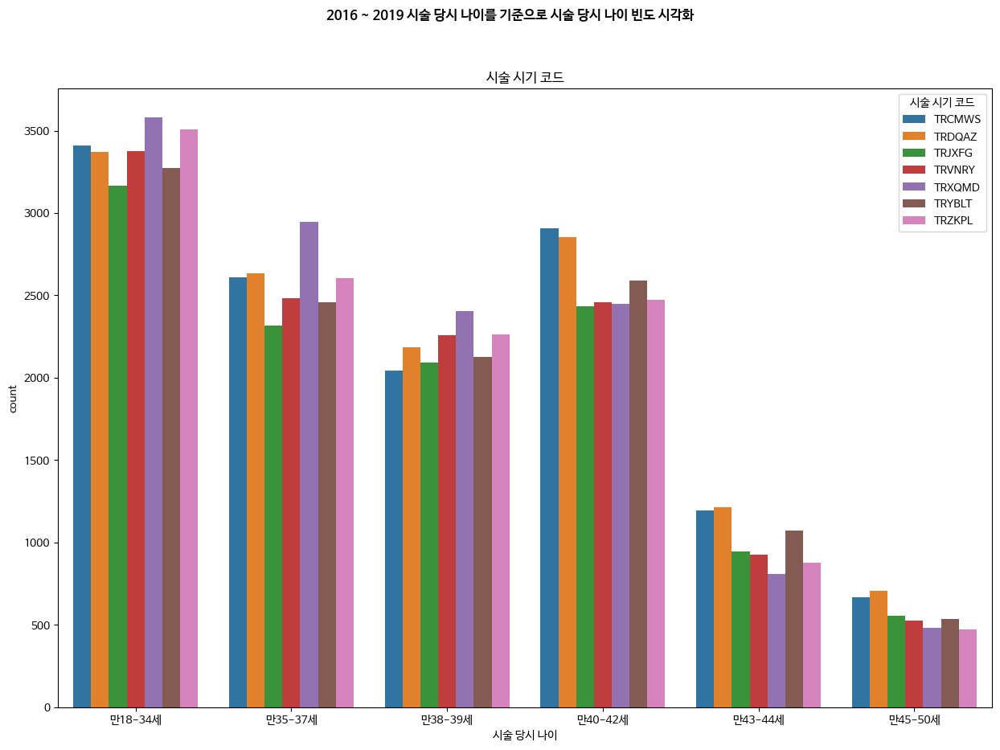

In [ ]:
# 시술 당시 나이 다중 시각화
# 시술 당시 나이 다중 시각화 - 시술 시기 코드 - 막대 그래프
age_curse_group = train.groupby(['시술 당시 나이', '시술 시기 코드'])['시술 시기 코드'].count()
age_curse_group = age_curse_group.to_frame(name='count')

fig = plt.figure(figsize=(15, 10))
area1 = fig.add_subplot(1, 1, 1)
ax1 = sns.barplot(data=age_curse_group, x='시술 당시 나이', y='count', hue='시술 시기 코드', ax=area1)
fig.suptitle('2016 ~ 2019 시술 당시 나이를 기준으로 시술 당시 나이 빈도 시각화', fontweight='bold')
area1.set_title('시술 시기 코드')
plt.show()

3. 임신 시도 또는 마지막 임신 경과 연수

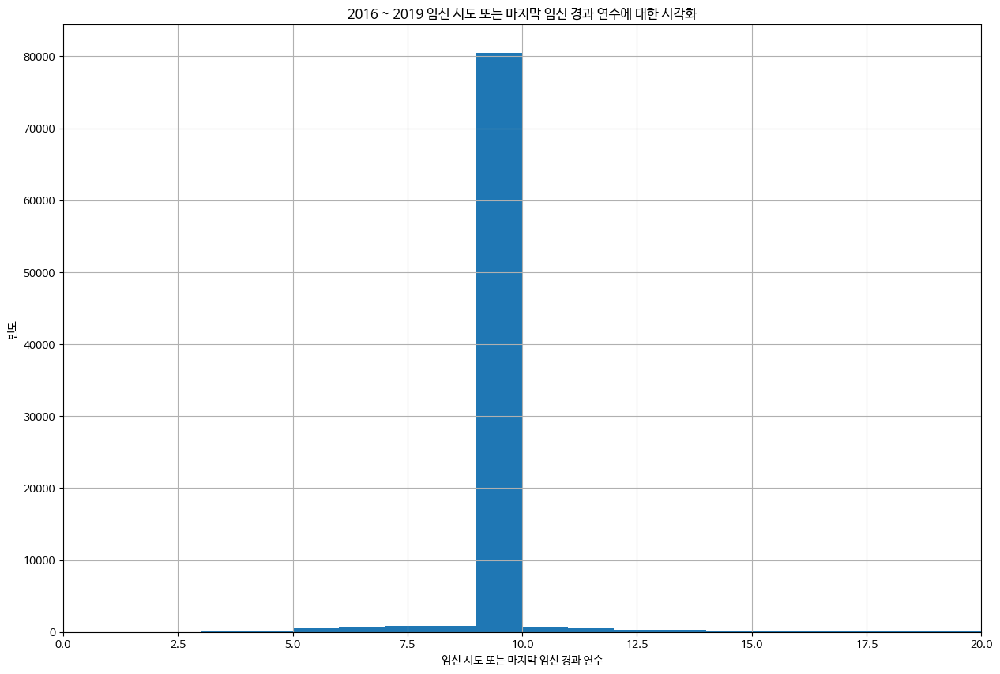

In [ ]:
# 임신 시도 또는 마지막 임신 경과 연수에 대한 시각화
plt.figure(figsize=(15, 10))
plt.hist(train['임신 시도 또는 마지막 임신 경과 연수'], bins=20)
plt.xlim(0, 20)
plt.xlabel('임신 시도 또는 마지막 임신 경과 연수')
plt.ylabel('빈도')
plt.title('2016 ~ 2019 임신 시도 또는 마지막 임신 경과 연수에 대한 시각화')

plt.grid()
plt.show()

4. 시술 유형

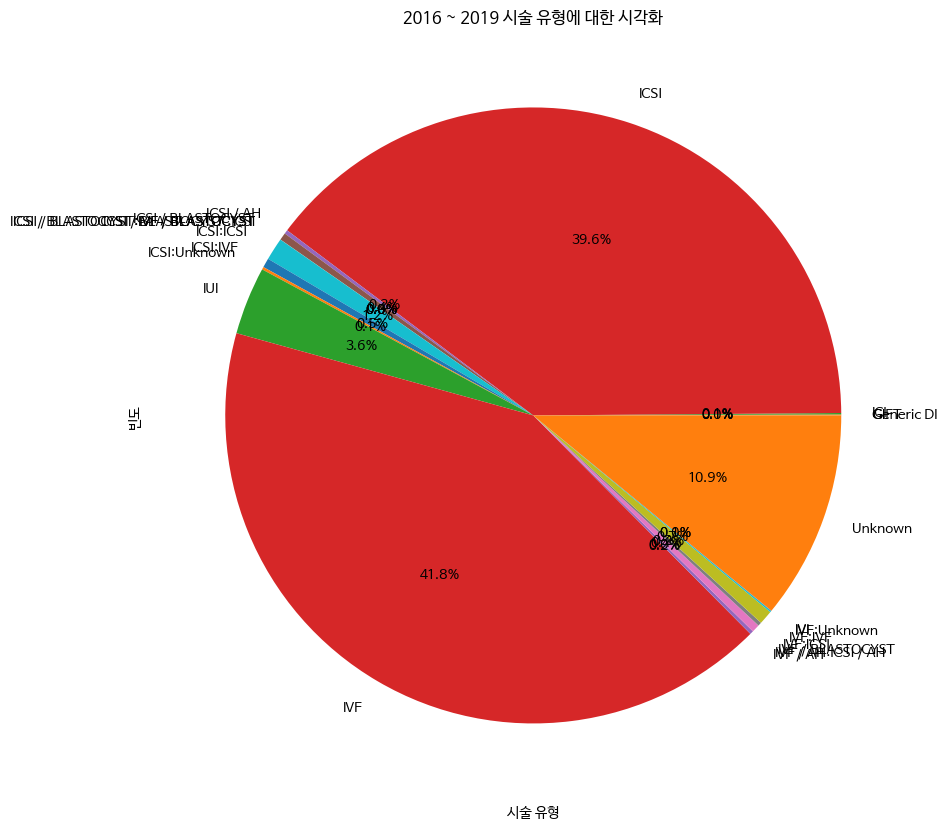

In [ ]:
# 시술 유형에 대한 단일 시각화
similar_curse_code = train.groupby(['특정 시술 유형'])['특정 시술 유형'].count()
similar_curse_code = similar_curse_code.to_frame(name='count')
plt.figure(figsize=(15, 10))
plt.pie(similar_curse_code['count'],labels=similar_curse_code.index, autopct='%.1f%%')
plt.xlabel('시술 유형')
plt.ylabel('빈도')
plt.title('2016 ~ 2019 시술 유형에 대한 시각화')
plt.grid()
plt.show()

5-1. 배란 자극 여부



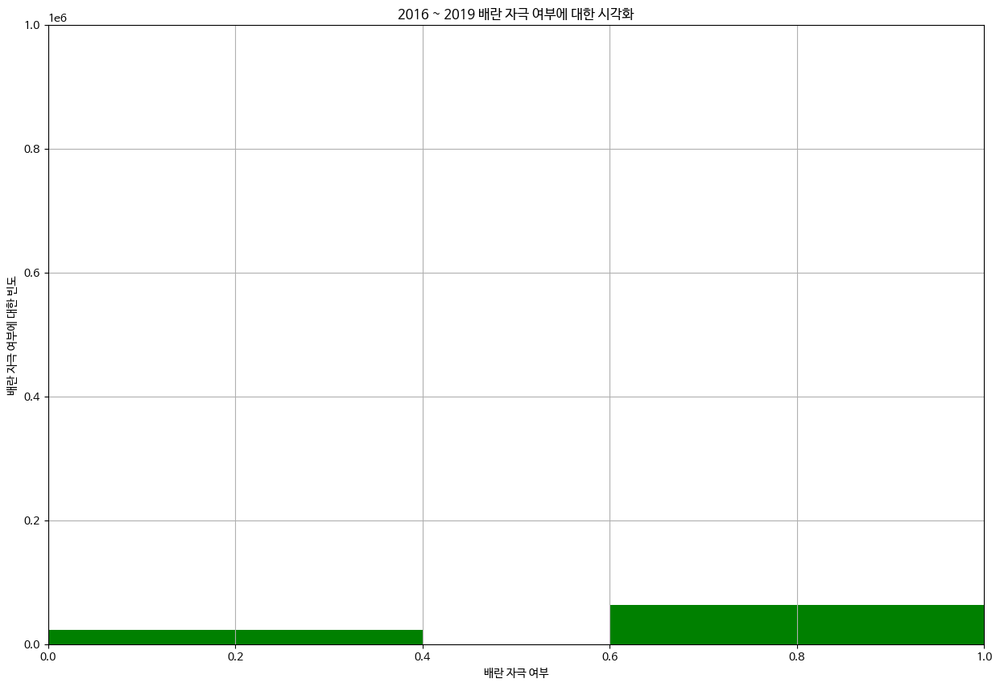

In [ ]:
# 배란 자극 여부에 대한 단일 시각화
ovulation_stimulation = train.groupby(['배란 자극 여부'])['배란 자극 여부'].count()
ovulation_stimulation = ovulation_stimulation.to_frame(name='count')
plt.figure(figsize=(15, 10))
plt.bar(ovulation_stimulation.index, ovulation_stimulation['count'], color='g')
plt.ylim(0, 1000000)
plt.xlim(0, 1)
plt.xlabel('배란 자극 여부')
plt.ylabel('배란 자극 여부에 대한 빈도')
plt.title('2016 ~ 2019 배란 자극 여부에 대한 시각화')
plt.grid()
plt.show()

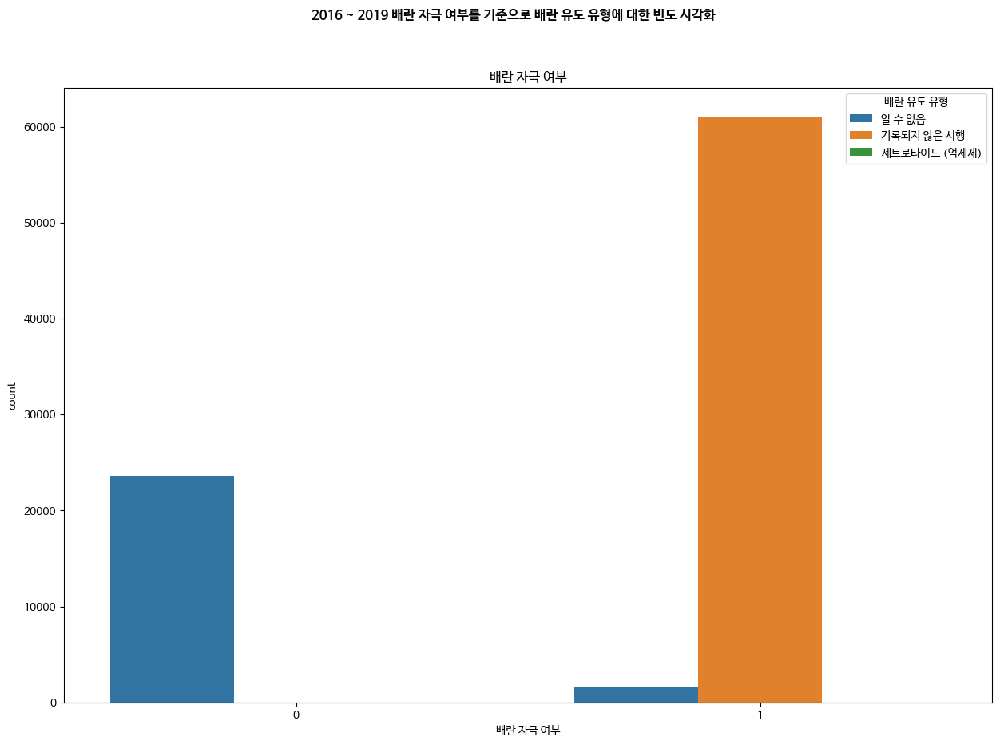

In [ ]:
# 배란 자극 여부에 대한 배란 유도 유형 그룹화
ovulation_stimulation_group = train.groupby(['배란 자극 여부', '배란 유도 유형'])['배란 유도 유형'].count()
ovulation_stimulation_group = ovulation_stimulation_group.to_frame(name='count')
ovulation_stimulation_group = ovulation_stimulation_group.reset_index()

fig = plt.figure(figsize=(15, 10))
area1 = fig.add_subplot(1, 1, 1)
ax1 = sns.barplot(data=ovulation_stimulation_group, x='배란 자극 여부', y='count', hue='배란 유도 유형', ax=area1)
fig.suptitle('2016 ~ 2019 배란 자극 여부를 기준으로 배란 유도 유형에 대한 빈도 시각화', fontweight='bold')
area1.set_title('배란 자극 여부')
plt.show()

5-2. 배란 유도 유형

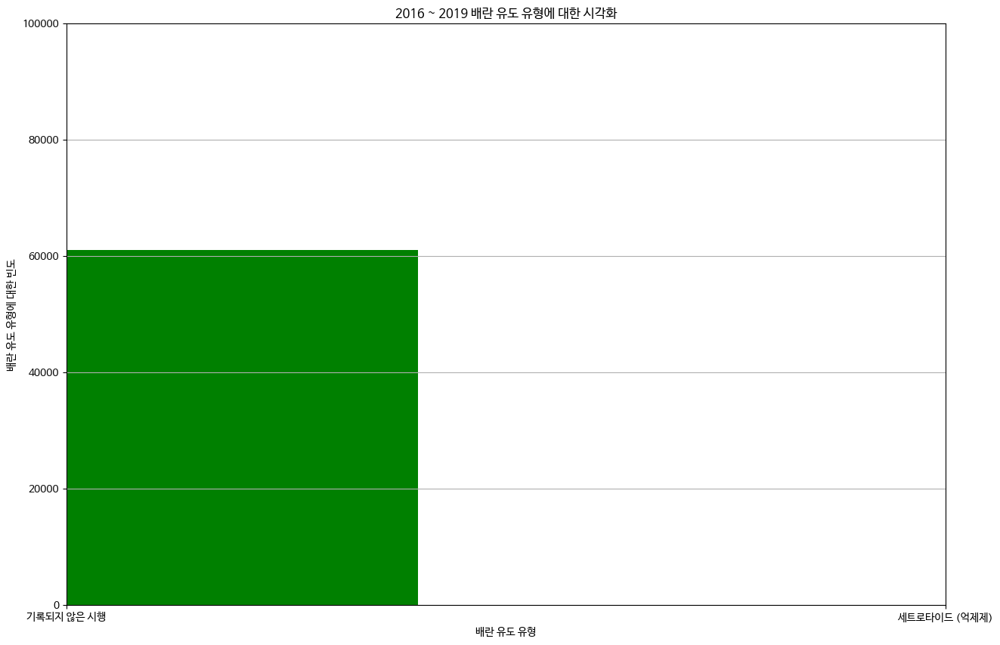

In [ ]:
# 배란 유도 유형에 대한 단일 시각화
ovulation_type = train.groupby(['배란 유도 유형'])['배란 유도 유형'].count()
ovulation_type = ovulation_type.to_frame(name='count')
plt.figure(figsize=(15, 10))
plt.bar(ovulation_type.index, ovulation_type['count'], color='g')
plt.ylim(0, 100000)
plt.xlim(0, 1)
plt.xlabel('배란 유도 유형')
plt.ylabel('배란 유도 유형에 대한 빈도')
plt.title('2016 ~ 2019 배란 유도 유형에 대한 시각화')
plt.grid()
plt.show()

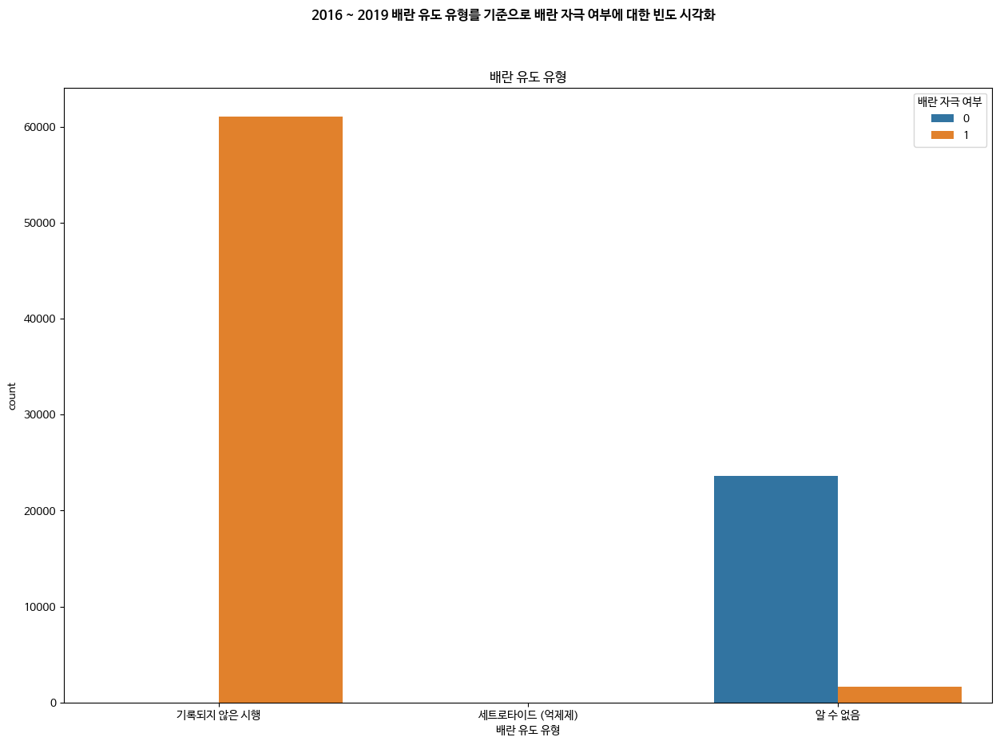

In [ ]:
# 배란 유도 유형과 배란 자극 여부에 대한 그룹화
# 배란 자극 여부에 대한 배란 유도 유형 그룹화
stimulation_ovulation_group = train.groupby(['배란 유도 유형', '배란 자극 여부'])['배란 자극 여부'].count()
stimulation_ovulation_group = stimulation_ovulation_group.to_frame(name='count')
stimulation_ovulation_group = stimulation_ovulation_group.reset_index()

fig = plt.figure(figsize=(15, 10))
area1 = fig.add_subplot(1, 1, 1)
ax1 = sns.barplot(data=stimulation_ovulation_group, x='배란 유도 유형', y='count', hue='배란 자극 여부', ax=area1)
fig.suptitle('2016 ~ 2019 배란 유도 유형를 기준으로 배란 자극 여부에 대한 빈도 시각화', fontweight='bold')
area1.set_title('배란 유도 유형')
plt.show()

6-1. 단일 배아 이식 여부

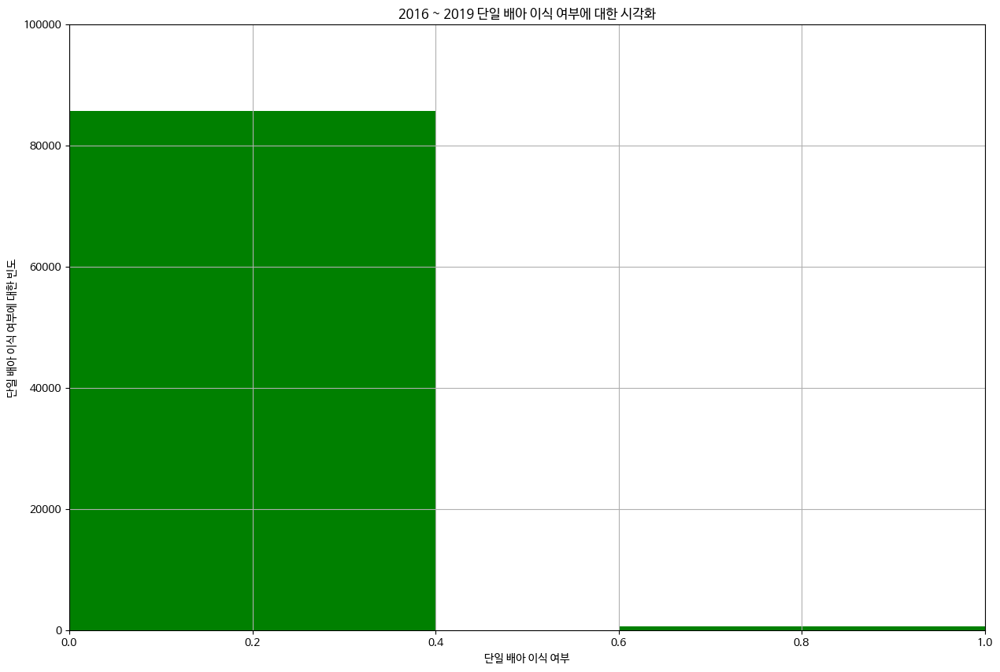

In [ ]:
# 단일 배아 이식 여부에 대한 단일 시각화
embryo_type = train.groupby(['단일 배아 이식 여부'])['단일 배아 이식 여부'].count()
embryo_type = embryo_type.to_frame(name='count')
plt.figure(figsize=(15, 10))
plt.bar(embryo_type.index, embryo_type['count'], color='g')
plt.ylim(0, 100000)
plt.xlim(0, 1)
plt.xlabel('단일 배아 이식 여부')
plt.ylabel('단일 배아 이식 여부에 대한 빈도')
plt.title('2016 ~ 2019 단일 배아 이식 여부에 대한 시각화')
plt.grid()
plt.show()

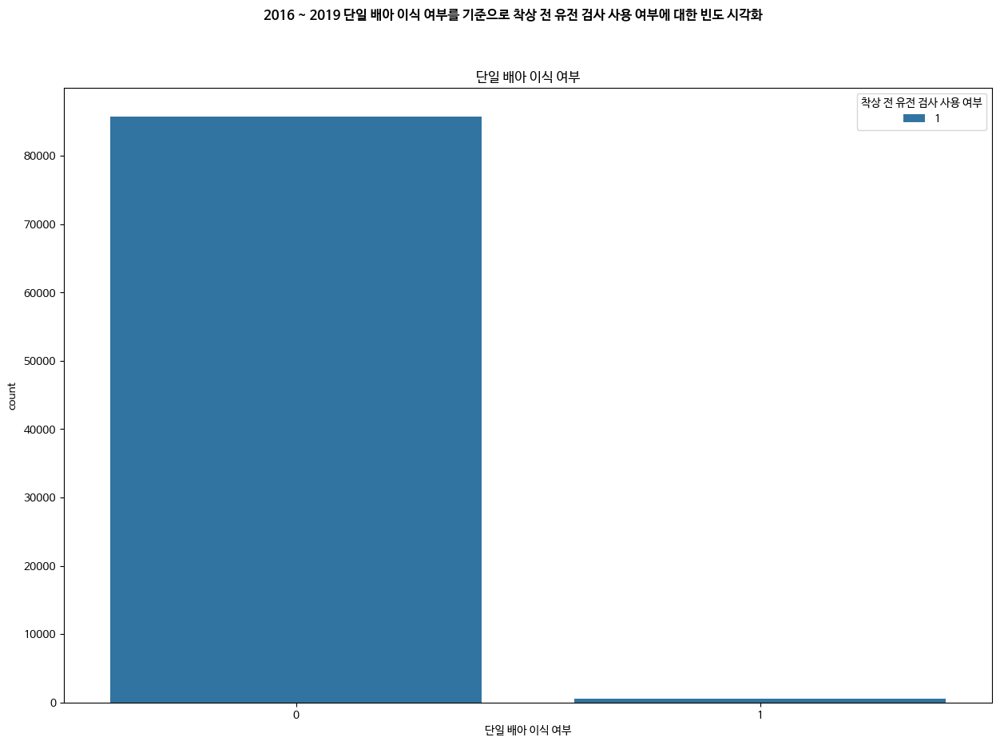

In [ ]:
# 단일 배아 이식 여부와 착상 전 유전 검사 사용 여부에 대한 그룹화
embryo_gene_test = train.groupby(['단일 배아 이식 여부', '착상 전 유전 검사 사용 여부'])['착상 전 유전 검사 사용 여부'].count()
embryo_gene_test = embryo_gene_test.to_frame(name='count')
embryo_gene_test = embryo_gene_test.reset_index()

fig = plt.figure(figsize=(15, 10))
area1 = fig.add_subplot(1, 1, 1)
ax1 = sns.barplot(data=embryo_gene_test, x='단일 배아 이식 여부', y='count', hue='착상 전 유전 검사 사용 여부', ax=area1)
fig.suptitle('2016 ~ 2019 단일 배아 이식 여부를 기준으로 착상 전 유전 검사 사용 여부에 대한 빈도 시각화', fontweight='bold')
area1.set_title('단일 배아 이식 여부')
plt.show()

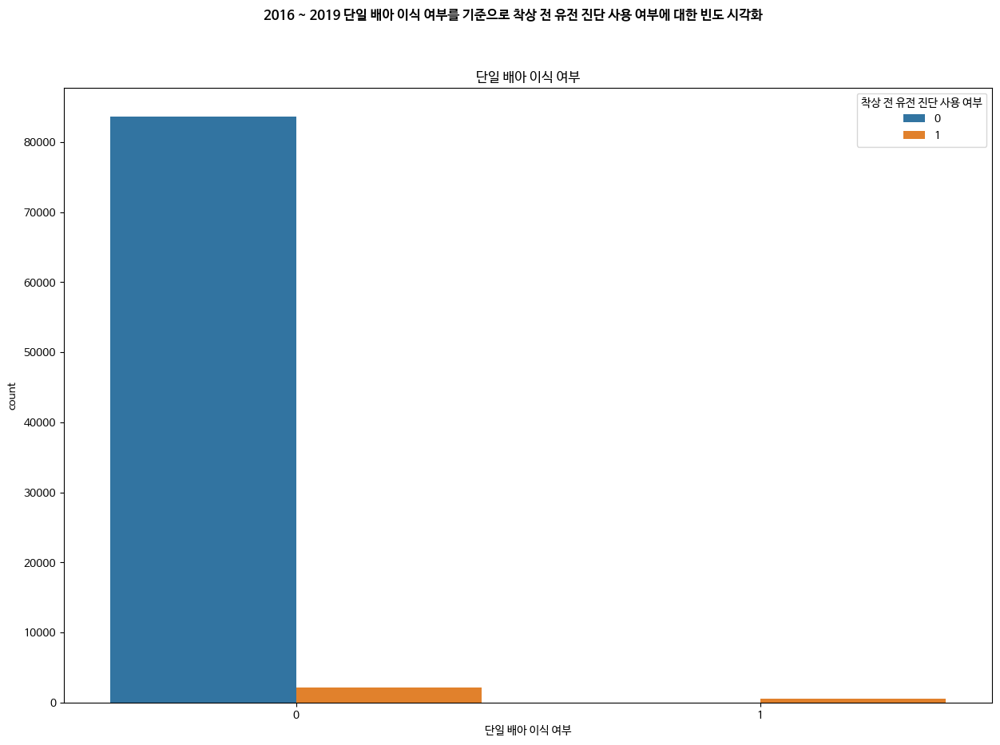

In [ ]:
# 단일 배아 이식 여부와 착상 전 유전 진단 사용 여부에 대한 그룹화
embryo_gene_diagonsis = train.groupby(['단일 배아 이식 여부', '착상 전 유전 진단 사용 여부'])['착상 전 유전 진단 사용 여부'].count()
embryo_gene_diagonsis = embryo_gene_diagonsis.to_frame(name='count')
embryo_gene_diagonsis = embryo_gene_diagonsis.reset_index()

fig = plt.figure(figsize=(15, 10))
area1 = fig.add_subplot(1, 1, 1)
ax1 = sns.barplot(data=embryo_gene_diagonsis, x='단일 배아 이식 여부', y='count', hue='착상 전 유전 진단 사용 여부', ax=area1)
fig.suptitle('2016 ~ 2019 단일 배아 이식 여부를 기준으로 착상 전 유전 진단 사용 여부에 대한 빈도 시각화', fontweight='bold')
area1.set_title('단일 배아 이식 여부')
plt.show()

6-2. 착상 전 유전 검사 사용 여부

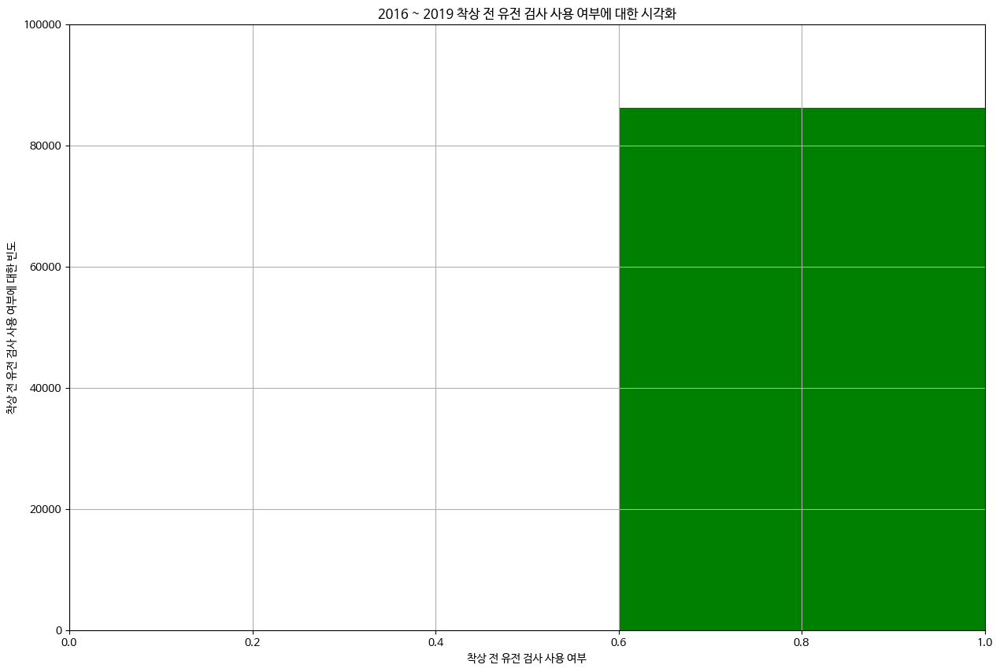

In [ ]:
# 착상 전 유전 검사 사용 여부에 대한 단일 시각화
pgd_gene = train.groupby(['착상 전 유전 검사 사용 여부'])['착상 전 유전 검사 사용 여부'].count()
pgd_gene = pgd_gene.to_frame(name='count')
plt.figure(figsize=(15, 10))
plt.bar(pgd_gene.index, pgd_gene['count'], color='g')
plt.ylim(0, 100000)
plt.xlim(0, 1)
plt.xlabel('착상 전 유전 검사 사용 여부')
plt.ylabel('착상 전 유전 검사 사용 여부에 대한 빈도')
plt.title('2016 ~ 2019 착상 전 유전 검사 사용 여부에 대한 시각화')
plt.grid()
plt.show()

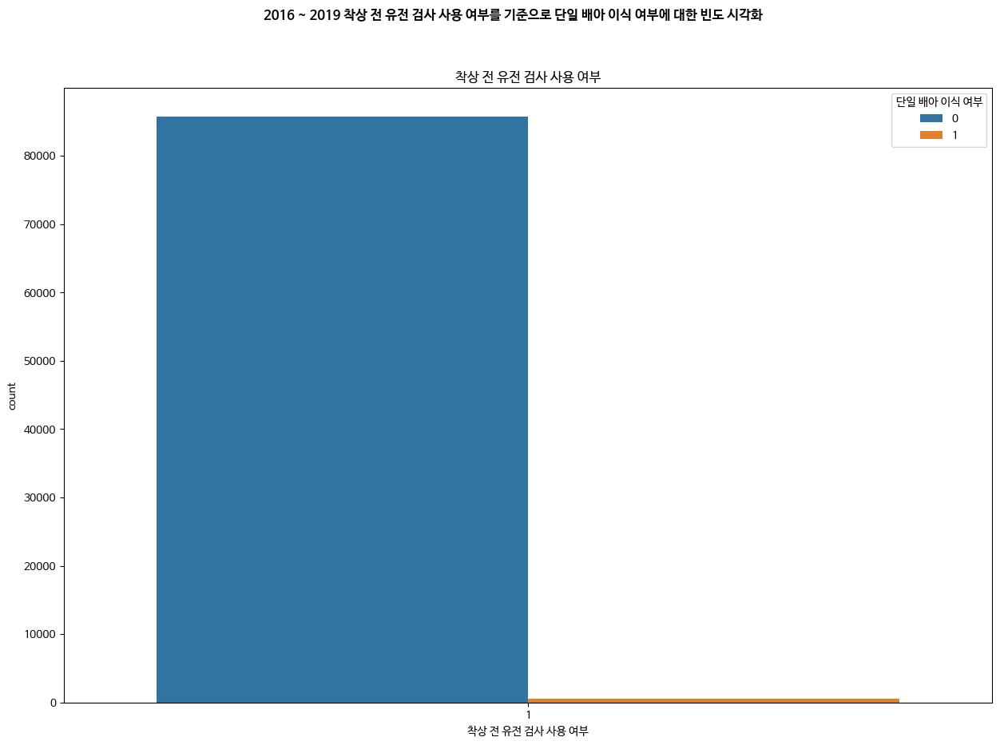

In [ ]:
# 착상 전 유전 검사 사용 여부에 대한 단일 배아 이식 여부에 대한 그룹화
pgd_embryo_group = train.groupby(['착상 전 유전 검사 사용 여부', '단일 배아 이식 여부'])['단일 배아 이식 여부'].count()
pgd_embryo_group = pgd_embryo_group.to_frame(name='count')
pgd_embryo_group = pgd_embryo_group.reset_index()

fig = plt.figure(figsize=(15, 10))
area1 = fig.add_subplot(1, 1, 1)
ax1 = sns.barplot(data=pgd_embryo_group, x='착상 전 유전 검사 사용 여부', y='count', hue='단일 배아 이식 여부', ax=area1)
fig.suptitle('2016 ~ 2019 착상 전 유전 검사 사용 여부를 기준으로 단일 배아 이식 여부에 대한 빈도 시각화', fontweight='bold')
area1.set_title('착상 전 유전 검사 사용 여부')
plt.show()

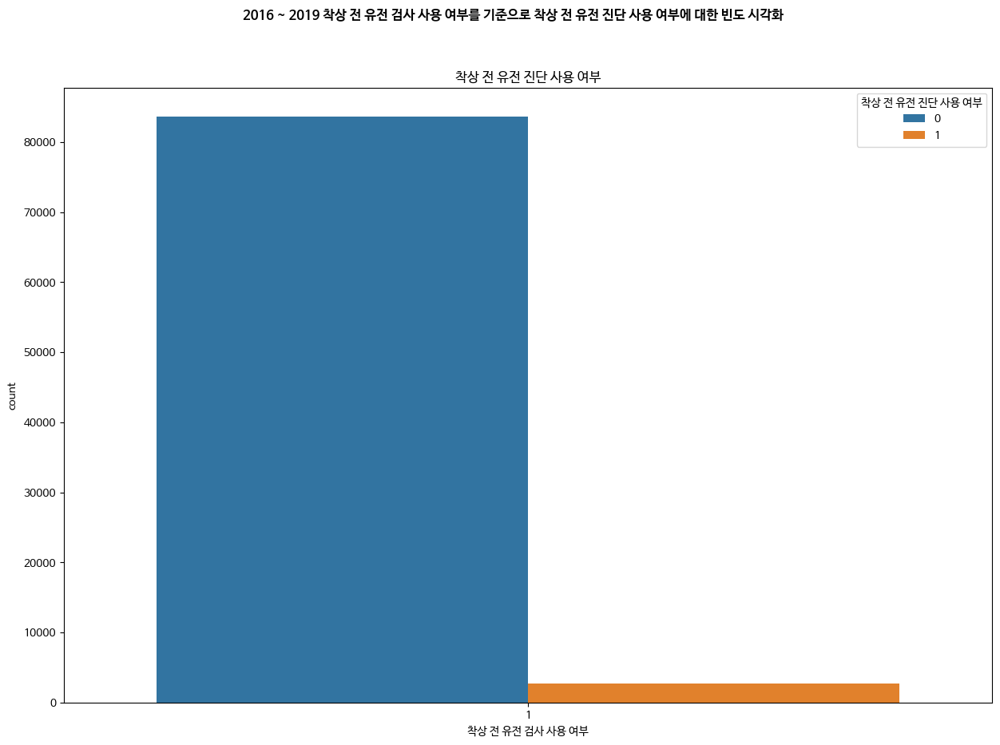

In [ ]:
# 착상 전 유전 검사 사용 여부에 대한 착상 전 유전 진단 사용 여부에 대한 그룹화
pgd_embryo_group = train.groupby(['착상 전 유전 검사 사용 여부', '착상 전 유전 진단 사용 여부'])['착상 전 유전 진단 사용 여부'].count()
pgd_embryo_group = pgd_embryo_group.to_frame(name='count')
pgd_embryo_group = pgd_embryo_group.reset_index()

fig = plt.figure(figsize=(15, 10))
area1 = fig.add_subplot(1, 1, 1)
ax1 = sns.barplot(data=pgd_embryo_group, x='착상 전 유전 검사 사용 여부', y='count', hue='착상 전 유전 진단 사용 여부', ax=area1)
fig.suptitle('2016 ~ 2019 착상 전 유전 검사 사용 여부를 기준으로 착상 전 유전 진단 사용 여부에 대한 빈도 시각화', fontweight='bold')
area1.set_title('착상 전 유전 진단 사용 여부')
plt.show()

6-3 착상 전 유전 진단 사용 여부

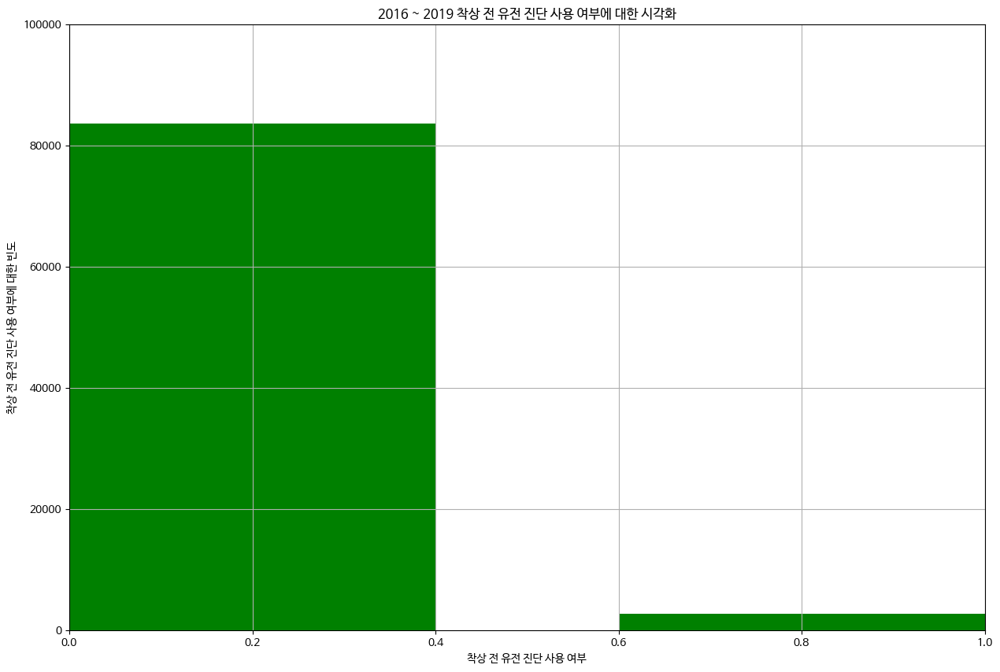

In [ ]:
# 착상 전 유전 진단 사용 여부에 대한 단일 시각화
pgd_gene_diagonsis = train.groupby(['착상 전 유전 진단 사용 여부'])['착상 전 유전 진단 사용 여부'].count()
pgd_gene_diagonsis = pgd_gene_diagonsis.to_frame(name='count')
plt.figure(figsize=(15, 10))
plt.bar(pgd_gene_diagonsis.index, pgd_gene_diagonsis['count'], color='g')
plt.ylim(0, 100000)
plt.xlim(0, 1)
plt.xlabel('착상 전 유전 진단 사용 여부')
plt.ylabel('착상 전 유전 진단 사용 여부에 대한 빈도')
plt.title('2016 ~ 2019 착상 전 유전 진단 사용 여부에 대한 시각화')
plt.grid()
plt.show()

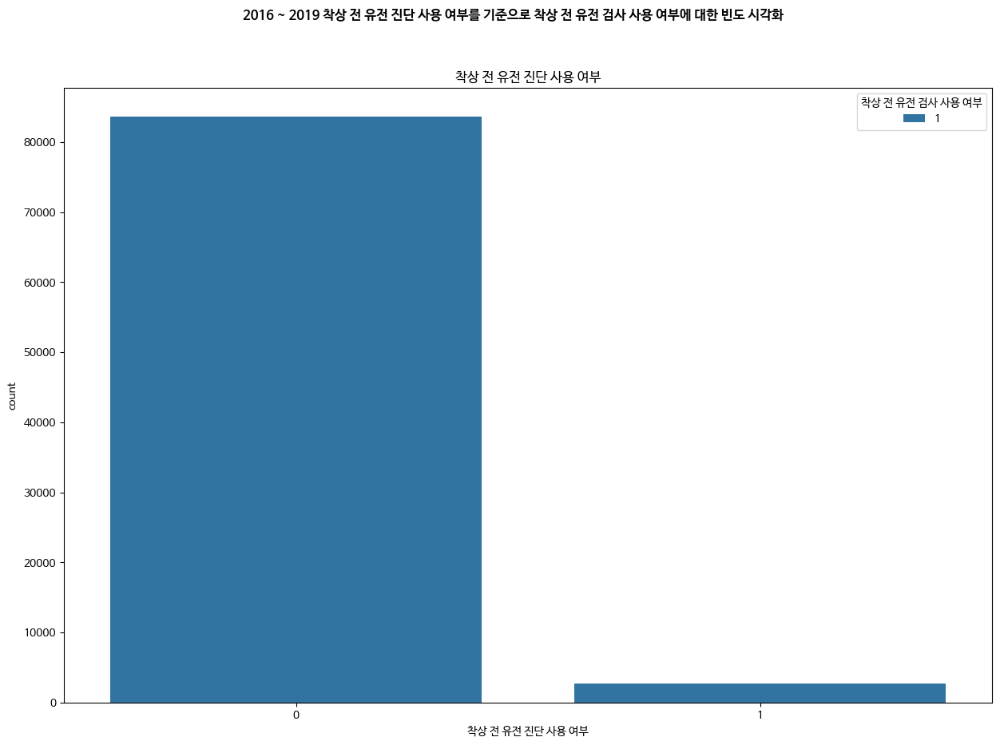

In [ ]:
# 착상 전 유전 진단 사용 여부에 대한 착상 전 유전 진단 사용 여부에 대한 그룹화
pgd_embryo_group = train.groupby(['착상 전 유전 진단 사용 여부', '착상 전 유전 검사 사용 여부'])['착상 전 유전 진단 사용 여부'].count()
pgd_embryo_group = pgd_embryo_group.to_frame(name='count')
pgd_embryo_group = pgd_embryo_group.reset_index()

fig = plt.figure(figsize=(15, 10))
area1 = fig.add_subplot(1, 1, 1)
ax1 = sns.barplot(data=pgd_embryo_group, x='착상 전 유전 진단 사용 여부', y='count', hue='착상 전 유전 검사 사용 여부', ax=area1)
fig.suptitle('2016 ~ 2019 착상 전 유전 진단 사용 여부를 기준으로 착상 전 유전 검사 사용 여부에 대한 빈도 시각화', fontweight='bold')
area1.set_title('착상 전 유전 진단 사용 여부')
plt.show()

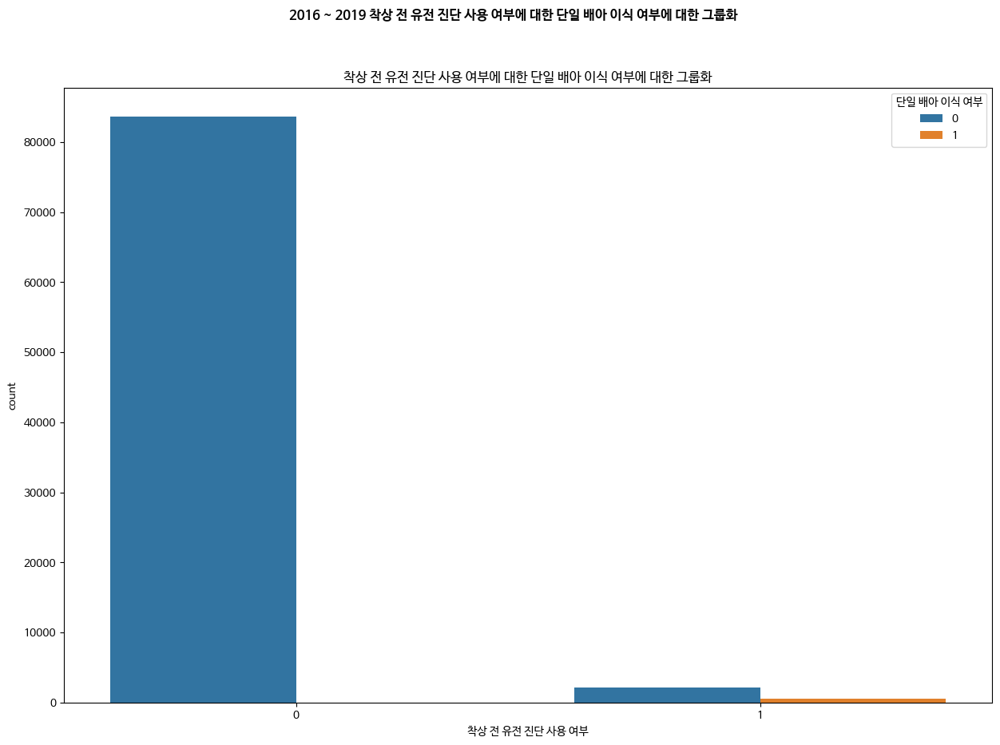

In [ ]:
# 착상 전 유전 진단 사용 여부에 대한 단일 배아 이식 여부에 대한 그룹화
genesis_diagonsis_group = train.groupby(['착상 전 유전 진단 사용 여부', '단일 배아 이식 여부'])['단일 배아 이식 여부'].count()
genesis_diagonsis_group = genesis_diagonsis_group.to_frame(name='count')
genesis_diagonsis_group = genesis_diagonsis_group.reset_index()

fig = plt.figure(figsize=(15, 10))
area1 = fig.add_subplot(1, 1, 1)
ax1 = sns.barplot(data=genesis_diagonsis_group, x='착상 전 유전 진단 사용 여부', y='count', hue='단일 배아 이식 여부', ax=area1)
fig.suptitle('2016 ~ 2019 착상 전 유전 진단 사용 여부에 대한 단일 배아 이식 여부에 대한 그룹화', fontweight='bold')
area1.set_title('착상 전 유전 진단 사용 여부에 대한 단일 배아 이식 여부에 대한 그룹화')
plt.show()

10. 남성 주 불임 원인과 남성 부 불임 원인

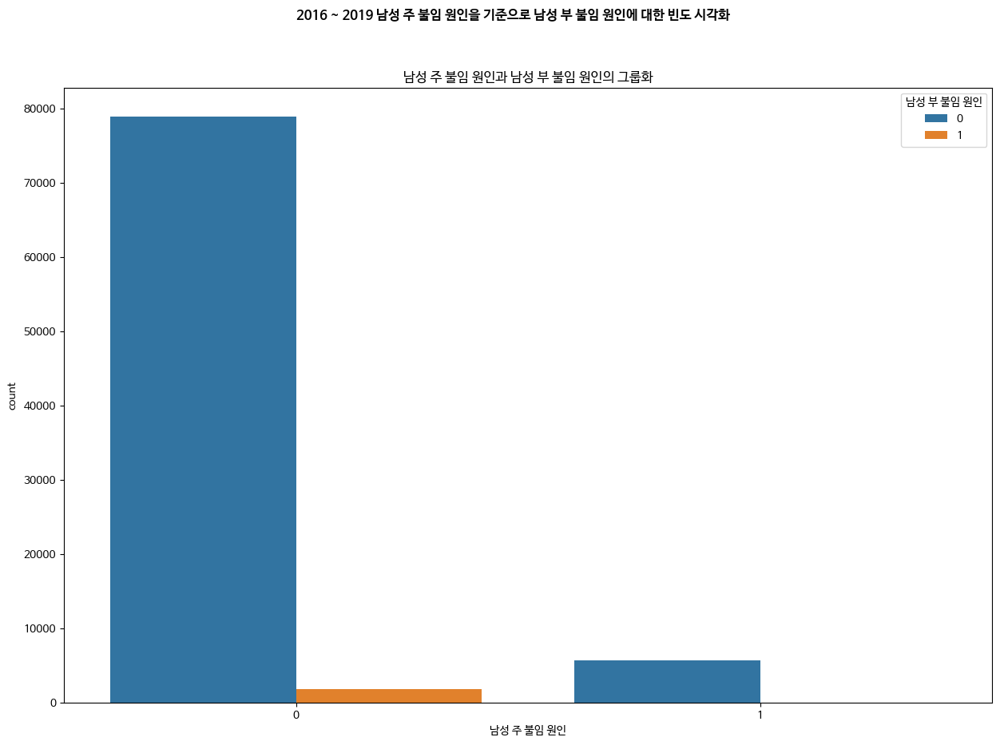

In [ ]:
# 남성 주 불임 원인에 대한 남성 부 불임 원인에 대한 그룹화
man_major_secondary_group = train.groupby(['남성 주 불임 원인', '남성 부 불임 원인'])['남성 부 불임 원인'].count()
man_major_secondary_group = man_major_secondary_group.to_frame(name='count')
man_major_secondary_group = man_major_secondary_group.reset_index()

fig = plt.figure(figsize=(15, 10))
area1 = fig.add_subplot(1, 1, 1)
ax1 = sns.barplot(data=man_major_secondary_group, x='남성 주 불임 원인', y='count', hue='남성 부 불임 원인', ax=area1)
fig.suptitle('2016 ~ 2019 남성 주 불임 원인을 기준으로 남성 부 불임 원인에 대한 빈도 시각화', fontweight='bold')
area1.set_title('남성 주 불임 원인과 남성 부 불임 원인의 그룹화')
plt.show()

11. 여성 주 불임 원인과 여성 부 불임 원인

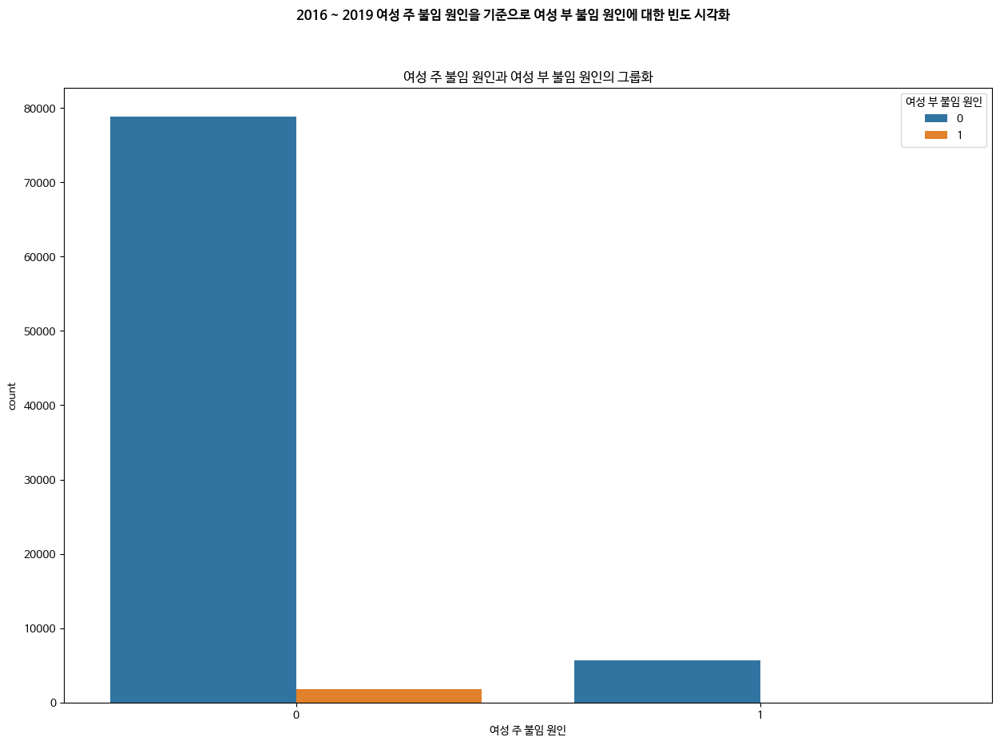

In [ ]:
# 여성 주 불임 원인에 대한 여성 부 불임 원인에 대한 그룹화
woman_major_secondary_group = train.groupby(['여성 주 불임 원인', '여성 부 불임 원인'])['여성 부 불임 원인'].count()
woman_major_secondary_group = woman_major_secondary_group.to_frame(name='count')
woman_major_secondary_group = woman_major_secondary_group.reset_index()

fig = plt.figure(figsize=(15, 10))
area1 = fig.add_subplot(1, 1, 1)
ax1 = sns.barplot(data=woman_major_secondary_group, x='여성 주 불임 원인', y='count', hue='여성 부 불임 원인', ax=area1)
fig.suptitle('2016 ~ 2019 여성 주 불임 원인을 기준으로 여성 부 불임 원인에 대한 빈도 시각화', fontweight='bold')
area1.set_title('여성 주 불임 원인과 여성 부 불임 원인의 그룹화')
plt.show()

12. 부부 주 불임 원인과 부부 부 불임 원인

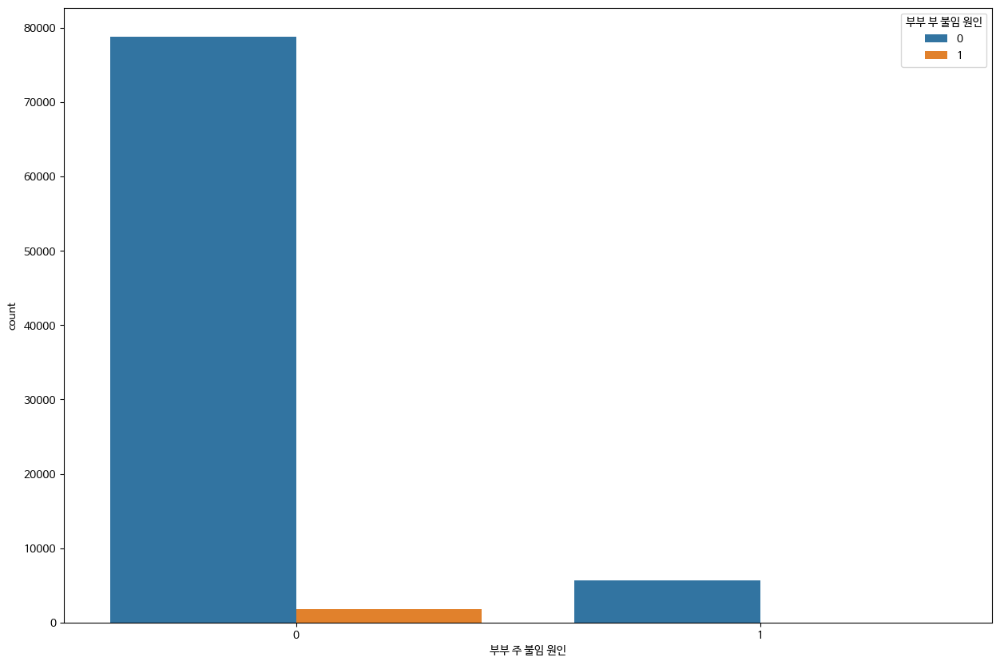

In [ ]:
# 부부 주 불임 원인에 대한 부부 부 불임 원인에 대한 그룹화
parent_major_secondary_group = train.groupby(['부부 주 불임 원인', '부부 부 불임 원인'])['부부 부 불임 원인'].count()
parent_major_secondary_group = parent_major_secondary_group.to_frame(name='count')
parent_major_secondary_group = parent_major_secondary_group.reset_index()

fig = plt.figure(figsize=(15, 10))
area1 = fig.add_subplot(1, 1, 1)
ax1 = sns.barplot(data=parent_major_secondary_group, x='부부 주 불임 원인', y='count', hue='부부 부 불임 원인', ax=area1)
parent_major_secondary_group = train.groupby(['부부 주 불임 원인', '부부 부 불임 원인'])['부부 부 불임 원인'].count()
parent_major_secondary_group = parent_major_secondary_group.to_frame(name='count')
parent_major_secondary_group = parent_major_secondary_group.reset_index()

13. 불명확 불임 원인

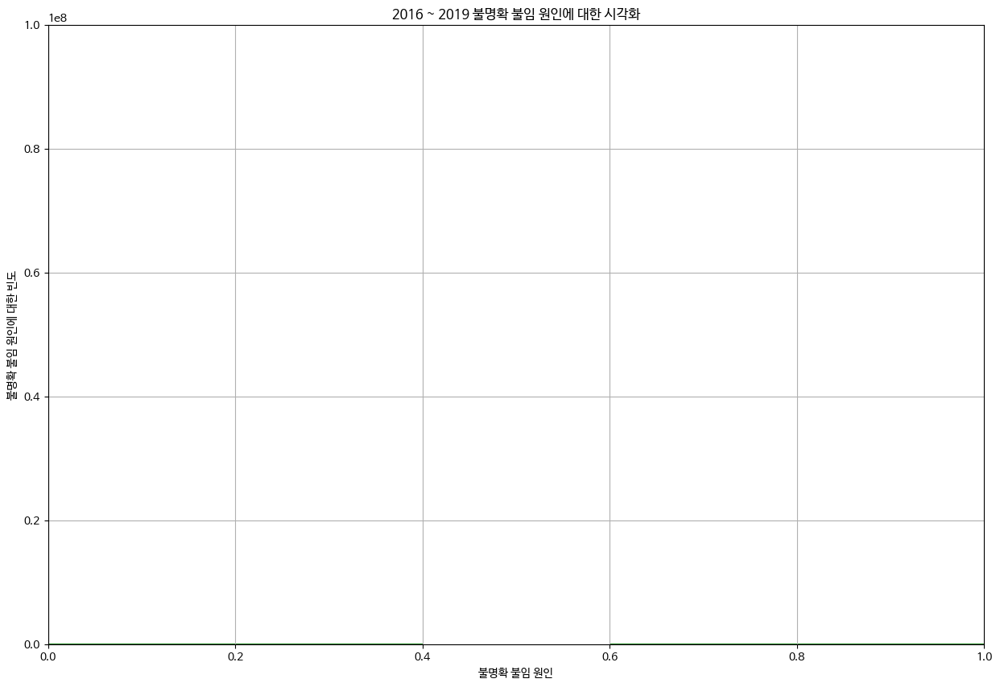

In [ ]:
# 불명확 불임 원인에 대한 단일 시각화
unsure_group = train.groupby(['불명확 불임 원인'])['불명확 불임 원인'].count()
unsure_group = unsure_group.to_frame(name='count')
plt.figure(figsize=(15, 10))
plt.bar(unsure_group.index, unsure_group['count'], color='g')
plt.ylim(0, 100000000)
plt.xlim(0, 1)
plt.xlabel('불명확 불임 원인')
plt.ylabel('불명확 불임 원인에 대한 빈도')
plt.title('2016 ~ 2019 불명확 불임 원인에 대한 시각화')
plt.grid()
plt.show()

14. 불임 원인 - 난관 질환

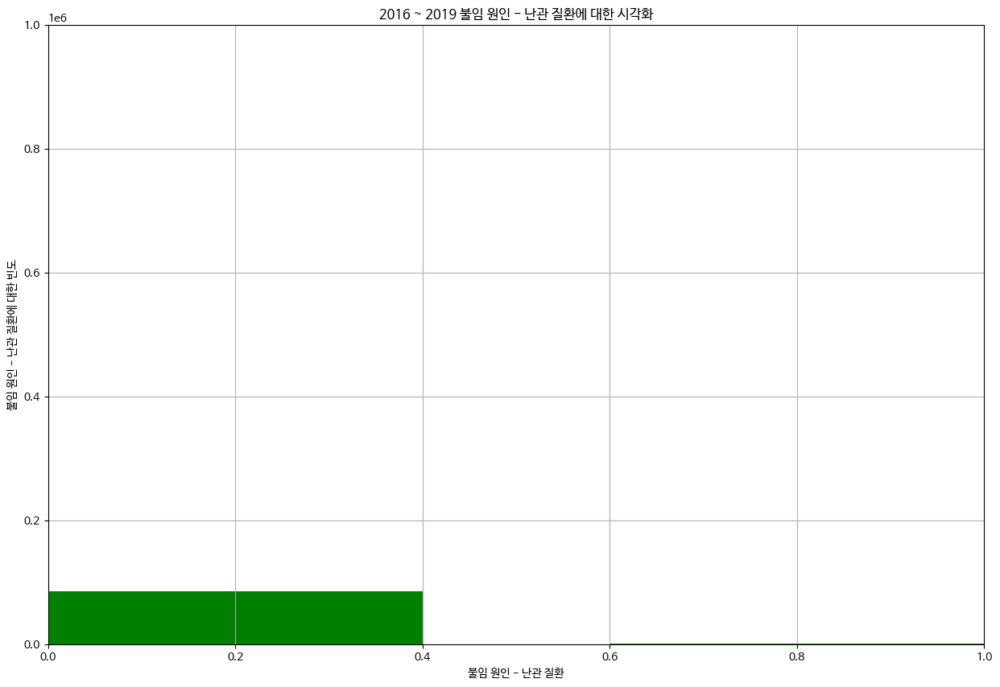

In [ ]:
# 불임 원인 - 난관 질환에 대한 단일 시각화
ivf_cause = train.groupby(['불임 원인 - 난관 질환'])['불임 원인 - 난관 질환'].count()
ivf_cause = ivf_cause.to_frame(name='count')
plt.figure(figsize=(15, 10))
plt.bar(ivf_cause.index, ivf_cause['count'], color='g')
plt.ylim(0, 1000000)
plt.xlim(0, 1)
plt.xlabel('불임 원인 - 난관 질환')
plt.ylabel('불임 원인 - 난관 질환에 대한 빈도')
plt.title('2016 ~ 2019 불임 원인 - 난관 질환에 대한 시각화')
plt.grid()
plt.show()

15. 불임 원인 - 남성 요인

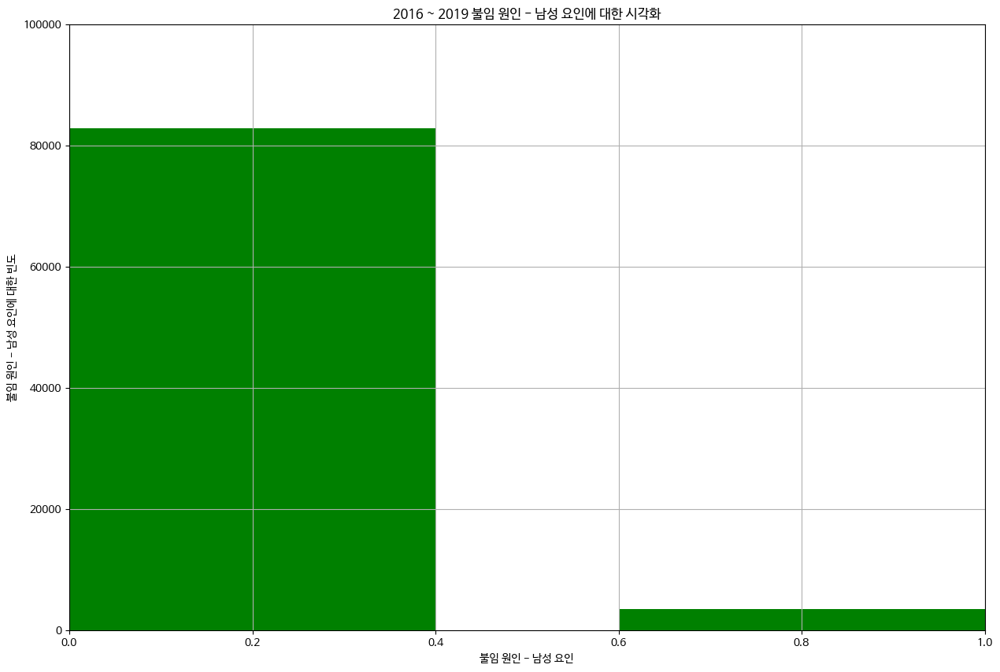

In [ ]:
# 불임 원인 - 남성 요인에 대한 단일 시각화
man_factor_cause = train.groupby(['불임 원인 - 남성 요인'])['불임 원인 - 남성 요인'].count()
man_factor_cause = man_factor_cause.to_frame(name='count')
plt.figure(figsize=(15, 10))
plt.bar(man_factor_cause.index, man_factor_cause['count'], color='g')
plt.ylim(0, 100000)
plt.xlim(0, 1)
plt.xlabel('불임 원인 - 남성 요인')
plt.ylabel('불임 원인 - 남성 요인에 대한 빈도')
plt.title('2016 ~ 2019 불임 원인 - 남성 요인에 대한 시각화')
plt.grid()
plt.show()

16. 불임 원인 - 배란 장애

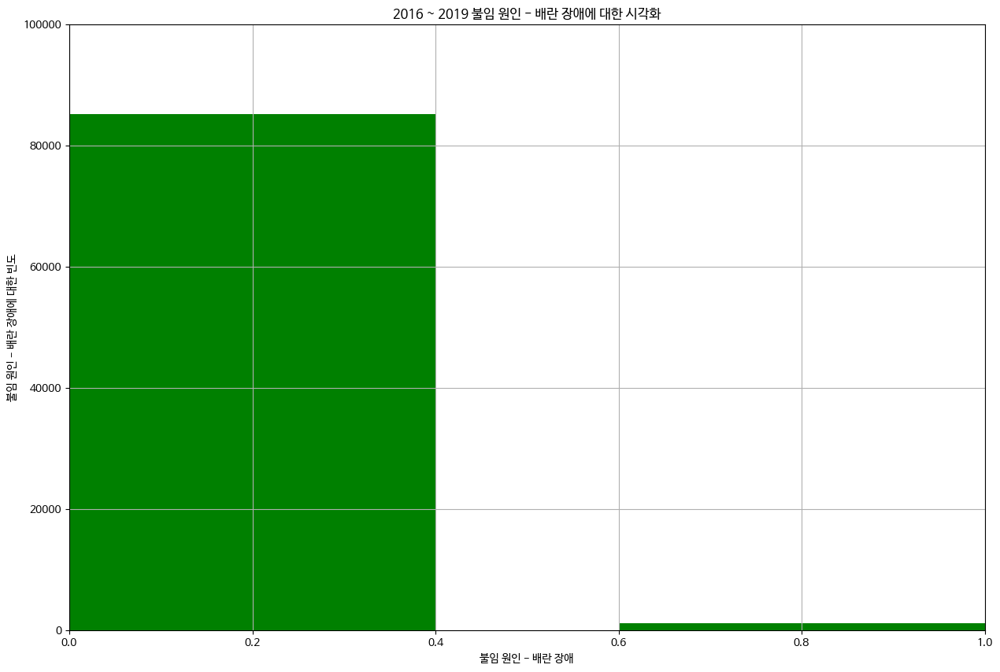

In [ ]:
# 불임 원인 - 배란 장애에 대한 단일 시각화
ovulation_obstacle_cause = train.groupby(['불임 원인 - 배란 장애'])['불임 원인 - 배란 장애'].count()
ovulation_obstacle_cause = ovulation_obstacle_cause.to_frame(name='count')
plt.figure(figsize=(15, 10))
plt.bar(ovulation_obstacle_cause.index, ovulation_obstacle_cause['count'], color='g')
plt.ylim(0, 100000)
plt.xlim(0, 1)
plt.xlabel('불임 원인 - 배란 장애')
plt.ylabel('불임 원인 - 배란 장애에 대한 빈도')
plt.title('2016 ~ 2019 불임 원인 - 배란 장애에 대한 시각화')
plt.grid()
plt.show()

17. 불임 원인 - 여성 요인

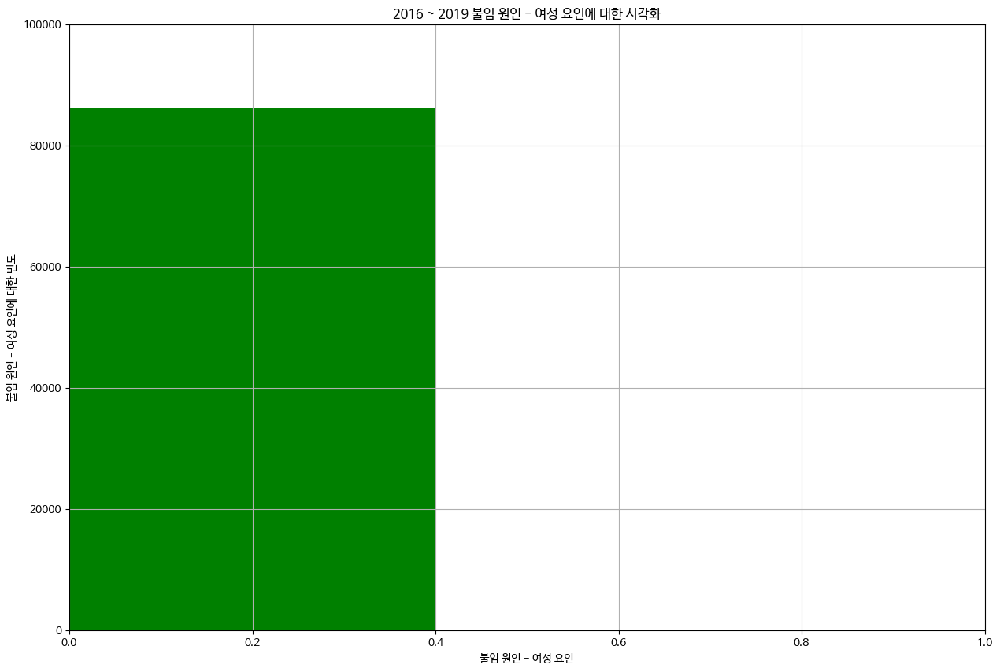

In [ ]:
# 불임 원인 - 여성 요인에 대한 단일 시각화
ovulation_obstacle_cause = train.groupby(['불임 원인 - 여성 요인'])['불임 원인 - 여성 요인'].count()
ovulation_obstacle_cause = ovulation_obstacle_cause.to_frame(name='count')
plt.figure(figsize=(15, 10))
plt.bar(ovulation_obstacle_cause.index, ovulation_obstacle_cause['count'], color='g')
plt.ylim(0, 100000)
plt.xlim(0, 1)
plt.xlabel('불임 원인 - 여성 요인')
plt.ylabel('불임 원인 - 여성 요인에 대한 빈도')
plt.title('2016 ~ 2019 불임 원인 - 여성 요인에 대한 시각화')
plt.grid()
plt.show()

18. 불임 원인 - 자궁경부 문제

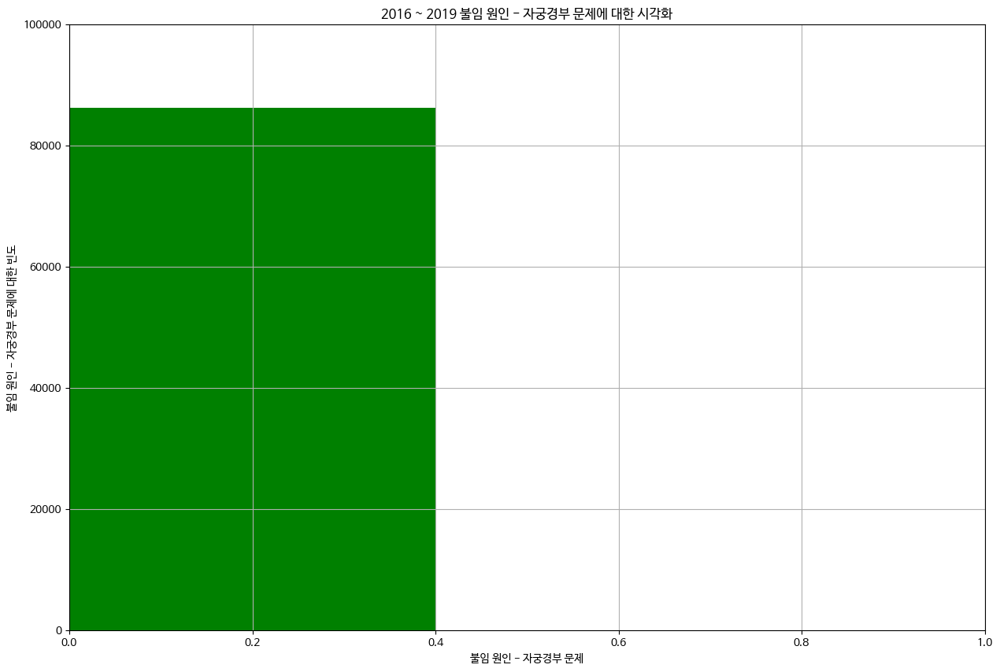

In [ ]:
# 불임 원인 - 자궁경부 문제에 대한 단일 시각화
ovulation_obstacle_cause = train.groupby(['불임 원인 - 자궁경부 문제'])['불임 원인 - 자궁경부 문제'].count()
ovulation_obstacle_cause = ovulation_obstacle_cause.to_frame(name='count')
plt.figure(figsize=(15, 10))
plt.bar(ovulation_obstacle_cause.index, ovulation_obstacle_cause['count'], color='g')
plt.ylim(0, 100000)
plt.xlim(0, 1)
plt.xlabel('불임 원인 - 자궁경부 문제')
plt.ylabel('불임 원인 - 자궁경부 문제에 대한 빈도')
plt.title('2016 ~ 2019 불임 원인 - 자궁경부 문제에 대한 시각화')
plt.grid()
plt.show()

19. 불임 원인 - 자궁내막증

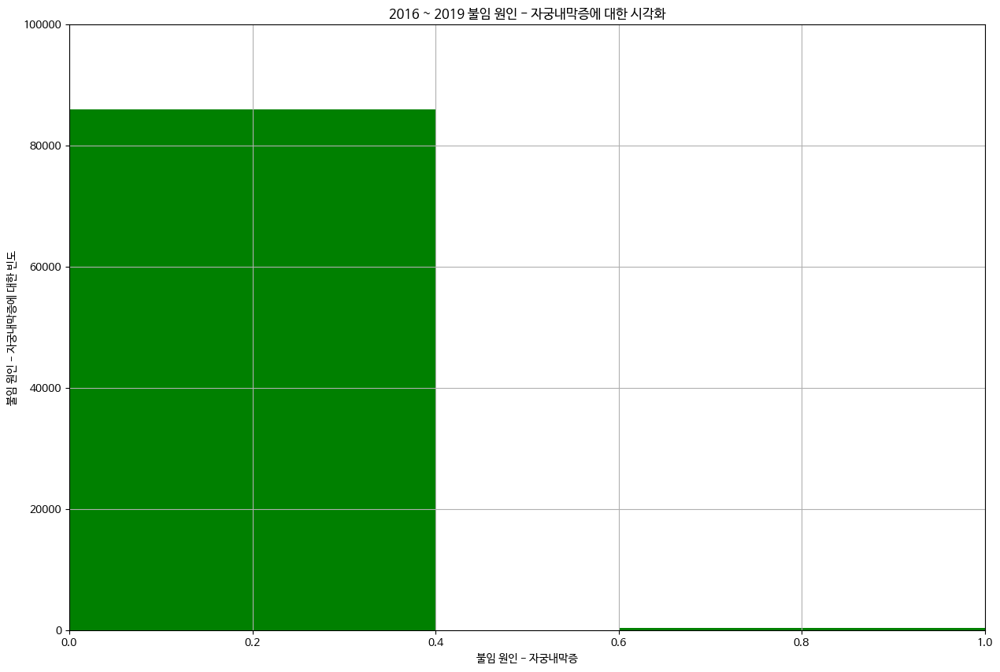

In [ ]:
# 불임 원인 - 자궁내막증에 대한 단일 시각화
ovulation_obstacle_cause = train.groupby(['불임 원인 - 자궁내막증'])['불임 원인 - 자궁내막증'].count()
ovulation_obstacle_cause = ovulation_obstacle_cause.to_frame(name='count')
plt.figure(figsize=(15, 10))
plt.bar(ovulation_obstacle_cause.index, ovulation_obstacle_cause['count'], color='g')
plt.ylim(0, 100000)
plt.xlim(0, 1)
plt.xlabel('불임 원인 - 자궁내막증')
plt.ylabel('불임 원인 - 자궁내막증에 대한 빈도')
plt.title('2016 ~ 2019 불임 원인 - 자궁내막증에 대한 시각화')
plt.grid()
plt.show()

20. 불임 원인 - 정자 농도

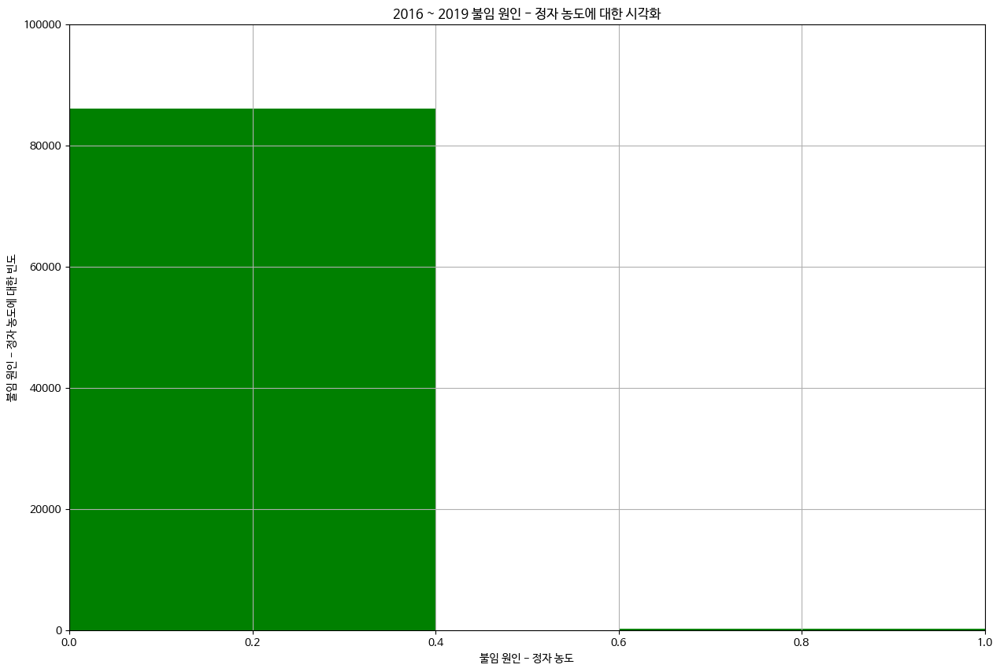

In [ ]:
# 불임 원인 - 정자 농도에 대한 단일 시각화
ovulation_obstacle_cause = train.groupby(['불임 원인 - 정자 농도'])['불임 원인 - 정자 농도'].count()
ovulation_obstacle_cause = ovulation_obstacle_cause.to_frame(name='count')
plt.figure(figsize=(15, 10))
plt.bar(ovulation_obstacle_cause.index, ovulation_obstacle_cause['count'], color='g')
plt.ylim(0, 100000)
plt.xlim(0, 1)
plt.xlabel('불임 원인 - 정자 농도')
plt.ylabel('불임 원인 - 정자 농도에 대한 빈도')
plt.title('2016 ~ 2019 불임 원인 - 정자 농도에 대한 시각화')
plt.grid()
plt.show()

21. 불임 원인 - 정자 면역학적 요인

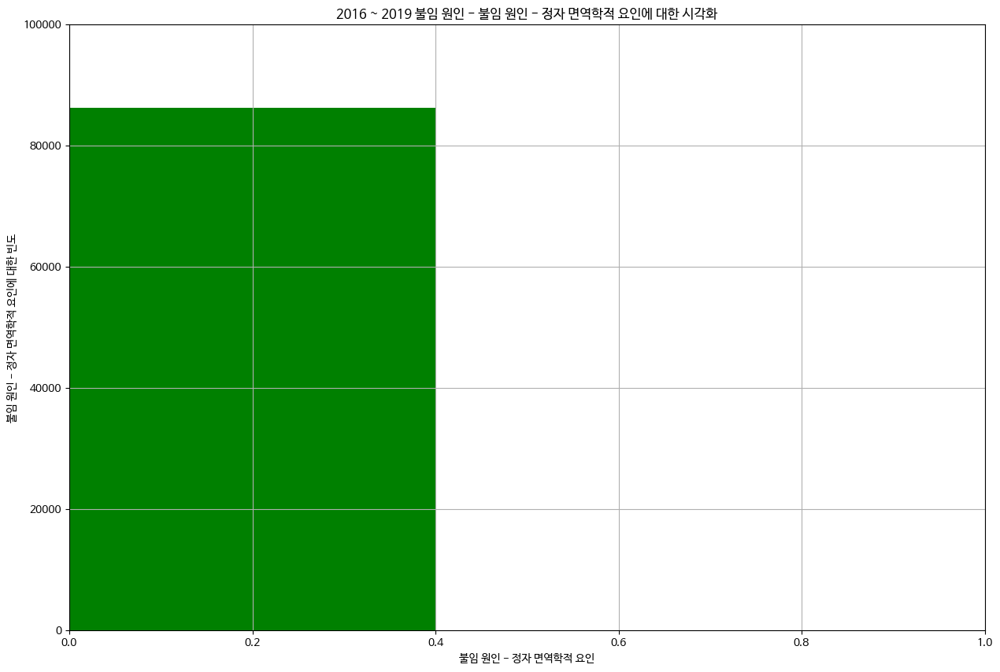

In [ ]:
# 불임 원인 - 정자 면역학적 요인에 대한 단일 시각화
ovulation_obstacle_cause = train.groupby(['불임 원인 - 정자 면역학적 요인'])['불임 원인 - 정자 면역학적 요인'].count()
ovulation_obstacle_cause = ovulation_obstacle_cause.to_frame(name='count')
plt.figure(figsize=(15, 10))
plt.bar(ovulation_obstacle_cause.index, ovulation_obstacle_cause['count'], color='g')
plt.ylim(0, 100000)
plt.xlim(0, 1)
plt.xlabel('불임 원인 - 정자 면역학적 요인')
plt.ylabel('불임 원인 - 정자 면역학적 요인에 대한 빈도')
plt.title('2016 ~ 2019 불임 원인 - 불임 원인 - 정자 면역학적 요인에 대한 시각화')
plt.grid()
plt.show()

22. 불임 원인 - 정자 운동성

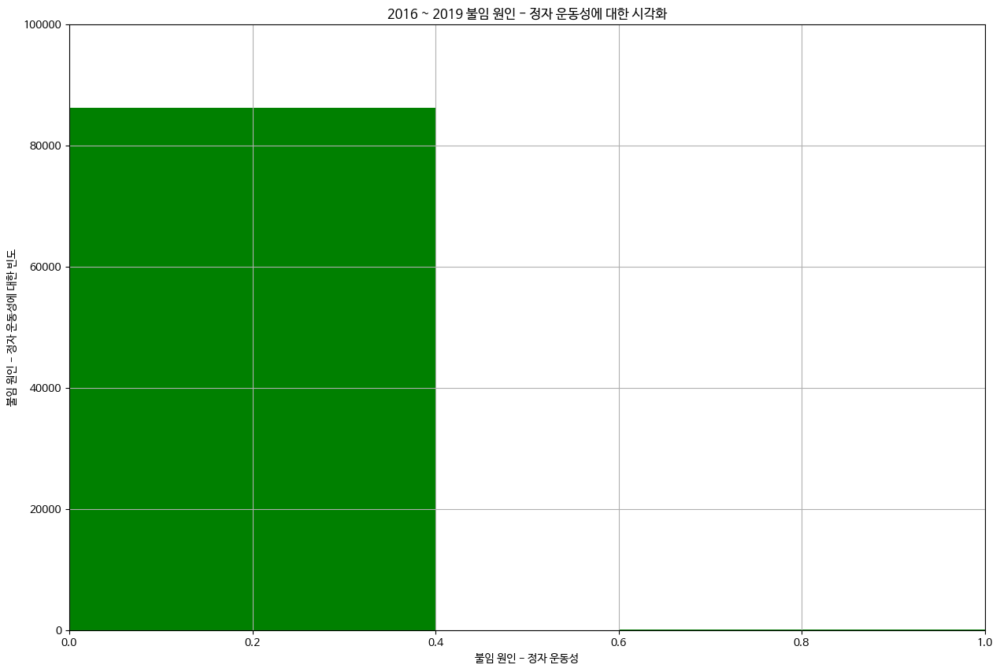

In [ ]:
# 불임 원인 - 정자 운동성에 대한 단일 시각화
ovulation_obstacle_cause = train.groupby(['불임 원인 - 정자 운동성'])['불임 원인 - 정자 운동성'].count()
ovulation_obstacle_cause = ovulation_obstacle_cause.to_frame(name='count')
plt.figure(figsize=(15, 10))
plt.bar(ovulation_obstacle_cause.index, ovulation_obstacle_cause['count'], color='g')
plt.ylim(0, 100000)
plt.xlim(0, 1)
plt.xlabel('불임 원인 - 정자 운동성')
plt.ylabel('불임 원인 - 정자 운동성에 대한 빈도')
plt.title('2016 ~ 2019 불임 원인 - 정자 운동성에 대한 시각화')
plt.grid()
plt.show()

23. 불임 원인 - 정자 형태

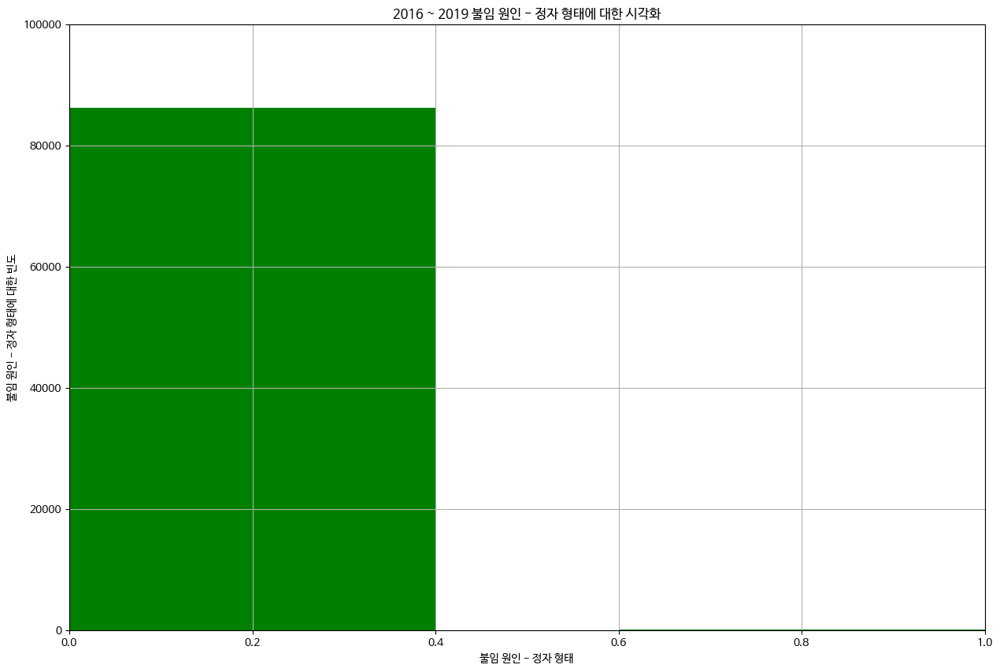

In [ ]:
# 불임 원인 - 정자 형태에 대한 단일 시각화
ovulation_obstacle_cause = train.groupby(['불임 원인 - 정자 형태'])['불임 원인 - 정자 형태'].count()
ovulation_obstacle_cause = ovulation_obstacle_cause.to_frame(name='count')
plt.figure(figsize=(15, 10))
plt.bar(ovulation_obstacle_cause.index, ovulation_obstacle_cause['count'], color='g')
plt.ylim(0, 100000)
plt.xlim(0, 1)
plt.xlabel('불임 원인 - 정자 형태')
plt.ylabel('불임 원인 - 정자 형태에 대한 빈도')
plt.title('2016 ~ 2019 불임 원인 - 정자 형태에 대한 시각화')
plt.grid()
plt.show()

24. 배아 생성 주요 이유

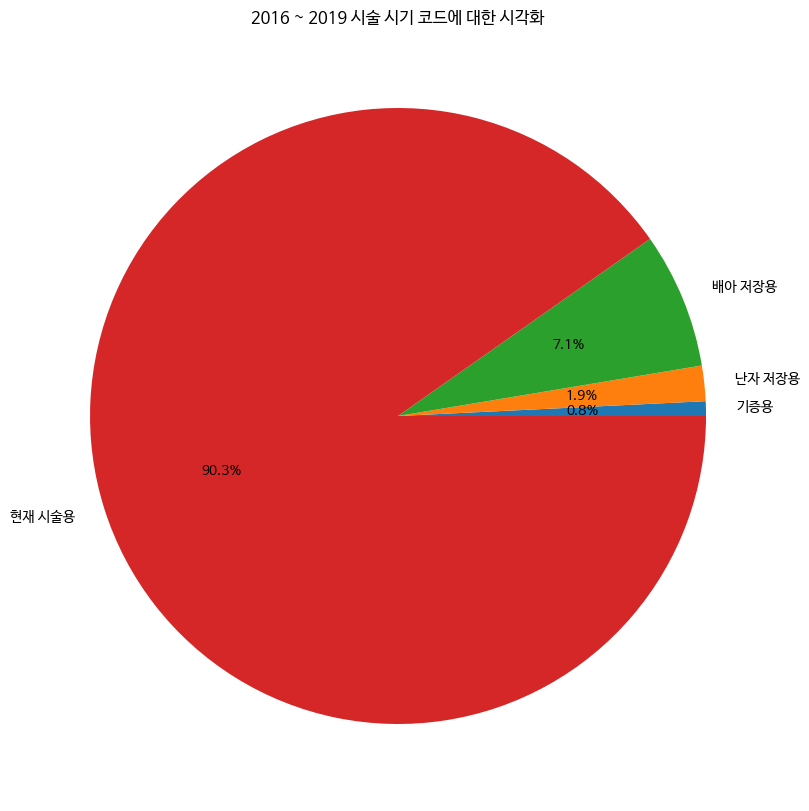

In [ ]:
# 배아 생성 주요 이유 단일 시각화
embryo_produce = train.groupby(['배아 생성 주요 이유'])['배아 생성 주요 이유'].count()
embryo_produce = embryo_produce.to_frame(name='count')
# 시술 시기 코드 단일 시각화
plt.figure(figsize=(15, 10))
plt.pie(embryo_produce['count'],labels=embryo_produce.index, autopct='%.1f%%')
plt.title('2016 ~ 2019 시술 시기 코드에 대한 시각화')
plt.grid()
plt.show()

25. 총 시술 횟수

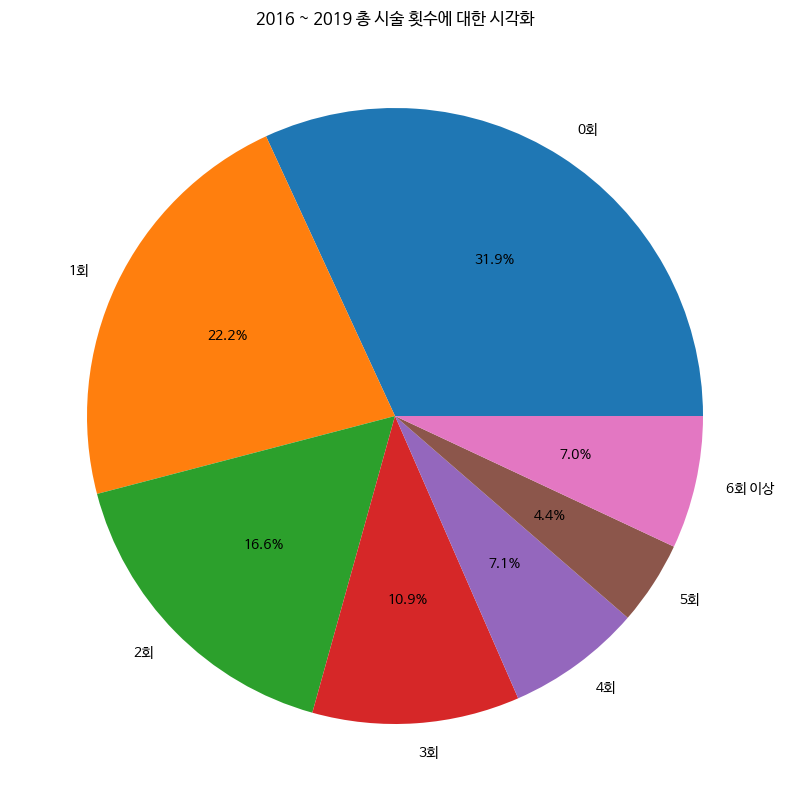

In [ ]:
# 총 시술 횟수 단일 시각화
total_curse = train.groupby(['총 시술 횟수'])['총 시술 횟수'].count()
total_curse = total_curse.to_frame(name='count')
# 총 시술 횟수 단일 시각화
plt.figure(figsize=(15, 10))
plt.pie(total_curse['count'],labels=total_curse.index, autopct='%.1f%%')
plt.title('2016 ~ 2019 총 시술 횟수에 대한 시각화')
plt.grid()
plt.show()

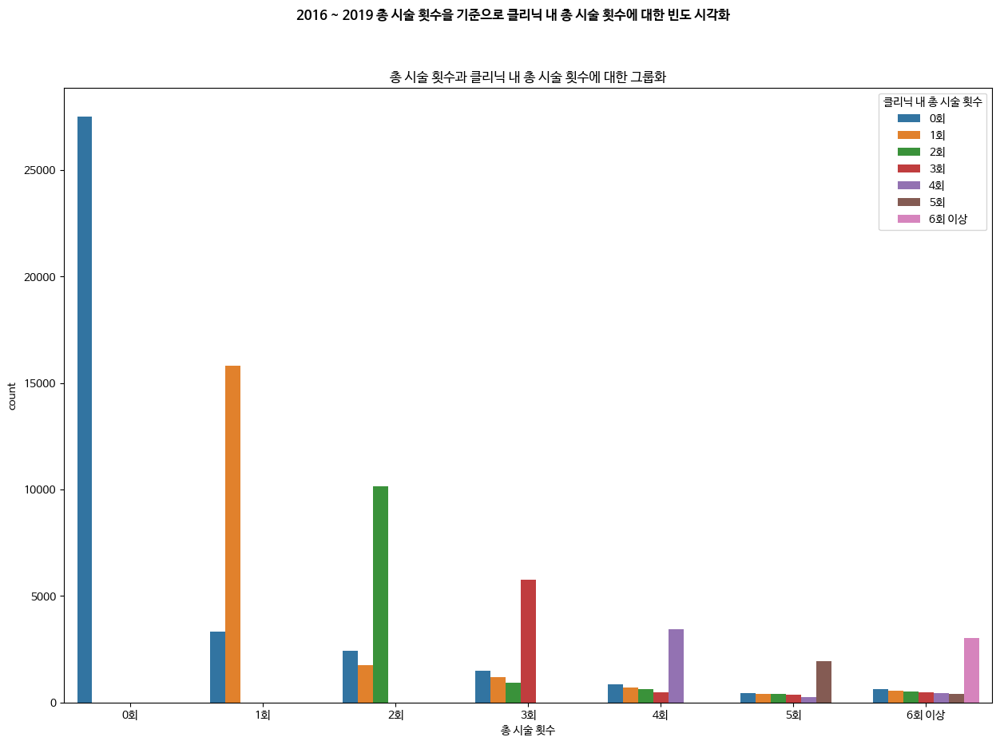

In [ ]:
# 총 시술 횟수에 대한 클리닉 내 총 시술 횟수에 대한 그룹화
total_clinic_group = train.groupby(['총 시술 횟수', '클리닉 내 총 시술 횟수'])['클리닉 내 총 시술 횟수'].count()
total_clinic_group = total_clinic_group.to_frame(name='count')
total_clinic_group = total_clinic_group.reset_index()

fig = plt.figure(figsize=(15, 10))
area1 = fig.add_subplot(1, 1, 1)
ax1 = sns.barplot(data=total_clinic_group, x='총 시술 횟수', y='count', hue='클리닉 내 총 시술 횟수', ax=area1)
fig.suptitle('2016 ~ 2019 총 시술 횟수을 기준으로 클리닉 내 총 시술 횟수에 대한 빈도 시각화', fontweight='bold')
area1.set_title('총 시술 횟수과 클리닉 내 총 시술 횟수에 대한 그룹화')
plt.show()

26. 클리닉 내 총 시술 횟수

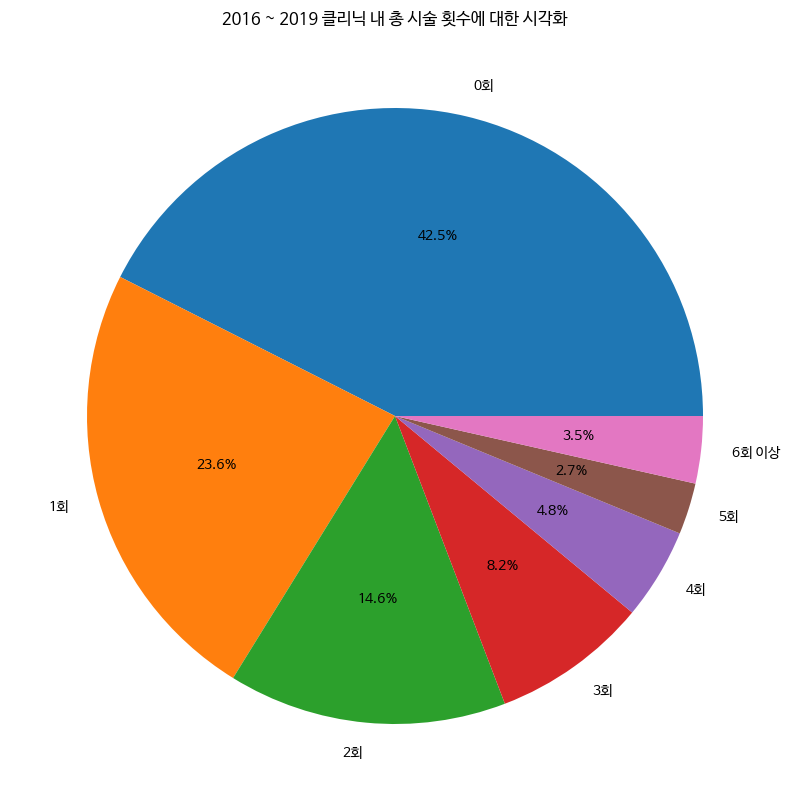

In [ ]:
# 클리닉 내 총 시술 횟수
ovulation_obstacle_cause = train.groupby(['클리닉 내 총 시술 횟수'])['클리닉 내 총 시술 횟수'].count()
ovulation_obstacle_cause = ovulation_obstacle_cause.to_frame(name='count')
# 클리닉 내 총 시술 횟수 단일 시각화
plt.figure(figsize=(15, 10))
plt.pie(ovulation_obstacle_cause['count'],labels=ovulation_obstacle_cause.index, autopct='%.1f%%')
plt.title('2016 ~ 2019 클리닉 내 총 시술 횟수에 대한 시각화')
plt.grid()
plt.show()

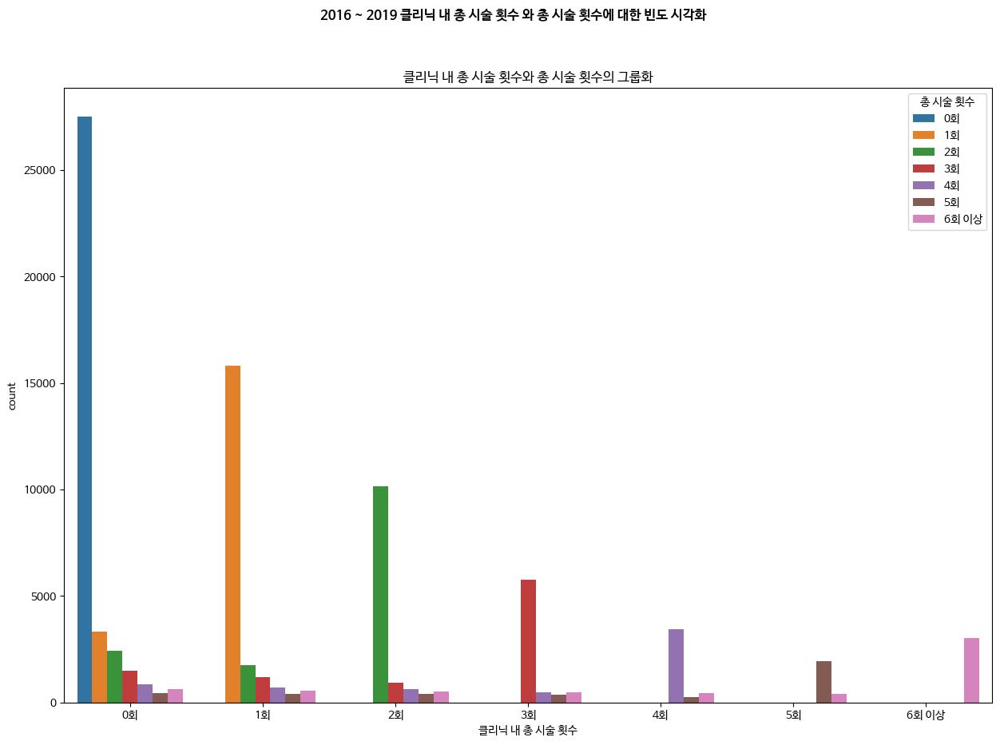

In [ ]:
# 클리닉 내 총 시술 횟수 와 총 시술 횟수에 대한 그룹화
woman_major_secondary_group = train.groupby(['클리닉 내 총 시술 횟수', '총 시술 횟수'])['총 시술 횟수'].count()
woman_major_secondary_group = woman_major_secondary_group.to_frame(name='count')
woman_major_secondary_group = woman_major_secondary_group.reset_index()

fig = plt.figure(figsize=(15, 10))
area1 = fig.add_subplot(1, 1, 1)
ax1 = sns.barplot(data=woman_major_secondary_group, x='클리닉 내 총 시술 횟수', y='count', hue='총 시술 횟수', ax=area1)
fig.suptitle('2016 ~ 2019 클리닉 내 총 시술 횟수 와 총 시술 횟수에 대한 빈도 시각화', fontweight='bold')
area1.set_title('클리닉 내 총 시술 횟수와 총 시술 횟수의 그룹화')
plt.show()

27. IVF 시술 횟수

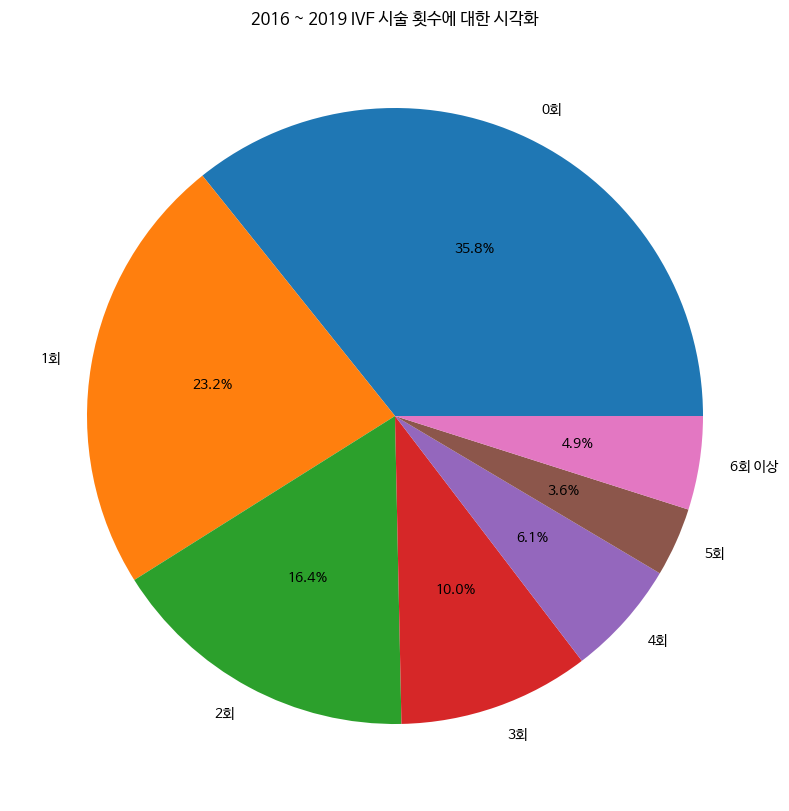

In [ ]:
# IVF 시술 횟수
ivf_curse = train.groupby(['IVF 시술 횟수'])['IVF 시술 횟수'].count()
ivf_curse = ivf_curse.to_frame(name='count')
# IVF 시술 횟수 단일 시각화
plt.figure(figsize=(15, 10))
plt.pie(ivf_curse['count'],labels=ivf_curse.index, autopct='%.1f%%')
plt.title('2016 ~ 2019 IVF 시술 횟수에 대한 시각화')
plt.grid()
plt.show()

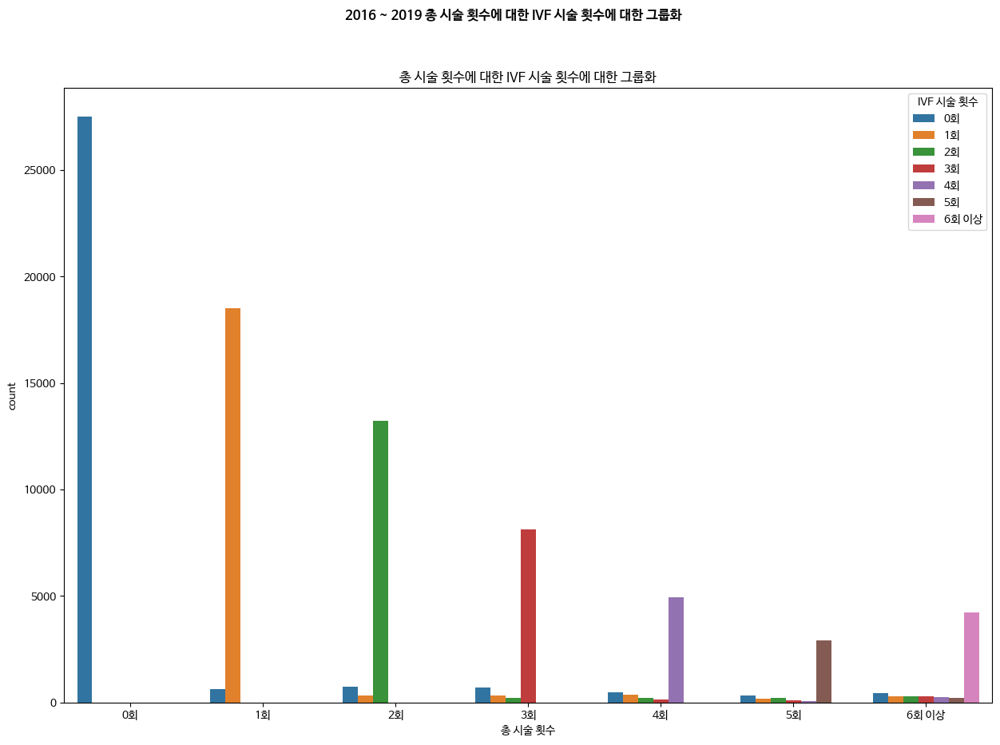

In [ ]:
# 총 시술 횟수에 대한 IVF 시술 횟수에 대한 그룹화
total_ivf_group = train.groupby(['총 시술 횟수', 'IVF 시술 횟수'])['IVF 시술 횟수'].count()
total_ivf_group = total_ivf_group.to_frame(name='count')
total_ivf_group = total_ivf_group.reset_index()

fig = plt.figure(figsize=(15, 10))
area1 = fig.add_subplot(1, 1, 1)
ax1 = sns.barplot(data=total_ivf_group, x='총 시술 횟수', y='count', hue='IVF 시술 횟수', ax=area1)
fig.suptitle('2016 ~ 2019 총 시술 횟수에 대한 IVF 시술 횟수에 대한 그룹화', fontweight='bold')
area1.set_title('총 시술 횟수에 대한 IVF 시술 횟수에 대한 그룹화')
plt.show()

28. DI 시술 횟수

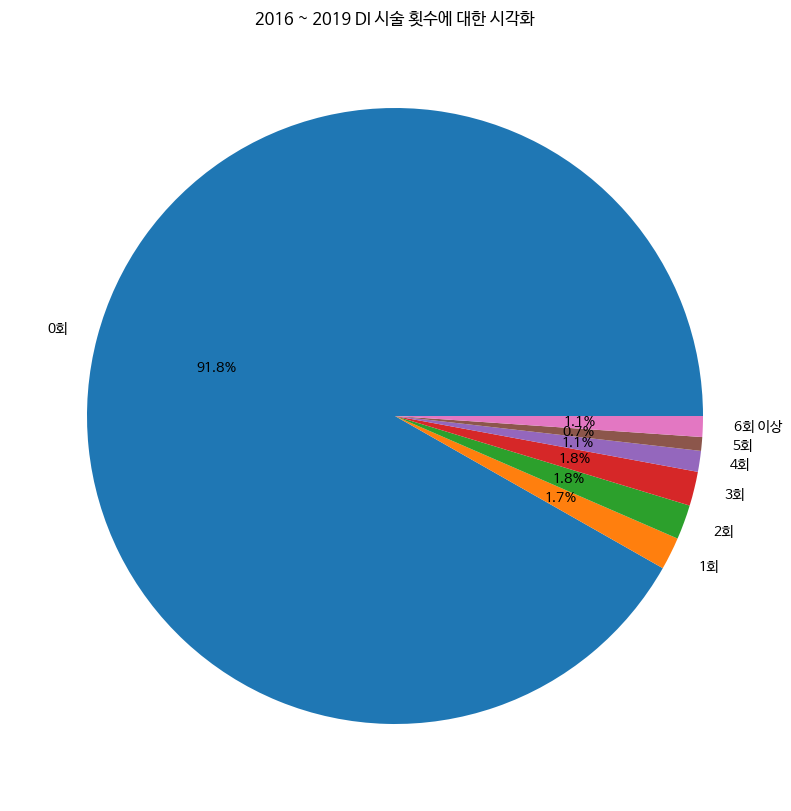

In [ ]:
# DI 시술 횟수
di_curse = train.groupby(['DI 시술 횟수'])['DI 시술 횟수'].count()
di_curse = di_curse.to_frame(name='count')
# DI 시술 횟수 단일 시각화
plt.figure(figsize=(15, 10))
plt.pie(di_curse['count'],labels=di_curse.index, autopct='%.1f%%')
plt.title('2016 ~ 2019 DI 시술 횟수에 대한 시각화')
plt.grid()
plt.show()

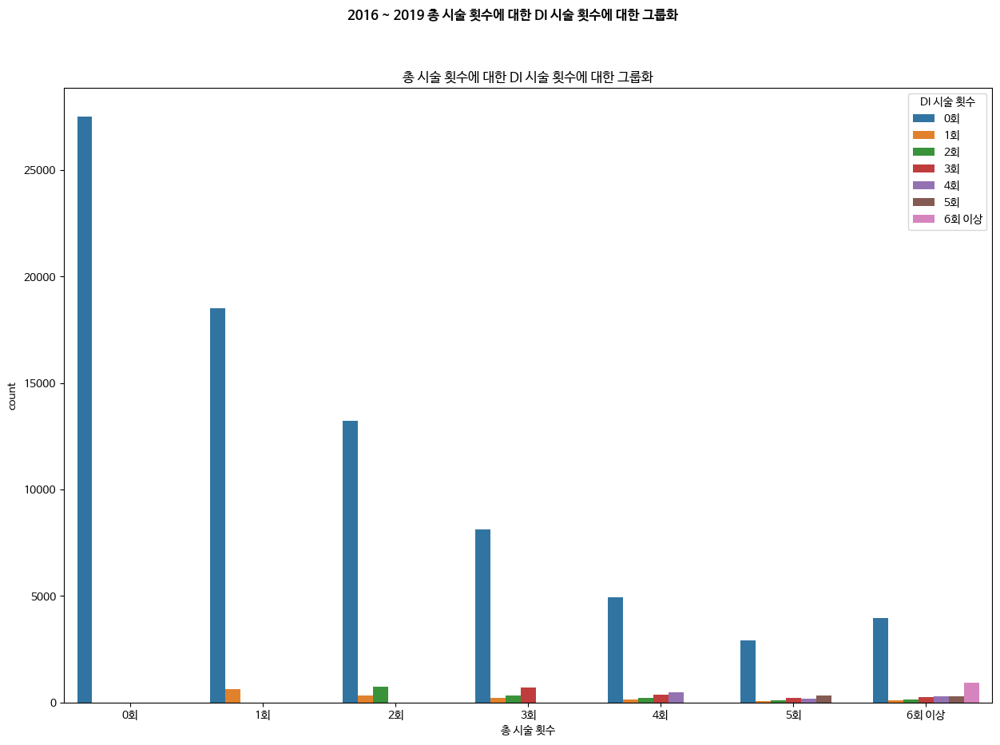

In [ ]:
# 총 시술 횟수에 대한 DI 시술 횟수에 대한 그룹화
total_di_group = train.groupby(['총 시술 횟수', 'DI 시술 횟수'])['DI 시술 횟수'].count()
total_di_group = total_di_group.to_frame(name='count')
total_di_group = total_di_group.reset_index()

fig = plt.figure(figsize=(15, 10))
area1 = fig.add_subplot(1, 1, 1)
ax1 = sns.barplot(data=total_di_group, x='총 시술 횟수', y='count', hue='DI 시술 횟수', ax=area1)
fig.suptitle('2016 ~ 2019 총 시술 횟수에 대한 DI 시술 횟수에 대한 그룹화', fontweight='bold')
area1.set_title('총 시술 횟수에 대한 DI 시술 횟수에 대한 그룹화')
plt.show()

29. 총 임신 횟수

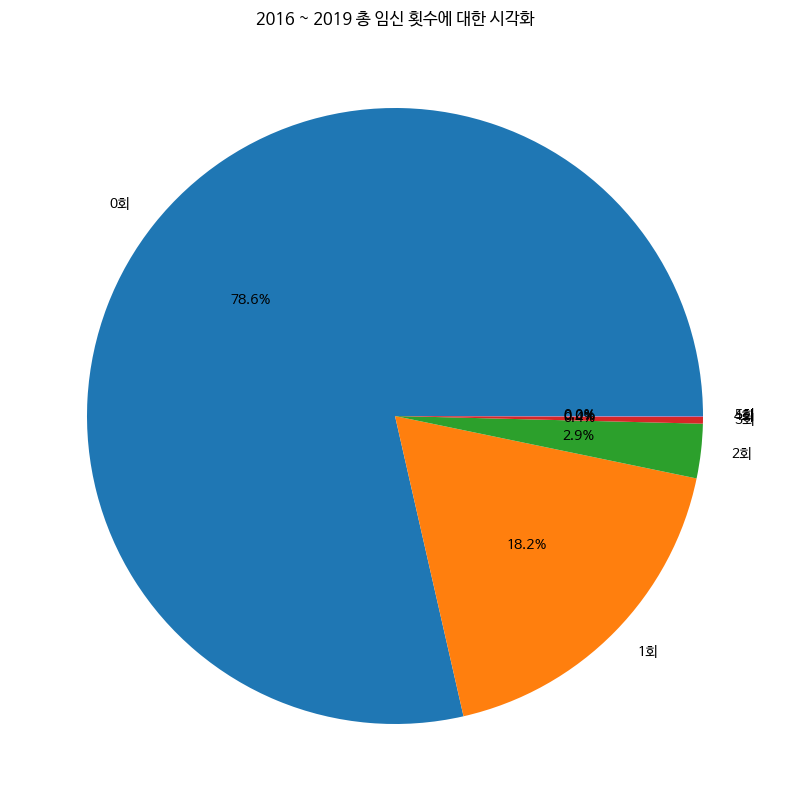

In [ ]:
# 총 임신 횟수
total_pregnancy_cause = train.groupby(['총 임신 횟수'])['총 임신 횟수'].count()
total_pregnancy_cause = total_pregnancy_cause.to_frame(name='count')
# 총 임신 횟수 단일 시각화
plt.figure(figsize=(15, 10))
plt.pie(total_pregnancy_cause['count'],labels=total_pregnancy_cause.index, autopct='%.1f%%')
plt.title('2016 ~ 2019 총 임신 횟수에 대한 시각화')
plt.grid()
plt.show()

30. IVF 임신 횟수

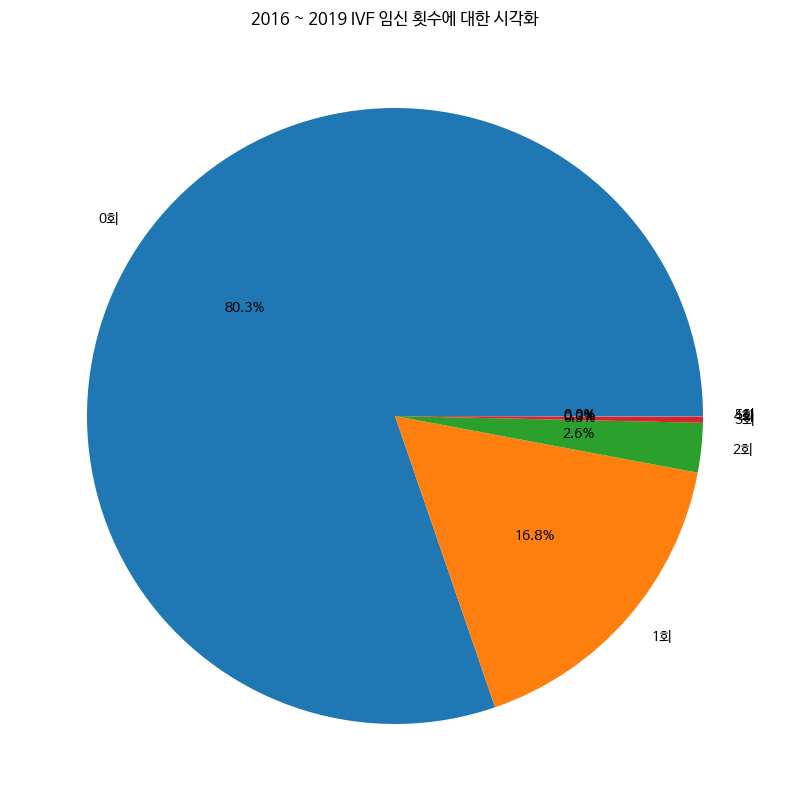

In [ ]:
# IVF 임신 횟수
ivf_pregnancy = train.groupby(['IVF 임신 횟수'])['IVF 임신 횟수'].count()
ivf_pregnancy = ivf_pregnancy.to_frame(name='count')
# IVF 임신 횟수 단일 시각화
plt.figure(figsize=(15, 10))
plt.pie(ivf_pregnancy['count'],labels=ivf_pregnancy.index, autopct='%.1f%%')
plt.title('2016 ~ 2019 IVF 임신 횟수에 대한 시각화')
plt.grid()
plt.show()

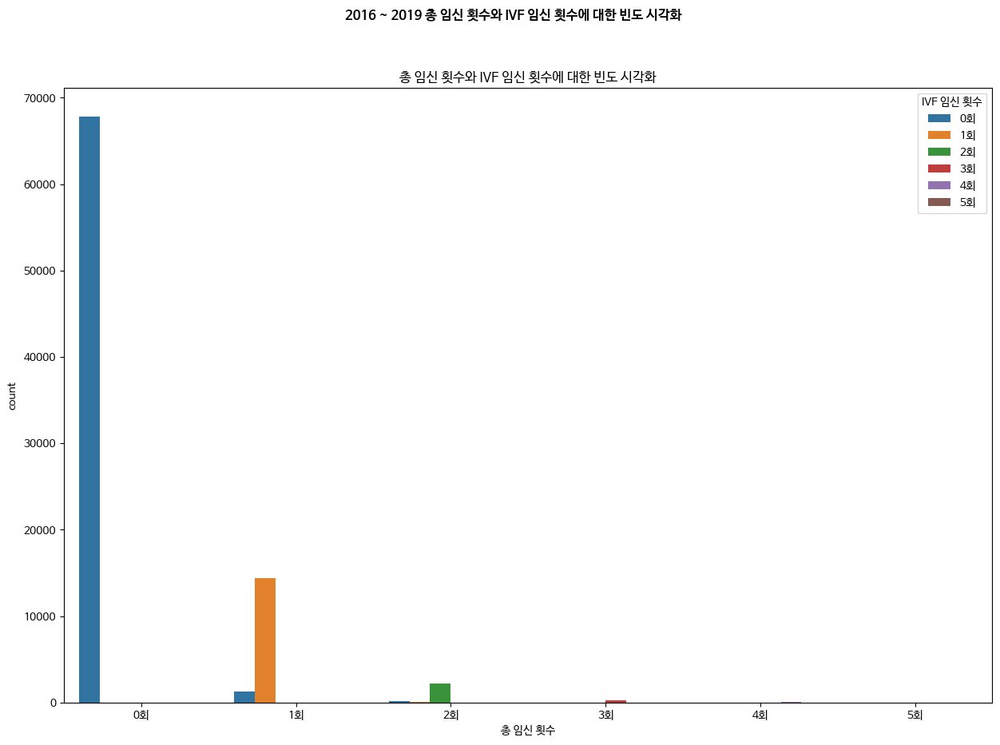

In [ ]:
# 총 임신 횟수, IVF 임신 횟수에 대한 그룹화
total_ivf_pregnancy_group = train.groupby(['총 임신 횟수', 'IVF 임신 횟수'])['IVF 임신 횟수'].count()
total_ivf_pregnancy_group = total_ivf_pregnancy_group.to_frame(name='count')
total_ivf_pregnancy_group = total_ivf_pregnancy_group.reset_index()

fig = plt.figure(figsize=(15, 10))
area1 = fig.add_subplot(1, 1, 1)
ax1 = sns.barplot(data=total_ivf_pregnancy_group, x='총 임신 횟수', y='count', hue='IVF 임신 횟수', ax=area1)
fig.suptitle('2016 ~ 2019 총 임신 횟수와 IVF 임신 횟수에 대한 빈도 시각화', fontweight='bold')
area1.set_title('총 임신 횟수와 IVF 임신 횟수에 대한 빈도 시각화')
plt.show()

31. DI 임신 횟수

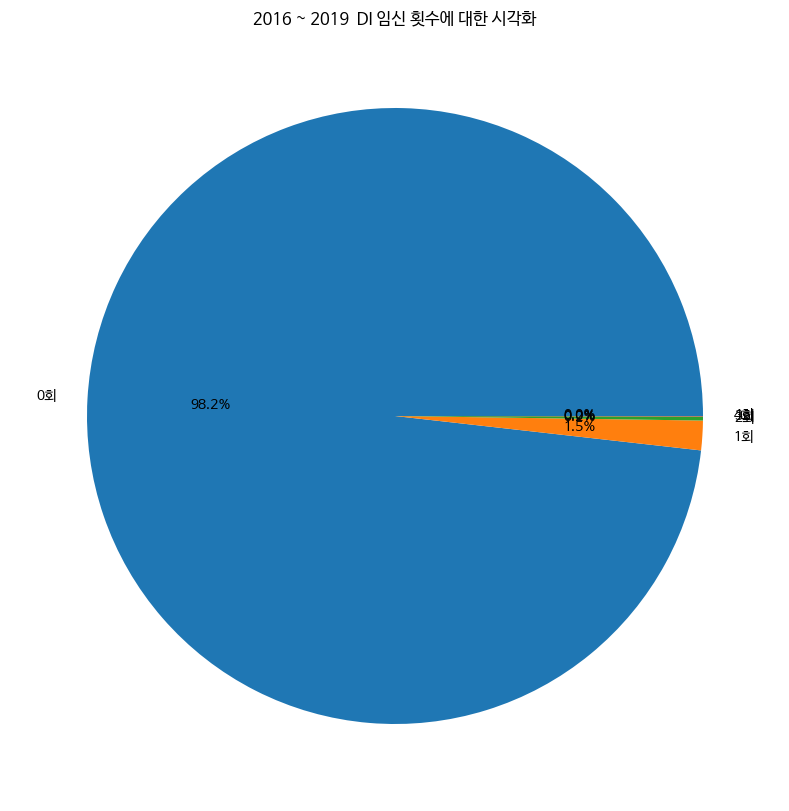

In [ ]:
# DI 임신 횟수
di_pregnancy_cause = train.groupby(['DI 임신 횟수'])['DI 임신 횟수'].count()
di_pregnancy_cause = di_pregnancy_cause.to_frame(name='count')
# DI 임신 횟수 단일 시각화
plt.figure(figsize=(15, 10))
plt.pie(di_pregnancy_cause['count'],labels=di_pregnancy_cause.index, autopct='%.1f%%')
plt.title('2016 ~ 2019  DI 임신 횟수에 대한 시각화')
plt.grid()
plt.show()

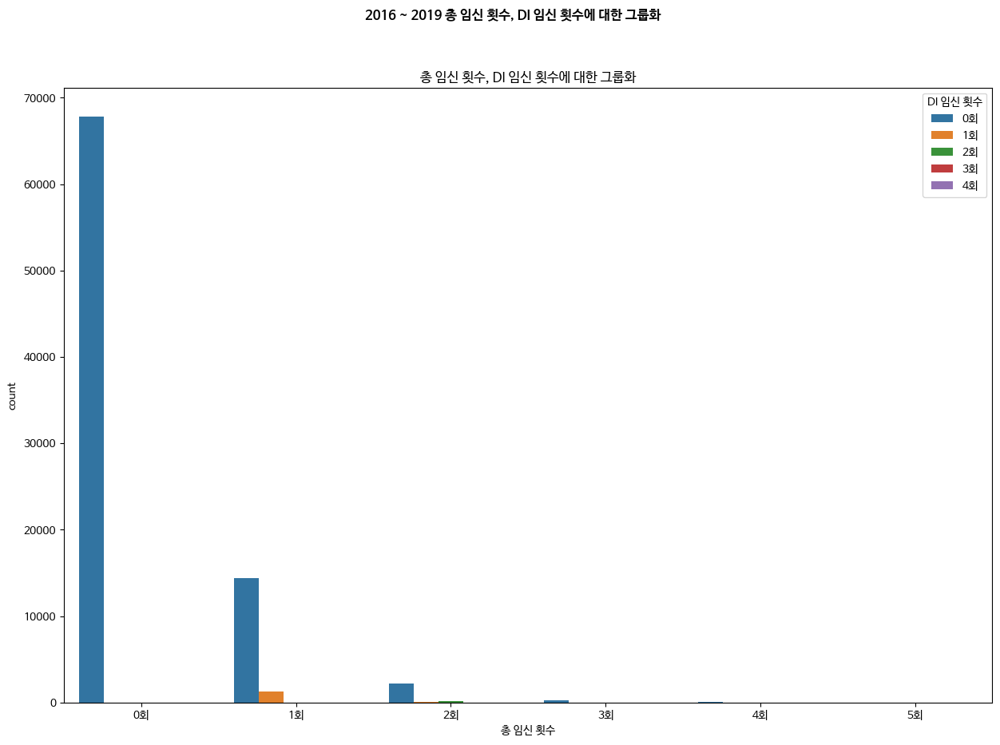

In [ ]:
# 총 임신 횟수, DI 임신 횟수에 대한 그룹화
total_di_pregnancy_group = train.groupby(['총 임신 횟수', 'DI 임신 횟수'])['DI 임신 횟수'].count()
total_di_pregnancy_group = total_di_pregnancy_group.to_frame(name='count')
total_di_pregnancy_group = total_di_pregnancy_group.reset_index()

fig = plt.figure(figsize=(15, 10))
area1 = fig.add_subplot(1, 1, 1)
ax1 = sns.barplot(data=total_di_pregnancy_group, x='총 임신 횟수', y='count', hue='DI 임신 횟수', ax=area1)
fig.suptitle('2016 ~ 2019 총 임신 횟수, DI 임신 횟수에 대한 그룹화', fontweight='bold')
area1.set_title('총 임신 횟수, DI 임신 횟수에 대한 그룹화')
plt.show()

32. 총 출산 횟수

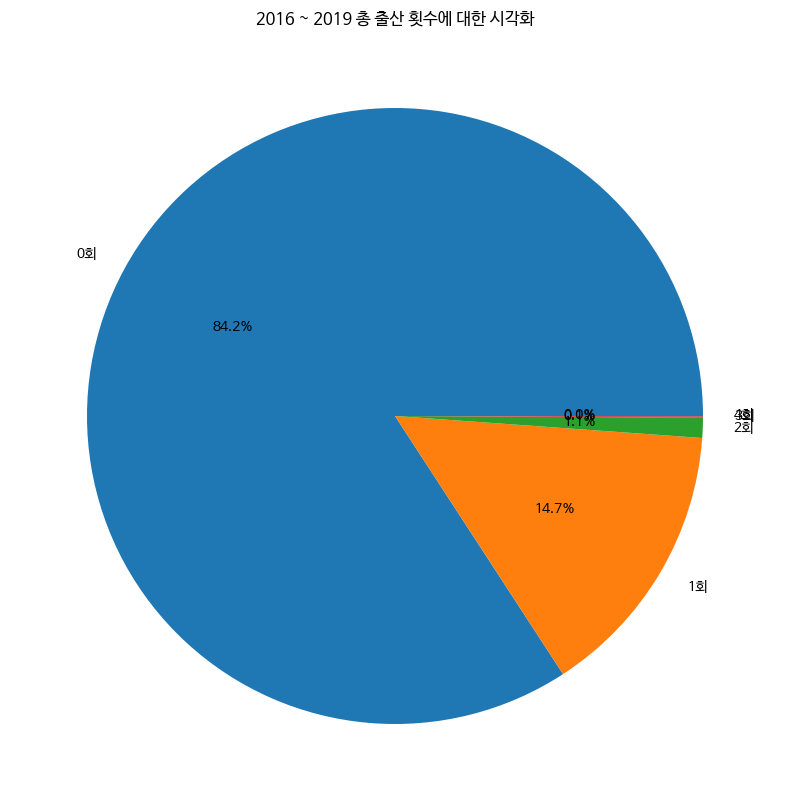

In [ ]:
# 총 출산 횟수
birth_cause = train.groupby(['총 출산 횟수'])['총 출산 횟수'].count()
birth_cause = birth_cause.to_frame(name='count')
# 총 출산 횟수 단일 시각화
plt.figure(figsize=(15, 10))
plt.pie(birth_cause['count'],labels=birth_cause.index, autopct='%.1f%%')
plt.title('2016 ~ 2019 총 출산 횟수에 대한 시각화')
plt.grid()
plt.show()

33. IVF 출산 횟수

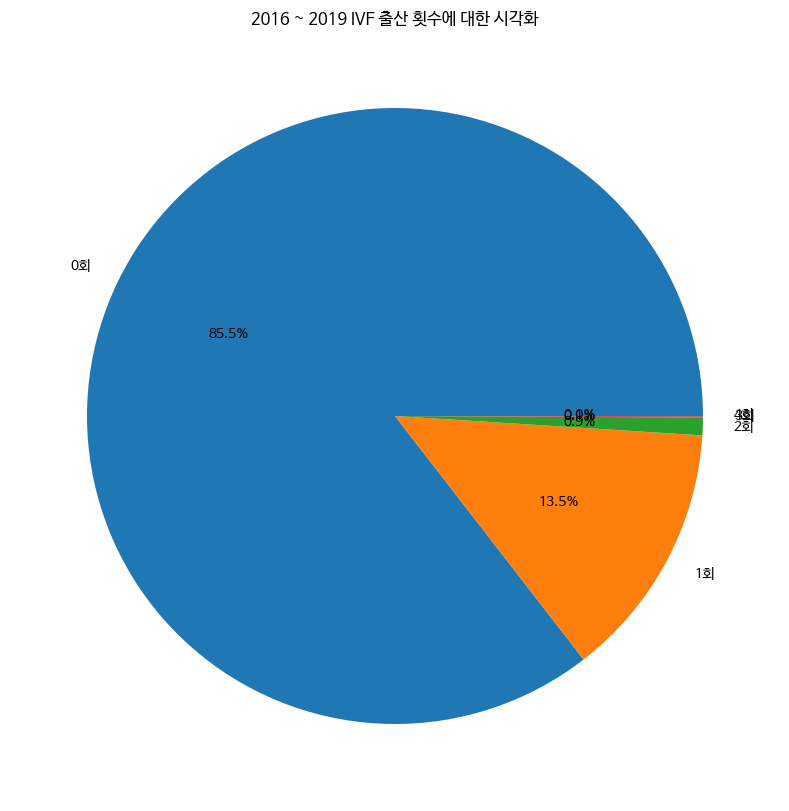

In [ ]:
# IVF 출산 횟수
ivf_birth_cause = train.groupby(['IVF 출산 횟수'])['IVF 출산 횟수'].count()
ivf_birth_cause = ivf_birth_cause.to_frame(name='count')
# 총 출산 횟수 단일 시각화
plt.figure(figsize=(15, 10))
plt.pie(ivf_birth_cause['count'],labels=ivf_birth_cause.index, autopct='%.1f%%')
plt.title('2016 ~ 2019 IVF 출산 횟수에 대한 시각화')
plt.grid()
plt.show()

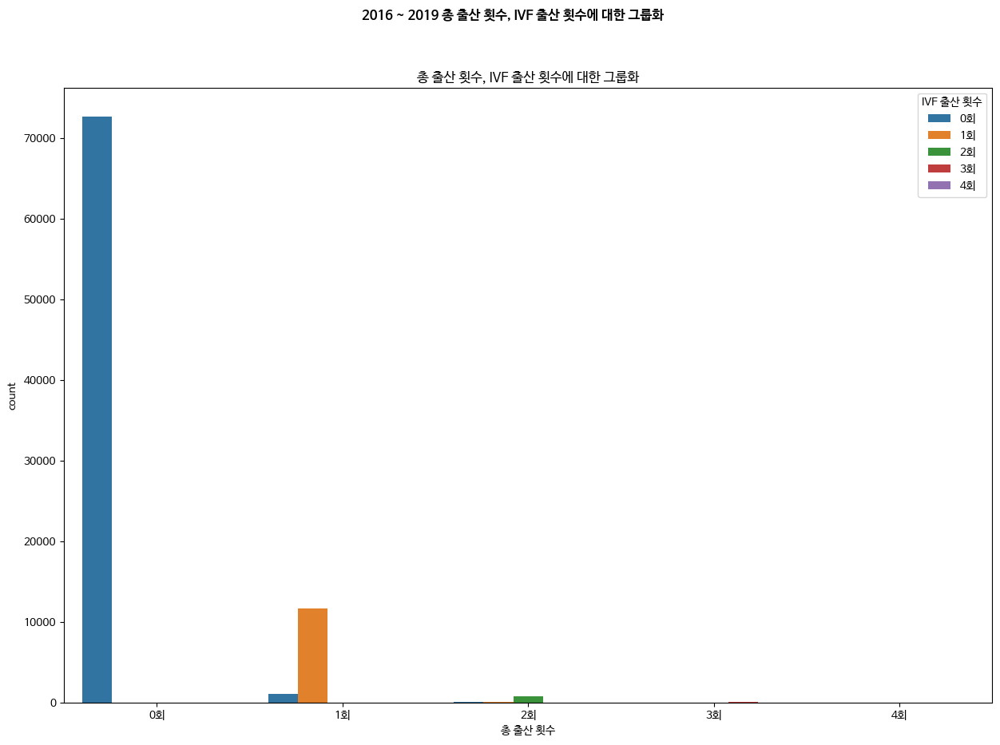

In [ ]:
# 총 출산 횟수, IVF 출산 횟수에 대한 그룹화
total_ivf_birth_group = train.groupby(['총 출산 횟수', 'IVF 출산 횟수'])['IVF 출산 횟수'].count()
total_ivf_birth_group = total_ivf_birth_group.to_frame(name='count')
total_ivf_birth_group = total_ivf_birth_group.reset_index()

fig = plt.figure(figsize=(15, 10))
area1 = fig.add_subplot(1, 1, 1)
ax1 = sns.barplot(data=total_ivf_birth_group, x='총 출산 횟수', y='count', hue='IVF 출산 횟수', ax=area1)
fig.suptitle('2016 ~ 2019 총 출산 횟수, IVF 출산 횟수에 대한 그룹화', fontweight='bold')
area1.set_title('총 출산 횟수, IVF 출산 횟수에 대한 그룹화')
plt.show()

34. DI 출산 횟수

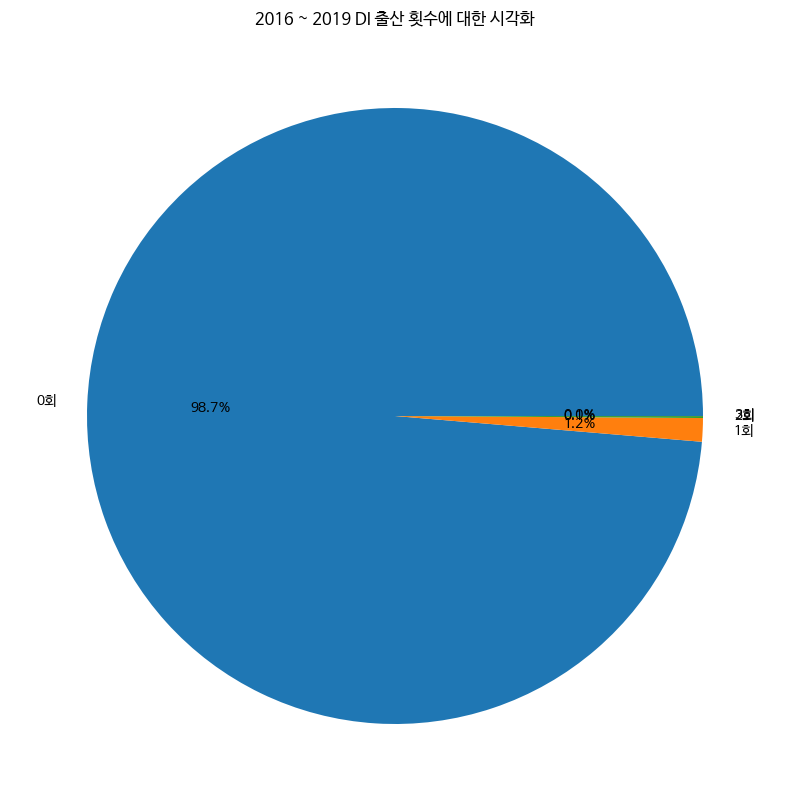

In [ ]:
# DI 출산 횟수
di_birth = train.groupby(['DI 출산 횟수'])['DI 출산 횟수'].count()
di_birth = di_birth.to_frame(name='count')
# DI 출산 횟수 단일 시각화
plt.figure(figsize=(15, 10))
plt.pie(di_birth['count'],labels=di_birth.index, autopct='%.1f%%')
plt.title('2016 ~ 2019 DI 출산 횟수에 대한 시각화')
plt.grid()
plt.show()

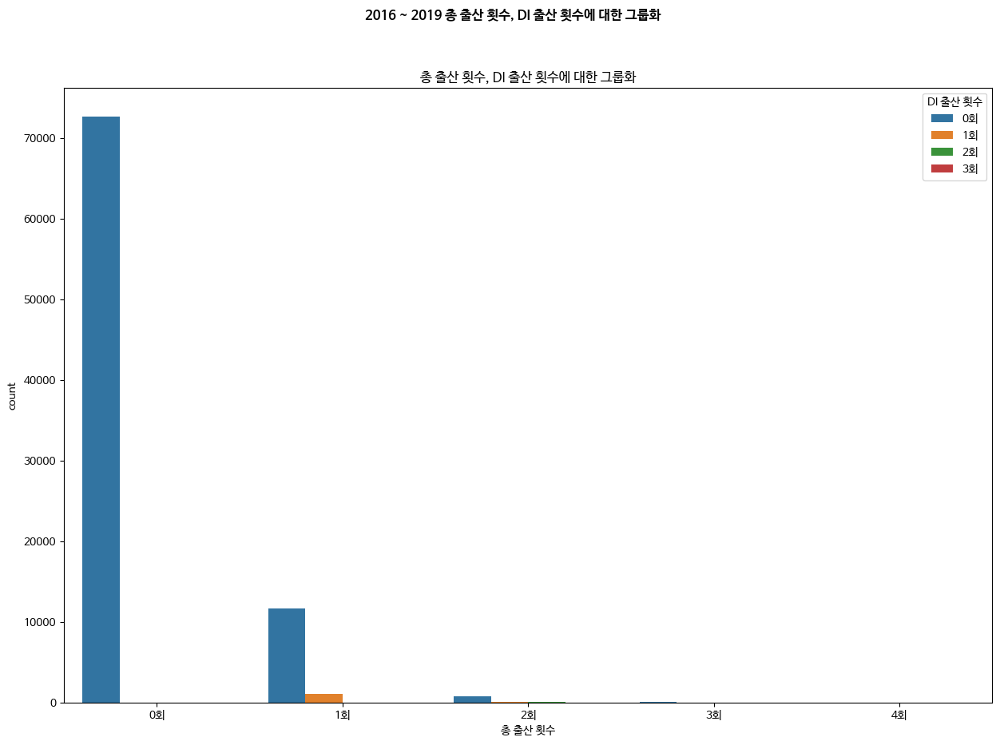

In [ ]:
# 총 출산 횟수, DI 출산 횟수에 대한 그룹화
total_di_birth_group = train.groupby(['총 출산 횟수', 'DI 출산 횟수'])['DI 출산 횟수'].count()
total_di_birth_group = total_di_birth_group.to_frame(name='count')
total_di_birth_group = total_di_birth_group.reset_index()

fig = plt.figure(figsize=(15, 10))
area1 = fig.add_subplot(1, 1, 1)
ax1 = sns.barplot(data=total_di_birth_group, x='총 출산 횟수', y='count', hue='DI 출산 횟수', ax=area1)
fig.suptitle('2016 ~ 2019 총 출산 횟수, DI 출산 횟수에 대한 그룹화', fontweight='bold')
area1.set_title('총 출산 횟수, DI 출산 횟수에 대한 그룹화')
plt.show()

35. 총 생성 배아 수

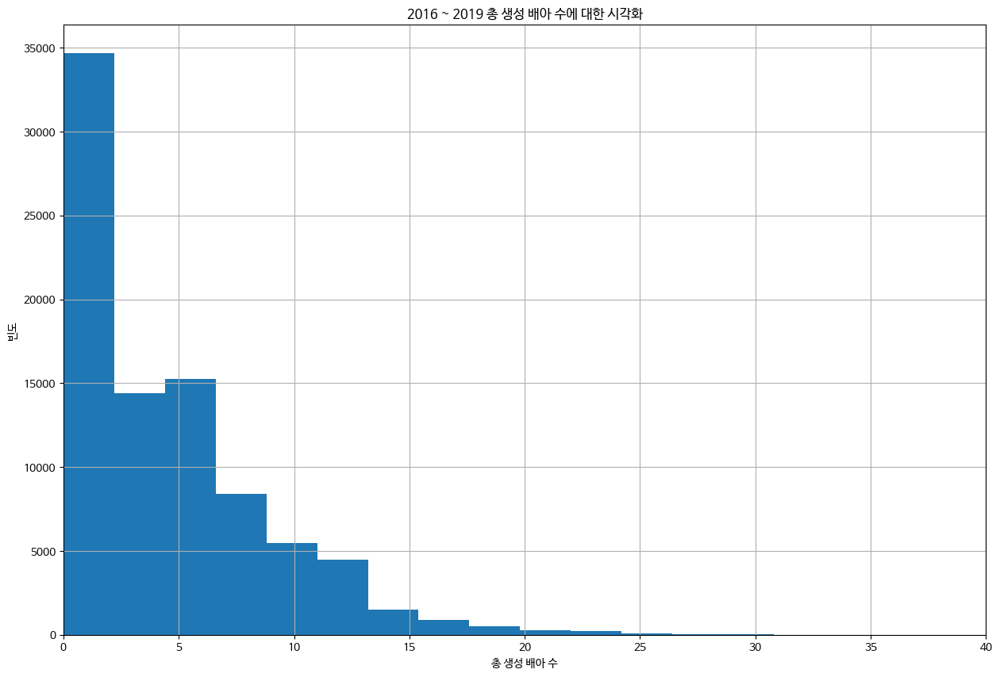

In [ ]:
# 총 생성 배아 수에 대한 시각화
plt.figure(figsize=(15, 10))
plt.hist(train['총 생성 배아 수'], bins=20)
plt.xlim(0, 40)
plt.xlabel('총 생성 배아 수')
plt.ylabel('빈도')
plt.title('2016 ~ 2019 총 생성 배아 수에 대한 시각화')
plt.grid()
plt.show()

36. 미세주입된 난자 수

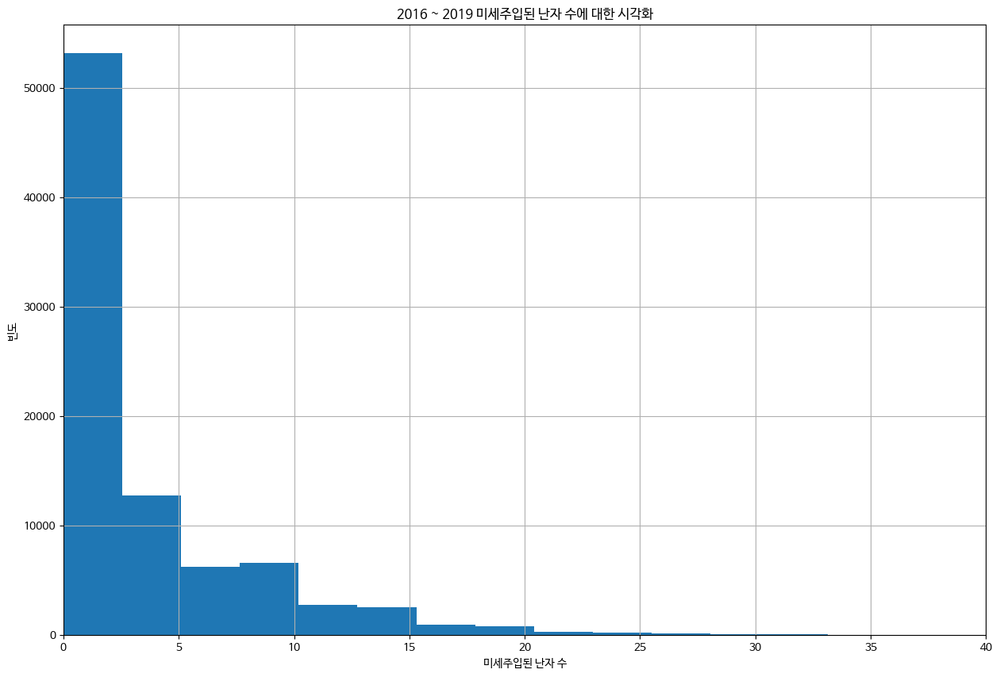

In [ ]:
# 미세주입된 난자 수에 대한 시각화
plt.figure(figsize=(15, 10))
plt.hist(train['미세주입된 난자 수'], bins=20)
plt.xlim(0, 40)
plt.xlabel('미세주입된 난자 수')
plt.ylabel('빈도')
plt.title('2016 ~ 2019 미세주입된 난자 수에 대한 시각화')
plt.grid()
plt.show()

37. 미세주입에서 생성된 배아 수

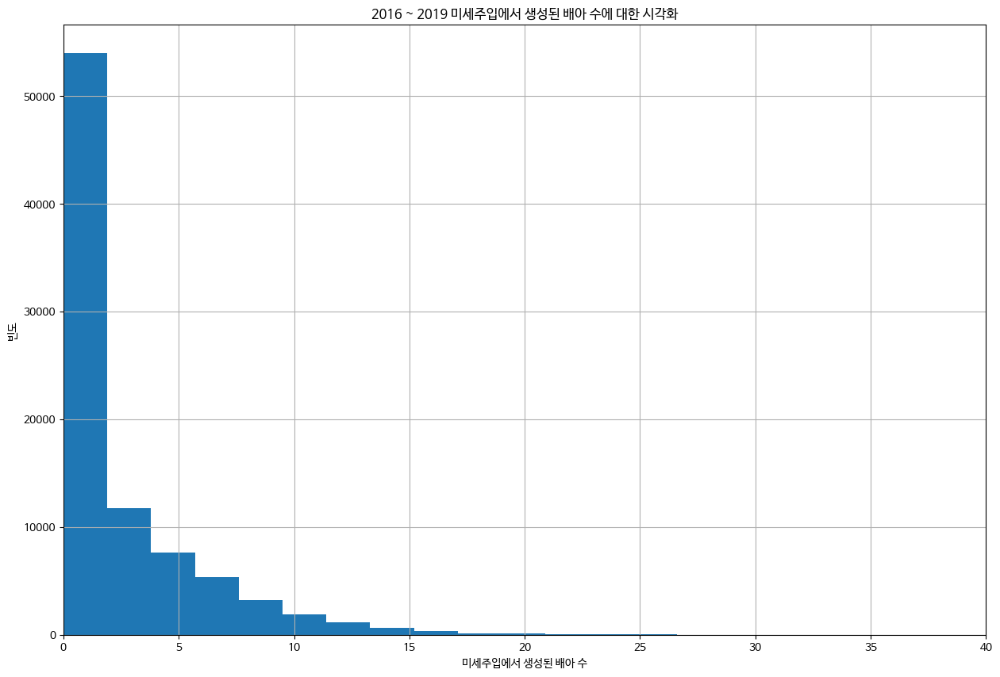

In [ ]:
# 미세주입에서 생성된 배아 수에 대한 시각화
plt.figure(figsize=(15, 10))
plt.hist(train['미세주입에서 생성된 배아 수'], bins=20)
plt.xlim(0, 40)
plt.xlabel('미세주입에서 생성된 배아 수')
plt.ylabel('빈도')
plt.title('2016 ~ 2019 미세주입에서 생성된 배아 수에 대한 시각화')
plt.grid()
plt.show()

38. 이식된 배아 수

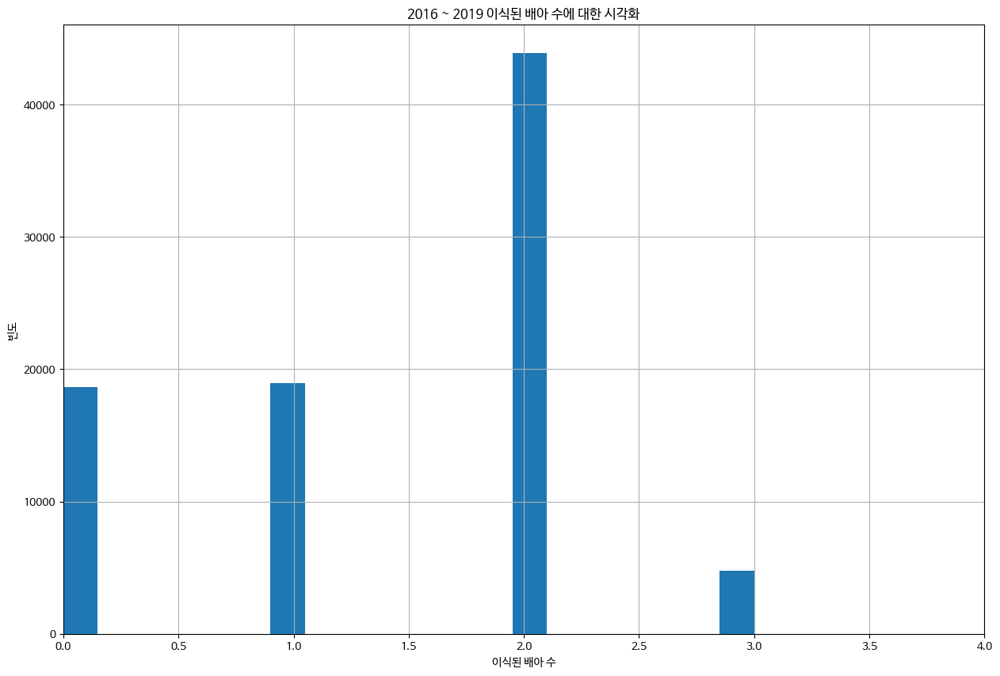

In [ ]:
# 이식된 배아 수에 대한 시각화
plt.figure(figsize=(15, 10))
plt.hist(train['이식된 배아 수'], bins=20)
plt.xlim(0, 4)
plt.xlabel('이식된 배아 수')
plt.ylabel('빈도')
plt.title('2016 ~ 2019 이식된 배아 수에 대한 시각화')
plt.grid()
plt.show()

39. 미세주입 배아 이식 수

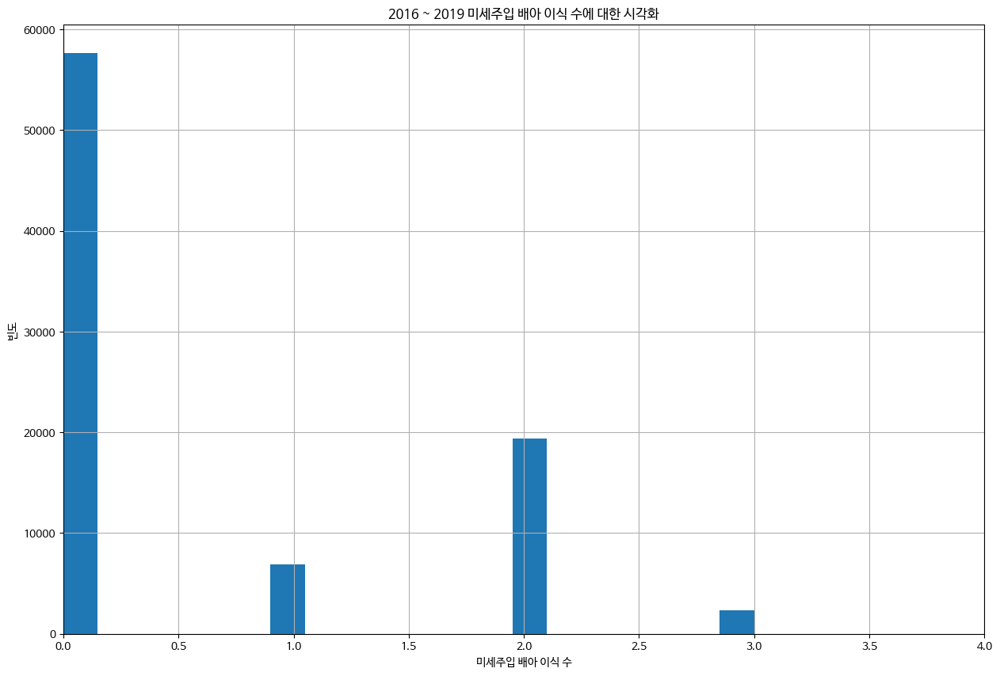

In [ ]:
# 미세주입 배아 이식 수에 대한 시각화
plt.figure(figsize=(15, 10))
plt.hist(train['미세주입 배아 이식 수'], bins=20)
plt.xlim(0, 4)
plt.xlabel('미세주입 배아 이식 수')
plt.ylabel('빈도')
plt.title('2016 ~ 2019 미세주입 배아 이식 수에 대한 시각화')
plt.grid()
plt.show()

40. 저장된 배아 수

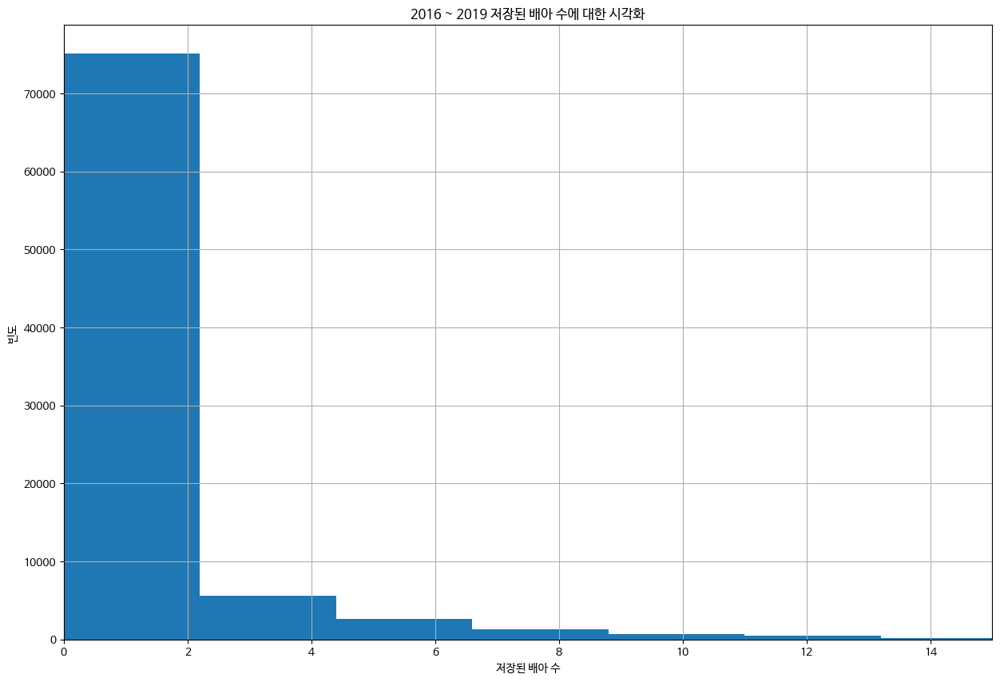

In [ ]:
# 저장된 배아 수에 대한 시각화
plt.figure(figsize=(15, 10))
plt.hist(train['저장된 배아 수'], bins=20)
plt.xlim(0, 15)
plt.xlabel('저장된 배아 수')
plt.ylabel('빈도')
plt.title('2016 ~ 2019 저장된 배아 수에 대한 시각화')
plt.grid()
plt.show()

41. 미세주입 후 저장된 배아 수

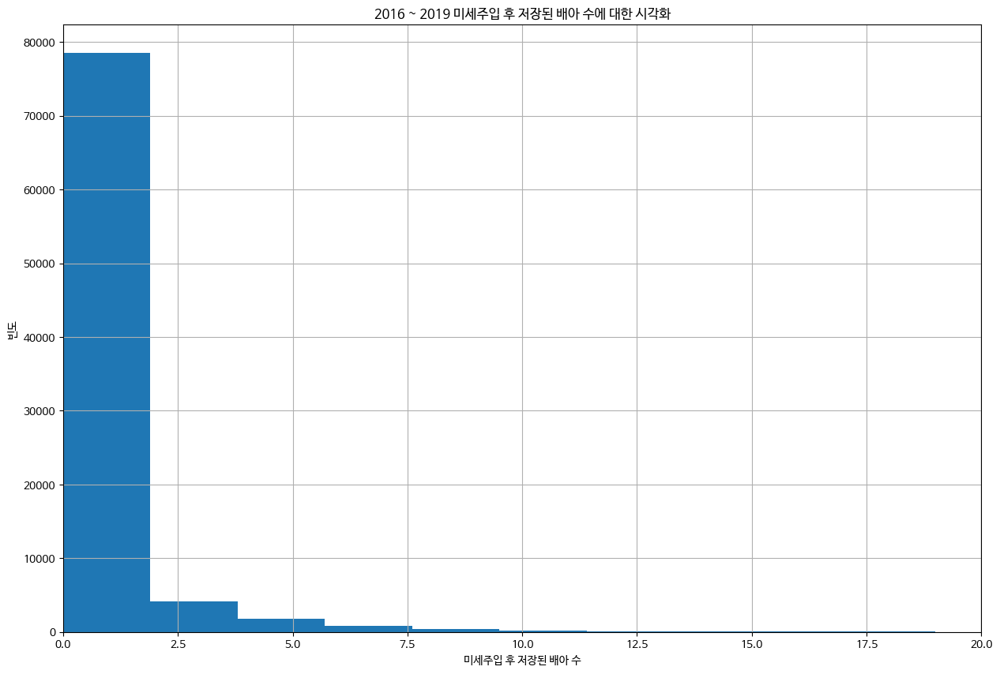

In [ ]:
# 미세주입 후 저장된 배아 수에 대한 시각화
plt.figure(figsize=(15, 10))
plt.hist(train['미세주입 후 저장된 배아 수'], bins=20)
plt.xlim(0, 20)
plt.xlabel('미세주입 후 저장된 배아 수')
plt.ylabel('빈도')
plt.title('2016 ~ 2019 미세주입 후 저장된 배아 수에 대한 시각화')
plt.grid()
plt.show()

42. 해동된 배아 수

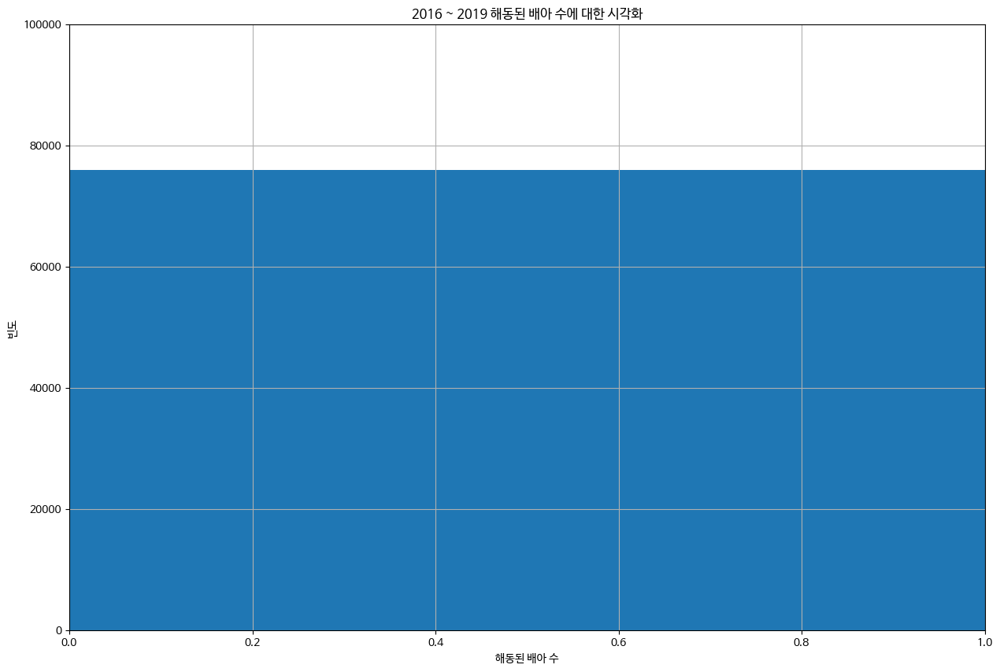

In [ ]:
# 해동된 배아 수에 대한 시각화
plt.figure(figsize=(15, 10))
plt.hist(train['해동된 배아 수'], bins=20)
plt.xlim(0, 1)
plt.ylim(0, 100000)
plt.xlabel('해동된 배아 수')
plt.ylabel('빈도')
plt.title('2016 ~ 2019 해동된 배아 수에 대한 시각화')
plt.grid()
plt.show()

43. 해동 난자 수

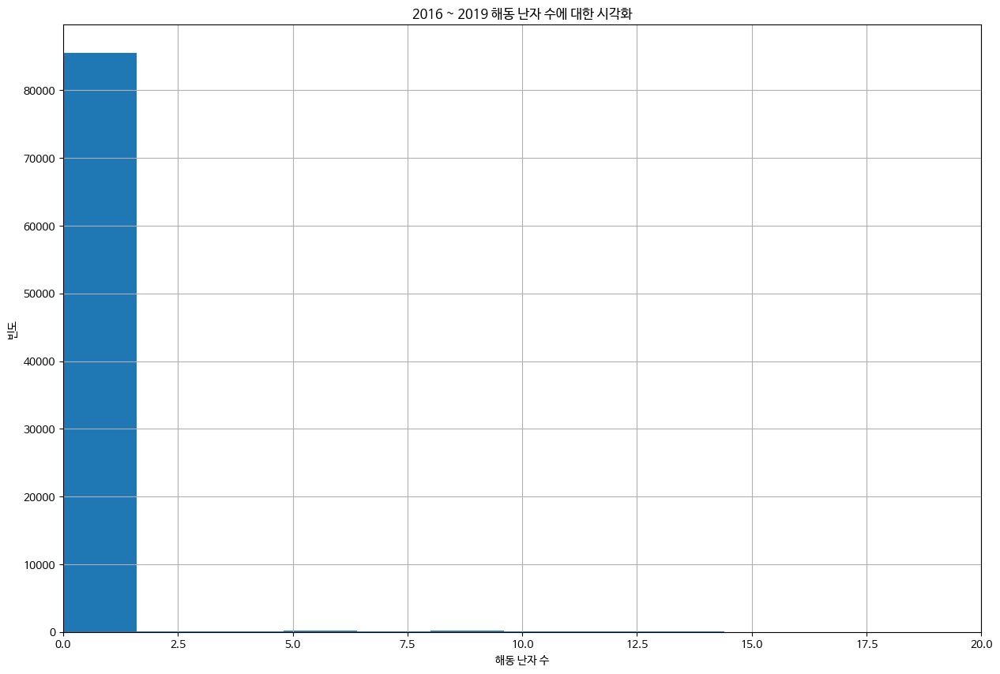

In [ ]:
# 해동된 배아 수에 대한 시각화
plt.figure(figsize=(15, 10))
plt.hist(train['해동 난자 수'], bins=20)
plt.xlim(0, 20)
plt.xlabel('해동 난자 수')
plt.ylabel('빈도')
plt.title('2016 ~ 2019 해동 난자 수에 대한 시각화')
plt.grid()
plt.show()

44. 수집된 신선 난자 수

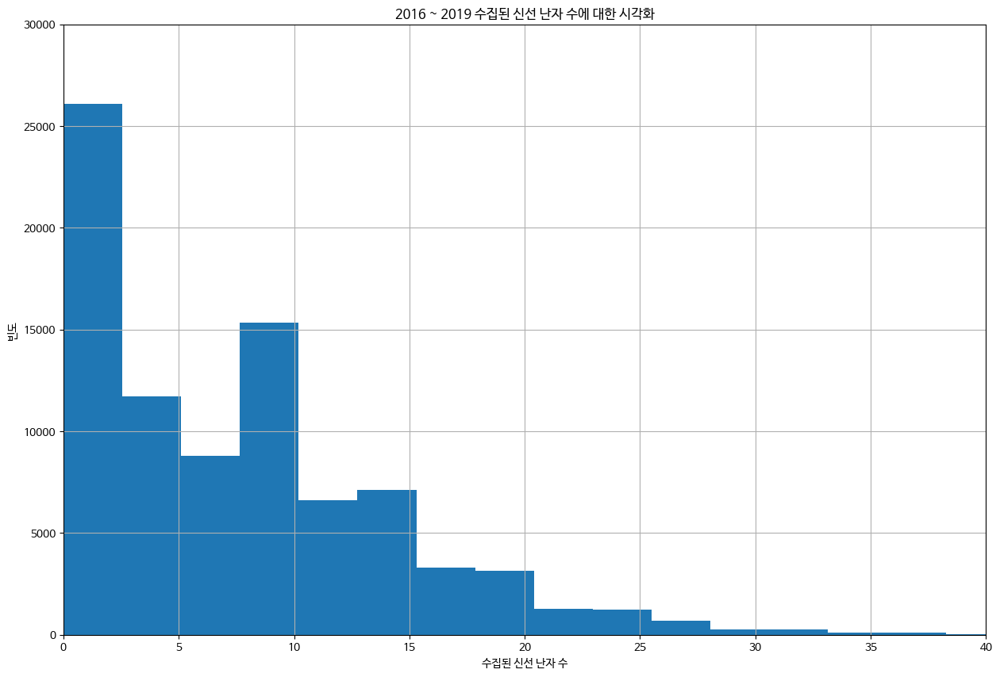

In [ ]:
# 수집된 난자 수에 대한 시각화
plt.figure(figsize=(15, 10))
plt.hist(train['수집된 신선 난자 수'], bins=20)
plt.xlim(0, 40)
plt.ylim(0, 30000)
plt.xlabel('수집된 신선 난자 수')
plt.ylabel('빈도')
plt.title('2016 ~ 2019 수집된 신선 난자 수에 대한 시각화')
plt.grid()
plt.show()

45. 저장된 신선 난자 수

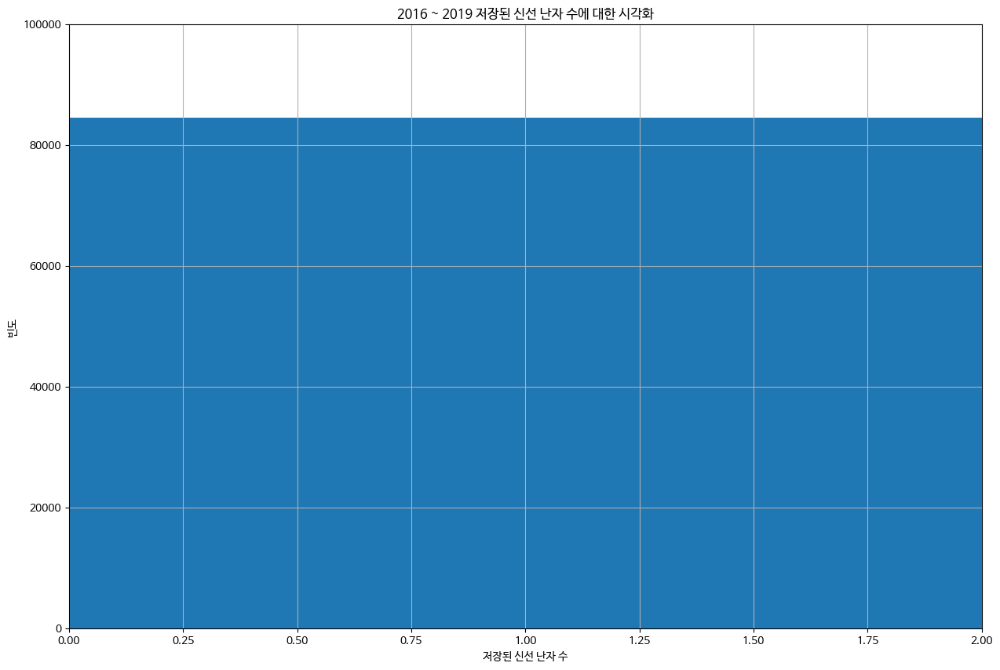

In [ ]:
# 저장된 신선 난자 수에 대한 시각화
plt.figure(figsize=(15, 10))
plt.hist(train['저장된 신선 난자 수'], bins=20)
plt.xlim(0, 2)
plt.ylim(0, 100000)
plt.xlabel('저장된 신선 난자 수')
plt.ylabel('빈도')
plt.title('2016 ~ 2019 저장된 신선 난자 수에 대한 시각화')
plt.grid()
plt.show()

46. 혼합된 난자 수

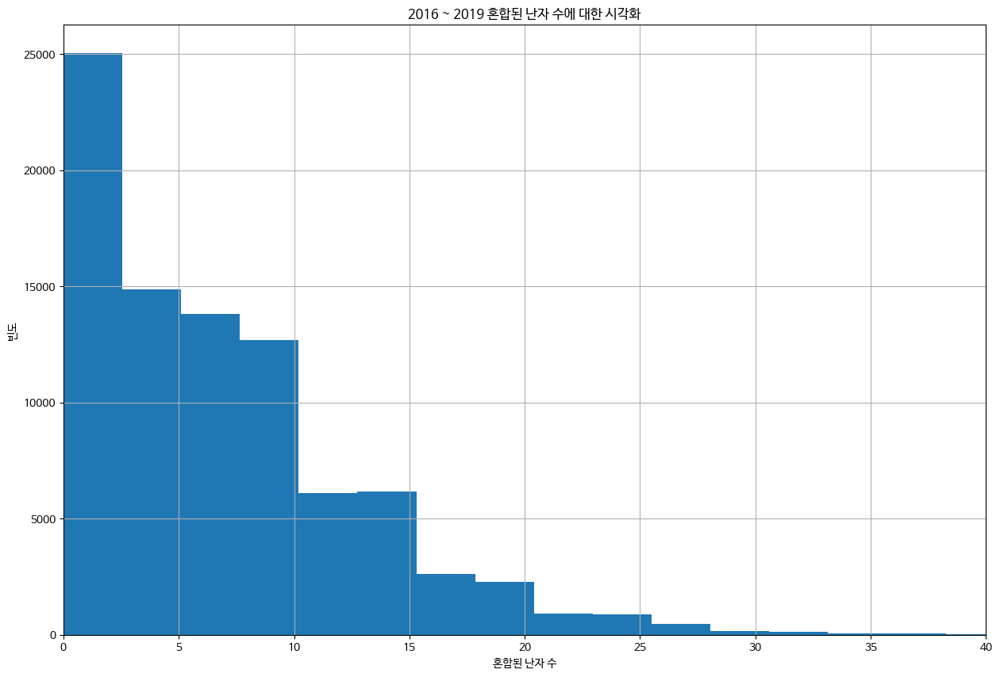

In [ ]:
# 혼합된 난자 수에 대한 시각화
plt.figure(figsize=(15, 10))
plt.hist(train['혼합된 난자 수'], bins=20)
plt.xlim(0, 40)
plt.xlabel('혼합된 난자 수')
plt.ylabel('빈도')
plt.title('2016 ~ 2019 혼합된 난자 수에 대한 시각화')
plt.grid()
plt.show()

47. 파트너 정자와 혼합된 난자 수

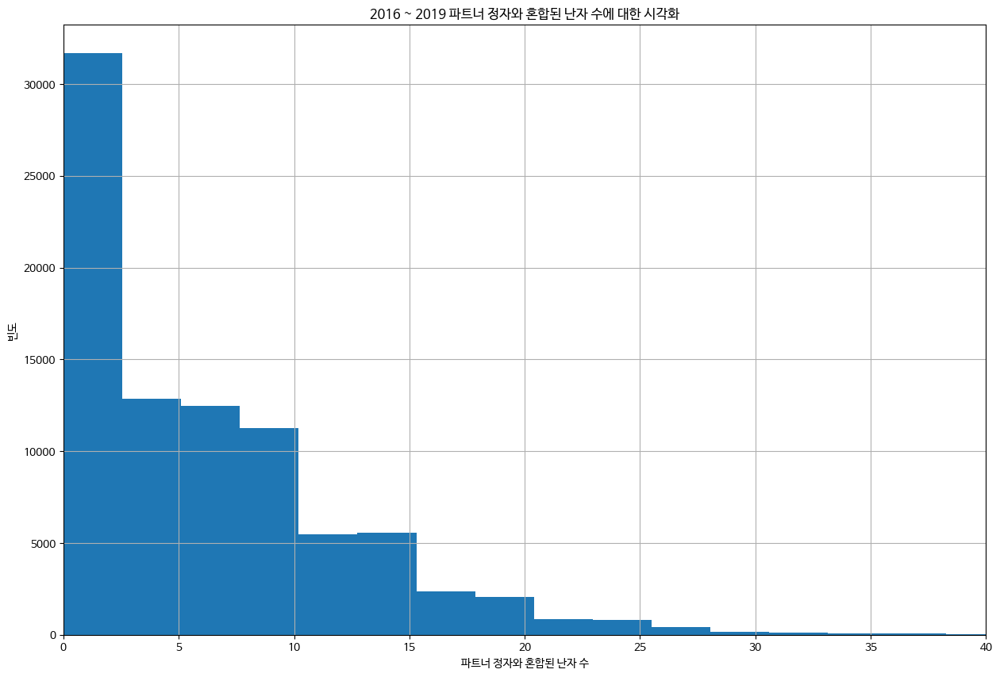

In [ ]:
# 파트너 정자와 혼합된 난자 수에 대한 시각화
plt.figure(figsize=(15, 10))
plt.hist(train['파트너 정자와 혼합된 난자 수'], bins=20)
plt.xlim(0, 40)
plt.xlabel('파트너 정자와 혼합된 난자 수')
plt.ylabel('빈도')
plt.title('2016 ~ 2019 파트너 정자와 혼합된 난자 수에 대한 시각화')
plt.grid()
plt.show()

48. 기증자 정자와 혼합된 난자 수

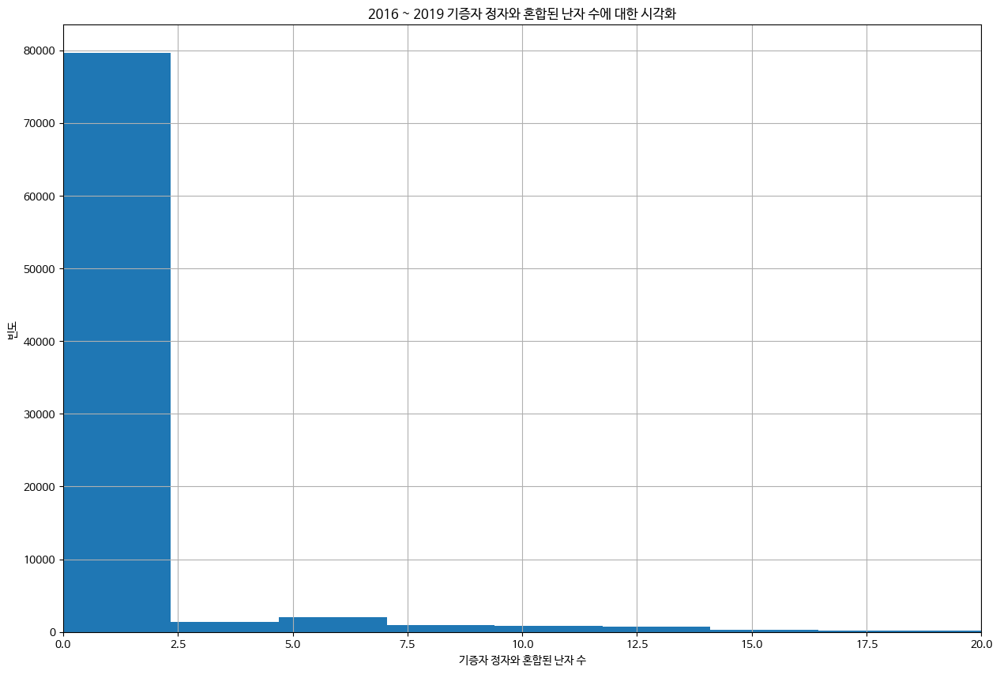

In [ ]:
# 기증자 정자와 혼합된 난자 수에 대한 시각화
plt.figure(figsize=(15, 10))
plt.hist(train['기증자 정자와 혼합된 난자 수'], bins=20)
plt.xlim(0, 20)
plt.xlabel('기증자 정자와 혼합된 난자 수')
plt.ylabel('빈도')
plt.title('2016 ~ 2019 기증자 정자와 혼합된 난자 수에 대한 시각화')
plt.grid()
plt.show()

49. 난자 출처

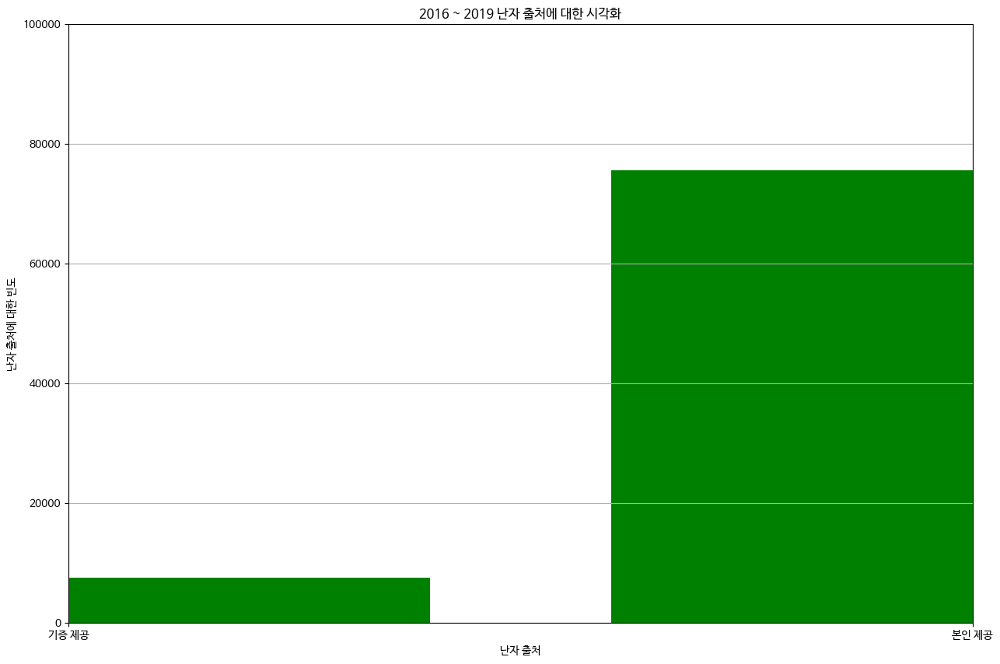

In [ ]:
# 난자 출처
egg_from = train.groupby(['난자 출처'])['난자 출처'].count()
egg_from = egg_from.to_frame(name='count')
plt.figure(figsize=(15, 10))
plt.bar(egg_from.index, egg_from['count'], color='g')
plt.ylim(0, 100000)
plt.xlabel('난자 출처')
plt.ylabel('난자 출처에 대한 빈도')
plt.title('2016 ~ 2019 난자 출처에 대한 시각화')
plt.grid()
plt.show()

50. 정자 출처

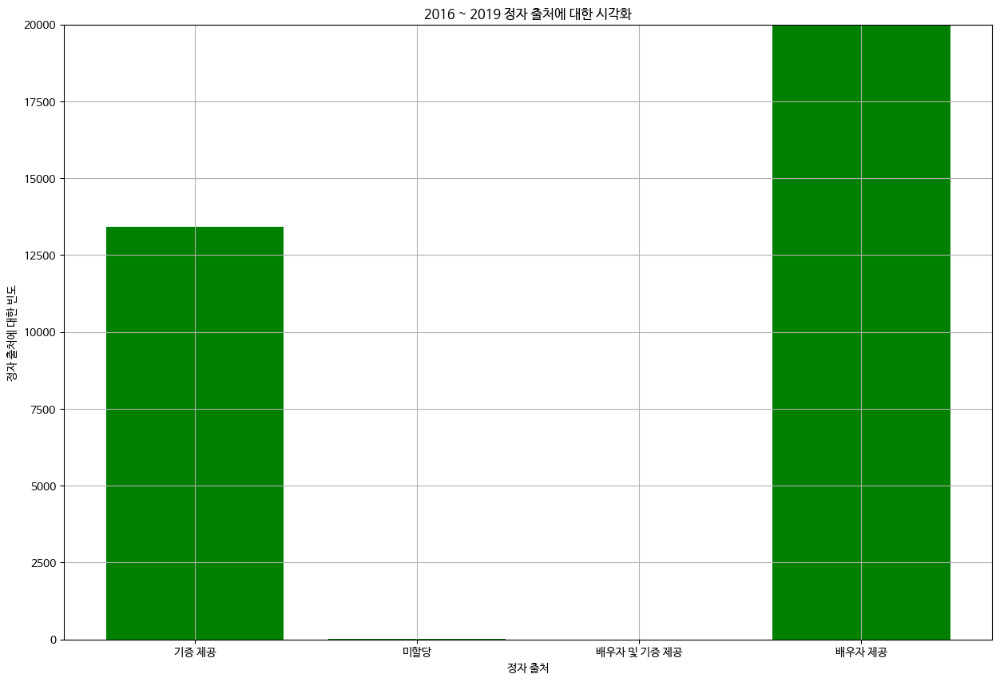

In [ ]:
# 정자 출처
sperm_from = train.groupby(['정자 출처'])['정자 출처'].count()
sperm_from = sperm_from.to_frame(name='count')
plt.figure(figsize=(15, 10))
plt.bar(sperm_from.index, sperm_from['count'], color='g')
plt.ylim(0, 20000)
plt.xlabel('정자 출처')
plt.ylabel('정자 출처에 대한 빈도')
plt.title('2016 ~ 2019 정자 출처에 대한 시각화')
plt.grid()
plt.show()


51. 난자 기증자 나이

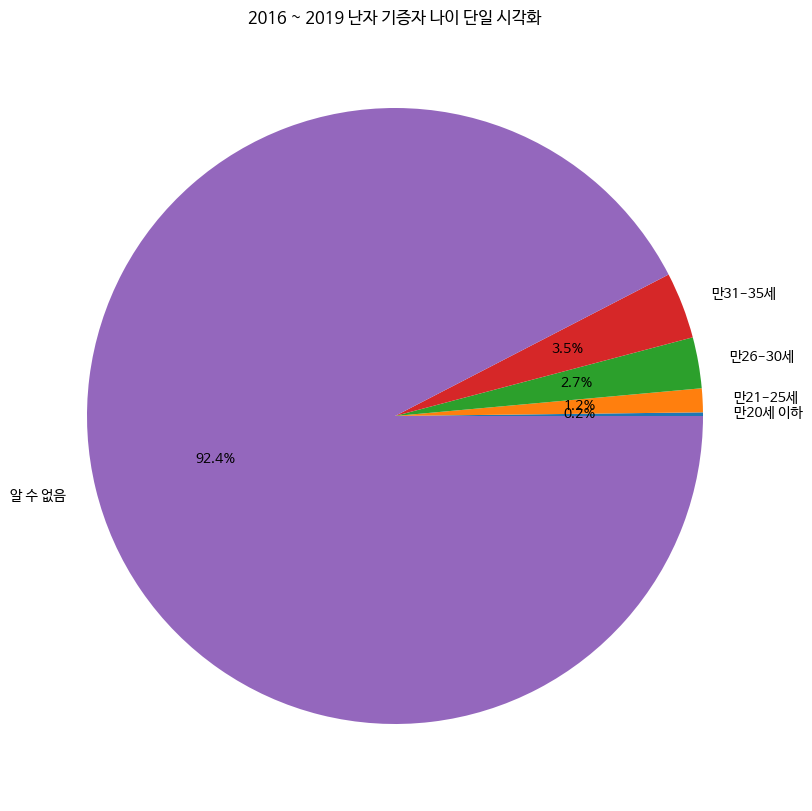

In [ ]:
# 난자 기증자 나이 단일 시각화
egg_donor_age = train.groupby(['난자 기증자 나이'])['난자 기증자 나이'].count()
egg_donor_age = egg_donor_age.to_frame(name='count')
# 난자 기증자 나이 단일 시각화
plt.figure(figsize=(15, 10))
plt.pie(egg_donor_age['count'],labels=egg_donor_age.index, autopct='%.1f%%')
plt.title('2016 ~ 2019 난자 기증자 나이 단일 시각화')
plt.grid()
plt.show()

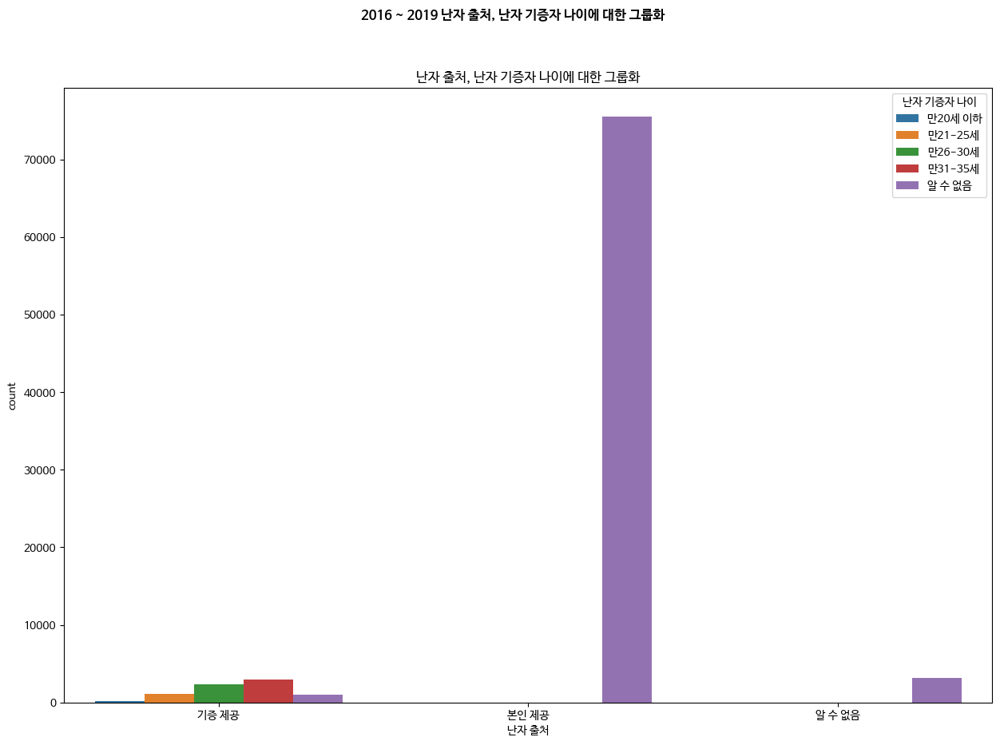

In [ ]:
# 난자 출처, 난자 기증자 나이에 대한 그룹화
egg_donor_group = train.groupby(['난자 출처', '난자 기증자 나이'])['난자 기증자 나이'].count()
egg_donor_group = egg_donor_group.to_frame(name='count')
egg_donor_group = egg_donor_group.reset_index()

fig = plt.figure(figsize=(15, 10))
area1 = fig.add_subplot(1, 1, 1)
ax1 = sns.barplot(data=egg_donor_group, x='난자 출처', y='count', hue='난자 기증자 나이', ax=area1)
fig.suptitle('2016 ~ 2019 난자 출처, 난자 기증자 나이에 대한 그룹화', fontweight='bold')
area1.set_title('난자 출처, 난자 기증자 나이에 대한 그룹화')
plt.show()

52. 정자 기증자 나이

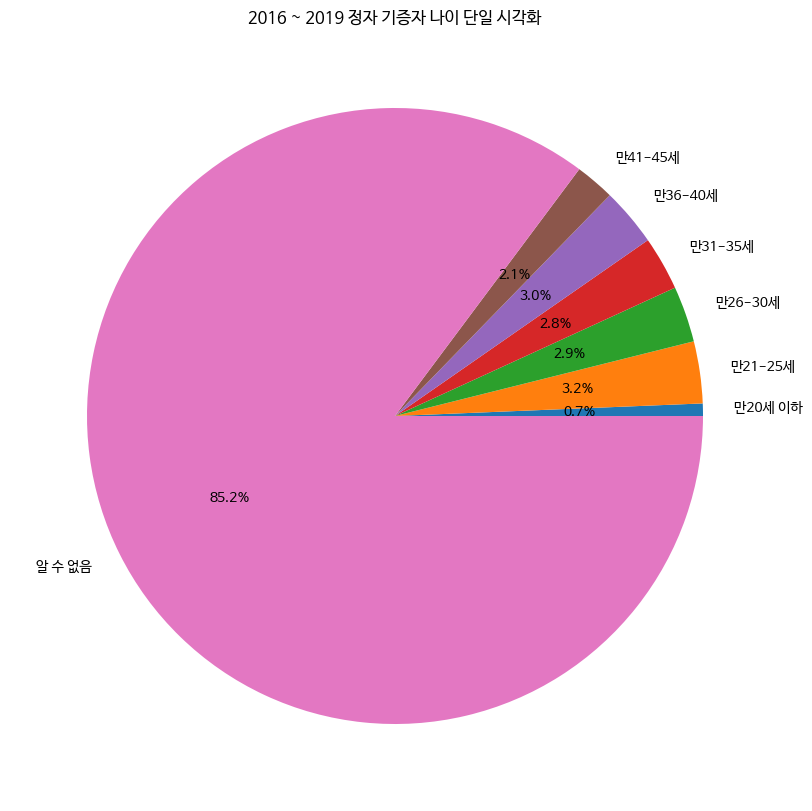

In [ ]:
# 정자 기증자 나이 단일 시각화
sperm_donor_age = train.groupby(['정자 기증자 나이'])['정자 기증자 나이'].count()
sperm_donor_age = sperm_donor_age.to_frame(name='count')
# 정자 기증자 나이 단일 시각화
plt.figure(figsize=(15, 10))
plt.pie(sperm_donor_age['count'],labels=sperm_donor_age.index, autopct='%.1f%%')
plt.title('2016 ~ 2019 정자 기증자 나이 단일 시각화')
plt.grid()
plt.show()

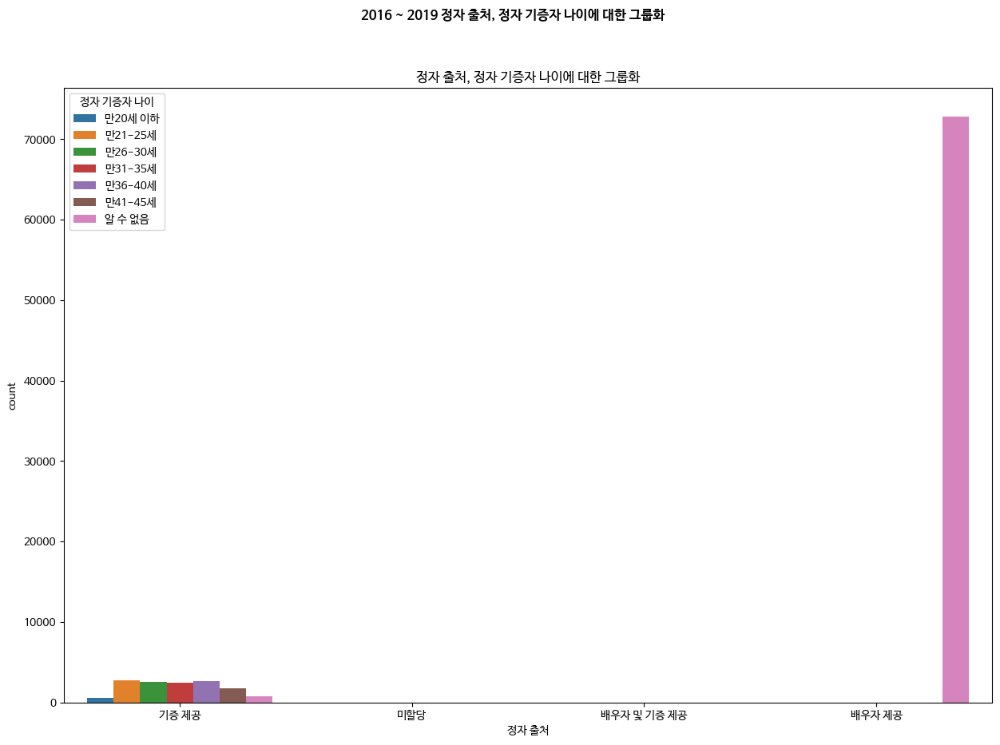

In [ ]:
# 정자 출처, 정자 기증자 나이에 대한 그룹화
sperm_donor_age_group = train.groupby(['정자 출처', '정자 기증자 나이'])['정자 기증자 나이'].count()
sperm_donor_age_group = sperm_donor_age_group.to_frame(name='count')
sperm_donor_age_group = sperm_donor_age_group.reset_index()

fig = plt.figure(figsize=(15, 10))
area1 = fig.add_subplot(1, 1, 1)
ax1 = sns.barplot(data=sperm_donor_age_group, x='정자 출처', y='count', hue='정자 기증자 나이', ax=area1)
fig.suptitle('2016 ~ 2019 정자 출처, 정자 기증자 나이에 대한 그룹화', fontweight='bold')
area1.set_title('정자 출처, 정자 기증자 나이에 대한 그룹화')
plt.show()

53. 동결 배아 사용 여부

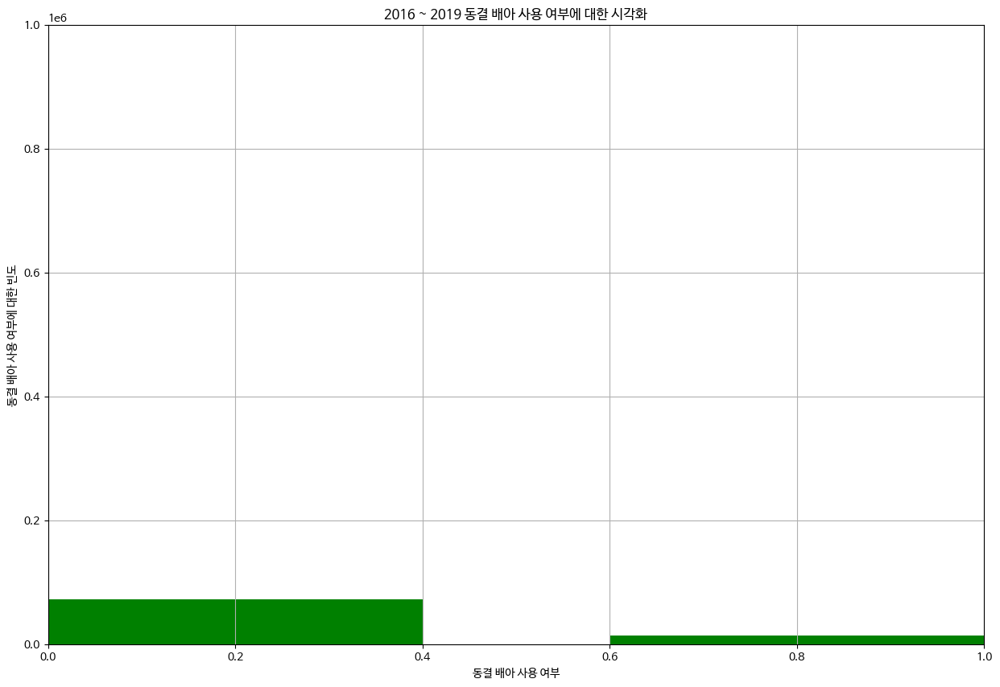

In [ ]:
# 동결 배아 사용 여부
freezed_embryo_usage = train.groupby(['동결 배아 사용 여부'])['동결 배아 사용 여부'].count()
freezed_embryo_usage = freezed_embryo_usage.to_frame(name='count')
plt.figure(figsize=(15, 10))
plt.bar(freezed_embryo_usage.index, freezed_embryo_usage['count'], color='g')
plt.ylim(0, 1000000)
plt.xlim(0, 1)
plt.xlabel('동결 배아 사용 여부')
plt.ylabel('동결 배아 사용 여부에 대한 빈도')
plt.title('2016 ~ 2019 동결 배아 사용 여부에 대한 시각화')
plt.grid()
plt.show()

54. 신선 배아 사용 여부

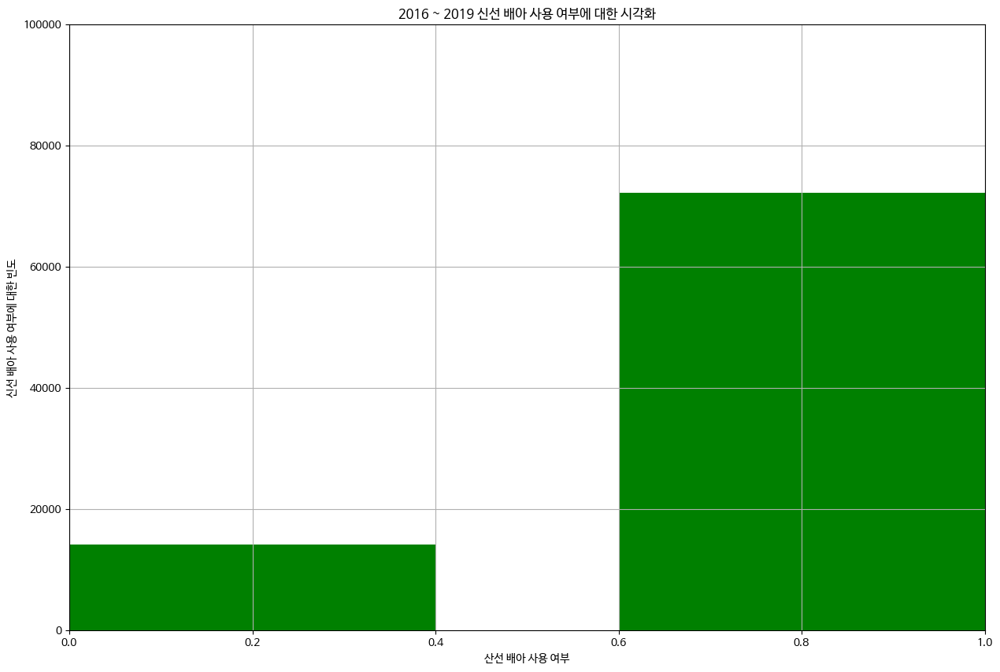

In [ ]:
# 신선 배아 사용 여부
fresh_embryo_usage = train.groupby(['신선 배아 사용 여부'])['신선 배아 사용 여부'].count()
fresh_embryo_usage = fresh_embryo_usage.to_frame(name='count')
plt.figure(figsize=(15, 10))
plt.bar(fresh_embryo_usage.index, fresh_embryo_usage['count'], color='g')
plt.ylim(0, 100000)
plt.xlim(0, 1)
plt.xlabel('산선 배아 사용 여부')
plt.ylabel('신선 배아 사용 여부에 대한 빈도')
plt.title('2016 ~ 2019 신선 배아 사용 여부에 대한 시각화')
plt.grid()
plt.show()

55. 기증 배아 사용 여부

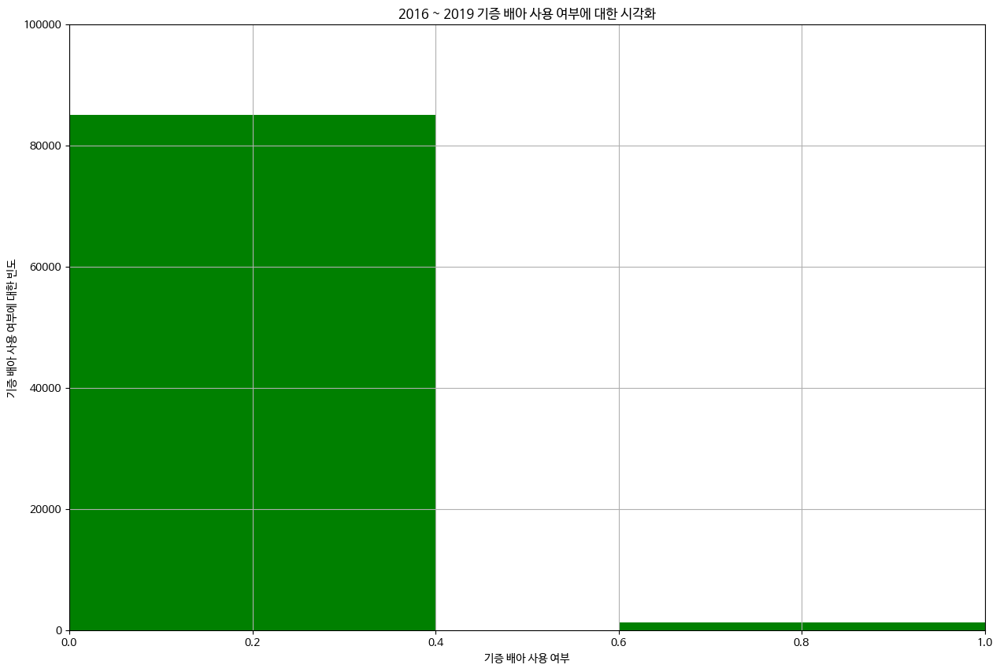

In [ ]:
# 기증 배아 사용 여부
donor_embryo_usage = train.groupby(['기증 배아 사용 여부'])['기증 배아 사용 여부'].count()
donor_embryo_usage = donor_embryo_usage.to_frame(name='count')
plt.figure(figsize=(15, 10))
plt.bar(donor_embryo_usage.index, donor_embryo_usage['count'], color='g')
plt.ylim(0, 100000)
plt.xlim(0, 1)
plt.xlabel('기증 배아 사용 여부')
plt.ylabel('기증 배아 사용 여부에 대한 빈도')
plt.title('2016 ~ 2019 기증 배아 사용 여부에 대한 시각화')
plt.grid()
plt.show()

56. 대리모 여부

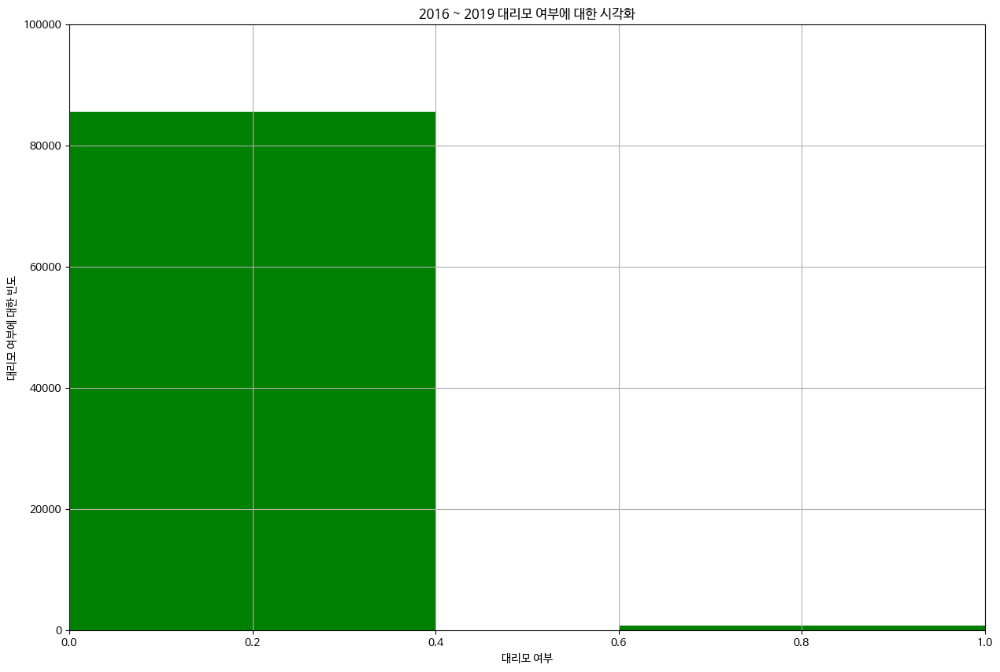

In [ ]:
# 대리모 여부
instae_mom = train.groupby(['대리모 여부'])['대리모 여부'].count()
instae_mom = instae_mom.to_frame(name='count')
plt.figure(figsize=(15, 10))
plt.bar(instae_mom.index, instae_mom['count'], color='g')
plt.ylim(0, 100000)
plt.xlim(0, 1)
plt.xlabel('대리모 여부')
plt.ylabel('대리모 여부에 대한 빈도')
plt.title('2016 ~ 2019 대리모 여부에 대한 시각화')
plt.grid()
plt.show()

57. PGD 시술 여부

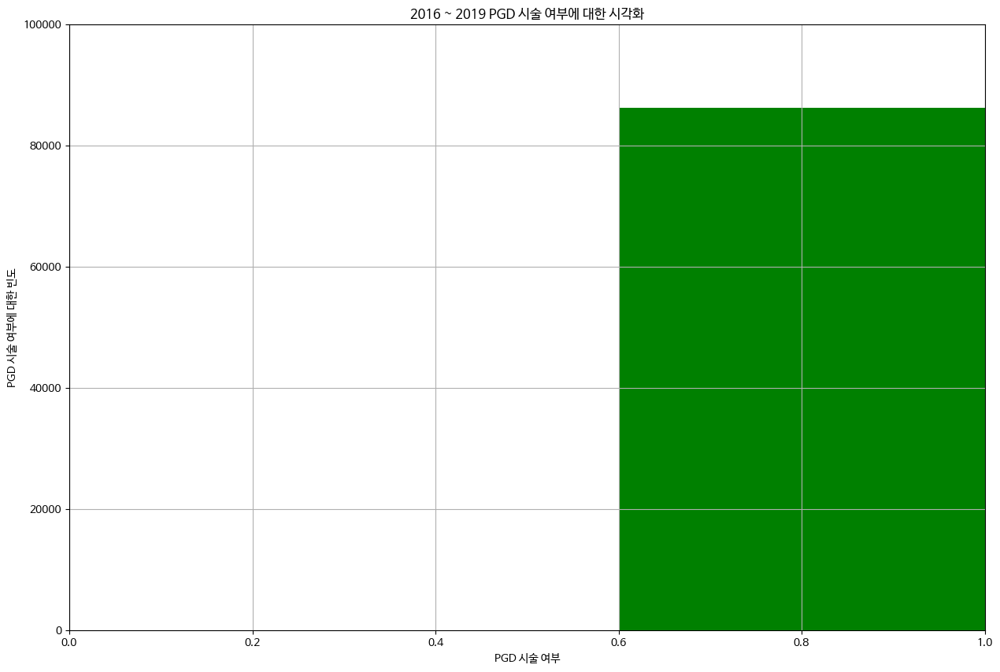

In [ ]:
# PGD 시술 여부
pgd_curse_right = train.groupby(['PGD 시술 여부'])['PGD 시술 여부'].count()
pgd_curse_right = pgd_curse_right.to_frame(name='count')
plt.figure(figsize=(15, 10))
plt.bar(pgd_curse_right.index, pgd_curse_right['count'], color='g')
plt.ylim(0, 100000)
plt.xlim(0, 1)
plt.xlabel('PGD 시술 여부')
plt.ylabel('PGD 시술 여부에 대한 빈도')
plt.title('2016 ~ 2019 PGD 시술 여부에 대한 시각화')
plt.grid()
plt.show()

58. PGS 시술 여부

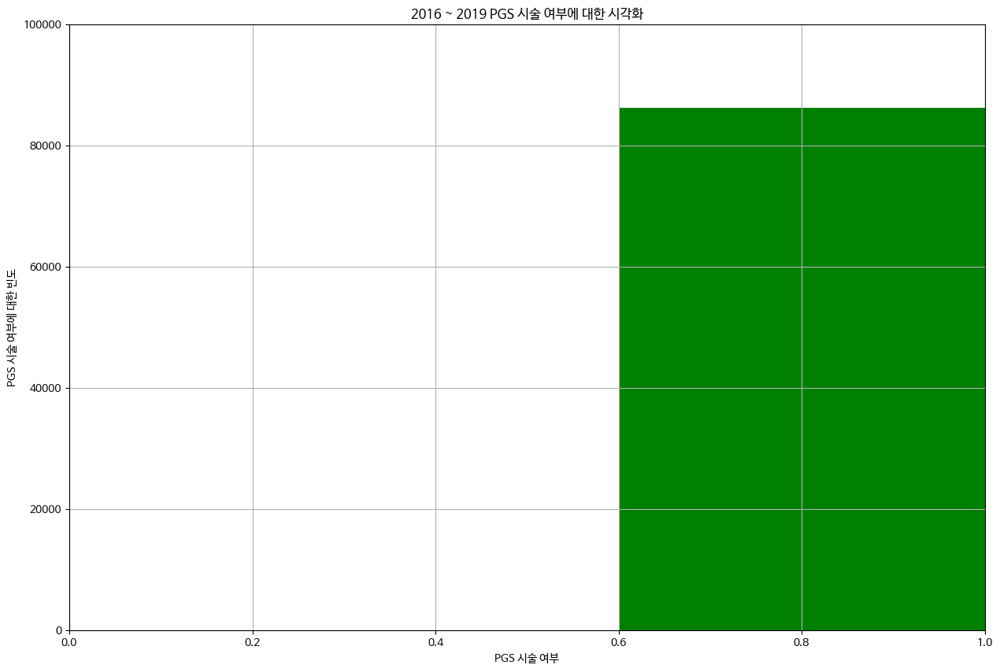

In [ ]:
# PGS 시술 여부
pgs_curse_right = train.groupby(['PGS 시술 여부'])['PGS 시술 여부'].count()
pgs_curse_right = pgs_curse_right.to_frame(name='count')
plt.figure(figsize=(15, 10))
plt.bar(pgs_curse_right.index, pgs_curse_right['count'], color='g')
plt.ylim(0, 100000)
plt.xlim(0, 1)
plt.xlabel('PGS 시술 여부')
plt.ylabel('PGS 시술 여부에 대한 빈도')
plt.title('2016 ~ 2019 PGS 시술 여부에 대한 시각화')
plt.grid()
plt.show()

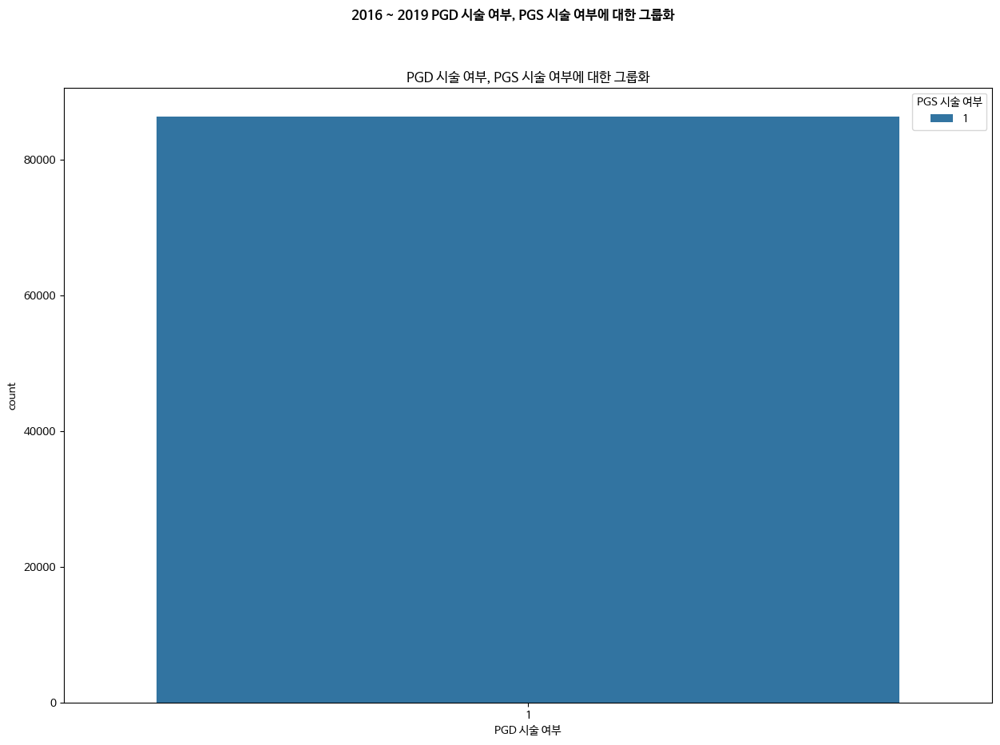

In [ ]:
# PGD 시술 여부, PGS 시술 여부에 대한 그룹화
pgd_pgs_group = train.groupby(['PGD 시술 여부', 'PGS 시술 여부'])['PGS 시술 여부'].count()
pgd_pgs_group = pgd_pgs_group.to_frame(name='count')
pgd_pgs_group = pgd_pgs_group.reset_index()

fig = plt.figure(figsize=(15, 10))
area1 = fig.add_subplot(1, 1, 1)
ax1 = sns.barplot(data=pgd_pgs_group, x='PGD 시술 여부', y='count', hue='PGS 시술 여부', ax=area1)
fig.suptitle('2016 ~ 2019 PGD 시술 여부, PGS 시술 여부에 대한 그룹화', fontweight='bold')
area1.set_title('PGD 시술 여부, PGS 시술 여부에 대한 그룹화')
plt.show()

59. 난자 채취 경과일

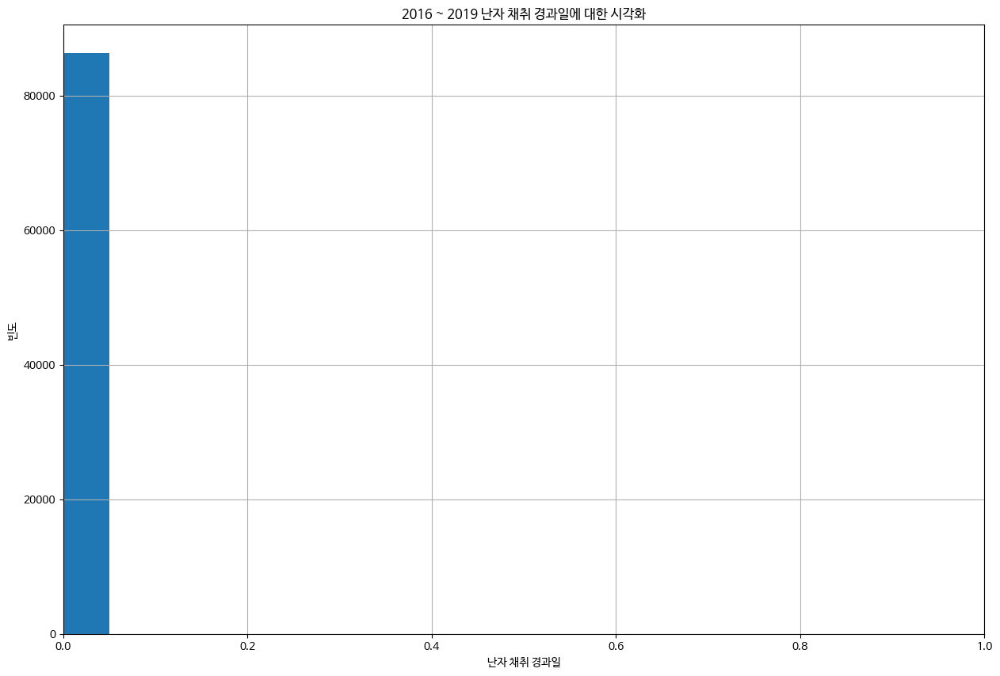

In [ ]:
# 난자 채취 경과일에 대한 시각화
plt.figure(figsize=(15, 10))
plt.hist(train['난자 채취 경과일'], bins=20)
plt.xlim(0, 1)
plt.xlabel('난자 채취 경과일')
plt.ylabel('빈도')
plt.title('2016 ~ 2019 난자 채취 경과일에 대한 시각화')
plt.grid()
plt.show()

60. 난자 해동 경과일

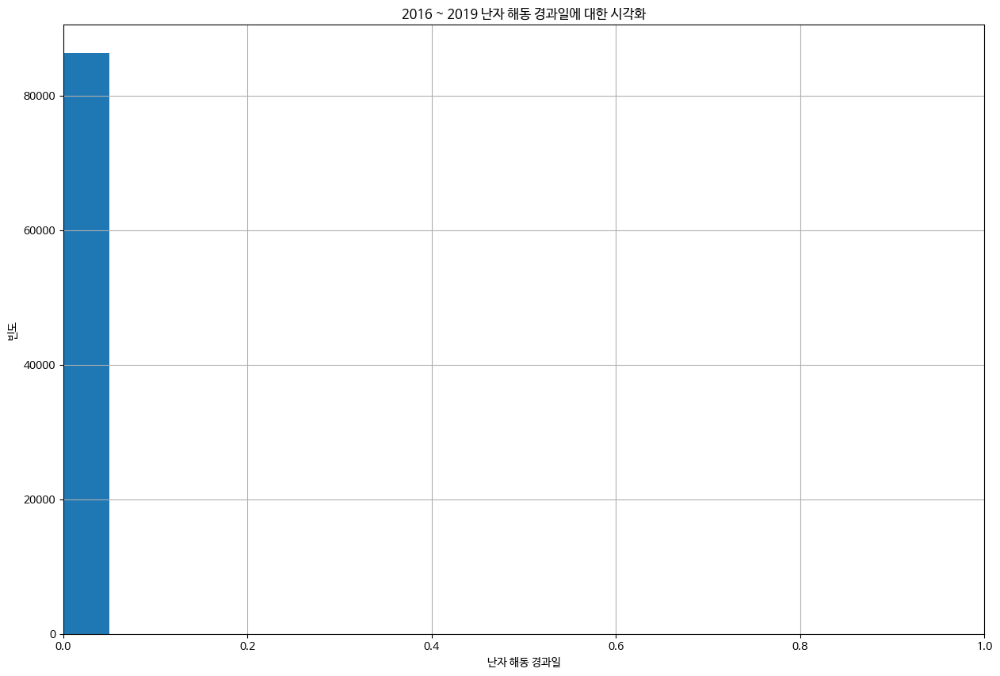

In [ ]:
# 기증자 정자와 혼합된 난자 수에 대한 시각화
plt.figure(figsize=(15, 10))
plt.hist(train['난자 해동 경과일'], bins=20)
plt.xlim(0, 1)
plt.xlabel('난자 해동 경과일')
plt.ylabel('빈도')
plt.title('2016 ~ 2019 난자 해동 경과일에 대한 시각화')
plt.grid()
plt.show()

61. 난자 혼합 경과일

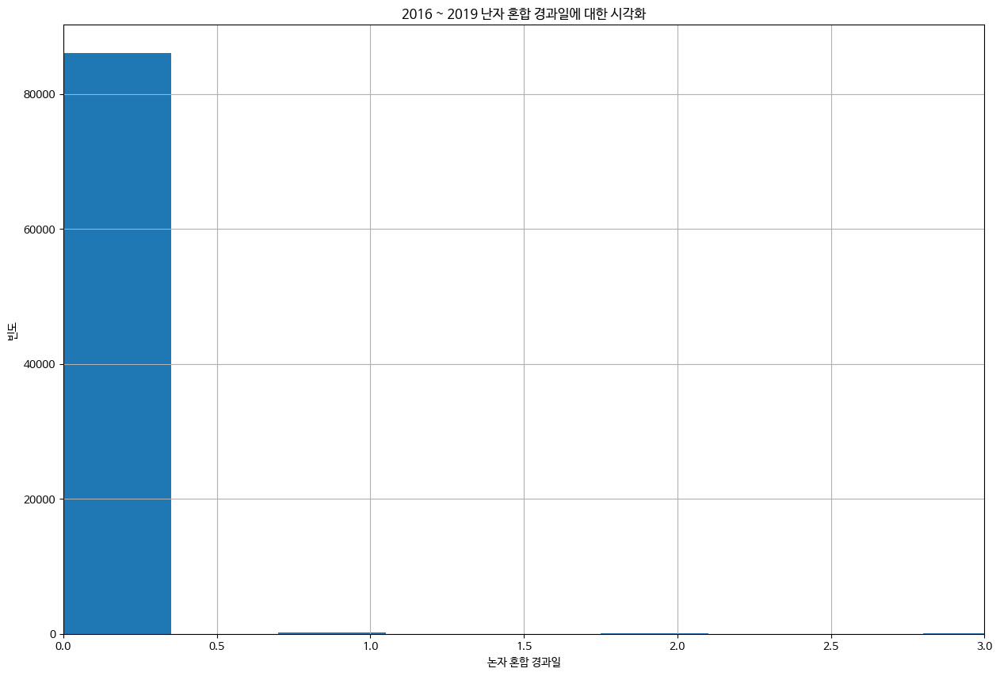

In [ ]:
# 난자 혼합 경과일에 대한 시각화
plt.figure(figsize=(15, 10))
plt.hist(train['난자 혼합 경과일'], bins=20)
plt.xlim(0, 3)
plt.xlabel('논자 혼합 경과일')
plt.ylabel('빈도')
plt.title('2016 ~ 2019 난자 혼합 경과일에 대한 시각화')
plt.grid()
plt.show()

62. 배아 이식 경과일

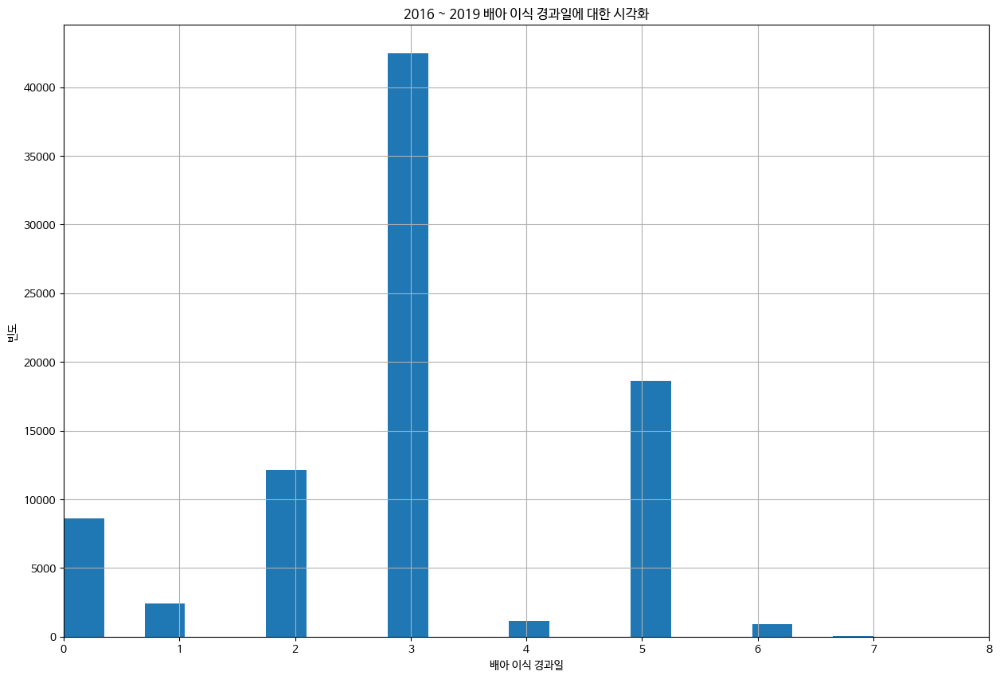

In [ ]:
# 배아 이식 경과일에 대한 시각화
plt.figure(figsize=(15, 10))
plt.hist(train['배아 이식 경과일'], bins=20)
plt.xlim(0, 8)
plt.xlabel('배아 이식 경과일')
plt.ylabel('빈도')
plt.title('2016 ~ 2019 배아 이식 경과일에 대한 시각화')
plt.grid()
plt.show()

63. 배아 해동 경과일

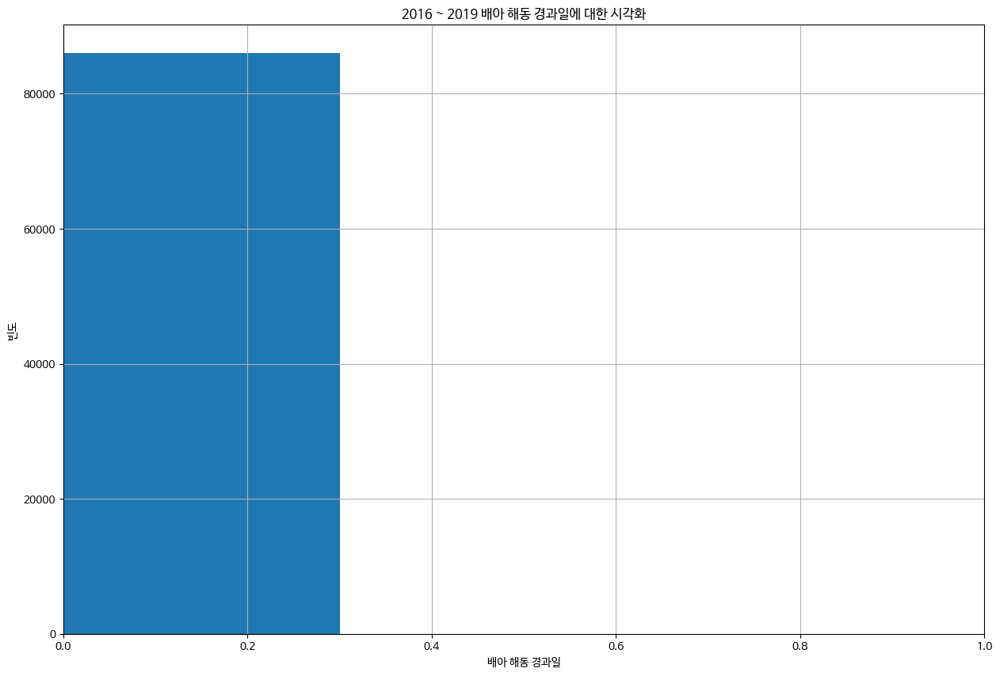

In [ ]:
# 배아 해동 경과일
plt.figure(figsize=(15, 10))
plt.hist(train['배아 해동 경과일'], bins=20)
plt.xlim(0, 1)
plt.xlabel('배아 해동 경과일')
plt.ylabel('빈도')
plt.title('2016 ~ 2019 배아 해동 경과일에 대한 시각화')
plt.grid()
plt.show()

#### 수치형에 대한 산점도 시각화



*   시술 시기 코드



In [ ]:
# 시술시기 코드
# TRCMWS
train_TRCMWS = train.loc[train['시술 시기 코드'] == 'TRCMWS', :]
# TRDQAZ
train_TRDQAZ = train.loc[train['시술 시기 코드'] == 'TRDQAZ', :]
# TRJXFG
train_TRJXFG = train.loc[train['시술 시기 코드'] == 'TRJXFG', :]
# TRVNRY
train_TRVNRY = train.loc[train['시술 시기 코드'] == 'TRVNRY', :]
# TRXQMD
train_TRXQMD = train.loc[train['시술 시기 코드'] == 'TRXQMD', :]
# TRYBLT
train_TRYBLT = train.loc[train['시술 시기 코드'] == 'TRYBLT', :]
# TRZKPL
train_TRZKPL = train.loc[train['시술 시기 코드'] == 'TRZKPL', :]

1. X: 총 생성 배아 수 Y: 저장된 배아 수

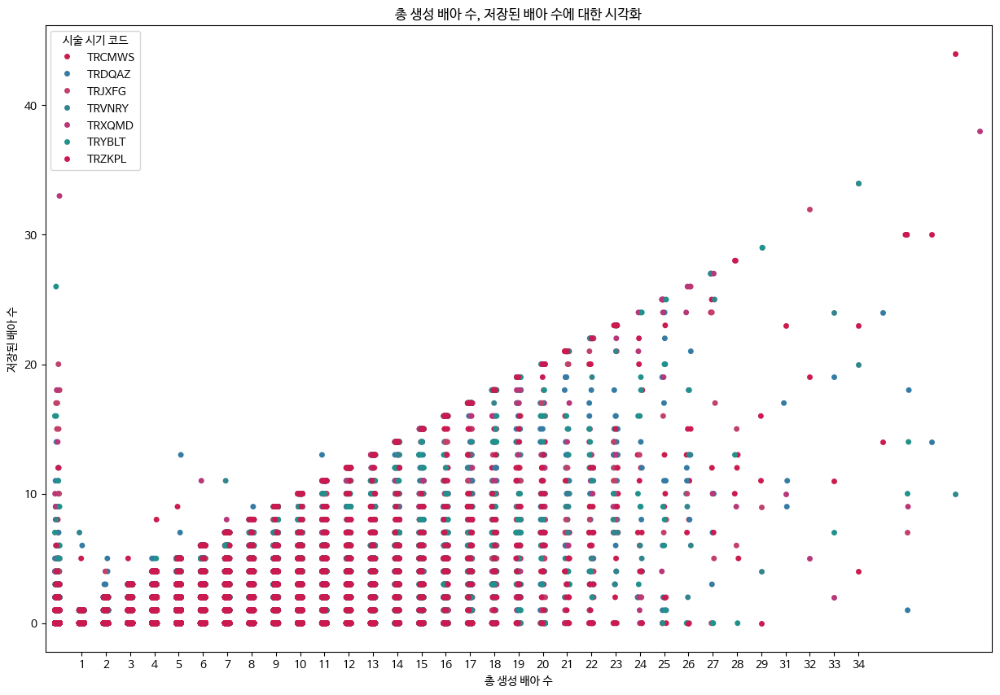

In [ ]:
# 총 배아 수, 저장된 배아 수에 대한 산점도 시각화
plt.figure(figsize=(15, 10))
plt.title('총 생성 배아 수, 저장된 배아 수에 대한 시각화')

sns.stripplot(data=train_TRCMWS, x='총 생성 배아 수', y='저장된 배아 수', hue='시술 시기 코드', palette='rocket')
sns.stripplot(data=train_TRDQAZ, x='총 생성 배아 수', y='저장된 배아 수', hue='시술 시기 코드', palette='mako')
sns.stripplot(data=train_TRJXFG, x='총 생성 배아 수', y='저장된 배아 수', hue='시술 시기 코드', palette='flare')
sns.stripplot(data=train_TRVNRY, x='총 생성 배아 수', y='저장된 배아 수', hue='시술 시기 코드', palette='crest')
sns.stripplot(data=train_TRXQMD, x='총 생성 배아 수', y='저장된 배아 수', hue='시술 시기 코드', palette='magma')
sns.stripplot(data=train_TRYBLT, x='총 생성 배아 수', y='저장된 배아 수', hue='시술 시기 코드', palette='viridis')
sns.stripplot(data=train_TRZKPL, x='총 생성 배아 수', y='저장된 배아 수', hue='시술 시기 코드', palette='rocket_r')

plt.xticks(np.arange(1, 34))
plt.show()

2. 미세주입된 난자 수 vs 미세주입에서 생성된 배아 수

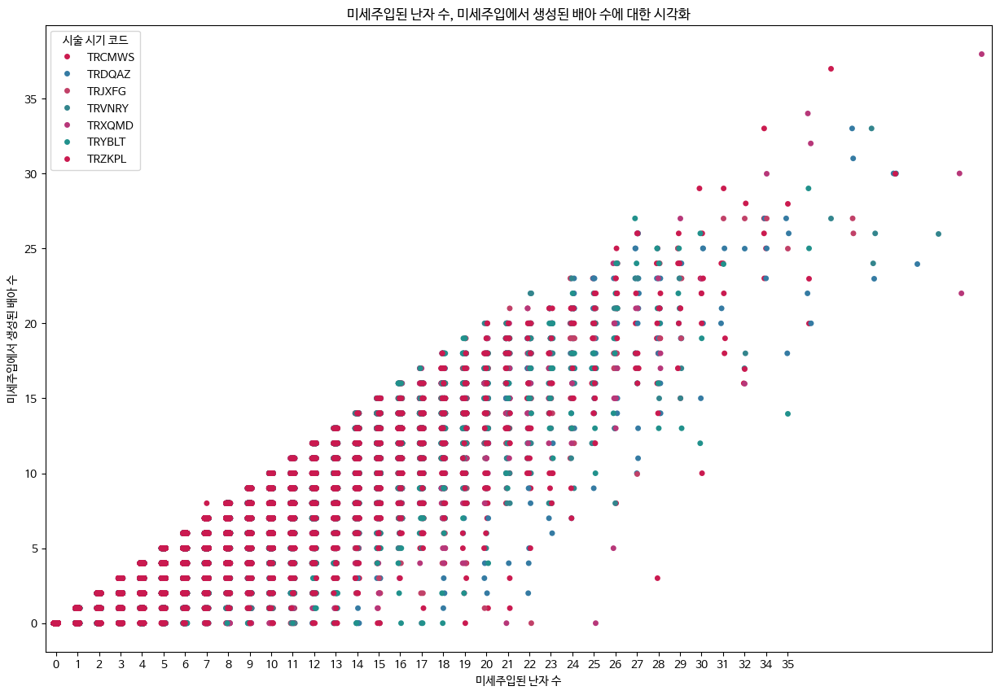

In [ ]:
# 미세주입된 난자 수, 미세주입에서 생성된 배아 수에 대한 산점도 시각화
plt.figure(figsize=(15, 10))
plt.title('미세주입된 난자 수, 미세주입에서 생성된 배아 수에 대한 시각화')

sns.stripplot(data=train_TRCMWS, x='미세주입된 난자 수', y='미세주입에서 생성된 배아 수', hue='시술 시기 코드', palette='rocket')
sns.stripplot(data=train_TRDQAZ, x='미세주입된 난자 수', y='미세주입에서 생성된 배아 수', hue='시술 시기 코드', palette='mako')
sns.stripplot(data=train_TRJXFG, x='미세주입된 난자 수', y='미세주입에서 생성된 배아 수', hue='시술 시기 코드', palette='flare')
sns.stripplot(data=train_TRVNRY, x='미세주입된 난자 수', y='미세주입에서 생성된 배아 수', hue='시술 시기 코드', palette='crest')
sns.stripplot(data=train_TRXQMD, x='미세주입된 난자 수', y='미세주입에서 생성된 배아 수', hue='시술 시기 코드', palette='magma')
sns.stripplot(data=train_TRYBLT, x='미세주입된 난자 수', y='미세주입에서 생성된 배아 수', hue='시술 시기 코드', palette='viridis')
sns.stripplot(data=train_TRZKPL, x='미세주입된 난자 수', y='미세주입에서 생성된 배아 수', hue='시술 시기 코드', palette='rocket_r')

plt.xticks(np.arange(0, 35))
plt.show()

3. 이식된 배아 수 vs 미세주입 배아 이식 수

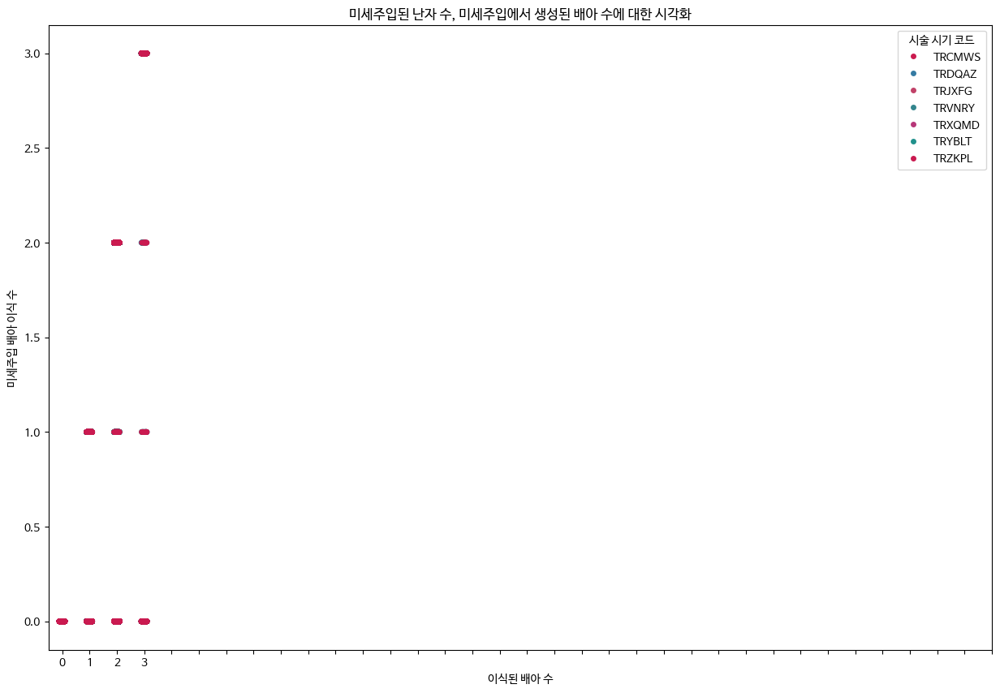

In [ ]:
# 이식된 배아 수 vs 미세주입 배아 이식 수에 대한 산점도 시각화
plt.figure(figsize=(15, 10))
plt.title('미세주입된 난자 수, 미세주입에서 생성된 배아 수에 대한 시각화')

sns.stripplot(data=train_TRCMWS, x='이식된 배아 수', y='미세주입 배아 이식 수', hue='시술 시기 코드', palette='rocket')
sns.stripplot(data=train_TRDQAZ, x='이식된 배아 수', y='미세주입 배아 이식 수', hue='시술 시기 코드', palette='mako')
sns.stripplot(data=train_TRJXFG, x='이식된 배아 수', y='미세주입 배아 이식 수', hue='시술 시기 코드', palette='flare')
sns.stripplot(data=train_TRVNRY, x='이식된 배아 수', y='미세주입 배아 이식 수', hue='시술 시기 코드', palette='crest')
sns.stripplot(data=train_TRXQMD, x='이식된 배아 수', y='미세주입 배아 이식 수', hue='시술 시기 코드', palette='magma')
sns.stripplot(data=train_TRYBLT, x='이식된 배아 수', y='미세주입 배아 이식 수', hue='시술 시기 코드', palette='viridis')
sns.stripplot(data=train_TRZKPL, x='이식된 배아 수', y='미세주입 배아 이식 수', hue='시술 시기 코드', palette='rocket_r')

plt.xticks(np.arange(0, 35))
plt.show()

4. 저장된 배아 수 vs 미세주입 후 저장된 배아 수

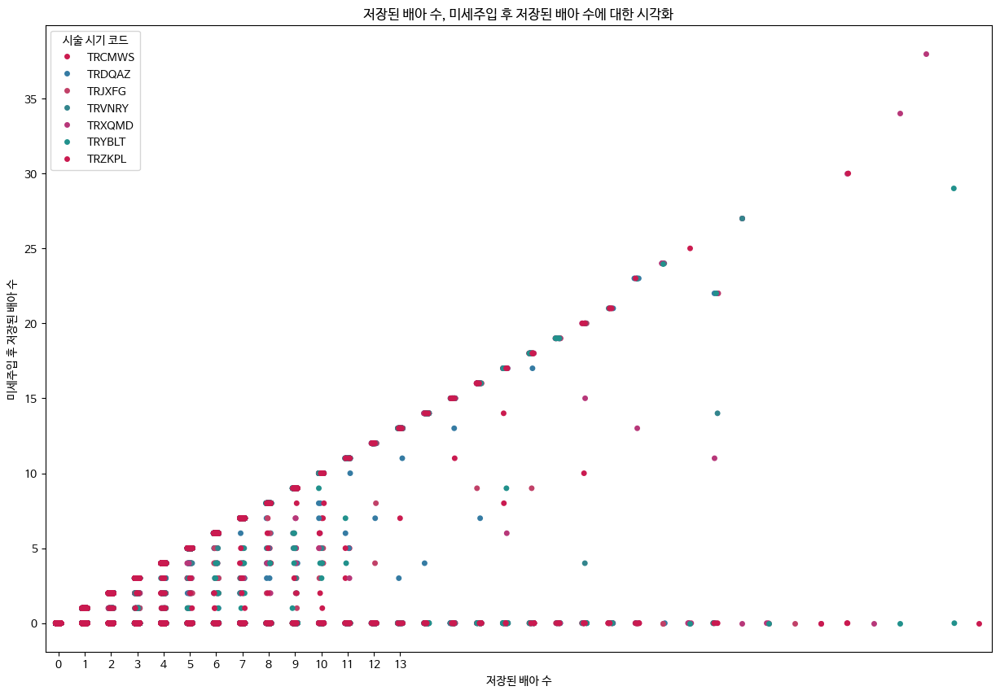

In [ ]:
# 저장된 배아 수 vs 미세주입 후 저장된 배아 수에 대한 산점도 시각화
plt.figure(figsize=(15, 10))
plt.title('저장된 배아 수, 미세주입 후 저장된 배아 수에 대한 시각화')

sns.stripplot(data=train_TRCMWS, x='저장된 배아 수', y='미세주입 후 저장된 배아 수', hue='시술 시기 코드', palette='rocket')
sns.stripplot(data=train_TRDQAZ, x='저장된 배아 수', y='미세주입 후 저장된 배아 수', hue='시술 시기 코드', palette='mako')
sns.stripplot(data=train_TRJXFG, x='저장된 배아 수', y='미세주입 후 저장된 배아 수', hue='시술 시기 코드', palette='flare')
sns.stripplot(data=train_TRVNRY, x='저장된 배아 수', y='미세주입 후 저장된 배아 수', hue='시술 시기 코드', palette='crest')
sns.stripplot(data=train_TRXQMD, x='저장된 배아 수', y='미세주입 후 저장된 배아 수', hue='시술 시기 코드', palette='magma')
sns.stripplot(data=train_TRYBLT, x='저장된 배아 수', y='미세주입 후 저장된 배아 수', hue='시술 시기 코드', palette='viridis')
sns.stripplot(data=train_TRZKPL, x='저장된 배아 수', y='미세주입 후 저장된 배아 수', hue='시술 시기 코드', palette='rocket_r')

plt.xticks(np.arange(0, 14))
plt.show()

5. 해동된 배아 수 vs 해동 난자 수

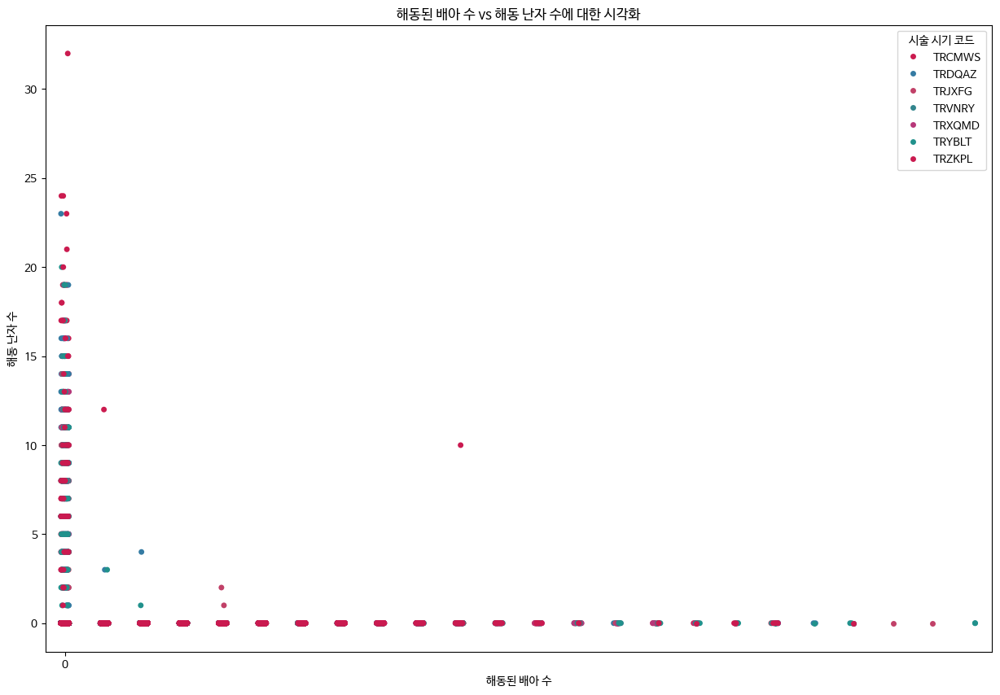

In [ ]:
# 해동된 배아 수 vs 해동 난자 수에 대한 산점도 시각화
plt.figure(figsize=(15, 10))
plt.title('해동된 배아 수 vs 해동 난자 수에 대한 시각화')

sns.stripplot(data=train_TRCMWS, x='해동된 배아 수', y='해동 난자 수', hue='시술 시기 코드', palette='rocket')
sns.stripplot(data=train_TRDQAZ, x='해동된 배아 수', y='해동 난자 수', hue='시술 시기 코드', palette='mako')
sns.stripplot(data=train_TRJXFG, x='해동된 배아 수', y='해동 난자 수', hue='시술 시기 코드', palette='flare')
sns.stripplot(data=train_TRVNRY, x='해동된 배아 수', y='해동 난자 수', hue='시술 시기 코드', palette='crest')
sns.stripplot(data=train_TRXQMD, x='해동된 배아 수', y='해동 난자 수', hue='시술 시기 코드', palette='magma')
sns.stripplot(data=train_TRYBLT, x='해동된 배아 수', y='해동 난자 수', hue='시술 시기 코드', palette='viridis')
sns.stripplot(data=train_TRZKPL, x='해동된 배아 수', y='해동 난자 수', hue='시술 시기 코드', palette='rocket_r')

plt.xticks(np.arange(0, 1))
plt.show()

6. 수집된 신선 난자 수 vs 저장된 신선 난자 수

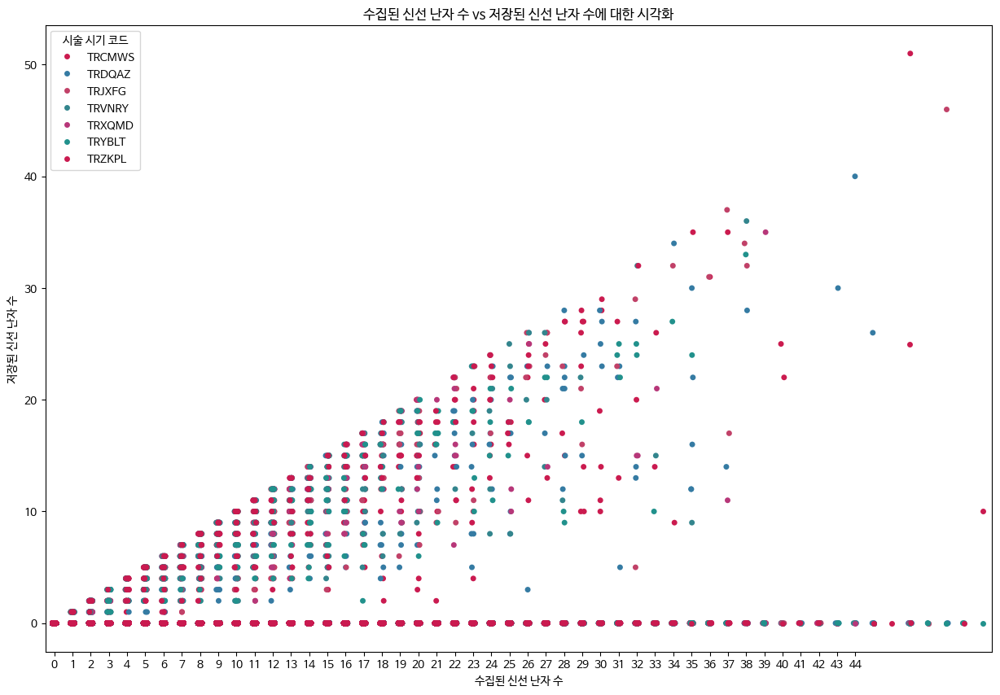

In [ ]:
# 수집된 신선 난자 수 vs 저장된 신선 난자 수에 대한 산점도 시각화
plt.figure(figsize=(15, 10))
plt.title('수집된 신선 난자 수 vs 저장된 신선 난자 수에 대한 시각화')

sns.stripplot(data=train_TRCMWS, x='수집된 신선 난자 수', y='저장된 신선 난자 수', hue='시술 시기 코드', palette='rocket')
sns.stripplot(data=train_TRDQAZ, x='수집된 신선 난자 수', y='저장된 신선 난자 수', hue='시술 시기 코드', palette='mako')
sns.stripplot(data=train_TRJXFG, x='수집된 신선 난자 수', y='저장된 신선 난자 수', hue='시술 시기 코드', palette='flare')
sns.stripplot(data=train_TRVNRY, x='수집된 신선 난자 수', y='저장된 신선 난자 수', hue='시술 시기 코드', palette='crest')
sns.stripplot(data=train_TRXQMD, x='수집된 신선 난자 수', y='저장된 신선 난자 수', hue='시술 시기 코드', palette='magma')
sns.stripplot(data=train_TRYBLT, x='수집된 신선 난자 수', y='저장된 신선 난자 수', hue='시술 시기 코드', palette='viridis')
sns.stripplot(data=train_TRZKPL, x='수집된 신선 난자 수', y='저장된 신선 난자 수', hue='시술 시기 코드', palette='rocket_r')

plt.xticks(np.arange(0, 45))
plt.show()

7. 혼합된 난자 수 vs 파트너 정자와 혼합된 난자 수

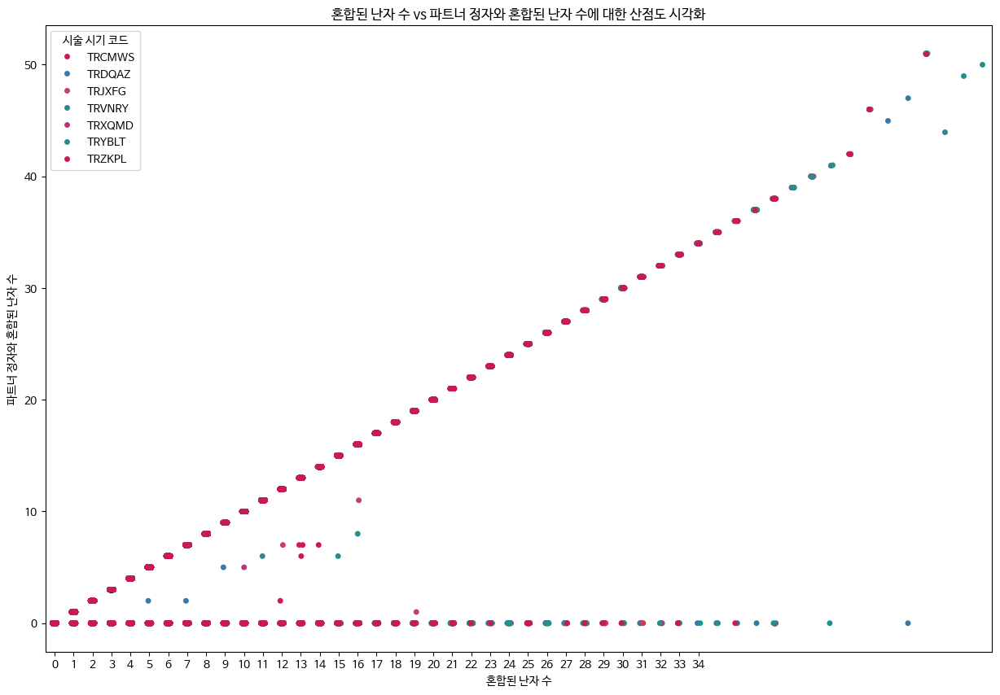

In [ ]:
# 혼합된 난자 수 vs 파트너 정자와 혼합된 난자 수에 대한 산점도 시각화
plt.figure(figsize=(15, 10))
plt.title('혼합된 난자 수 vs 파트너 정자와 혼합된 난자 수에 대한 산점도 시각화')

sns.stripplot(data=train_TRCMWS, x='혼합된 난자 수', y='파트너 정자와 혼합된 난자 수', hue='시술 시기 코드', palette='rocket')
sns.stripplot(data=train_TRDQAZ, x='혼합된 난자 수', y='파트너 정자와 혼합된 난자 수', hue='시술 시기 코드', palette='mako')
sns.stripplot(data=train_TRJXFG, x='혼합된 난자 수', y='파트너 정자와 혼합된 난자 수', hue='시술 시기 코드', palette='flare')
sns.stripplot(data=train_TRVNRY, x='혼합된 난자 수', y='파트너 정자와 혼합된 난자 수', hue='시술 시기 코드', palette='crest')
sns.stripplot(data=train_TRXQMD, x='혼합된 난자 수', y='파트너 정자와 혼합된 난자 수', hue='시술 시기 코드', palette='magma')
sns.stripplot(data=train_TRYBLT, x='혼합된 난자 수', y='파트너 정자와 혼합된 난자 수', hue='시술 시기 코드', palette='viridis')
sns.stripplot(data=train_TRZKPL, x='혼합된 난자 수', y='파트너 정자와 혼합된 난자 수', hue='시술 시기 코드', palette='rocket_r')

plt.xticks(np.arange(0, 35))
plt.show()

8. 혼합된 난자 수 vs 기증자 정자와 혼합된 난자 수

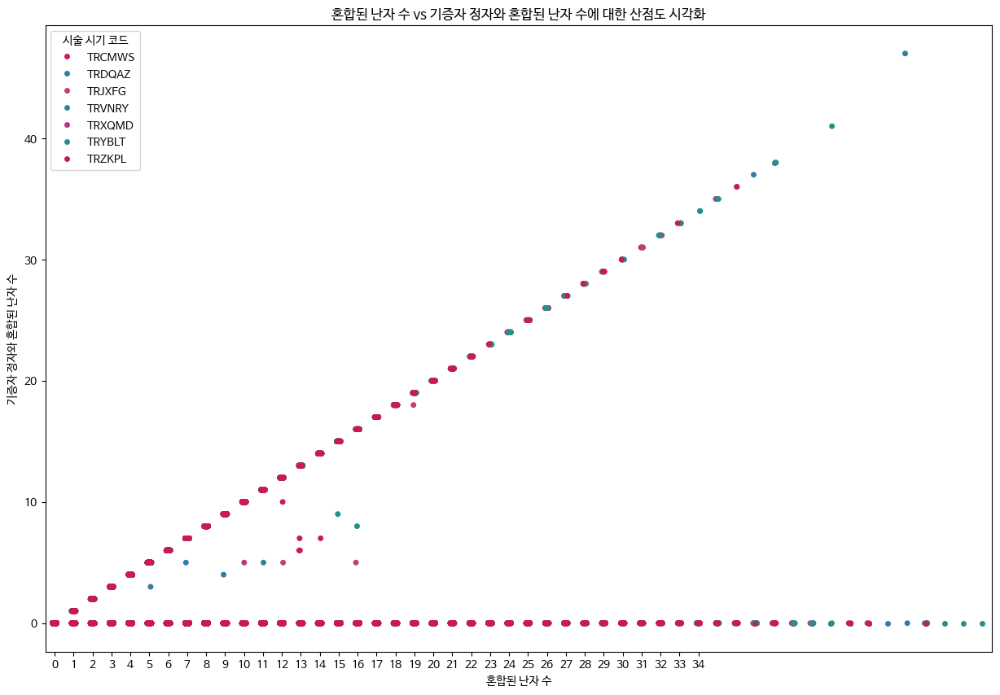

In [ ]:
# 혼합된 난자 수 vs 기증자 정자와 혼합된 난자 수에 대한 산점도 시각화
plt.figure(figsize=(15, 10))
plt.title('혼합된 난자 수 vs 기증자 정자와 혼합된 난자 수에 대한 산점도 시각화')

sns.stripplot(data=train_TRCMWS, x='혼합된 난자 수', y='기증자 정자와 혼합된 난자 수', hue='시술 시기 코드', palette='rocket')
sns.stripplot(data=train_TRDQAZ, x='혼합된 난자 수', y='기증자 정자와 혼합된 난자 수', hue='시술 시기 코드', palette='mako')
sns.stripplot(data=train_TRJXFG, x='혼합된 난자 수', y='기증자 정자와 혼합된 난자 수', hue='시술 시기 코드', palette='flare')
sns.stripplot(data=train_TRVNRY, x='혼합된 난자 수', y='기증자 정자와 혼합된 난자 수', hue='시술 시기 코드', palette='crest')
sns.stripplot(data=train_TRXQMD, x='혼합된 난자 수', y='기증자 정자와 혼합된 난자 수', hue='시술 시기 코드', palette='magma')
sns.stripplot(data=train_TRYBLT, x='혼합된 난자 수', y='기증자 정자와 혼합된 난자 수', hue='시술 시기 코드', palette='viridis')
sns.stripplot(data=train_TRZKPL, x='혼합된 난자 수', y='기증자 정자와 혼합된 난자 수', hue='시술 시기 코드', palette='rocket_r')

plt.xticks(np.arange(0, 35))
plt.show()

9. 난자 해동 경과일 vs 난자 혼합 경과일

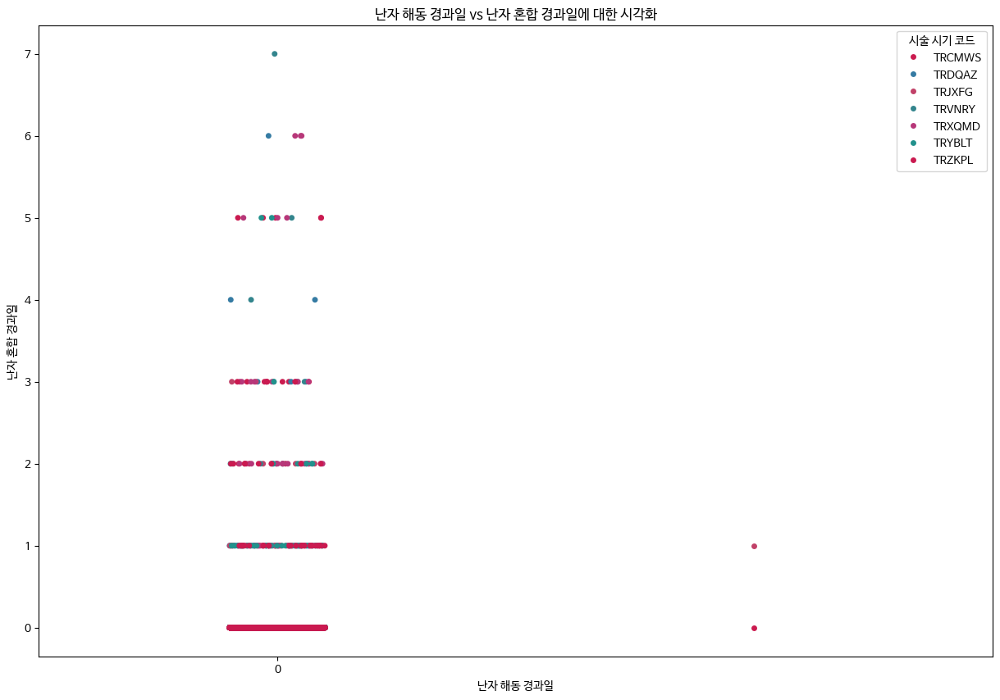

In [ ]:
# 난자 해동 경과일 vs 난자 혼합 경과일에 대한 산점도 시각화
plt.figure(figsize=(15, 10))
plt.title('난자 해동 경과일 vs 난자 혼합 경과일에 대한 시각화')

sns.stripplot(data=train_TRCMWS, x='난자 해동 경과일', y='난자 혼합 경과일', hue='시술 시기 코드', palette='rocket')
sns.stripplot(data=train_TRDQAZ, x='난자 해동 경과일', y='난자 혼합 경과일', hue='시술 시기 코드', palette='mako')
sns.stripplot(data=train_TRJXFG, x='난자 해동 경과일', y='난자 혼합 경과일', hue='시술 시기 코드', palette='flare')
sns.stripplot(data=train_TRVNRY, x='난자 해동 경과일', y='난자 혼합 경과일', hue='시술 시기 코드', palette='crest')
sns.stripplot(data=train_TRXQMD, x='난자 해동 경과일', y='난자 혼합 경과일', hue='시술 시기 코드', palette='magma')
sns.stripplot(data=train_TRYBLT, x='난자 해동 경과일', y='난자 혼합 경과일', hue='시술 시기 코드', palette='viridis')
sns.stripplot(data=train_TRZKPL, x='난자 해동 경과일', y='난자 혼합 경과일', hue='시술 시기 코드', palette='rocket_r')

plt.xticks(np.arange(0, 1))
plt.show()

10. 난자 채취 경과일 vs 난자 혼합 경과일

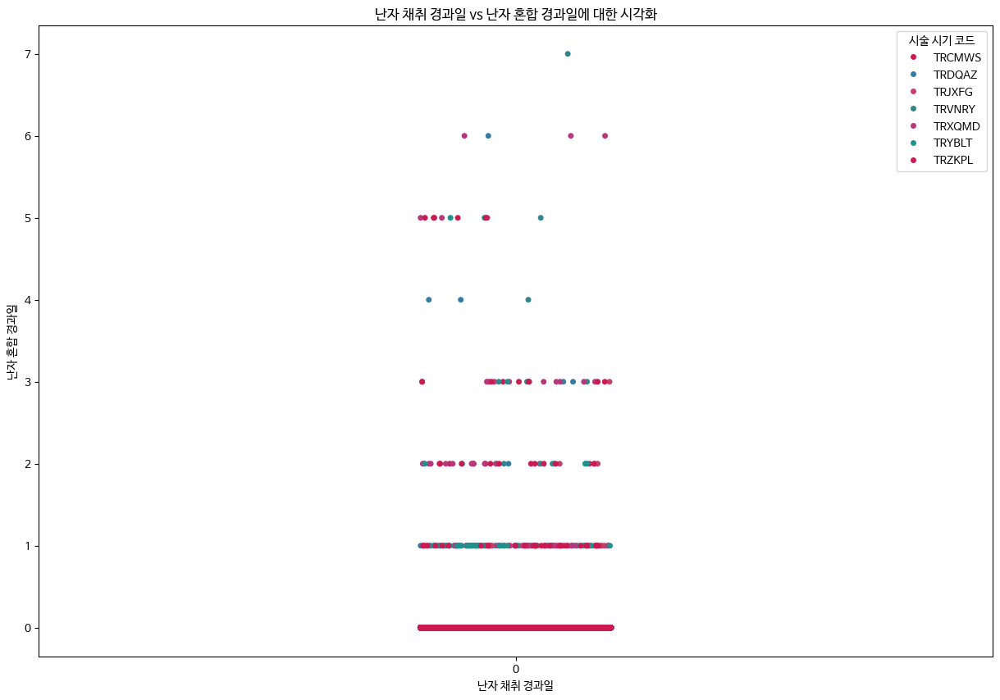

In [ ]:
# 난자 채취 경과일 vs 난자 혼합 경과일에 대한 산점도 시각화
plt.figure(figsize=(15, 10))
plt.title('난자 채취 경과일 vs 난자 혼합 경과일에 대한 시각화')

sns.stripplot(data=train_TRCMWS, x='난자 채취 경과일', y='난자 혼합 경과일', hue='시술 시기 코드', palette='rocket')
sns.stripplot(data=train_TRDQAZ, x='난자 채취 경과일', y='난자 혼합 경과일', hue='시술 시기 코드', palette='mako')
sns.stripplot(data=train_TRJXFG, x='난자 채취 경과일', y='난자 혼합 경과일', hue='시술 시기 코드', palette='flare')
sns.stripplot(data=train_TRVNRY, x='난자 채취 경과일', y='난자 혼합 경과일', hue='시술 시기 코드', palette='crest')
sns.stripplot(data=train_TRXQMD, x='난자 채취 경과일', y='난자 혼합 경과일', hue='시술 시기 코드', palette='magma')
sns.stripplot(data=train_TRYBLT, x='난자 채취 경과일', y='난자 혼합 경과일', hue='시술 시기 코드', palette='viridis')
sns.stripplot(data=train_TRZKPL, x='난자 채취 경과일', y='난자 혼합 경과일', hue='시술 시기 코드', palette='rocket_r')

plt.xticks(np.arange(0, 1))
plt.show()



*   시술 당시 나이



In [ ]:
# 시술 당시 나이
# 만18~34세
train_18_34 = train.loc[train['시술 당시 나이'] == '만18-34세', :]
# 만35~37세
train_35_37 = train.loc[train['시술 당시 나이'] == '만35-37세', :]
# 만38~39세
train_38_39 = train.loc[train['시술 당시 나이'] == '만38-39세', :]
# 만40~42세
train_40_42 = train.loc[train['시술 당시 나이'] == '만40-42세', :]
# 만43~44세
train_43_44 = train.loc[train['시술 당시 나이'] == '만43-44세', :]
# 만45~50세
train_45_50 = train.loc[train['시술 당시 나이'] == '만45-50세', :]

1. X: 총 생성 배아 수 Y: 저장된 배아 수

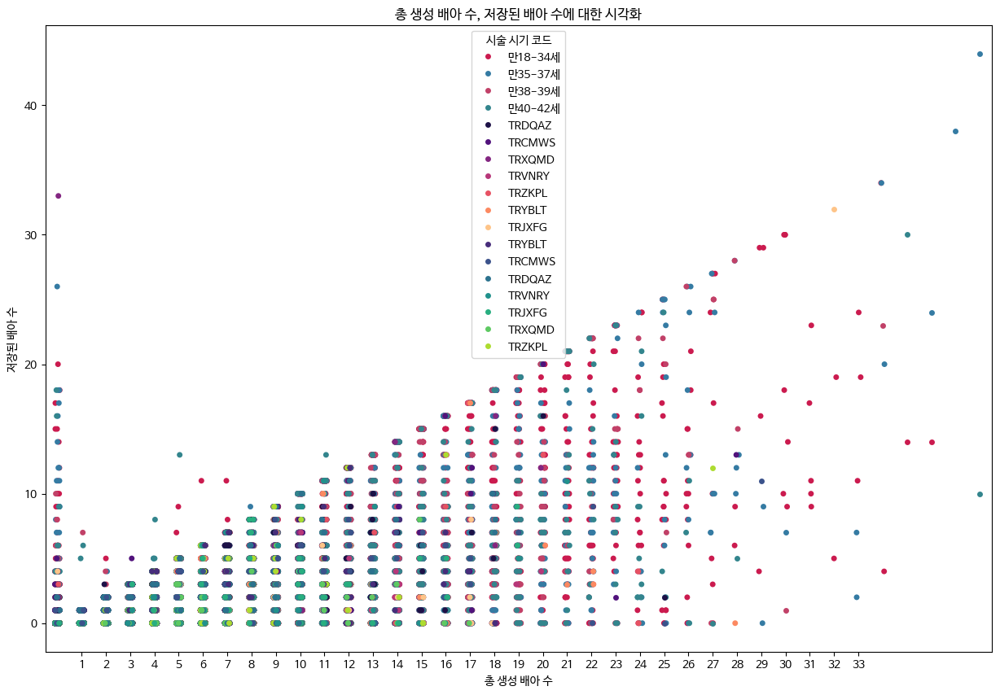

In [ ]:
# 총 배아 수, 저장된 배아 수에 대한 산점도 시각화
plt.figure(figsize=(15, 10))
plt.title('총 생성 배아 수, 저장된 배아 수에 대한 시각화')

sns.stripplot(data=train_18_34, x='총 생성 배아 수', y='저장된 배아 수', hue='시술 당시 나이', palette='rocket')
sns.stripplot(data=train_35_37, x='총 생성 배아 수', y='저장된 배아 수', hue='시술 당시 나이', palette='mako')
sns.stripplot(data=train_38_39, x='총 생성 배아 수', y='저장된 배아 수', hue='시술 당시 나이', palette='flare')
sns.stripplot(data=train_40_42, x='총 생성 배아 수', y='저장된 배아 수', hue='시술 당시 나이', palette='crest')
sns.stripplot(data=train_43_44, x='총 생성 배아 수', y='저장된 배아 수', hue='시술 시기 코드', palette='magma')
sns.stripplot(data=train_45_50, x='총 생성 배아 수', y='저장된 배아 수', hue='시술 시기 코드', palette='viridis')

plt.xticks(np.arange(1, 34))
plt.show()

2. 미세주입된 난자 수 vs 미세주입에서 생성된 배아 수

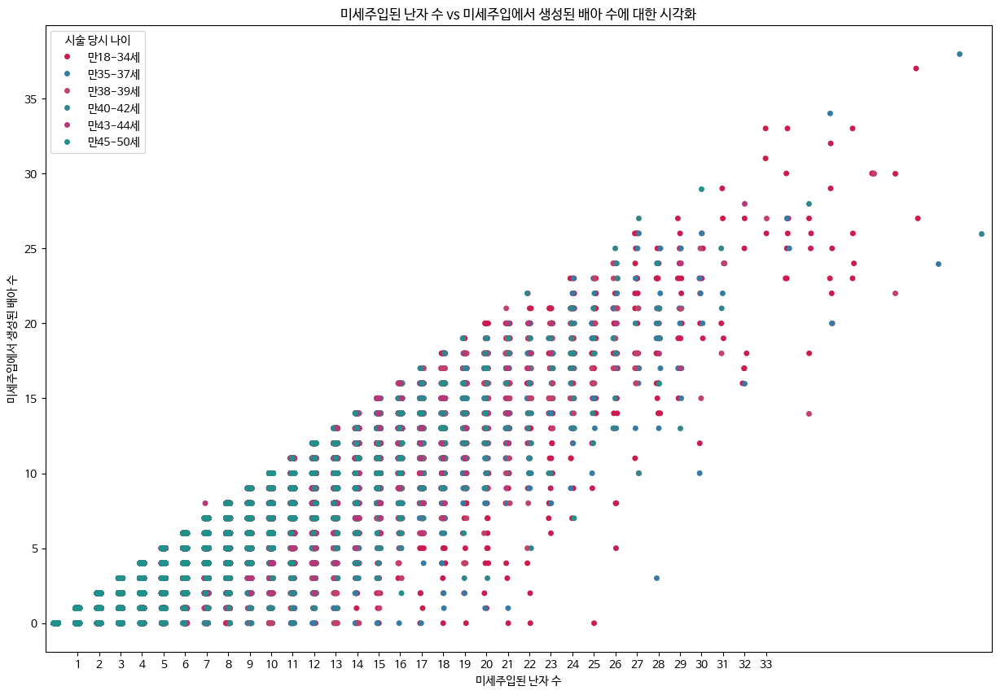

In [ ]:
# 미세주입된 난자 수 vs 미세주입에서 생성된 배아 수에 대한 산점도 시각화
plt.figure(figsize=(15, 10))
plt.title('미세주입된 난자 수 vs 미세주입에서 생성된 배아 수에 대한 시각화')

sns.stripplot(data=train_18_34, x='미세주입된 난자 수', y='미세주입에서 생성된 배아 수', hue='시술 당시 나이', palette='rocket')
sns.stripplot(data=train_35_37, x='미세주입된 난자 수', y='미세주입에서 생성된 배아 수', hue='시술 당시 나이', palette='mako')
sns.stripplot(data=train_38_39, x='미세주입된 난자 수', y='미세주입에서 생성된 배아 수', hue='시술 당시 나이', palette='flare')
sns.stripplot(data=train_40_42, x='미세주입된 난자 수', y='미세주입에서 생성된 배아 수', hue='시술 당시 나이', palette='crest')
sns.stripplot(data=train_43_44, x='미세주입된 난자 수', y='미세주입에서 생성된 배아 수', hue='시술 당시 나이', palette='magma')
sns.stripplot(data=train_45_50, x='미세주입된 난자 수', y='미세주입에서 생성된 배아 수', hue='시술 당시 나이', palette='viridis')

plt.xticks(np.arange(1, 34))
plt.show()

3. 이식된 배아 수 vs 미세주입 배아 이식 수

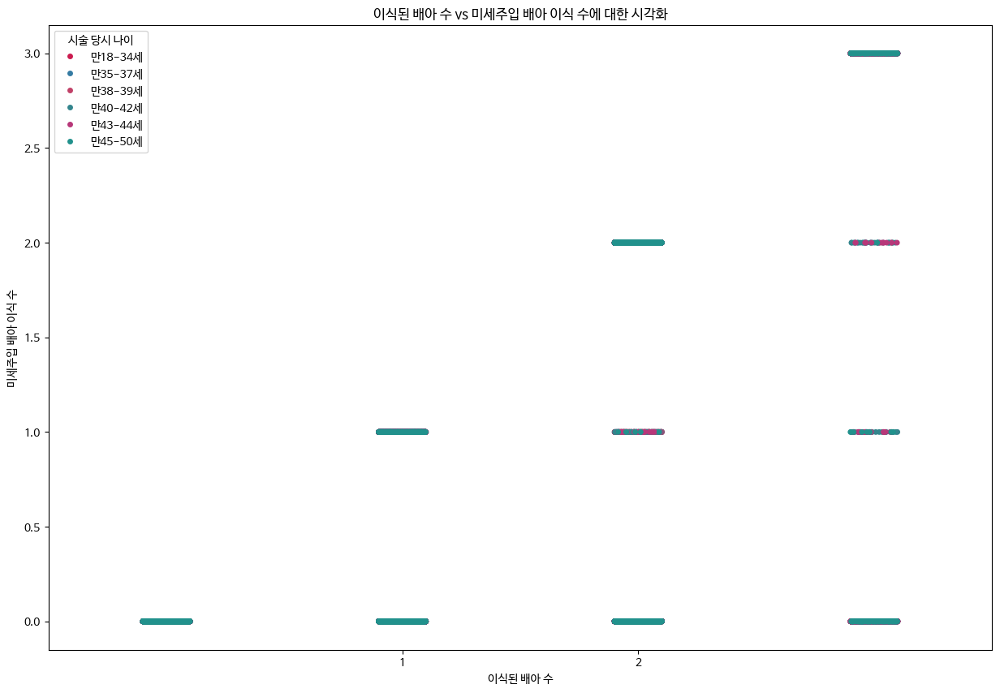

In [ ]:
# 이식된 배아 수 vs 미세주입 배아 이식 수에 대한 산점도 시각화
plt.figure(figsize=(15, 10))
plt.title('이식된 배아 수 vs 미세주입 배아 이식 수에 대한 시각화')

sns.stripplot(data=train_18_34, x='이식된 배아 수', y='미세주입 배아 이식 수', hue='시술 당시 나이', palette='rocket')
sns.stripplot(data=train_35_37, x='이식된 배아 수', y='미세주입 배아 이식 수', hue='시술 당시 나이', palette='mako')
sns.stripplot(data=train_38_39, x='이식된 배아 수', y='미세주입 배아 이식 수', hue='시술 당시 나이', palette='flare')
sns.stripplot(data=train_40_42, x='이식된 배아 수', y='미세주입 배아 이식 수', hue='시술 당시 나이', palette='crest')
sns.stripplot(data=train_43_44, x='이식된 배아 수', y='미세주입 배아 이식 수', hue='시술 당시 나이', palette='magma')
sns.stripplot(data=train_45_50, x='이식된 배아 수', y='미세주입 배아 이식 수', hue='시술 당시 나이', palette='viridis')

plt.xticks(np.arange(1, 3))
plt.show()

4. 저장된 배아 수 vs 미세주입 후 저장된 배아 수

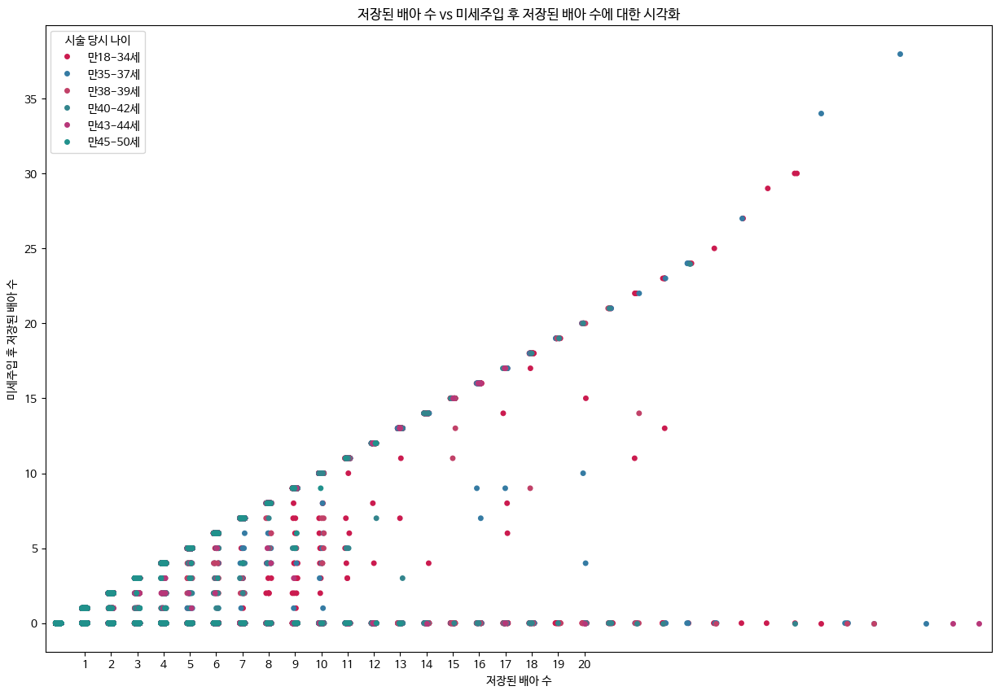

In [ ]:
# 저장된 배아 수 vs 미세주입 후 저장된 배아 수에 대한 산점도 시각화
plt.figure(figsize=(15, 10))
plt.title('저장된 배아 수 vs 미세주입 후 저장된 배아 수에 대한 시각화')

sns.stripplot(data=train_18_34, x='저장된 배아 수', y='미세주입 후 저장된 배아 수', hue='시술 당시 나이', palette='rocket')
sns.stripplot(data=train_35_37, x='저장된 배아 수', y='미세주입 후 저장된 배아 수', hue='시술 당시 나이', palette='mako')
sns.stripplot(data=train_38_39, x='저장된 배아 수', y='미세주입 후 저장된 배아 수', hue='시술 당시 나이', palette='flare')
sns.stripplot(data=train_40_42, x='저장된 배아 수', y='미세주입 후 저장된 배아 수', hue='시술 당시 나이', palette='crest')
sns.stripplot(data=train_43_44, x='저장된 배아 수', y='미세주입 후 저장된 배아 수', hue='시술 당시 나이', palette='magma')
sns.stripplot(data=train_45_50, x='저장된 배아 수', y='미세주입 후 저장된 배아 수', hue='시술 당시 나이', palette='viridis')

plt.xticks(np.arange(1, 21))
plt.show()

5. 해동된 배아 수 vs 해동 난자 수

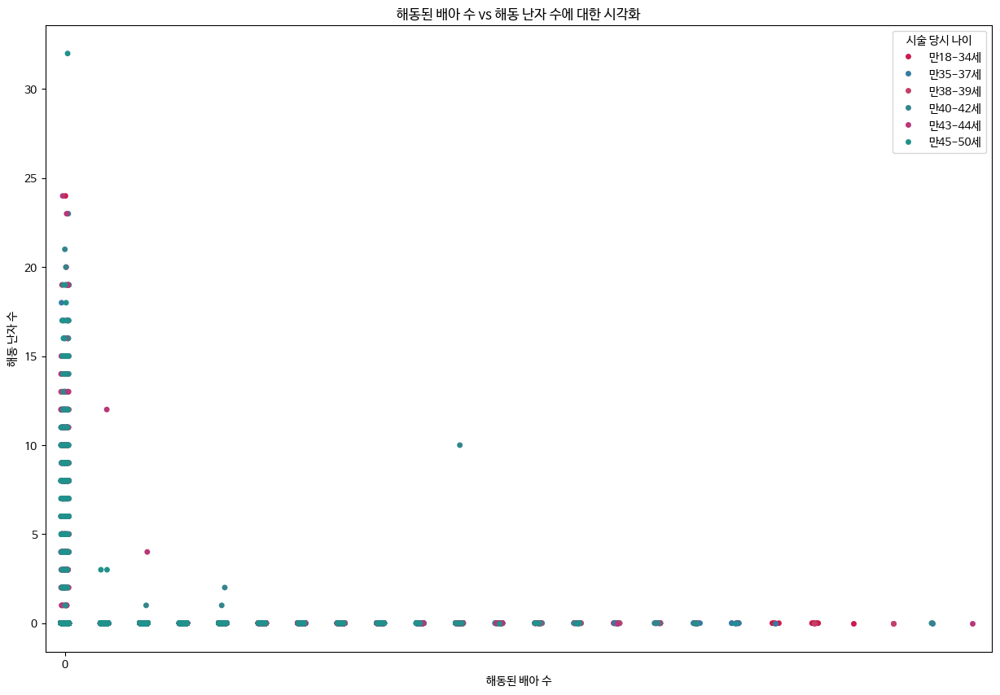

In [ ]:
# 해동된 배아 수 vs 해동 난자 수에 대한 산점도 시각화
plt.figure(figsize=(15, 10))
plt.title('해동된 배아 수 vs 해동 난자 수에 대한 시각화')

sns.stripplot(data=train_18_34, x='해동된 배아 수', y='해동 난자 수', hue='시술 당시 나이', palette='rocket')
sns.stripplot(data=train_35_37, x='해동된 배아 수', y='해동 난자 수', hue='시술 당시 나이', palette='mako')
sns.stripplot(data=train_38_39, x='해동된 배아 수', y='해동 난자 수', hue='시술 당시 나이', palette='flare')
sns.stripplot(data=train_40_42, x='해동된 배아 수', y='해동 난자 수', hue='시술 당시 나이', palette='crest')
sns.stripplot(data=train_43_44, x='해동된 배아 수', y='해동 난자 수', hue='시술 당시 나이', palette='magma')
sns.stripplot(data=train_45_50, x='해동된 배아 수', y='해동 난자 수', hue='시술 당시 나이', palette='viridis')

plt.xticks(np.arange(0, 1))
plt.show()

6. 수집된 신선 난자 수 vs 저장된 신선 난자 수

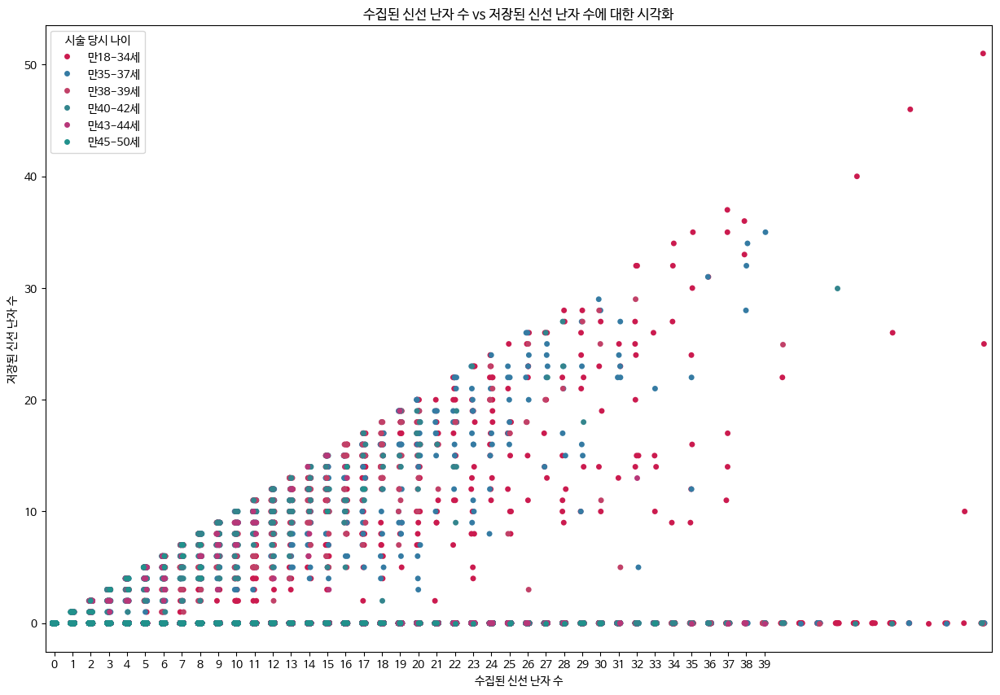

In [ ]:
# 수집된 신선 난자 수 vs 저장된 신선 난자 수에 대한 산점도 시각화
plt.figure(figsize=(15, 10))
plt.title('수집된 신선 난자 수 vs 저장된 신선 난자 수에 대한 시각화')

sns.stripplot(data=train_18_34, x='수집된 신선 난자 수', y='저장된 신선 난자 수', hue='시술 당시 나이', palette='rocket')
sns.stripplot(data=train_35_37, x='수집된 신선 난자 수', y='저장된 신선 난자 수', hue='시술 당시 나이', palette='mako')
sns.stripplot(data=train_38_39, x='수집된 신선 난자 수', y='저장된 신선 난자 수', hue='시술 당시 나이', palette='flare')
sns.stripplot(data=train_40_42, x='수집된 신선 난자 수', y='저장된 신선 난자 수', hue='시술 당시 나이', palette='crest')
sns.stripplot(data=train_43_44, x='수집된 신선 난자 수', y='저장된 신선 난자 수', hue='시술 당시 나이', palette='magma')
sns.stripplot(data=train_45_50, x='수집된 신선 난자 수', y='저장된 신선 난자 수', hue='시술 당시 나이', palette='viridis')

plt.xticks(np.arange(0, 40))
plt.show()

7. 혼합된 난자 수 vs 파트너 정자와 혼합된 난자 수

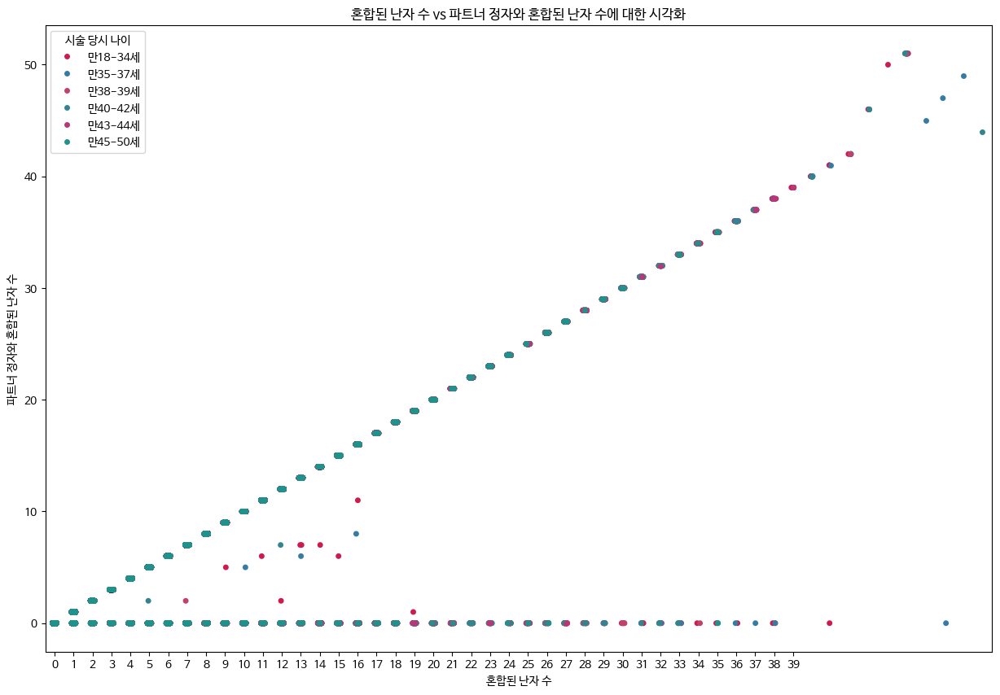

In [ ]:
# 혼합된 난자 수 vs 파트너 정자와 혼합된 난자 수에 대한 산점도 시각화
plt.figure(figsize=(15, 10))
plt.title('혼합된 난자 수 vs 파트너 정자와 혼합된 난자 수에 대한 시각화')

sns.stripplot(data=train_18_34, x='혼합된 난자 수', y='파트너 정자와 혼합된 난자 수', hue='시술 당시 나이', palette='rocket')
sns.stripplot(data=train_35_37, x='혼합된 난자 수', y='파트너 정자와 혼합된 난자 수', hue='시술 당시 나이', palette='mako')
sns.stripplot(data=train_38_39, x='혼합된 난자 수', y='파트너 정자와 혼합된 난자 수', hue='시술 당시 나이', palette='flare')
sns.stripplot(data=train_40_42, x='혼합된 난자 수', y='파트너 정자와 혼합된 난자 수', hue='시술 당시 나이', palette='crest')
sns.stripplot(data=train_43_44, x='혼합된 난자 수', y='파트너 정자와 혼합된 난자 수', hue='시술 당시 나이', palette='magma')
sns.stripplot(data=train_45_50, x='혼합된 난자 수', y='파트너 정자와 혼합된 난자 수', hue='시술 당시 나이', palette='viridis')

plt.xticks(np.arange(0, 40))
plt.show()

8. 혼합된 난자 수 vs 기증자 정자와 혼합된 난자 수

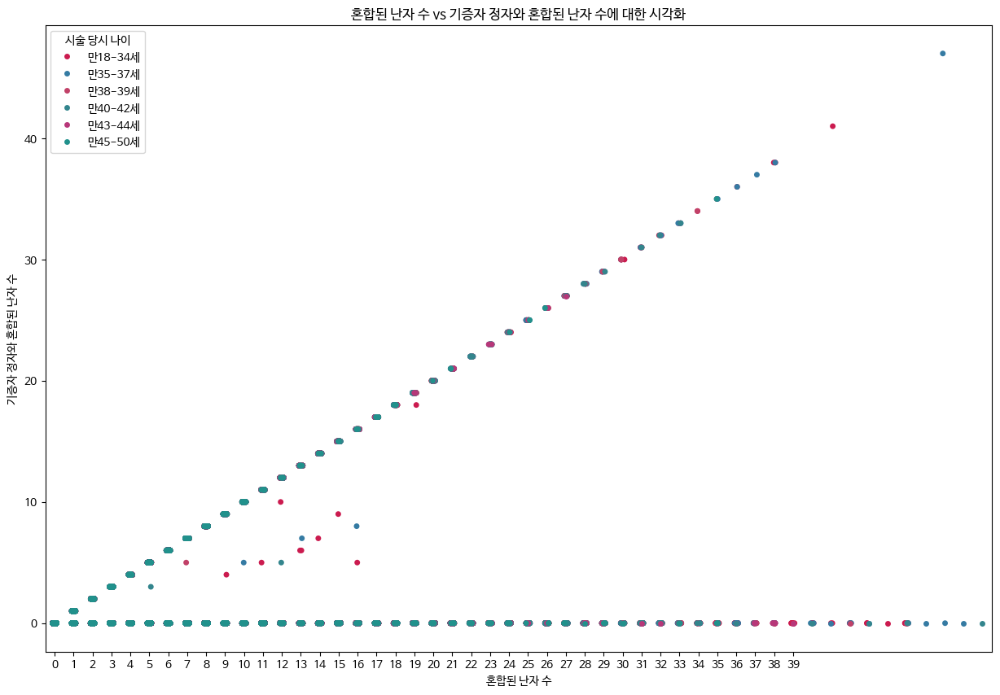

In [ ]:
# 혼합된 난자 수 vs 기증자 정자와 혼합된 난자 수에 대한 산점도 시각화
plt.figure(figsize=(15, 10))
plt.title('혼합된 난자 수 vs 기증자 정자와 혼합된 난자 수에 대한 시각화')

sns.stripplot(data=train_18_34, x='혼합된 난자 수', y='기증자 정자와 혼합된 난자 수', hue='시술 당시 나이', palette='rocket')
sns.stripplot(data=train_35_37, x='혼합된 난자 수', y='기증자 정자와 혼합된 난자 수', hue='시술 당시 나이', palette='mako')
sns.stripplot(data=train_38_39, x='혼합된 난자 수', y='기증자 정자와 혼합된 난자 수', hue='시술 당시 나이', palette='flare')
sns.stripplot(data=train_40_42, x='혼합된 난자 수', y='기증자 정자와 혼합된 난자 수', hue='시술 당시 나이', palette='crest')
sns.stripplot(data=train_43_44, x='혼합된 난자 수', y='기증자 정자와 혼합된 난자 수', hue='시술 당시 나이', palette='magma')
sns.stripplot(data=train_45_50, x='혼합된 난자 수', y='기증자 정자와 혼합된 난자 수', hue='시술 당시 나이', palette='viridis')

plt.xticks(np.arange(0, 40))
plt.show()

9. 난자 해동 경과일 vs 난자 혼합 경과일

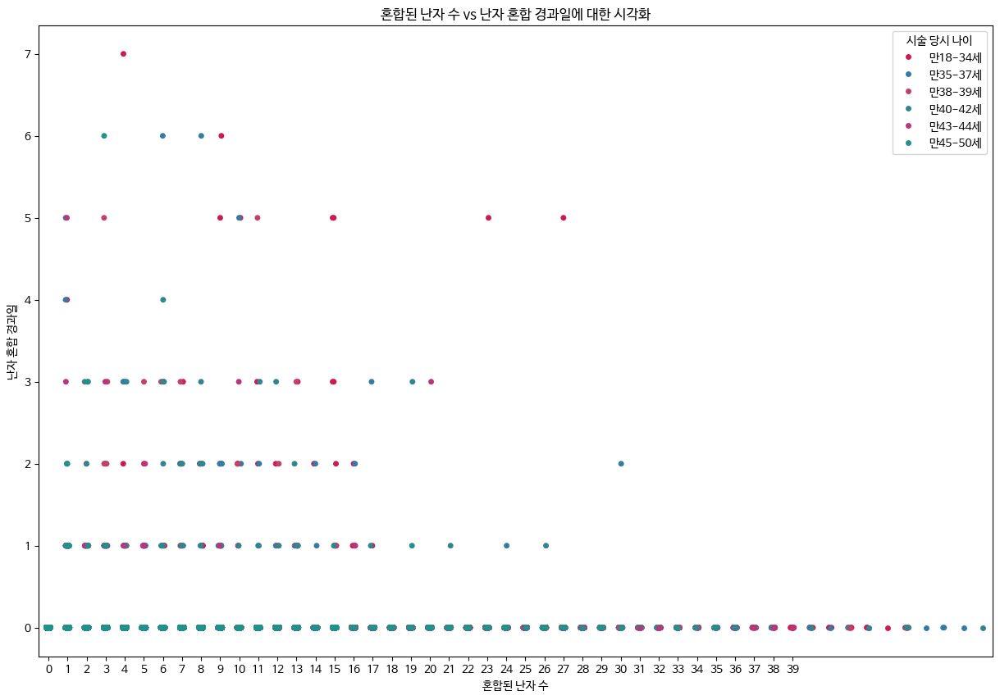

In [ ]:
# 난자 해동 경과일 vs 난자 혼합 경과일에 대한 산점도 시각화
plt.figure(figsize=(15, 10))
plt.title('혼합된 난자 수 vs 난자 혼합 경과일에 대한 시각화')

sns.stripplot(data=train_18_34, x='혼합된 난자 수', y='난자 혼합 경과일', hue='시술 당시 나이', palette='rocket')
sns.stripplot(data=train_35_37, x='혼합된 난자 수', y='난자 혼합 경과일', hue='시술 당시 나이', palette='mako')
sns.stripplot(data=train_38_39, x='혼합된 난자 수', y='난자 혼합 경과일', hue='시술 당시 나이', palette='flare')
sns.stripplot(data=train_40_42, x='혼합된 난자 수', y='난자 혼합 경과일', hue='시술 당시 나이', palette='crest')
sns.stripplot(data=train_43_44, x='혼합된 난자 수', y='난자 혼합 경과일', hue='시술 당시 나이', palette='magma')
sns.stripplot(data=train_45_50, x='혼합된 난자 수', y='난자 혼합 경과일', hue='시술 당시 나이', palette='viridis')

plt.xticks(np.arange(0, 40))
plt.show()

10. 난자 채취 경과일 vs 난자 혼합 경과일

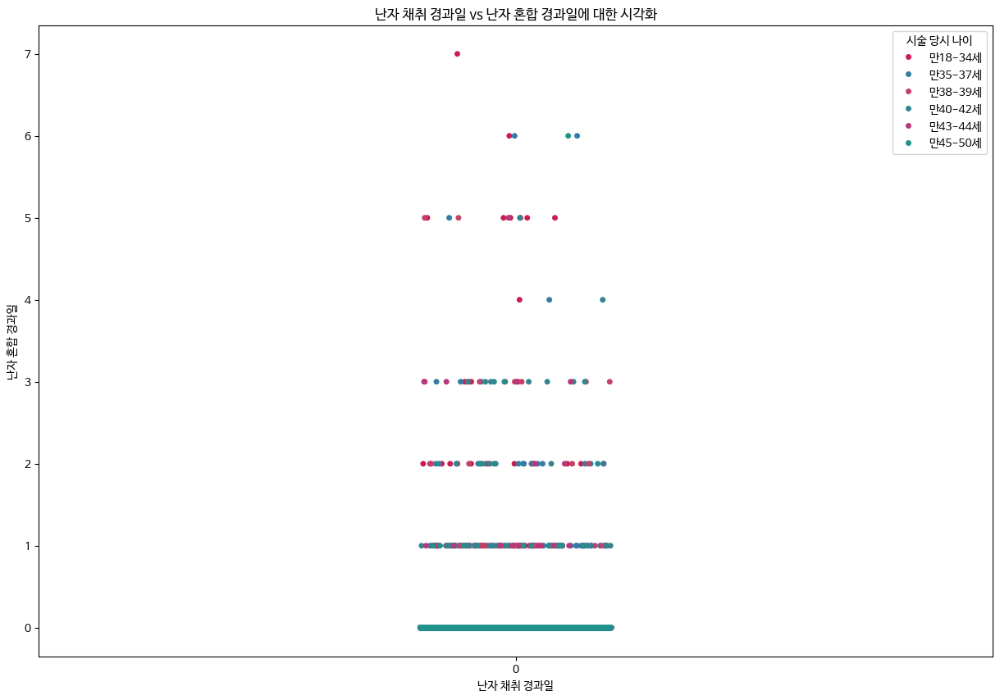

In [ ]:
# 난자 채취 경과일 vs 난자 혼합 경과일에 대한 산점도 시각화
plt.figure(figsize=(15, 10))
plt.title('난자 채취 경과일 vs 난자 혼합 경과일에 대한 시각화')

sns.stripplot(data=train_18_34, x='난자 채취 경과일', y='난자 혼합 경과일', hue='시술 당시 나이', palette='rocket')
sns.stripplot(data=train_35_37, x='난자 채취 경과일', y='난자 혼합 경과일', hue='시술 당시 나이', palette='mako')
sns.stripplot(data=train_38_39, x='난자 채취 경과일', y='난자 혼합 경과일', hue='시술 당시 나이', palette='flare')
sns.stripplot(data=train_40_42, x='난자 채취 경과일', y='난자 혼합 경과일', hue='시술 당시 나이', palette='crest')
sns.stripplot(data=train_43_44, x='난자 채취 경과일', y='난자 혼합 경과일', hue='시술 당시 나이', palette='magma')
sns.stripplot(data=train_45_50, x='난자 채취 경과일', y='난자 혼합 경과일', hue='시술 당시 나이', palette='viridis')

plt.xticks(np.arange(0, 1))
plt.show()


*   시술 유형

In [ ]:
train_ivf = train.loc[train['특정 시술 유형'] == 'IVF', :]
train_icsi = train.loc[train['특정 시술 유형'] == 'ICSI', :]
train_di = train.loc[train['특정 시술 유형'] == 'DI', :]

1. X: 총 생성 배아 수 Y: 저장된 배아 수

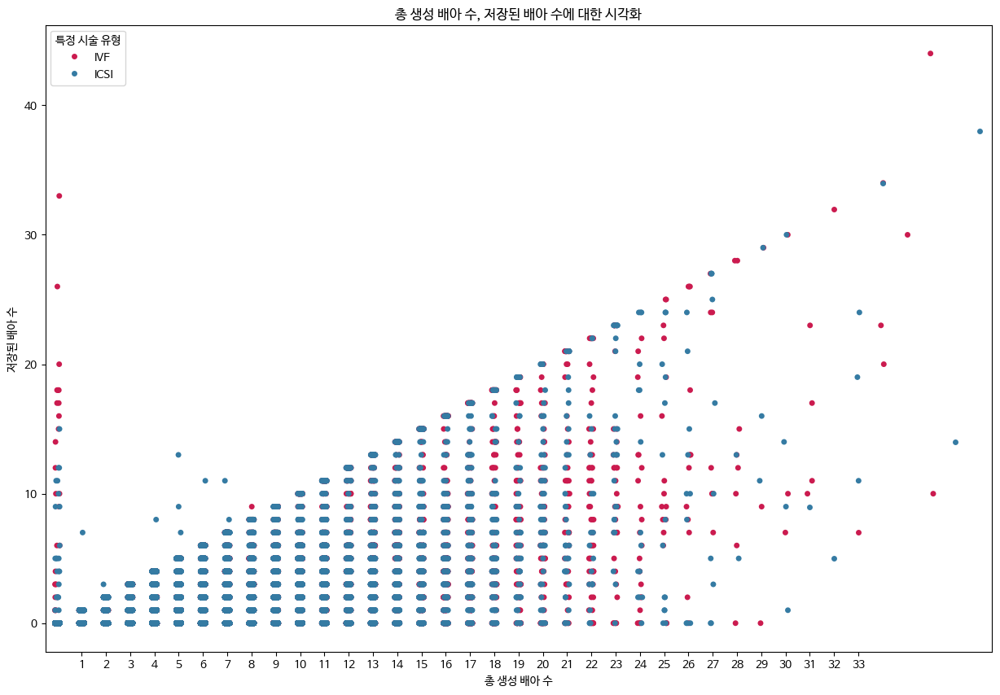

In [ ]:
# 총 배아 수, 저장된 배아 수에 대한 산점도 시각화
plt.figure(figsize=(15, 10))
plt.title('총 생성 배아 수, 저장된 배아 수에 대한 시각화')

sns.stripplot(data=train_ivf, x='총 생성 배아 수', y='저장된 배아 수', hue='특정 시술 유형', palette='rocket')
sns.stripplot(data=train_icsi, x='총 생성 배아 수', y='저장된 배아 수', hue='특정 시술 유형', palette='mako')
sns.stripplot(data=train_di, x='총 생성 배아 수', y='저장된 배아 수', hue='특정 시술 유형', palette='flare')

plt.xticks(np.arange(1, 34))
plt.show()

2. 미세주입된 난자 수 vs 미세주입에서 생성된 배아 수

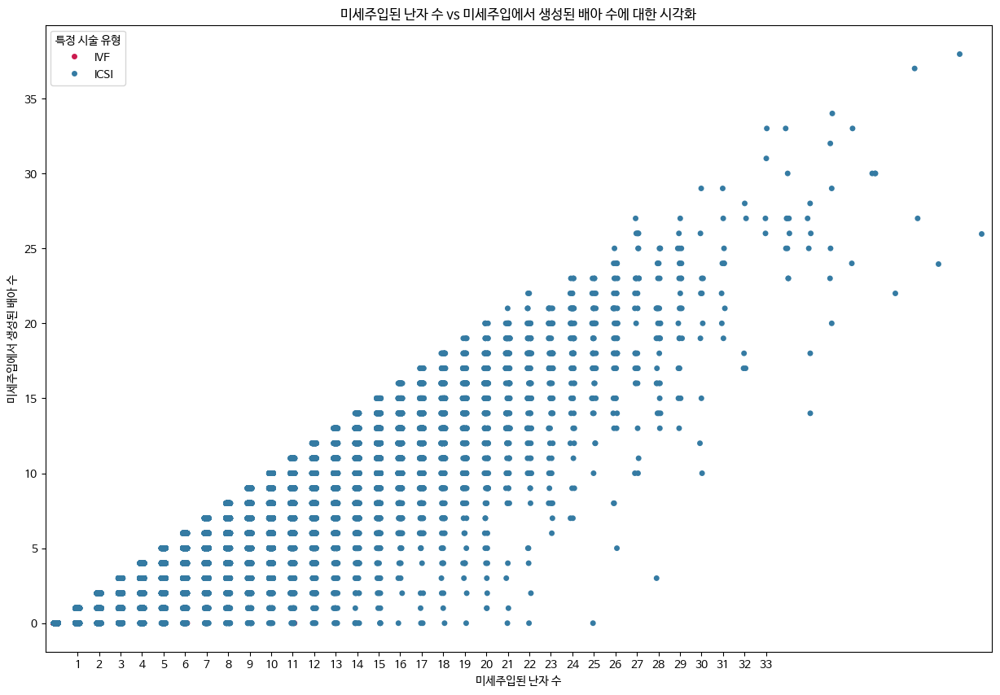

In [ ]:
# 미세주입된 난자 수 vs 미세주입에서 생성된 배아 수에 대한 산점도 시각화
plt.figure(figsize=(15, 10))
plt.title('미세주입된 난자 수 vs 미세주입에서 생성된 배아 수에 대한 시각화')

sns.stripplot(data=train_ivf, x='미세주입된 난자 수', y='미세주입에서 생성된 배아 수', hue='특정 시술 유형', palette='rocket')
sns.stripplot(data=train_icsi, x='미세주입된 난자 수', y='미세주입에서 생성된 배아 수', hue='특정 시술 유형', palette='mako')
sns.stripplot(data=train_di, x='미세주입된 난자 수', y='미세주입에서 생성된 배아 수', hue='특정 시술 유형', palette='flare')

plt.xticks(np.arange(1, 34))
plt.show()

3. 저장된 배아 수 vs 미세주입 후 저장된 배아 수

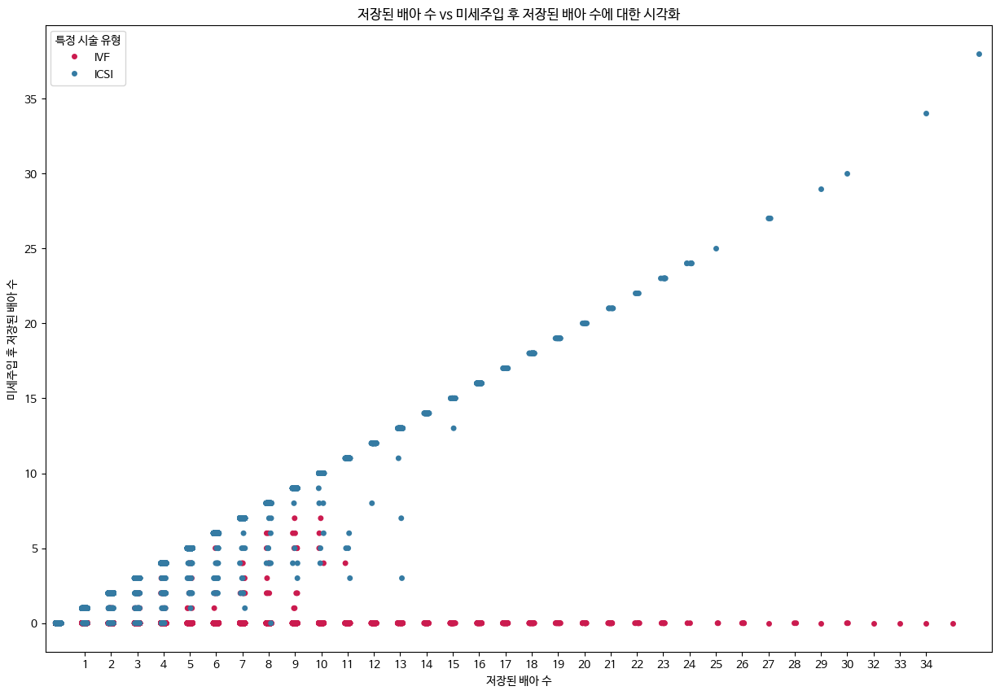

In [ ]:
# 저장된 배아 수 vs 미세주입 후 저장된 배아 수에 대한 산점도 시각화
plt.figure(figsize=(15, 10))
plt.title('저장된 배아 수 vs 미세주입 후 저장된 배아 수에 대한 시각화')

sns.stripplot(data=train_ivf, x='저장된 배아 수', y='미세주입 후 저장된 배아 수', hue='특정 시술 유형', palette='rocket')
sns.stripplot(data=train_icsi, x='저장된 배아 수', y='미세주입 후 저장된 배아 수', hue='특정 시술 유형', palette='mako')
sns.stripplot(data=train_di, x='저장된 배아 수', y='미세주입 후 저장된 배아 수', hue='특정 시술 유형', palette='flare')

plt.xticks(np.arange(1, 34))
plt.show()

4. 저장된 배아 수 vs 미세주입 후 저장된 배아 수

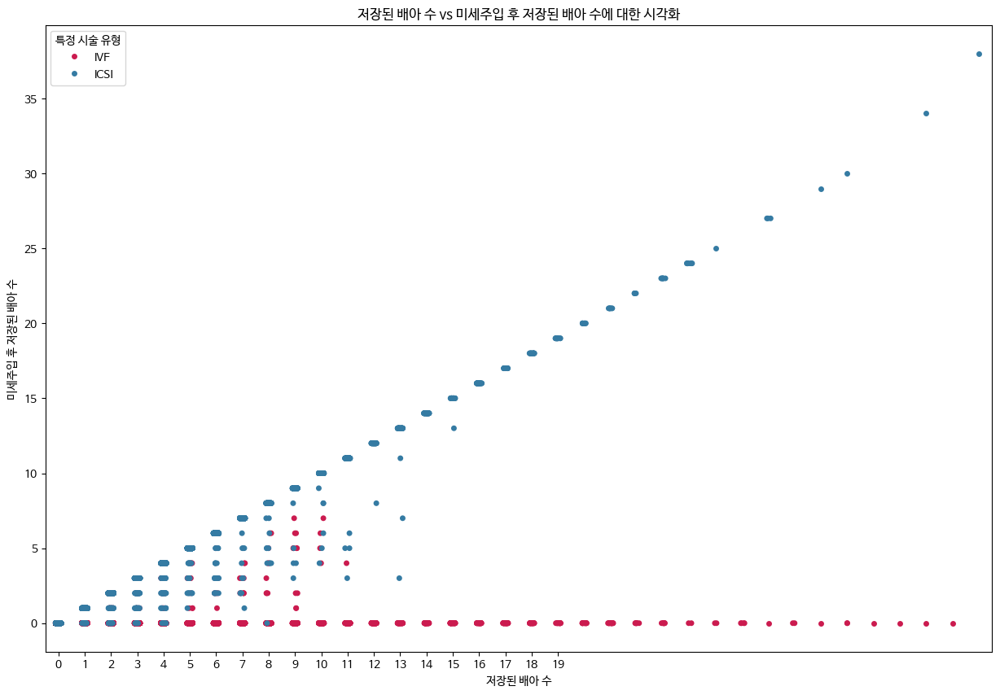

In [ ]:
# 저장된 배아 수 vs 미세주입 후 저장된 배아 수에 대한 산점도 시각화
plt.figure(figsize=(15, 10))
plt.title('저장된 배아 수 vs 미세주입 후 저장된 배아 수에 대한 시각화')

sns.stripplot(data=train_ivf, x='저장된 배아 수', y='미세주입 후 저장된 배아 수', hue='특정 시술 유형', palette='rocket')
sns.stripplot(data=train_icsi, x='저장된 배아 수', y='미세주입 후 저장된 배아 수', hue='특정 시술 유형', palette='mako')
sns.stripplot(data=train_di, x='저장된 배아 수', y='미세주입 후 저장된 배아 수', hue='특정 시술 유형', palette='flare')

plt.xticks(np.arange(0, 20))
plt.show()

5. 해동된 배아 수 vs 해동 난자 수

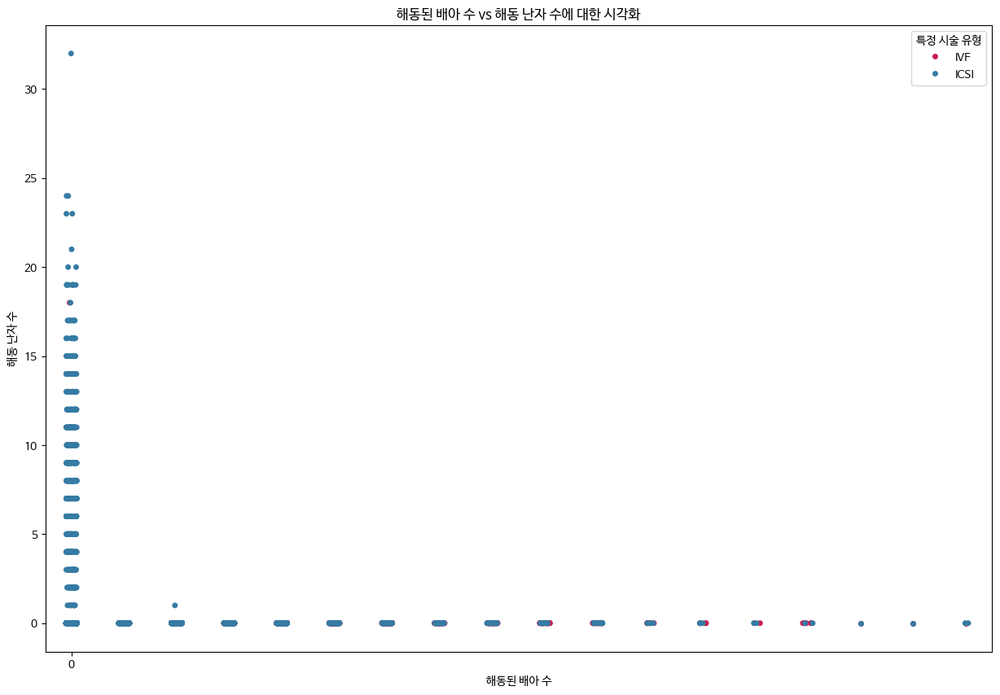

In [ ]:
# 해동된 배아 수 vs 해동 난자 수에 대한 산점도 시각화
plt.figure(figsize=(15, 10))
plt.title('해동된 배아 수 vs 해동 난자 수에 대한 시각화')

sns.stripplot(data=train_ivf, x='해동된 배아 수', y='해동 난자 수', hue='특정 시술 유형', palette='rocket')
sns.stripplot(data=train_icsi, x='해동된 배아 수', y='해동 난자 수', hue='특정 시술 유형', palette='mako')
sns.stripplot(data=train_di, x='해동된 배아 수', y='해동 난자 수', hue='특정 시술 유형', palette='flare')

plt.xticks(np.arange(0, 1))
plt.show()

6. 수집된 신선 난자 수 vs 저장된 신선 난자 수

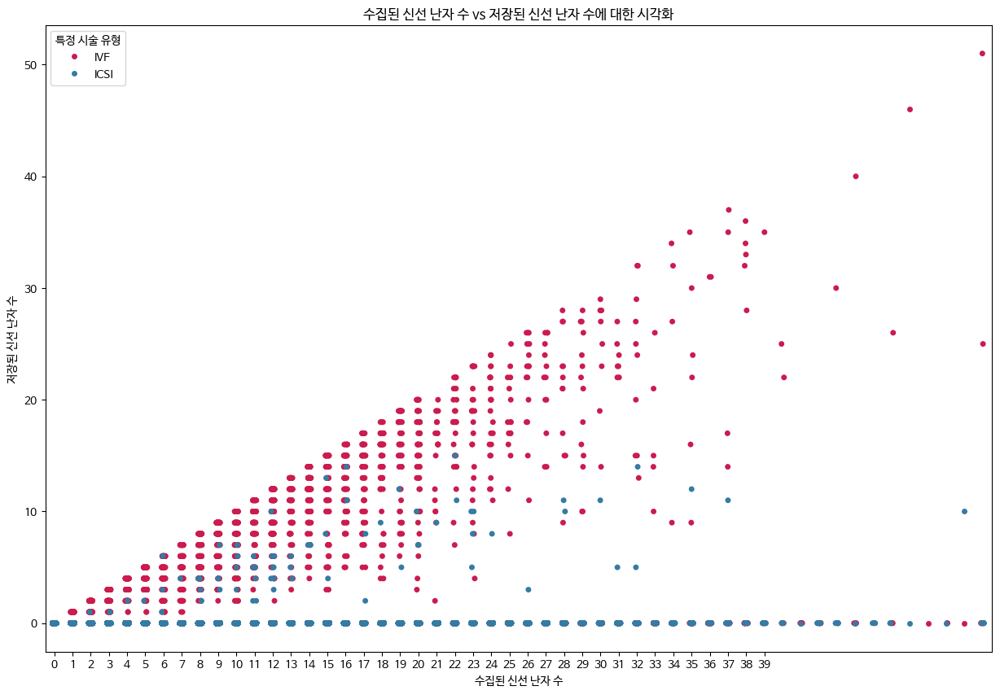

In [ ]:
# 수집된 신선 난자 수 vs 저장된 신선 난자 수에 대한 산점도 시각화
plt.figure(figsize=(15, 10))
plt.title('수집된 신선 난자 수 vs 저장된 신선 난자 수에 대한 시각화')

sns.stripplot(data=train_ivf, x='수집된 신선 난자 수', y='저장된 신선 난자 수', hue='특정 시술 유형', palette='rocket')
sns.stripplot(data=train_icsi, x='수집된 신선 난자 수', y='저장된 신선 난자 수', hue='특정 시술 유형', palette='mako')
sns.stripplot(data=train_di, x='수집된 신선 난자 수', y='저장된 신선 난자 수', hue='특정 시술 유형', palette='flare')

plt.xticks(np.arange(0, 40))
plt.show()

7. 혼합된 난자 수 vs 파트너 정자와 혼합된 난자 수

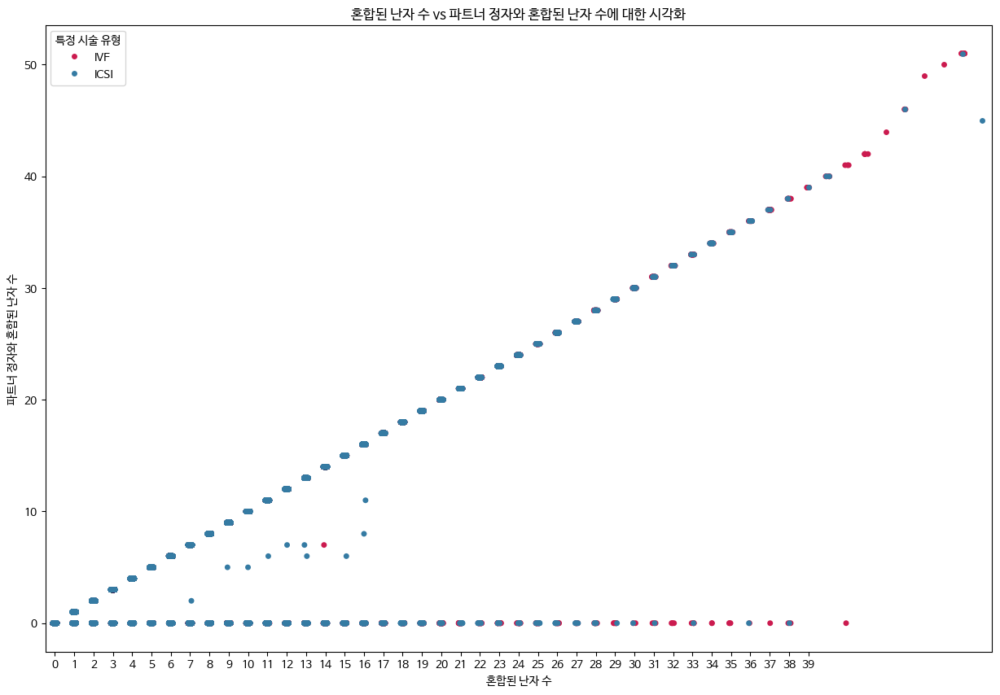

In [ ]:
# 혼합된 난자 수 vs 파트너 정자와 혼합된 난자 수에 대한 산점도 시각화
plt.figure(figsize=(15, 10))
plt.title('혼합된 난자 수 vs 파트너 정자와 혼합된 난자 수에 대한 시각화')

sns.stripplot(data=train_ivf, x='혼합된 난자 수', y='파트너 정자와 혼합된 난자 수', hue='특정 시술 유형', palette='rocket')
sns.stripplot(data=train_icsi, x='혼합된 난자 수', y='파트너 정자와 혼합된 난자 수', hue='특정 시술 유형', palette='mako')
sns.stripplot(data=train_di, x='혼합된 난자 수', y='파트너 정자와 혼합된 난자 수', hue='특정 시술 유형', palette='flare')

plt.xticks(np.arange(0, 40))
plt.show()

8. 혼합된 난자 수 vs 기증자 정자와 혼합된 난자 수

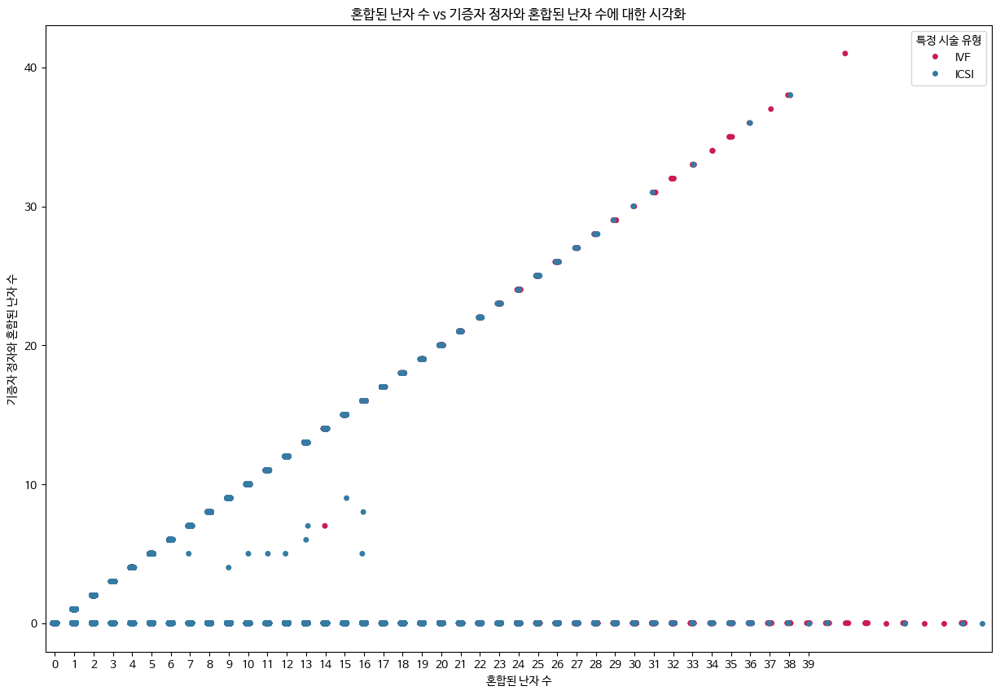

In [ ]:
# 혼합된 난자 수 vs 기증자 정자와 혼합된 난자 수에 대한 산점도 시각화
plt.figure(figsize=(15, 10))
plt.title('혼합된 난자 수 vs 기증자 정자와 혼합된 난자 수에 대한 시각화')

sns.stripplot(data=train_ivf, x='혼합된 난자 수', y='기증자 정자와 혼합된 난자 수', hue='특정 시술 유형', palette='rocket')
sns.stripplot(data=train_icsi, x='혼합된 난자 수', y='기증자 정자와 혼합된 난자 수', hue='특정 시술 유형', palette='mako')
sns.stripplot(data=train_di, x='혼합된 난자 수', y='기증자 정자와 혼합된 난자 수', hue='특정 시술 유형', palette='flare')

plt.xticks(np.arange(0, 40))
plt.show()

9. 난자 해동 경과일 vs 난자 혼합 경과일

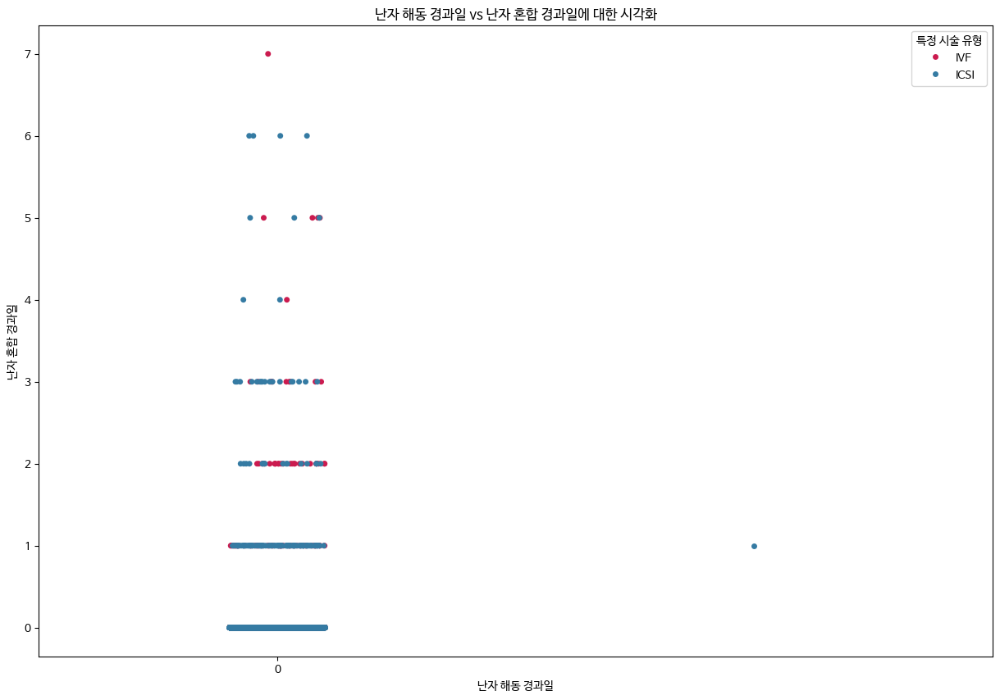

In [ ]:
# 난자 해동 경과일 vs 난자 혼합 경과일에 대한 산점도 시각화
plt.figure(figsize=(15, 10))
plt.title('난자 해동 경과일 vs 난자 혼합 경과일에 대한 시각화')

sns.stripplot(data=train_ivf, x='난자 해동 경과일', y='난자 혼합 경과일', hue='특정 시술 유형', palette='rocket')
sns.stripplot(data=train_icsi, x='난자 해동 경과일', y='난자 혼합 경과일', hue='특정 시술 유형', palette='mako')
sns.stripplot(data=train_di, x='난자 해동 경과일', y='난자 혼합 경과일', hue='특정 시술 유형', palette='flare')

plt.xticks(np.arange(0, 1))
plt.show()

10. 난자 채취 경과일 vs 난자 혼합 경과일

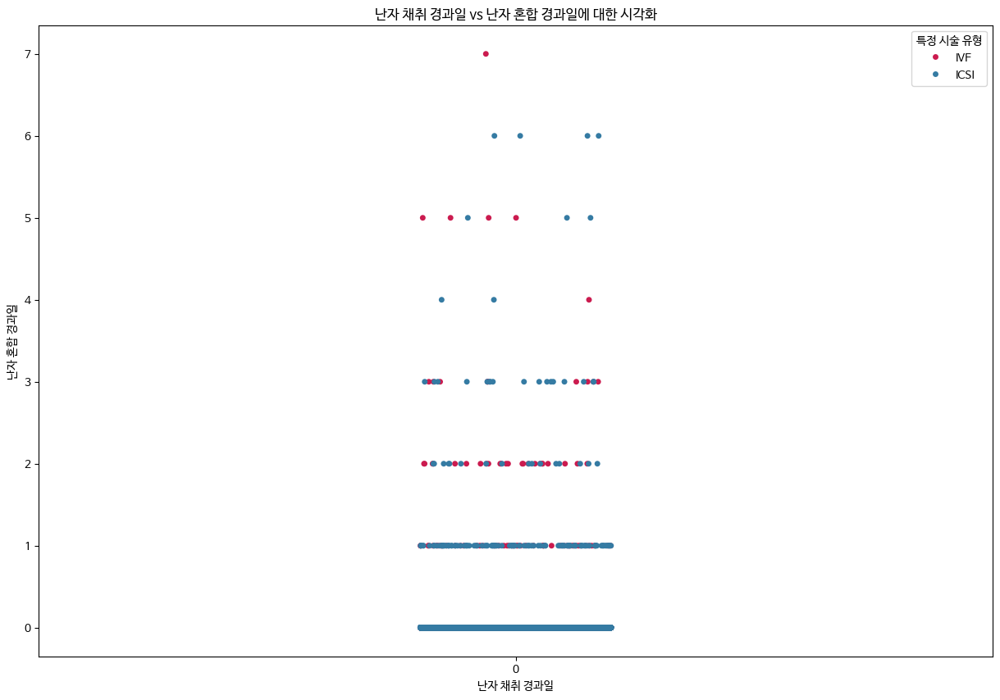

In [ ]:
# 난자 채취 경과일 vs 난자 혼합 경과일에 대한 산점도 시각화
plt.figure(figsize=(15, 10))
plt.title('난자 채취 경과일 vs 난자 혼합 경과일에 대한 시각화')

sns.stripplot(data=train_ivf, x='난자 채취 경과일', y='난자 혼합 경과일', hue='특정 시술 유형', palette='rocket')
sns.stripplot(data=train_icsi, x='난자 채취 경과일', y='난자 혼합 경과일', hue='특정 시술 유형', palette='mako')
sns.stripplot(data=train_di, x='난자 채취 경과일', y='난자 혼합 경과일', hue='특정 시술 유형', palette='flare')

plt.xticks(np.arange(0, 1))
plt.show()

임신 성공 여부에 대한 단일 컬럼에 대한 비중 시각화

In [ ]:
train['임신 성공 여부'].value_counts()

,count
임신 성공 여부,
0,68386
1,17876


#### 상자 수염을 이용하여서 시각화 맞추기



*   시술 유형



0. 임신 시도 또는 마지막 임신 경과 연수

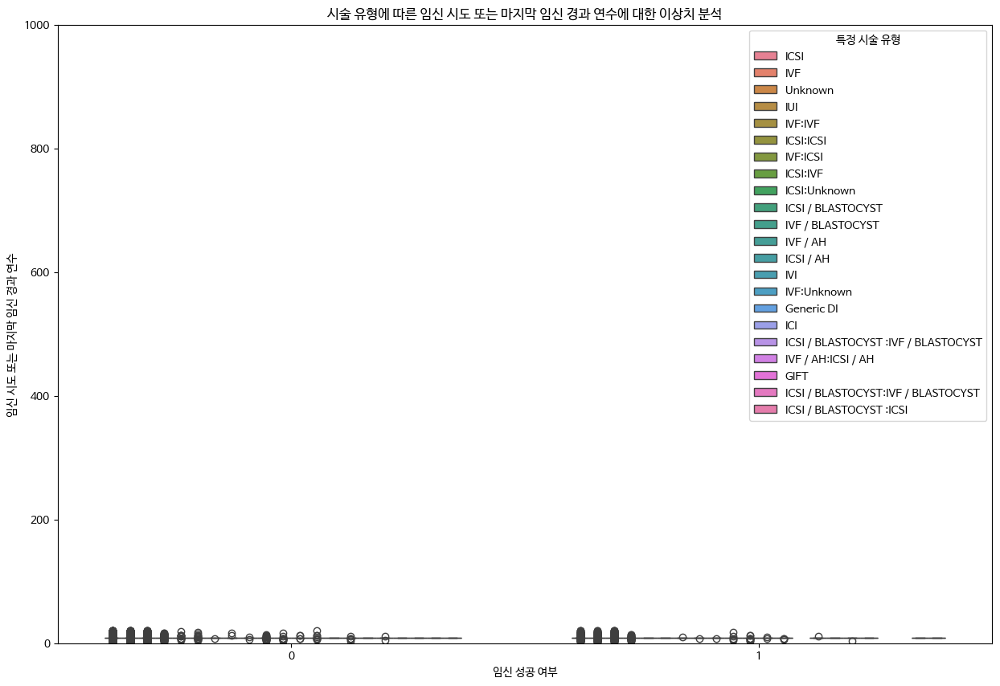

In [ ]:
plt.figure(figsize=(15, 10))
plt.title('시술 유형에 따른 임신 시도 또는 마지막 임신 경과 연수에 대한 이상치 분석')
sns.boxplot(data=train, x='임신 성공 여부', y='임신 시도 또는 마지막 임신 경과 연수', hue='특정 시술 유형')
plt.ylim(0, 1000)
plt.show()

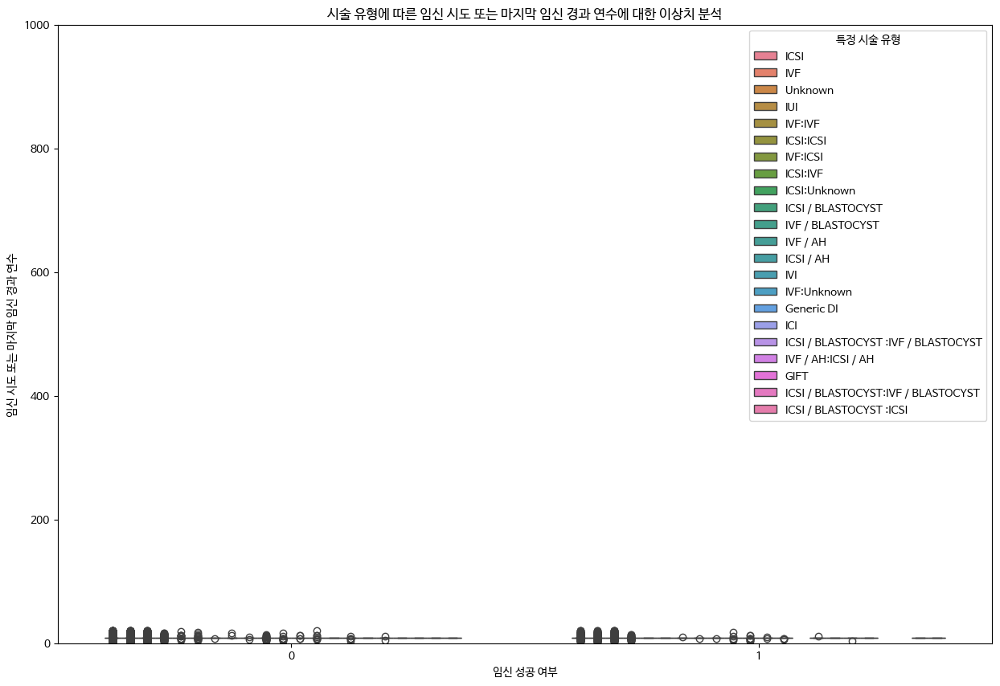

In [ ]:
plt.figure(figsize=(15, 10))
plt.title('시술 유형에 따른 임신 시도 또는 마지막 임신 경과 연수에 대한 이상치 분석')
sns.boxplot(data=train, x='임신 성공 여부', y='임신 시도 또는 마지막 임신 경과 연수', hue='특정 시술 유형')
plt.ylim(0, 1000)
plt.show()

1. 총 생성 배아 수

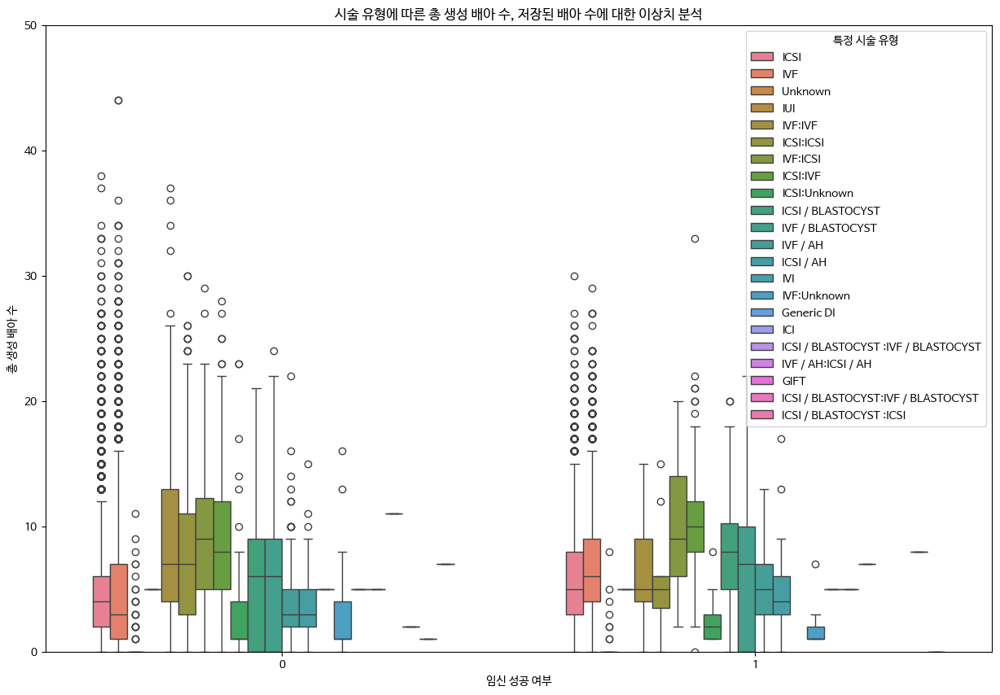

In [ ]:
plt.figure(figsize=(15, 10))
plt.title('시술 유형에 따른 총 생성 배아 수, 저장된 배아 수에 대한 이상치 분석')
sns.boxplot(data=train, x='임신 성공 여부', y='총 생성 배아 수', hue='특정 시술 유형')
plt.ylim(0, 50)
plt.show()

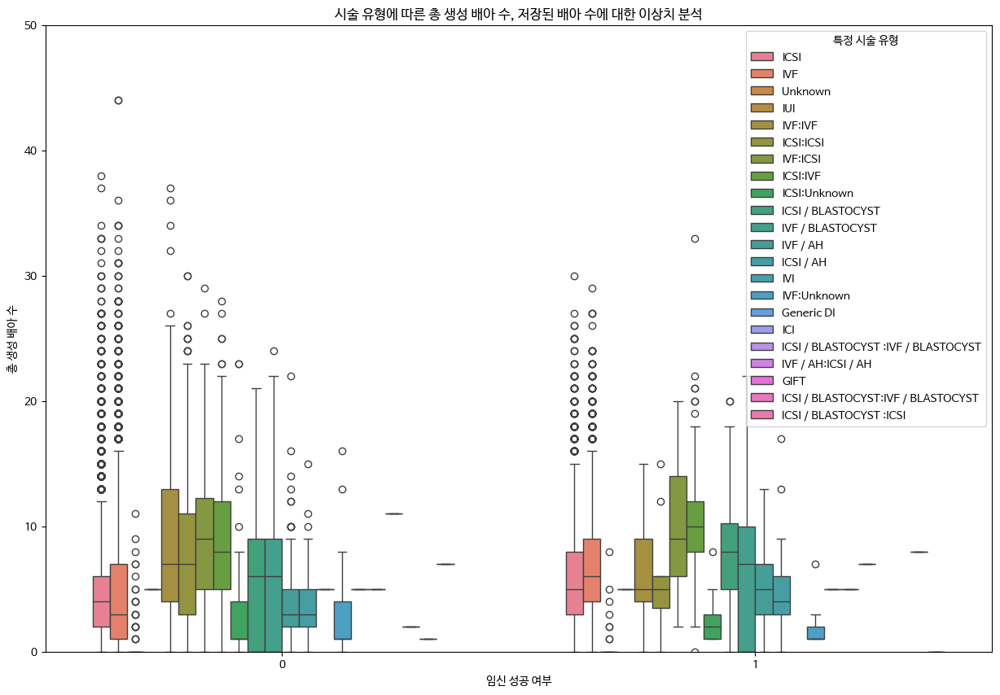

In [ ]:
plt.figure(figsize=(15, 10))
plt.title('시술 유형에 따른 총 생성 배아 수, 저장된 배아 수에 대한 이상치 분석')
sns.boxplot(data=train, x='임신 성공 여부', y='총 생성 배아 수', hue='특정 시술 유형')
plt.ylim(0, 50)
plt.show()

2. 저장된 배아 수

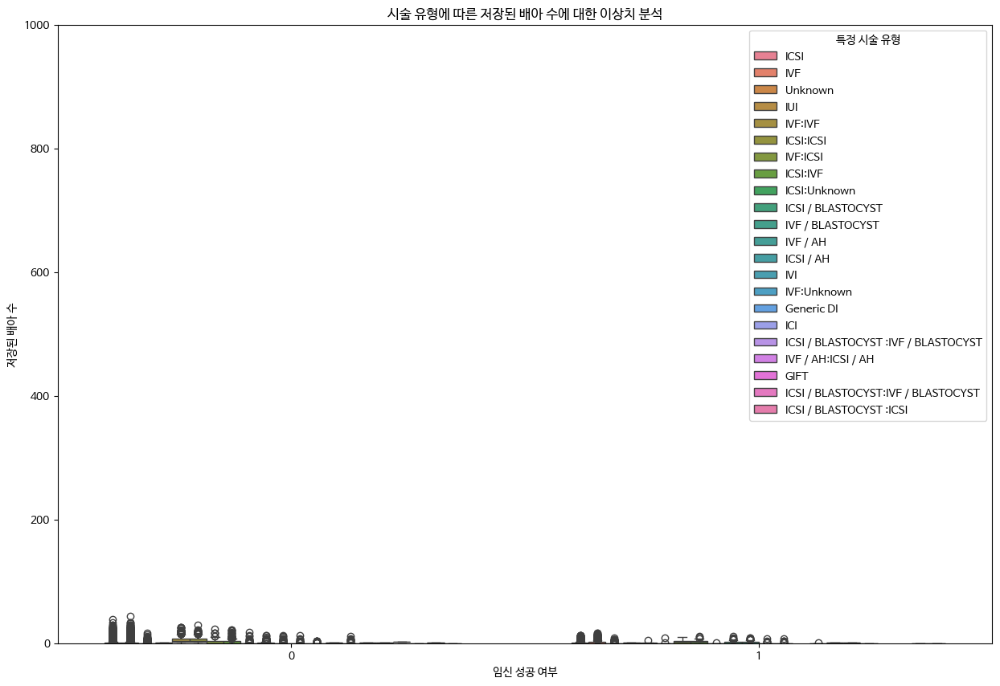

In [ ]:
plt.figure(figsize=(15, 10))
plt.title('시술 유형에 따른 저장된 배아 수에 대한 이상치 분석')
sns.boxplot(data=train, x='임신 성공 여부', y='저장된 배아 수', hue='특정 시술 유형')
plt.ylim(0, 1000)
plt.show()

3. 미세주입된 난자 수

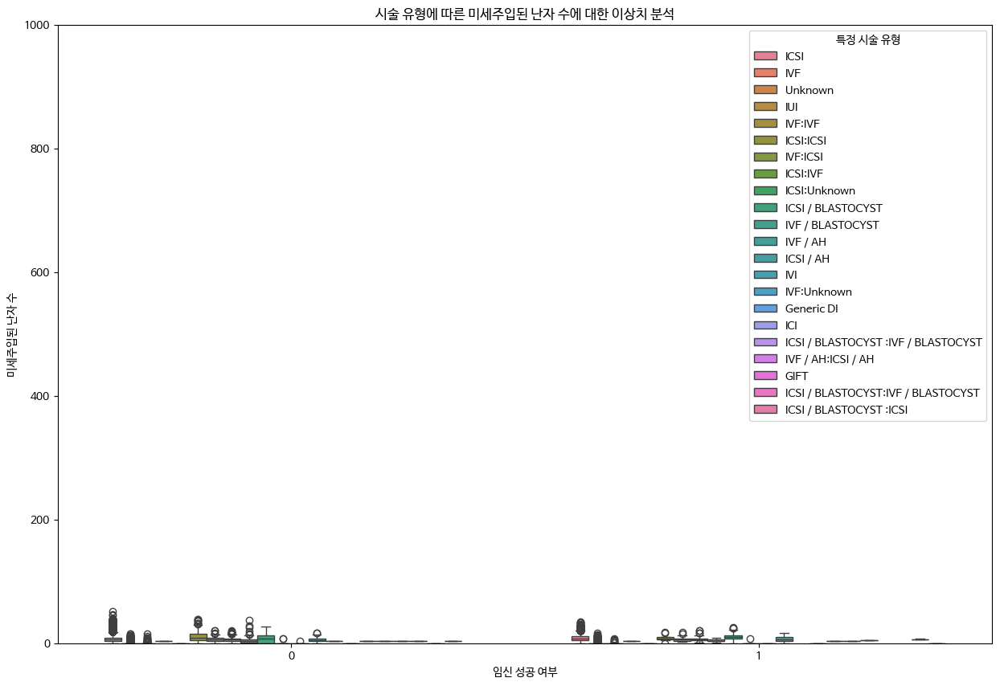

In [ ]:
plt.figure(figsize=(15, 10))
plt.title('시술 유형에 따른 미세주입된 난자 수에 대한 이상치 분석')
sns.boxplot(data=train, x='임신 성공 여부', y='미세주입된 난자 수', hue='특정 시술 유형')
plt.ylim(0, 1000)
plt.show()

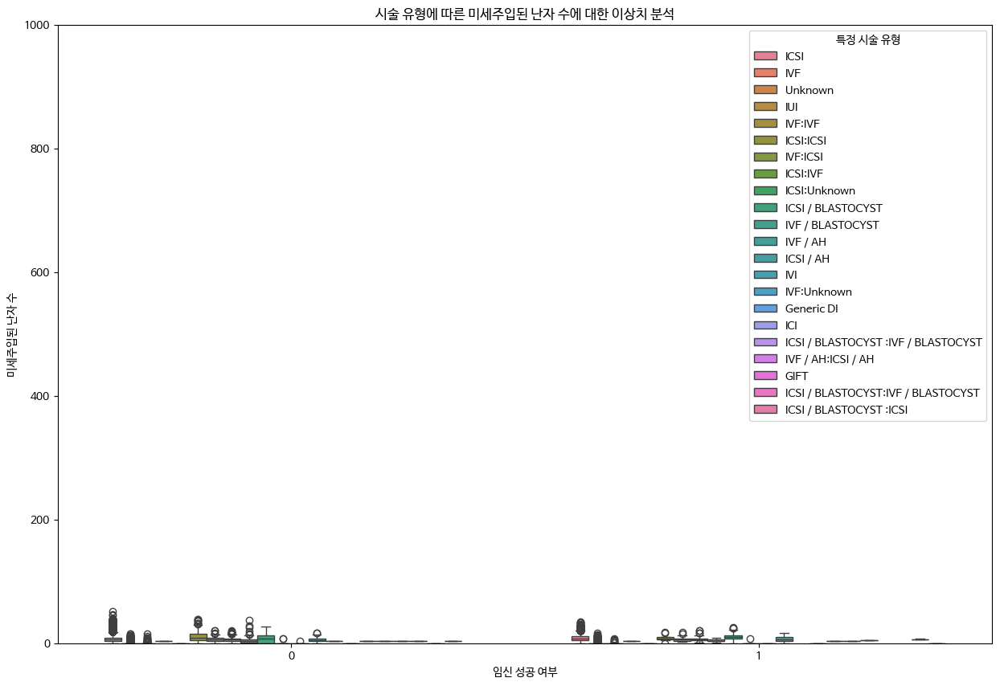

In [ ]:
plt.figure(figsize=(15, 10))
plt.title('시술 유형에 따른 미세주입된 난자 수에 대한 이상치 분석')
sns.boxplot(data=train, x='임신 성공 여부', y='미세주입된 난자 수', hue='특정 시술 유형')
plt.ylim(0, 1000)
plt.show()

4. 미세주입에서 생성된 배아 수

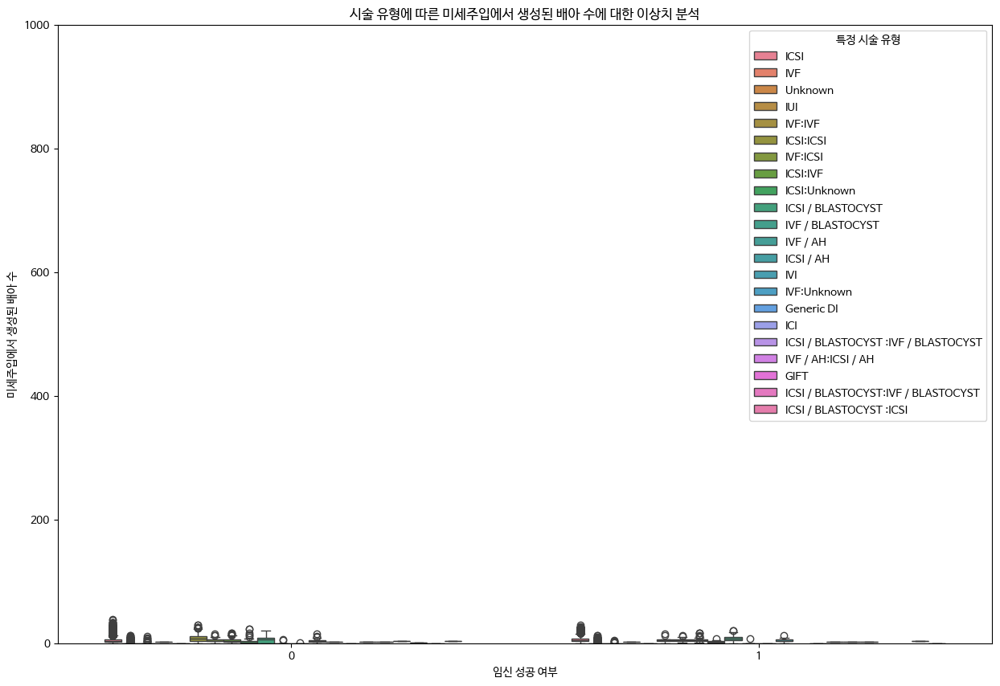

In [ ]:
plt.figure(figsize=(15, 10))
plt.title('시술 유형에 따른 미세주입에서 생성된 배아 수에 대한 이상치 분석')
sns.boxplot(data=train, x='임신 성공 여부', y='미세주입에서 생성된 배아 수', hue='특정 시술 유형')
plt.ylim(0, 1000)
plt.show()

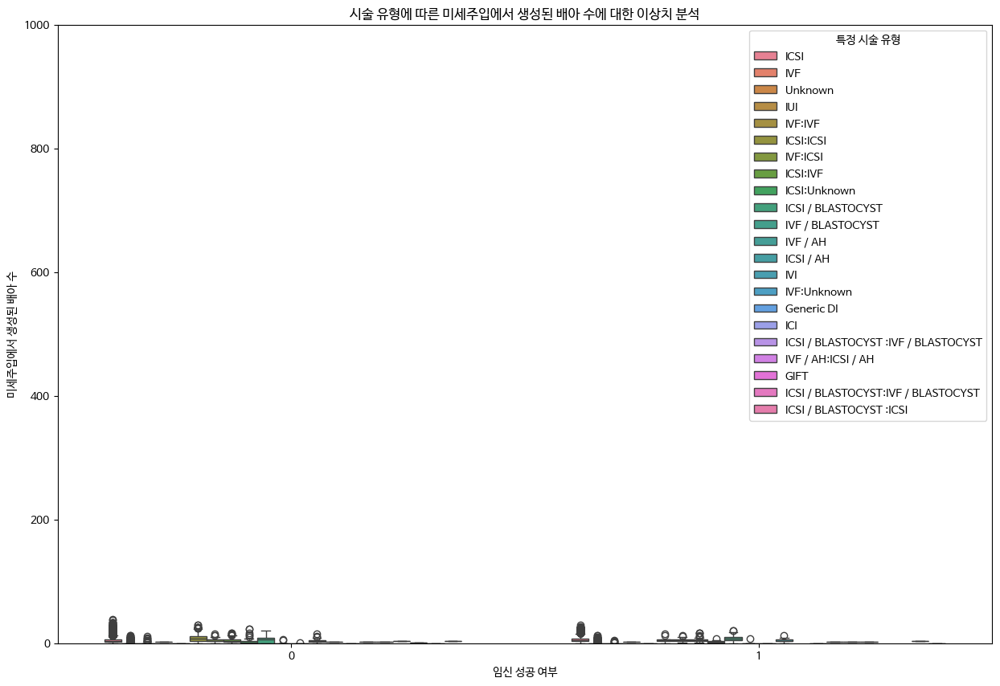

In [ ]:
plt.figure(figsize=(15, 10))
plt.title('시술 유형에 따른 미세주입에서 생성된 배아 수에 대한 이상치 분석')
sns.boxplot(data=train, x='임신 성공 여부', y='미세주입에서 생성된 배아 수', hue='특정 시술 유형')
plt.ylim(0, 1000)
plt.show()

4. 이식된 배아 수

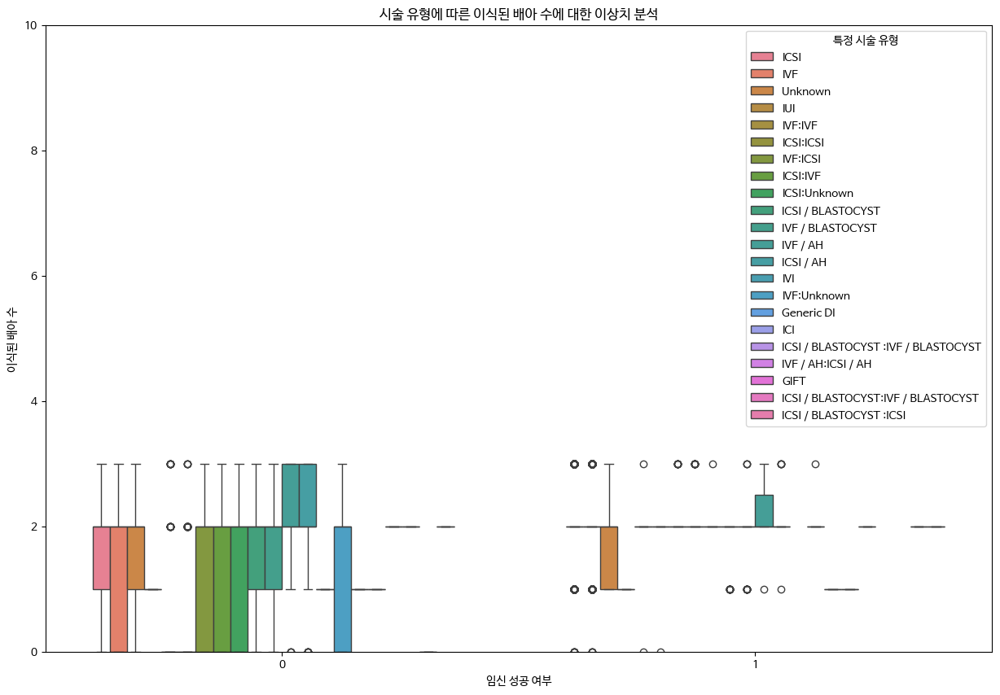

In [ ]:
plt.figure(figsize=(15, 10))
plt.title('시술 유형에 따른 이식된 배아 수에 대한 이상치 분석')
sns.boxplot(data=train, x='임신 성공 여부', y='이식된 배아 수', hue='특정 시술 유형')
plt.ylim(0, 10)
plt.show()

5. 미세주입 배아 이식 수

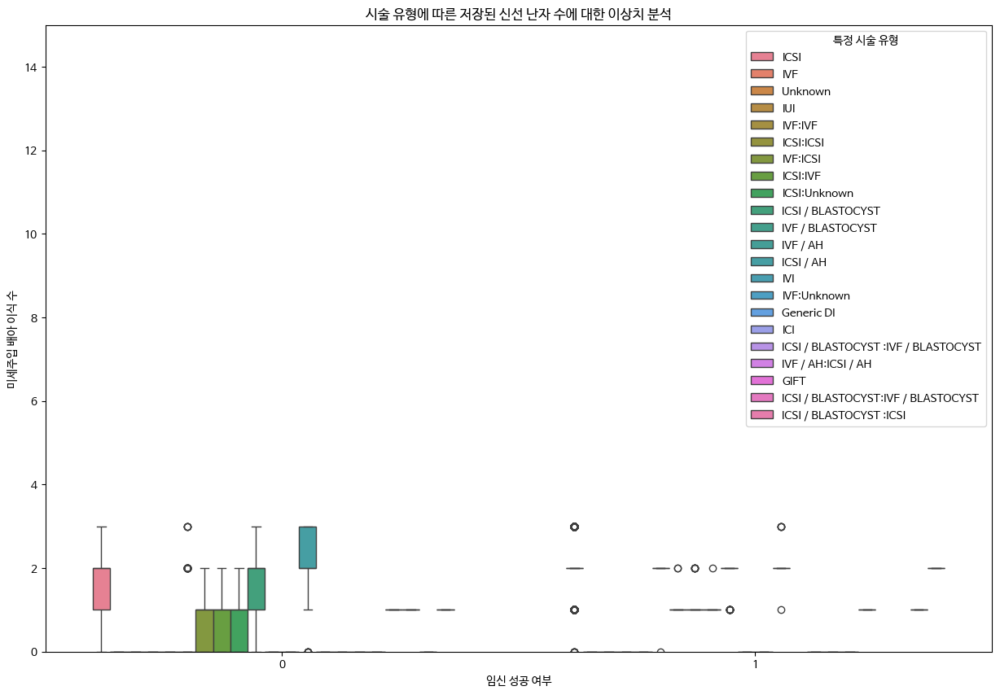

In [ ]:
plt.figure(figsize=(15, 10))
plt.title('시술 유형에 따른 저장된 신선 난자 수에 대한 이상치 분석')
sns.boxplot(data=train, x='임신 성공 여부', y='미세주입 배아 이식 수', hue='특정 시술 유형')
plt.ylim(0, 15)
plt.show()

4. 저장된 신선 난자 수

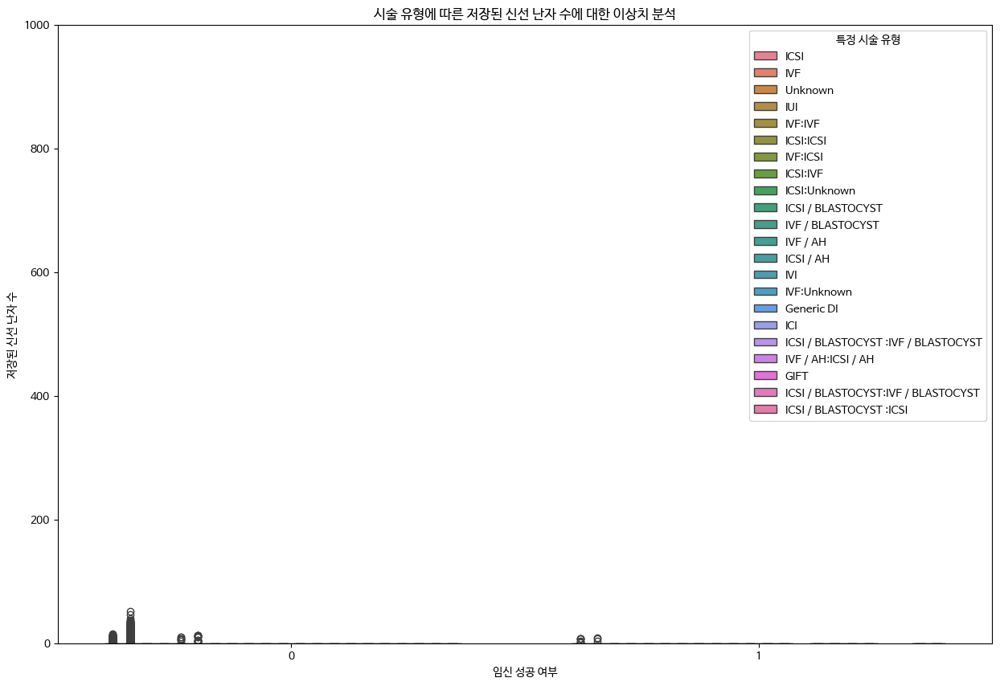

In [ ]:
plt.figure(figsize=(15, 10))
plt.title('시술 유형에 따른 저장된 신선 난자 수에 대한 이상치 분석')
sns.boxplot(data=train, x='임신 성공 여부', y='저장된 신선 난자 수', hue='특정 시술 유형')
plt.ylim(0, 1000)
plt.show()

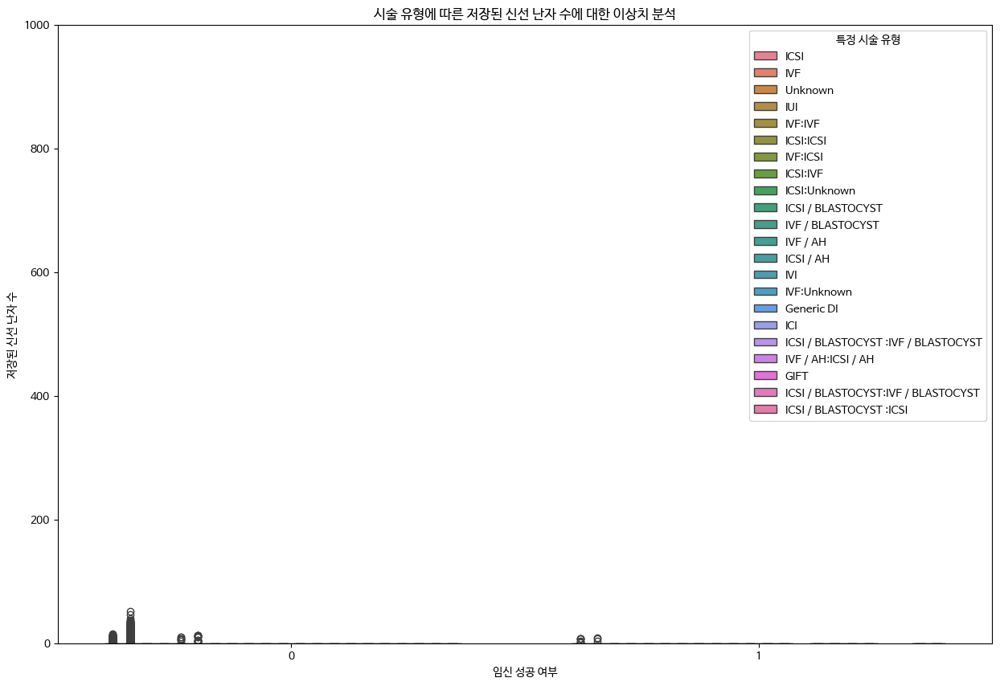

In [ ]:
plt.figure(figsize=(15, 10))
plt.title('시술 유형에 따른 저장된 신선 난자 수에 대한 이상치 분석')
sns.boxplot(data=train, x='임신 성공 여부', y='저장된 신선 난자 수', hue='특정 시술 유형')
plt.ylim(0, 1000)
plt.show()

5. 해동 난자 수

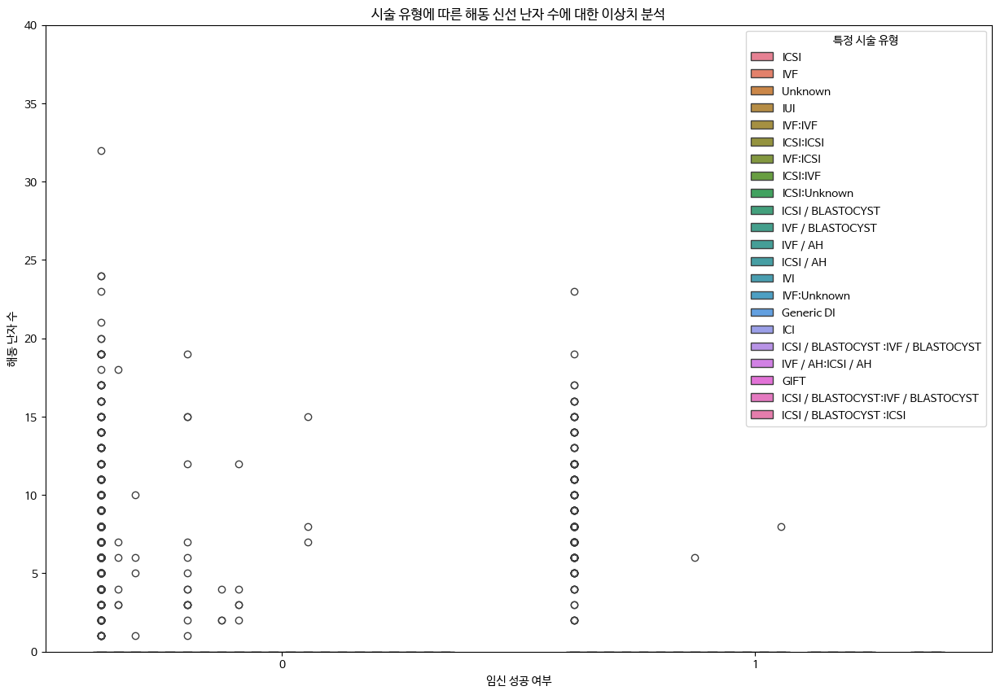

In [ ]:
plt.figure(figsize=(15, 10))
plt.title('시술 유형에 따른 해동 신선 난자 수에 대한 이상치 분석')
sns.boxplot(data=train, x='임신 성공 여부', y='해동 난자 수', hue='특정 시술 유형')
plt.ylim(0, 40)
plt.show()

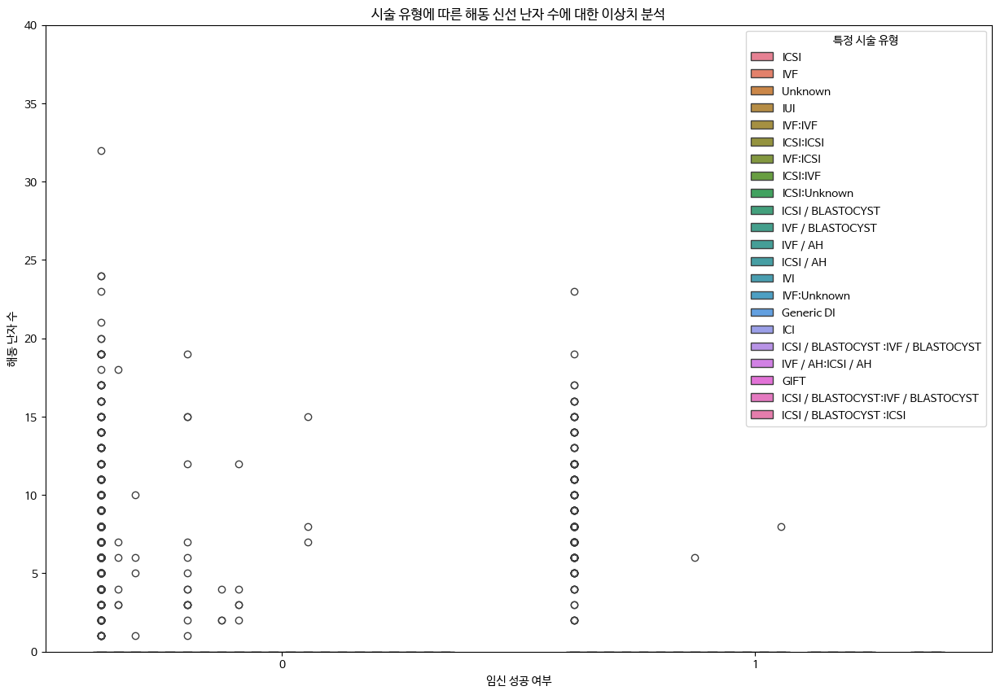

In [ ]:
plt.figure(figsize=(15, 10))
plt.title('시술 유형에 따른 해동 신선 난자 수에 대한 이상치 분석')
sns.boxplot(data=train, x='임신 성공 여부', y='해동 난자 수', hue='특정 시술 유형')
plt.ylim(0, 40)
plt.show()

5. 해동된 배아 수

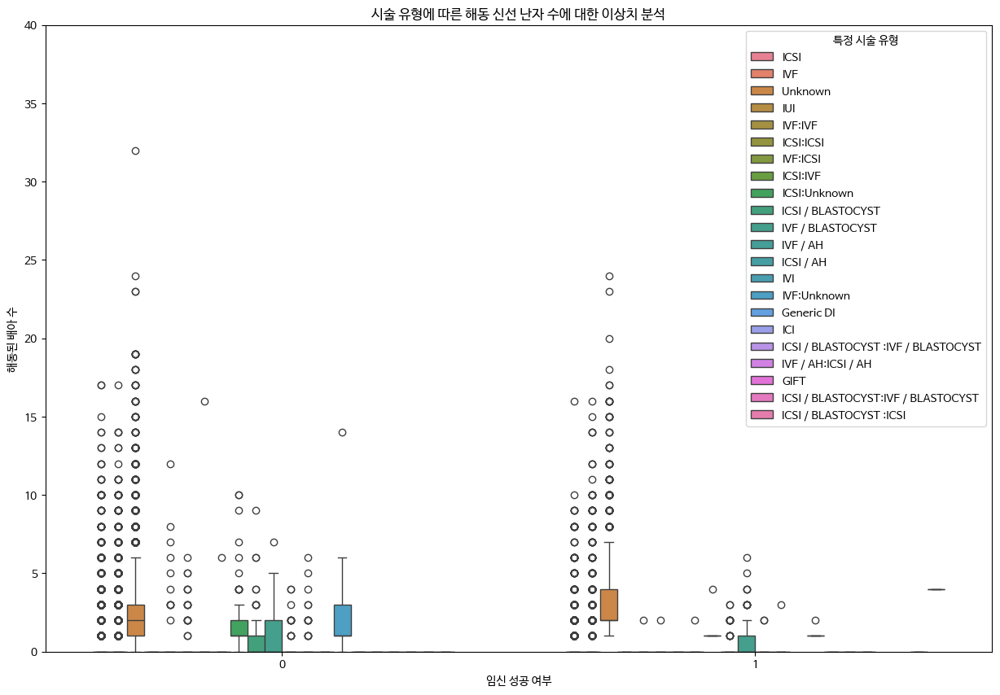

In [ ]:
plt.figure(figsize=(15, 10))
plt.title('시술 유형에 따른 해동 신선 난자 수에 대한 이상치 분석')
sns.boxplot(data=train, x='임신 성공 여부', y='해동된 배아 수', hue='특정 시술 유형')
plt.ylim(0, 40)
plt.show()

6. 수집된 신선 난자 수

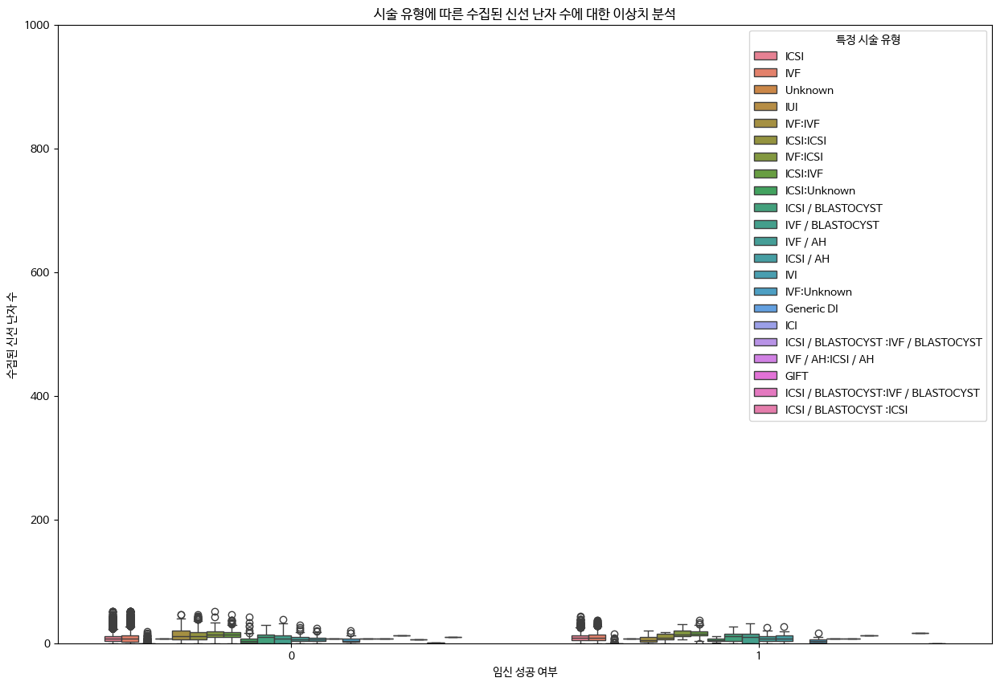

In [ ]:
plt.figure(figsize=(15, 10))
plt.title('시술 유형에 따른 수집된 신선 난자 수에 대한 이상치 분석')
sns.boxplot(data=train, x='임신 성공 여부', y='수집된 신선 난자 수', hue='특정 시술 유형')
plt.ylim(0, 1000)
plt.show()

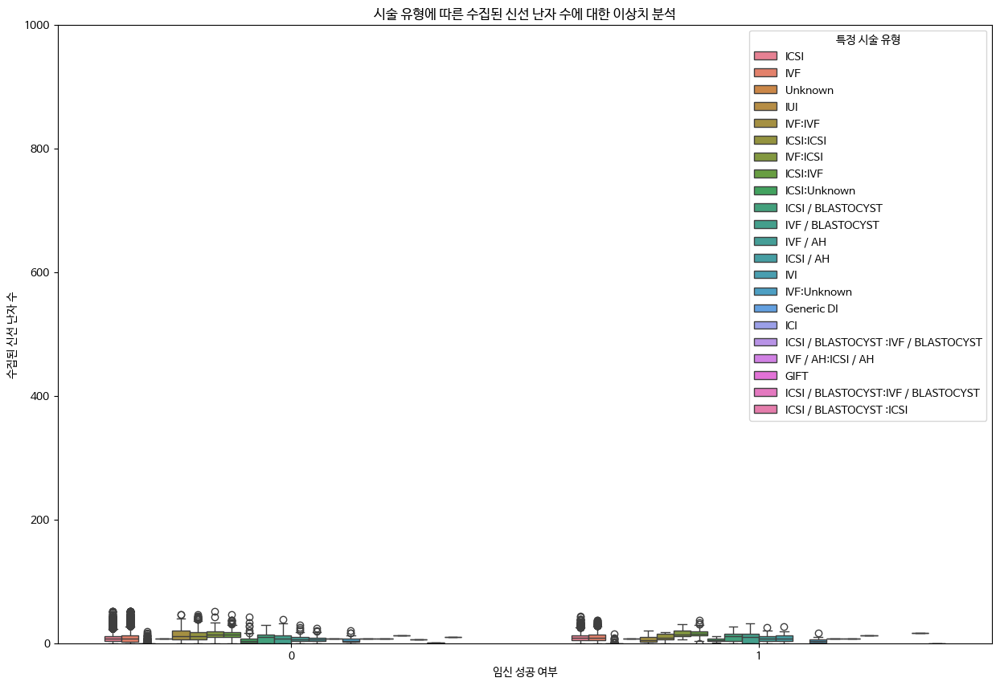

In [ ]:
plt.figure(figsize=(15, 10))
plt.title('시술 유형에 따른 수집된 신선 난자 수에 대한 이상치 분석')
sns.boxplot(data=train, x='임신 성공 여부', y='수집된 신선 난자 수', hue='특정 시술 유형')
plt.ylim(0, 1000)
plt.show()

7. 혼합된 난자 수

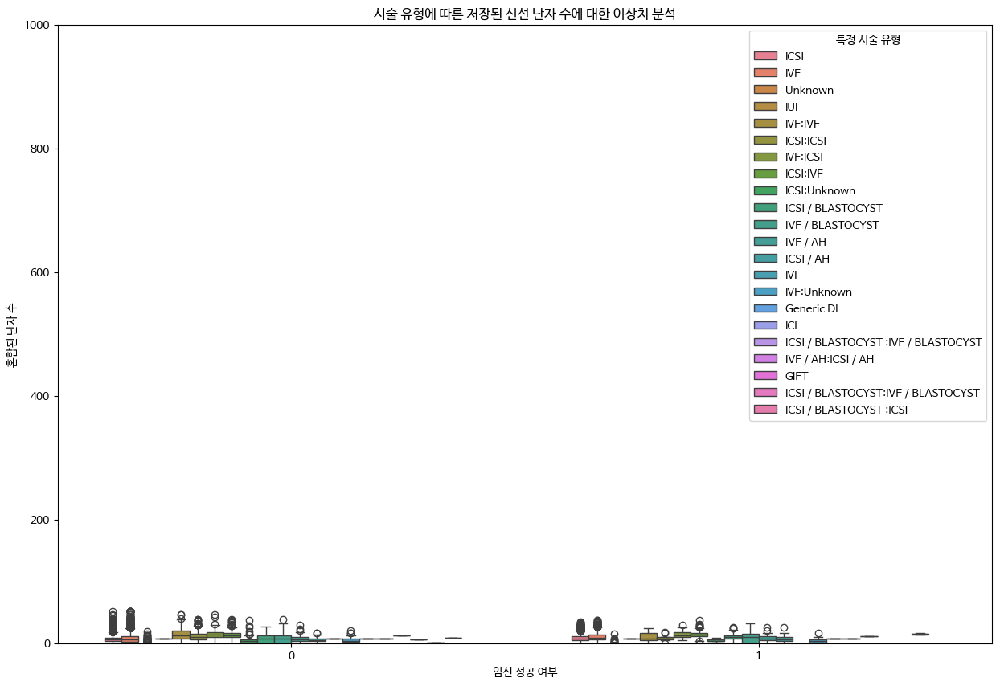

In [ ]:
plt.figure(figsize=(15, 10))
plt.title('시술 유형에 따른 저장된 신선 난자 수에 대한 이상치 분석')
sns.boxplot(data=train, x='임신 성공 여부', y='혼합된 난자 수', hue='특정 시술 유형')
plt.ylim(0, 1000)
plt.show()

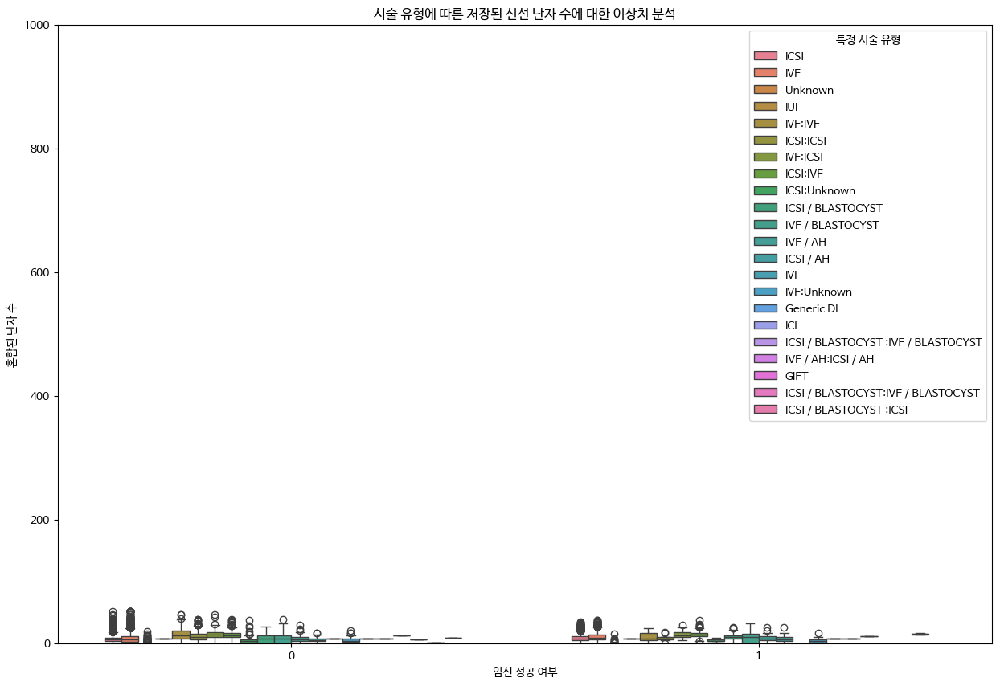

In [ ]:
plt.figure(figsize=(15, 10))
plt.title('시술 유형에 따른 저장된 신선 난자 수에 대한 이상치 분석')
sns.boxplot(data=train, x='임신 성공 여부', y='혼합된 난자 수', hue='특정 시술 유형')
plt.ylim(0, 1000)
plt.show()

9. 난자 해동 경과일

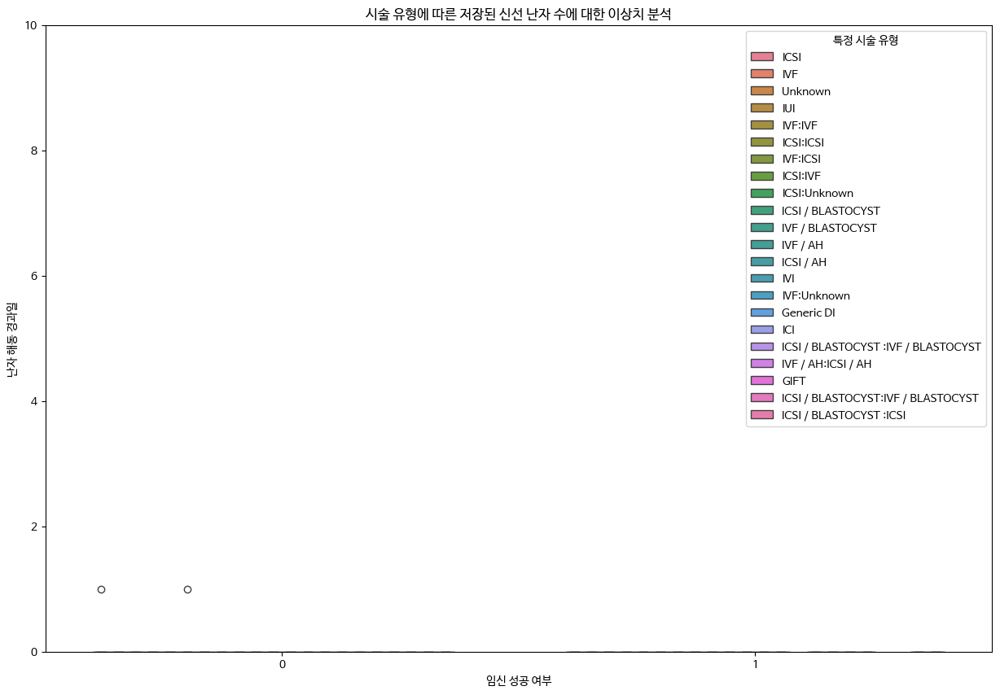

In [ ]:
plt.figure(figsize=(15, 10))
plt.title('시술 유형에 따른 저장된 신선 난자 수에 대한 이상치 분석')
sns.boxplot(data=train, x='임신 성공 여부', y='난자 해동 경과일', hue='특정 시술 유형')
plt.ylim(0, 10)
plt.show()

10. 난자 혼합 경과일

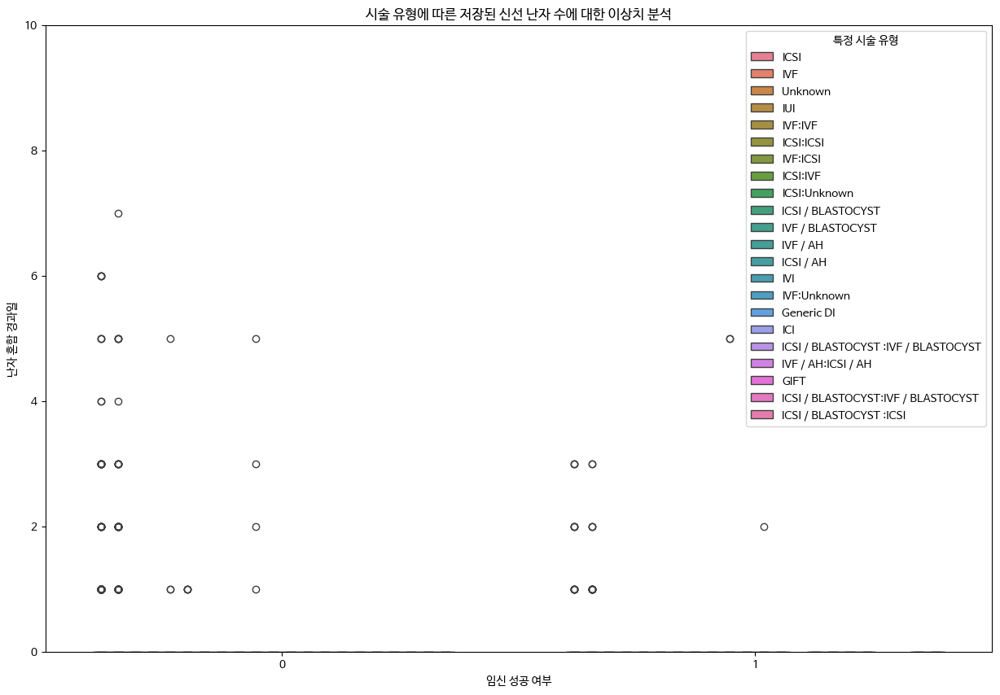

In [ ]:
plt.figure(figsize=(15, 10))
plt.title('시술 유형에 따른 저장된 신선 난자 수에 대한 이상치 분석')
sns.boxplot(data=train, x='임신 성공 여부', y='난자 혼합 경과일', hue='특정 시술 유형')
plt.ylim(0, 10)
plt.show()

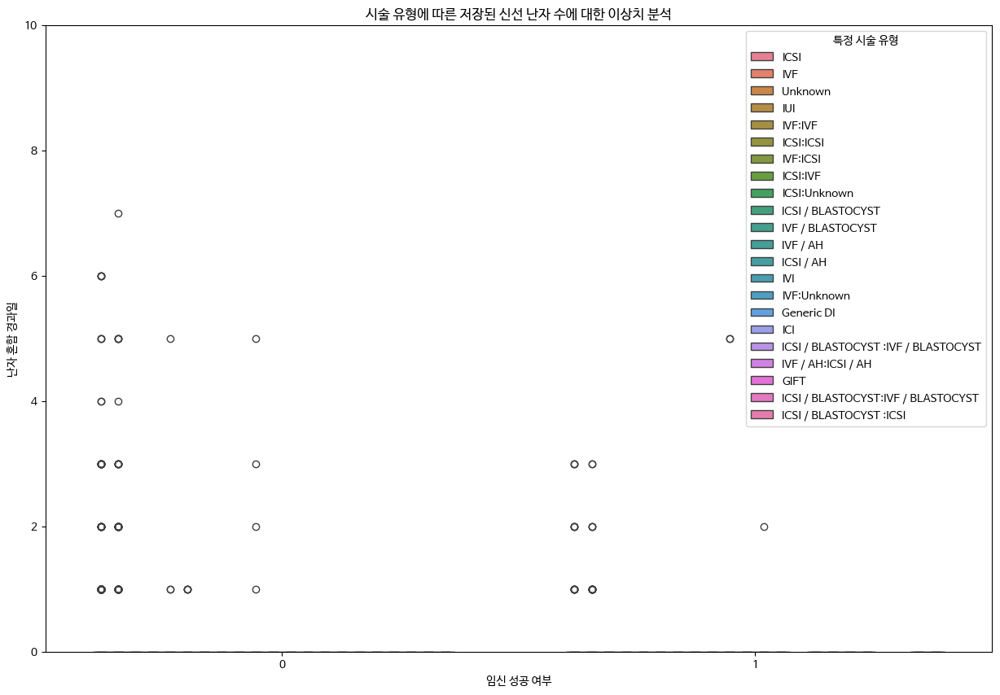

In [ ]:
plt.figure(figsize=(15, 10))
plt.title('시술 유형에 따른 저장된 신선 난자 수에 대한 이상치 분석')
sns.boxplot(data=train, x='임신 성공 여부', y='난자 혼합 경과일', hue='특정 시술 유형')
plt.ylim(0, 10)
plt.show()

11. 난자 채취 경과일

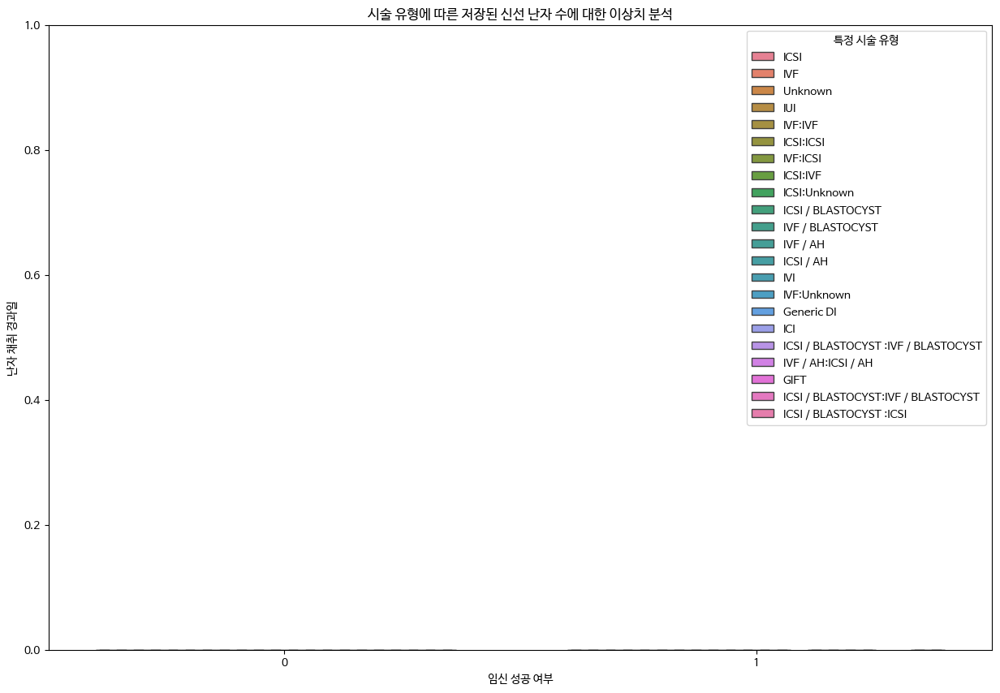

In [ ]:
plt.figure(figsize=(15, 10))
plt.title('시술 유형에 따른 저장된 신선 난자 수에 대한 이상치 분석')
sns.boxplot(data=train, x='임신 성공 여부', y='난자 채취 경과일', hue='특정 시술 유형')
plt.ylim(0, 1)
plt.show()



*   시술 시기 코드


1. 총 생성 배아 수

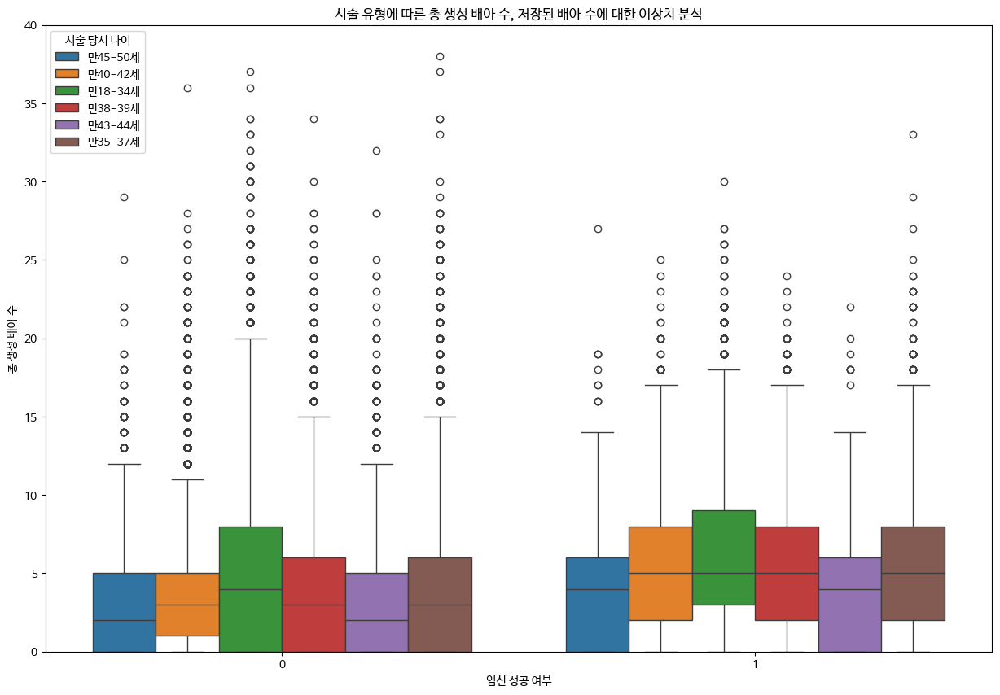

In [ ]:
plt.figure(figsize=(15, 10))
plt.title('시술 유형에 따른 총 생성 배아 수, 저장된 배아 수에 대한 이상치 분석')
sns.boxplot(data=train, x='임신 성공 여부', y='총 생성 배아 수', hue='시술 당시 나이')
plt.ylim(0, 40)
plt.show()

2. 저장된 배아 수

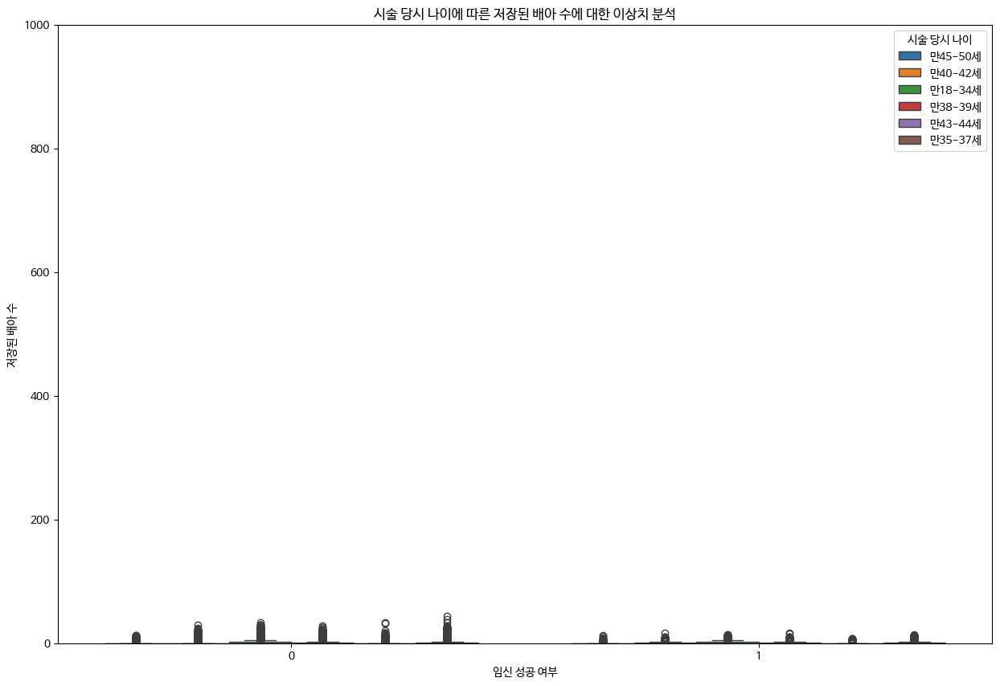

In [ ]:
plt.figure(figsize=(15, 10))
plt.title('시술 당시 나이에 따른 저장된 배아 수에 대한 이상치 분석')
sns.boxplot(data=train, x='임신 성공 여부', y='저장된 배아 수', hue='시술 당시 나이')
plt.ylim(0, 1000)
plt.show()

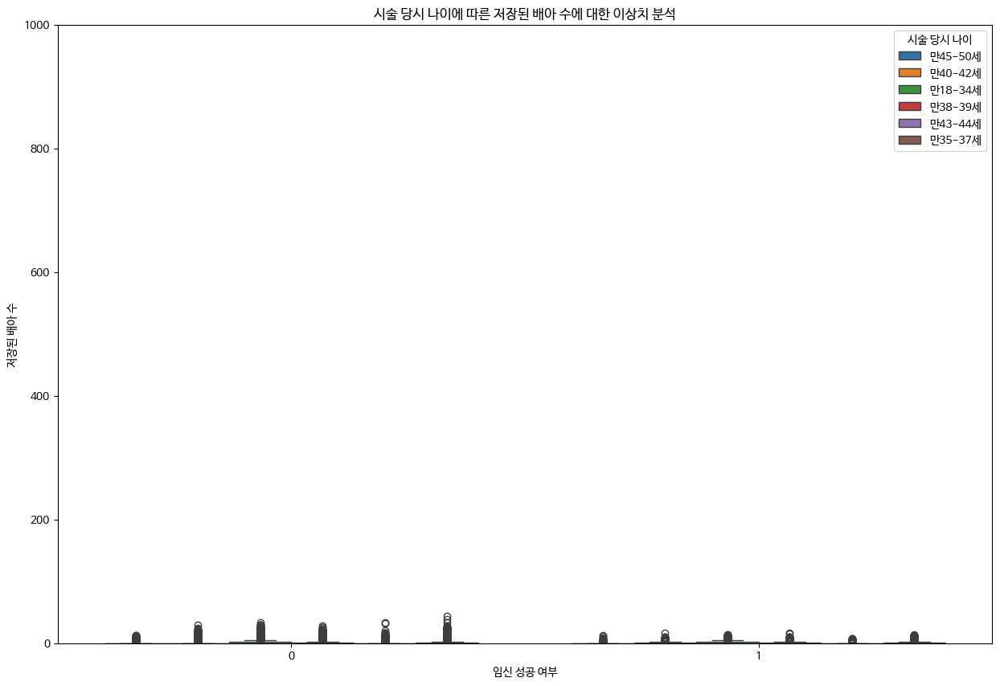

In [ ]:
plt.figure(figsize=(15, 10))
plt.title('시술 당시 나이에 따른 저장된 배아 수에 대한 이상치 분석')
sns.boxplot(data=train, x='임신 성공 여부', y='저장된 배아 수', hue='시술 당시 나이')
plt.ylim(0, 1000)
plt.show()

3. 미세주입에서 생성된 배아 수

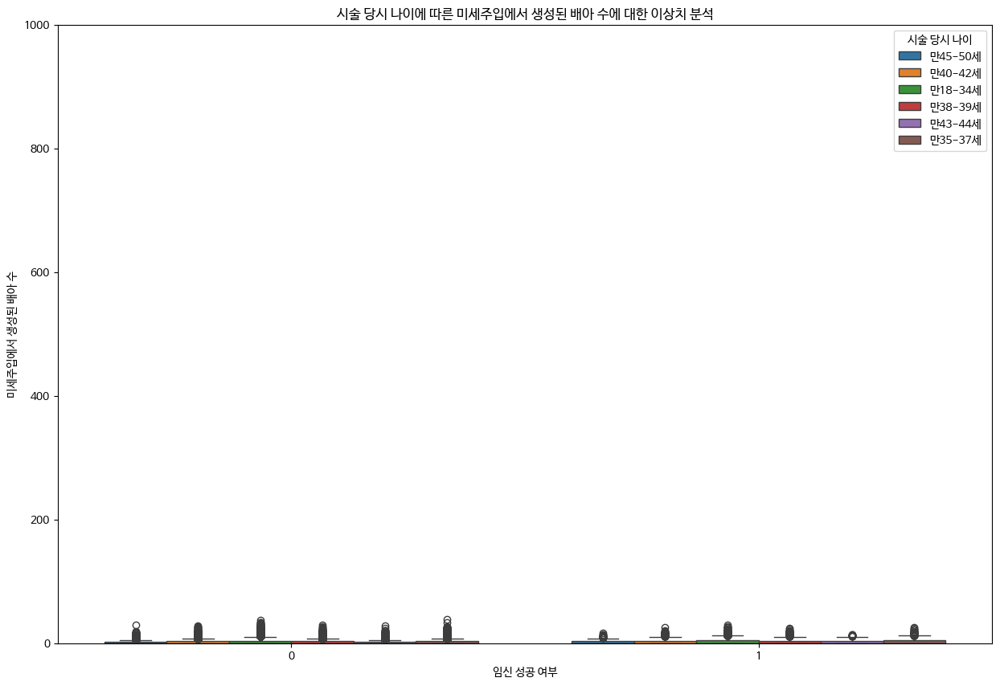

In [ ]:
plt.figure(figsize=(15, 10))
plt.title('시술 당시 나이에 따른 미세주입에서 생성된 배아 수에 대한 이상치 분석')
sns.boxplot(data=train, x='임신 성공 여부', y='미세주입에서 생성된 배아 수', hue='시술 당시 나이')
plt.ylim(0, 1000)
plt.show()

3. 저장된 신선 난자 수

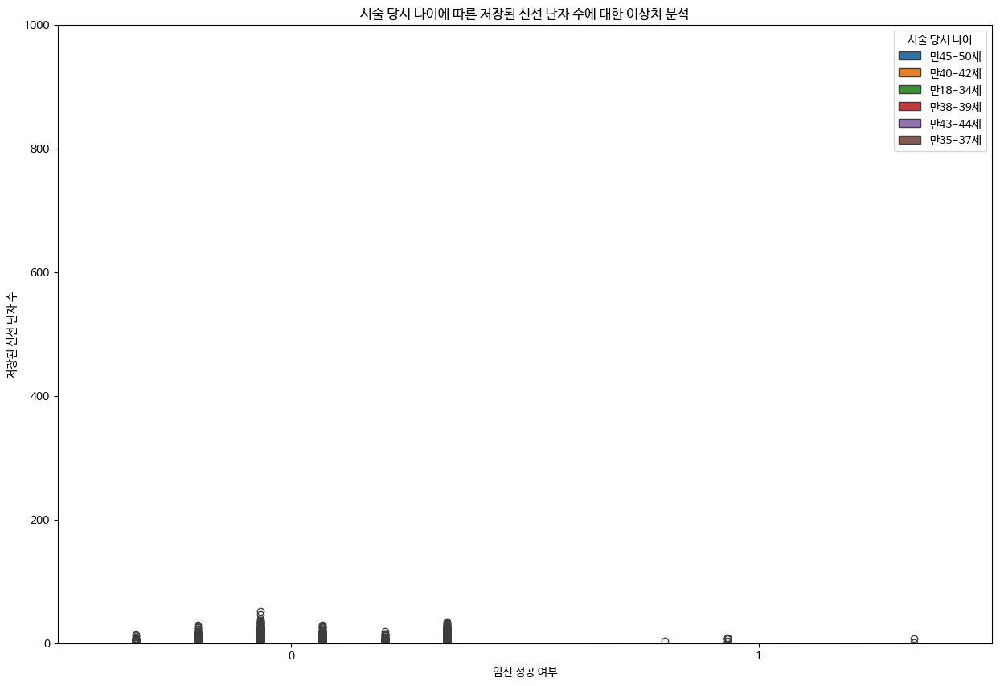

In [ ]:
plt.figure(figsize=(15, 10))
plt.title('시술 당시 나이에 따른 저장된 신선 난자 수에 대한 이상치 분석')
sns.boxplot(data=train, x='임신 성공 여부', y='저장된 신선 난자 수', hue='시술 당시 나이')
plt.ylim(0, 1000)
plt.show()

4. 미세주입에서 생성된 배아 수

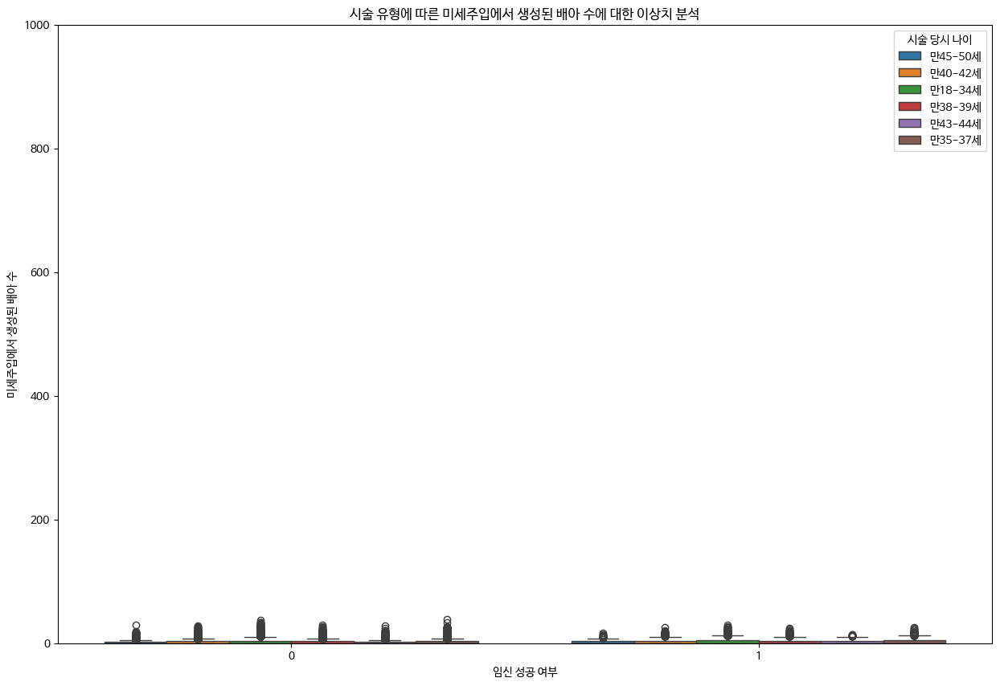

In [ ]:
plt.figure(figsize=(15, 10))
plt.title('시술 유형에 따른 미세주입에서 생성된 배아 수에 대한 이상치 분석')
sns.boxplot(data=train, x='임신 성공 여부', y='미세주입에서 생성된 배아 수', hue='시술 당시 나이')
plt.ylim(0, 1000)
plt.show()

5. 저장된 신선 난자 수

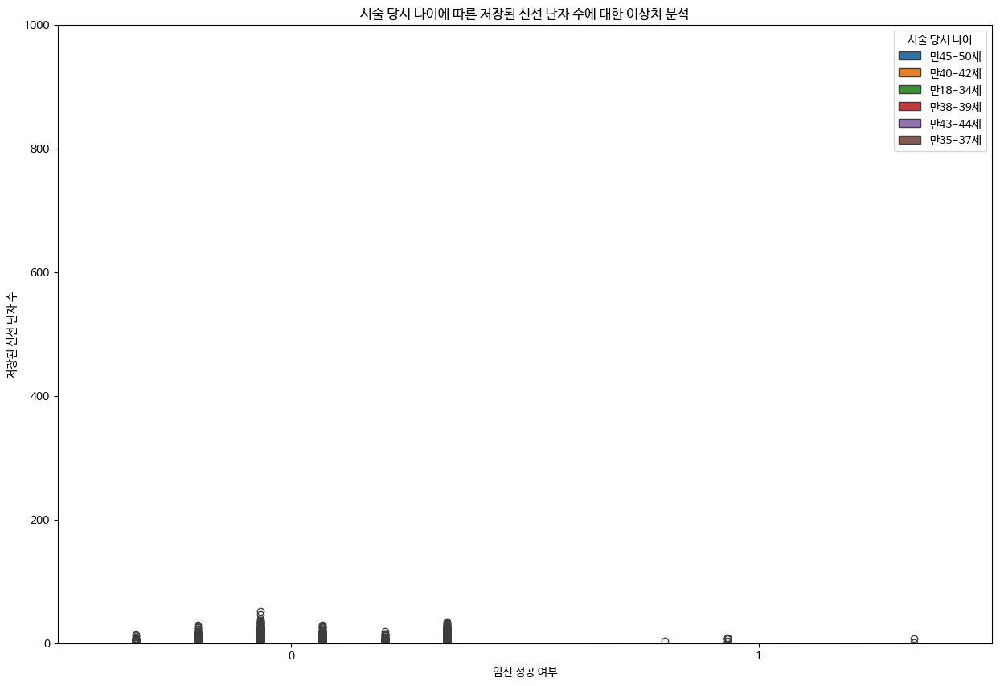

In [ ]:
plt.figure(figsize=(15, 10))
plt.title('시술 당시 나이에 따른 저장된 신선 난자 수에 대한 이상치 분석')
sns.boxplot(data=train, x='임신 성공 여부', y='저장된 신선 난자 수', hue='시술 당시 나이')
plt.ylim(0, 1000)
plt.show()

6. 수집된 신선 난자 수

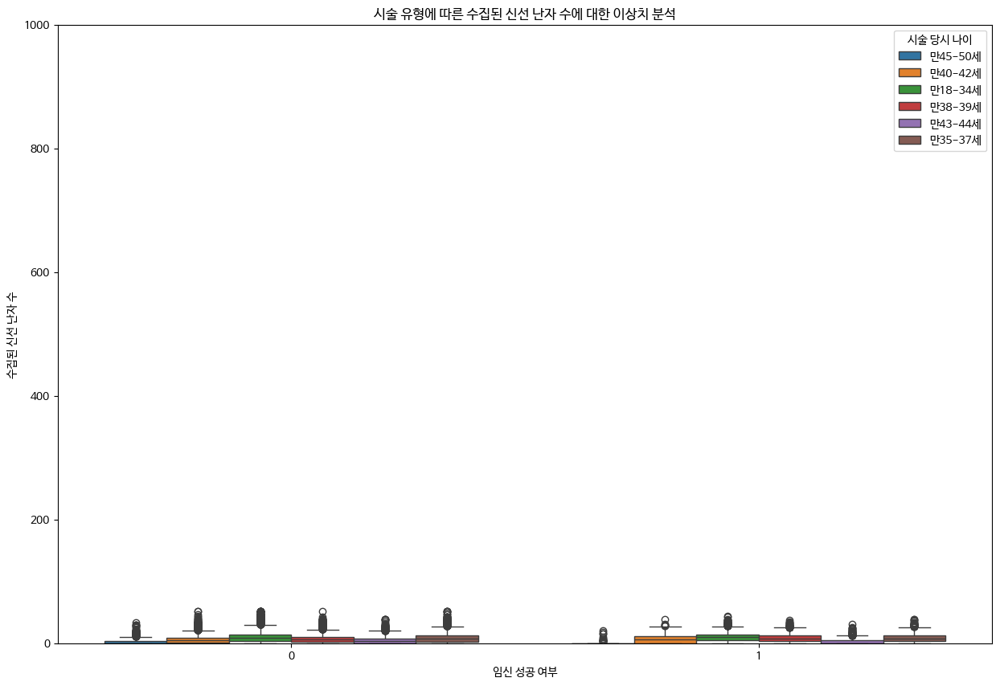

In [ ]:
plt.figure(figsize=(15, 10))
plt.title('시술 유형에 따른 수집된 신선 난자 수에 대한 이상치 분석')
sns.boxplot(data=train, x='임신 성공 여부', y='수집된 신선 난자 수', hue='시술 당시 나이')
plt.ylim(0, 1000)
plt.show()

7. 혼합된 난자 수


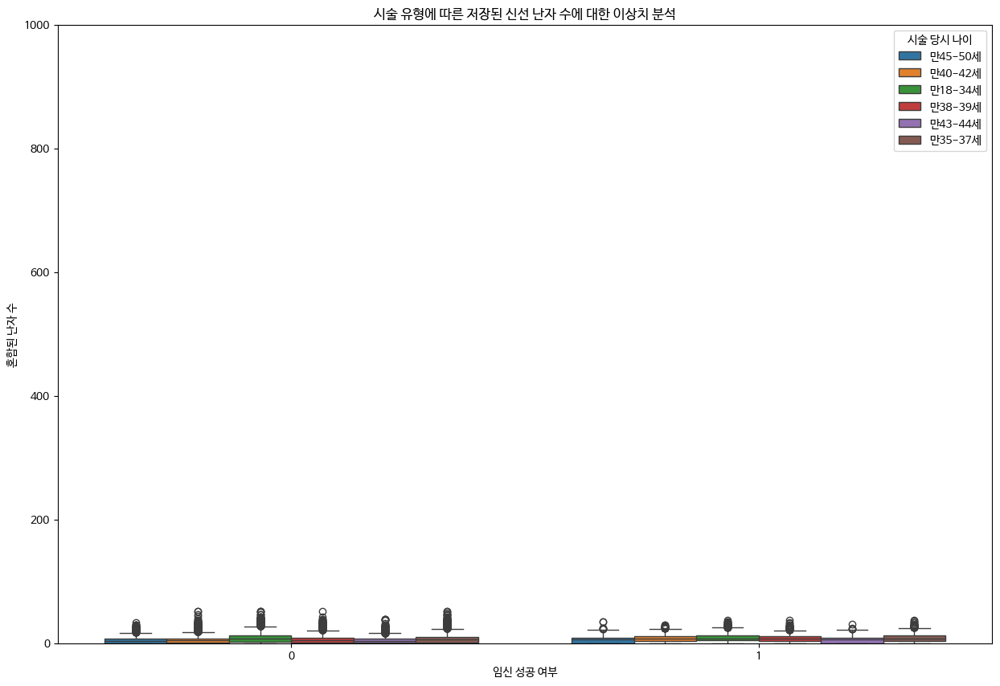

In [ ]:
plt.figure(figsize=(15, 10))
plt.title('시술 유형에 따른 저장된 신선 난자 수에 대한 이상치 분석')
sns.boxplot(data=train, x='임신 성공 여부', y='혼합된 난자 수', hue='시술 당시 나이')
plt.ylim(0, 1000)
plt.show()

8. 난자 해동 경과일


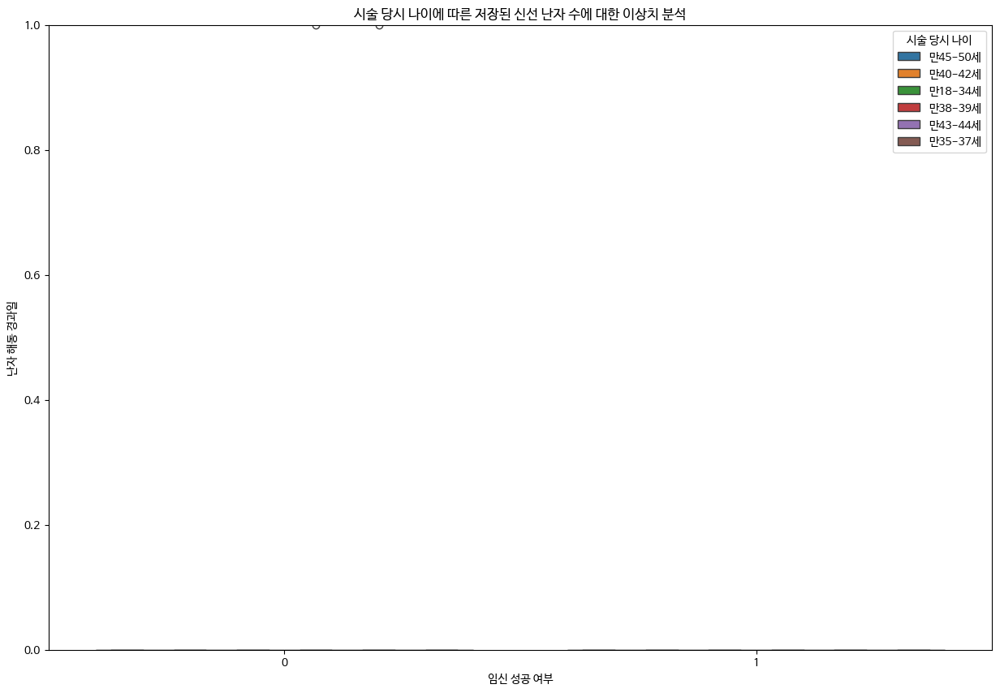

In [ ]:
plt.figure(figsize=(15, 10))
plt.title('시술 당시 나이에 따른 저장된 신선 난자 수에 대한 이상치 분석')
sns.boxplot(data=train, x='임신 성공 여부', y='난자 해동 경과일', hue='시술 당시 나이')
plt.ylim(0, 1)
plt.show()

9. 난자 혼합 경과일


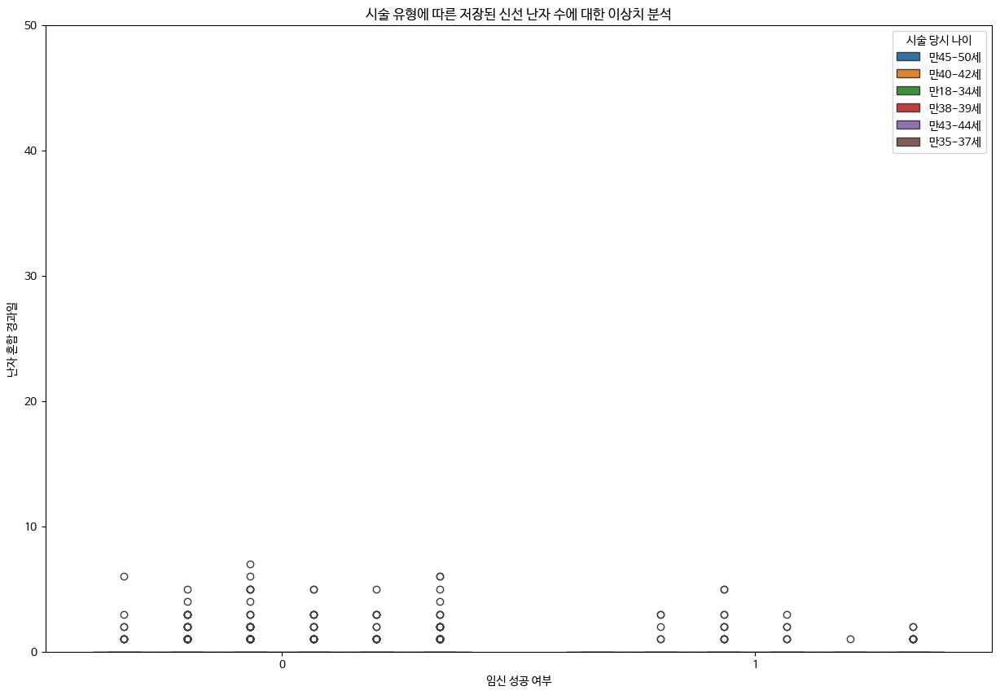

In [ ]:
plt.figure(figsize=(15, 10))
plt.title('시술 유형에 따른 저장된 신선 난자 수에 대한 이상치 분석')
sns.boxplot(data=train, x='임신 성공 여부', y='난자 혼합 경과일', hue='시술 당시 나이')
plt.ylim(0, 50)
plt.show()

10. 난자 채취 경과일

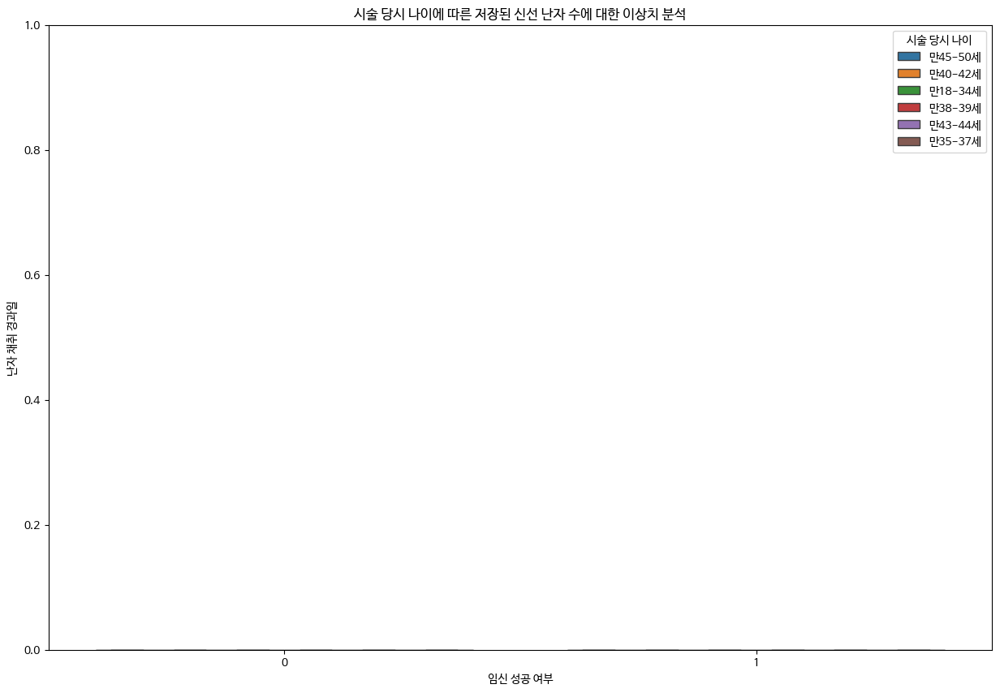

In [ ]:
plt.figure(figsize=(15, 10))
plt.title('시술 당시 나이에 따른 저장된 신선 난자 수에 대한 이상치 분석')
sns.boxplot(data=train, x='임신 성공 여부', y='난자 채취 경과일', hue='시술 당시 나이')
plt.ylim(0, 1)
plt.show()

### Data Pre-processing

In [ ]:
train.head()

,시술 시기 코드,시술 당시 나이,임신 시도 또는 마지막 임신 경과 연수,특정 시술 유형,배란 자극 여부,배란 유도 유형,단일 배아 이식 여부,착상 전 유전 검사 사용 여부,착상 전 유전 진단 사용 여부,남성 주 불임 원인,...,기증 배아 사용 여부,대리모 여부,PGD 시술 여부,PGS 시술 여부,난자 채취 경과일,난자 해동 경과일,난자 혼합 경과일,배아 이식 경과일,배아 해동 경과일,임신 성공 여부
1,TRYBLT,만45-50세,9,ICSI,0,알 수 없음,0,1,0,0,...,0,0,1,1,0,0,0,3,0,0
7,TRXQMD,만40-42세,9,IVF,1,기록되지 않은 시행,0,1,0,0,...,0,0,1,1,0,0,0,5,0,0
9,TRYBLT,만18-34세,9,IVF,1,기록되지 않은 시행,0,1,0,0,...,0,0,1,1,0,0,0,3,0,0
10,TRCMWS,만40-42세,9,Unknown,0,알 수 없음,0,1,0,0,...,0,0,1,1,0,0,0,1,0,0
11,TRZKPL,만40-42세,9,ICSI,1,기록되지 않은 시행,0,1,0,0,...,0,0,1,1,0,0,0,2,0,0


In [ ]:
test.head()

,시술 시기 코드,시술 당시 나이,임신 시도 또는 마지막 임신 경과 연수,특정 시술 유형,배란 자극 여부,배란 유도 유형,단일 배아 이식 여부,착상 전 유전 검사 사용 여부,착상 전 유전 진단 사용 여부,남성 주 불임 원인,...,신선 배아 사용 여부,기증 배아 사용 여부,대리모 여부,PGD 시술 여부,PGS 시술 여부,난자 채취 경과일,난자 해동 경과일,난자 혼합 경과일,배아 이식 경과일,배아 해동 경과일
0,TRYBLT,만35-37세,9,IVF,1,기록되지 않은 시행,0,1,0,0,...,1,0,0,1,1,0,0,0,3,0
1,TRDQAZ,만18-34세,9,IVF,1,기록되지 않은 시행,0,1,0,0,...,1,0,0,1,1,0,0,0,3,0
2,TRCMWS,만40-42세,9,ICSI,1,기록되지 않은 시행,0,1,0,0,...,1,0,0,1,1,0,0,0,3,0
3,TRJXFG,만40-42세,9,ICSI,1,기록되지 않은 시행,0,1,0,0,...,1,0,0,1,1,0,0,0,2,0
4,TRJXFG,만35-37세,9,ICSI,1,기록되지 않은 시행,0,1,0,0,...,1,0,0,1,1,0,0,0,5,0


In [ ]:
# 시술 유형
def convert_curse_type(x):
  if x == 'IVF':
    return 1
  elif x == 'ICSI':
    return 2
  else:
    return 3
# 시술 변환 함수
def cou(x):
  if x == '0회':
    return 0
  elif x == '1회':
    return 1
  elif x == '2회':
    return 2
  elif x == '3회':
    return 3
  elif x == '4회':
    return 4
  elif x == '5회':
    return 5
  else:
    return 6
# 시술 유형 역변환 함수
def convert_curse_type_reverse(x):
  if x == 1:
    return 'IVF'
  elif x == 2:
    return 'ICSI'
  else:
    return 'DI'
# 시술 역변환 함수
def cou_reverse(x):
  if x == 0:
    return '0회'
  elif x == 1:
    return '1회'
  elif x == 2:
    return '2회'
  elif x == 3:
    return '3회'
  elif x == 4:
    return '4회'
  elif x == 5:
    return '5회'
  else:
    return '6회 이상'

In [ ]:
# 범주형을 정수로 변환
# 시술 유형
train['특정 시술 유형'] = train['특정 시술 유형'].apply(convert_curse_type)
test['특정 시술 유형'] = test['특정 시술 유형'].apply(convert_curse_type)
# 총 시술 횟수, 클리닉 내 총 시술 횟수, IVF 시술 횟수, DI 시술 횟수
train['총 시술 횟수'] = train['총 시술 횟수'].apply(cou)
test['총 시술 횟수'] = test['총 시술 횟수'].apply(cou)
train['클리닉 내 총 시술 횟수'] = train['클리닉 내 총 시술 횟수'].apply(cou)
test['클리닉 내 총 시술 횟수'] = test['클리닉 내 총 시술 횟수'].apply(cou)
train['IVF 시술 횟수'] = train['IVF 시술 횟수'].apply(cou)
test['IVF 시술 횟수'] = test['IVF 시술 횟수'].apply(cou)
train['DI 시술 횟수'] = train['DI 시술 횟수'].apply(cou)
test['DI 시술 횟수'] = test['DI 시술 횟수'].apply(cou)
# 총 임신 횟수, IVF 임신 횟수, DI 임신 횟수
train['총 임신 횟수'] = train['총 임신 횟수'].apply(cou)
test['총 임신 횟수'] = test['총 임신 횟수'].apply(cou)
train['IVF 임신 횟수'] = train['IVF 임신 횟수'].apply(cou)
test['IVF 임신 횟수'] = test['IVF 임신 횟수'].apply(cou)
train['DI 임신 횟수'] = train['DI 임신 횟수'].apply(cou)
test['DI 임신 횟수'] = test['DI 임신 횟수'].apply(cou)
# 총 출산 횟수, IVF 출산 횟수, DI 출산 횟수
train['총 출산 횟수'] = train['총 출산 횟수'].apply(cou)
test['총 출산 횟수'] = test['총 출산 횟수'].apply(cou)
train['IVF 출산 횟수'] = train['IVF 출산 횟수'].apply(cou)
test['IVF 출산 횟수'] = test['IVF 출산 횟수'].apply(cou)
train['DI 출산 횟수'] = train['DI 출산 횟수'].apply(cou)
test['DI 출산 횟수'] = test['DI 출산 횟수'].apply(cou)
train = train.astype({'임신 시도 또는 마지막 임신 경과 연수': 'float64'})
test = test.astype({'임신 시도 또는 마지막 임신 경과 연수': 'float64'})
train = train.astype({'총 시술 횟수': 'float64', '클리닉 내 총 시술 횟수': 'float64',
                      'IVF 시술 횟수': 'float64', 'DI 시술 횟수': 'float64'})
test = test.astype({'총 시술 횟수': 'float64', '클리닉 내 총 시술 횟수': 'float64',
                      'IVF 시술 횟수': 'float64', 'DI 시술 횟수': 'float64'})
train = train.astype({'총 임신 횟수': 'float64',
                      'IVF 임신 횟수': 'float64', 'DI 임신 횟수': 'float64'})
test = test.astype({'총 임신 횟수': 'float64',
                      'IVF 임신 횟수': 'float64', 'DI 임신 횟수': 'float64'})
train = train.astype({'총 출산 횟수': 'float64',
                      'IVF 출산 횟수': 'float64', 'DI 출산 횟수': 'float64'})
test = test.astype({'총 시술 횟수': 'float64',
                      'IVF 출산 횟수': 'float64', 'DI 출산 횟수': 'float64'})

1년당 시술 주기, (All Cycles & IVF and ICSI cycles & Donor insemination),

In [ ]:
train['총 시술 주기'] = train['총 시술 횟수'] / (train['임신 시도 또는 마지막 임신 경과 연수'] * 365)
test['총 시술 주기'] = test['총 시술 횟수'] / (test['임신 시도 또는 마지막 임신 경과 연수'] * 365)
train.loc[train['총 시술 주기'] == np.inf, '총 시술 주기'] = 0
test.loc[test['총 시술 주기'] == np.inf, '총 시술 주기'] = 0
train['총 시술 주기'] = train['총 시술 주기'].fillna(0)
test['총 시술 주기'] = test['총 시술 주기'].fillna(0)
train['클리닉 시술 주기'] = train['클리닉 내 총 시술 횟수'] / (train['임신 시도 또는 마지막 임신 경과 연수'] * 365)
test['클리닉 시술 주기'] = test['클리닉 내 총 시술 횟수'] / (test['임신 시도 또는 마지막 임신 경과 연수'] * 365)
train.loc[train['클리닉 시술 주기'] == np.inf, '클리닉 시술 주기'] = 0
test.loc[test['클리닉 시술 주기'] == np.inf, '클리닉 시술 주기'] = 0
train['클리닉 시술 주기'] = train['클리닉 시술 주기'].fillna(0)
test['클리닉 시술 주기'] = test['클리닉 시술 주기'].fillna(0)
train['IVF 시술 주기'] = train['IVF 시술 횟수'] / (train['임신 시도 또는 마지막 임신 경과 연수'] * 365)
test['IVF 시술 주기'] = test['IVF 시술 횟수'] / (test['임신 시도 또는 마지막 임신 경과 연수'] * 365)
train.loc[train['IVF 시술 주기'] == np.inf, 'IVF 시술 주기'] = 0
test.loc[test['IVF 시술 주기'] == np.inf, 'IVF 시술 주기'] = 0
train['IVF 시술 주기'] = train['IVF 시술 주기'].fillna(0)
test['IVF 시술 주기'] = test['IVF 시술 주기'].fillna(0)
train['DI 시술 주기'] = train['DI 시술 횟수'] / (train['임신 시도 또는 마지막 임신 경과 연수'] * 365)
test['DI 시술 주기'] = test['DI 시술 횟수'] / (test['임신 시도 또는 마지막 임신 경과 연수'] * 365)
train.loc[train['DI 시술 주기'] == np.inf, 'DI 시술 주기'] = 0
test.loc[test['DI 시술 주기'] == np.inf, 'DI 시술 주기'] = 0
train['DI 시술 주기'] = train['DI 시술 주기'].fillna(0)
test['DI 시술 주기'] = test['DI 시술 주기'].fillna(0)

In [ ]:
train['IVF 시술 빈도 비율'] = train['IVF 시술 횟수'] / train['총 시술 횟수']
test['IVF 시술 빈도 비율'] = test['IVF 시술 횟수'] / test['총 시술 횟수']
train.loc[train['IVF 시술 빈도 비율'] == np.inf, ['IVF 시술 빈도 비율']] = 0
test.loc[test['IVF 시술 빈도 비율'] == np.inf, ['IVF 시술 빈도 비율']] = 0
train['IVF 시술 빈도 비율'] = train['IVF 시술 횟수'] / train['총 시술 횟수']
test['IVF 시술 빈도 비율'] = test['IVF 시술 횟수'] / test['총 시술 횟수']
train.loc[train['IVF 시술 빈도 비율'] == np.inf, ['IVF 시술 빈도 비율']] = 0
test.loc[test['IVF 시술 빈도 비율'] == np.inf, ['IVF 시술 빈도 비율']] = 0
train['IVF 시술 빈도 비율'] = train['IVF 시술 빈도 비율'].fillna(0)
test['IVF 시술 빈도 비율'] = test['IVF 시술 빈도 비율'].fillna(0)

IVF 임신율/출산율, DI 임신율/출산율(IVF birth and pregnancy rates, DI birth and pregnancy rates)

In [ ]:
train['IVF 임신율'] = train['IVF 임신 횟수'] / train['IVF 시술 횟수']
test['IVF 임신율'] = test['IVF 임신 횟수'] / test['IVF 시술 횟수']
train.loc[train['IVF 임신율'] == np.inf, 'IVF 임신율'] = 0
test.loc[test['IVF 임신율'] == np.inf, 'IVF 임신율'] = 0
train['IVF 임신율'] = train['IVF 임신율'].fillna(0)
test['IVF 임신율'] = test['IVF 임신율'].fillna(0)
train['DI 임신율'] = train['DI 임신 횟수'] / train['DI 시술 횟수']
test['DI 임신율'] = test['DI 임신 횟수'] / test['DI 시술 횟수']
train.loc[train['DI 임신율'] == np.inf, 'DI 임신율'] = 0
test.loc[test['DI 임신율'] == np.inf, 'DI 임신율'] = 0
train['DI 임신율'] = train['DI 임신율'].fillna(0)
test['DI 임신율'] = test['DI 임신율'].fillna(0)
train['IVF 출산율'] = train['IVF 출산 횟수'] / train['IVF 임신 횟수']
test['IVF 출산율'] = test['IVF 출산 횟수'] / test['IVF 임신 횟수']
train.loc[train['IVF 출산율'] == np.inf, 'IVF 출산율'] = 0
test.loc[test['IVF 출산율'] == np.inf, 'IVF 출산율'] = 0
train['IVF 출산율'] = train['IVF 출산율'].fillna(0)
test['IVF 출산율'] = test['IVF 출산율'].fillna(0)
train['DI 출산율'] = train['DI 출산 횟수'] / train['DI 임신 횟수']
test['DI 출산율'] = test['DI 출산 횟수'] / test['DI 임신 횟수']
train.loc[train['DI 출산율'] == np.inf, 'DI 출산율'] = 0
test.loc[test['DI 출산율'] == np.inf, 'DI 출산율'] = 0
train['DI 출산율'] = train['DI 출산율'].fillna(0)
test['DI 출산율'] = test['DI 출산율'].fillna(0)

정자/난자 기증자 -> 난자출처, 정자출처(기증 제공)

Funding(기금 비율)

In [ ]:
train['기금 비율'] = train['클리닉 내 총 시술 횟수'] / train['총 시술 횟수']
test['기금 비율'] = test['클리닉 내 총 시술 횟수'] / test['총 시술 횟수']
train.loc[train['기금 비율'] == np.inf, '기금 비율'] = 0
test.loc[test['기금 비율'] == np.inf, '기금 비율'] = 0
train['기금 비율'] = train['기금 비율'].fillna(0)
test['기금 비율'] = test['기금 비율'].fillna(0)

Egg freeze and thaw - 해동 난자와 동결하였을 때 주기당 해동 난자 수,

In [ ]:
train['주기당 해동 난자 수'] = train['해동 난자 수'] / train['난자 해동 경과일']
test['주기당 해동 난자 수'] = test['해동 난자 수'] / test['난자 해동 경과일']
train.loc[train['주기당 해동 난자 수'] == np.inf, '주기당 해동 난자 수'] = 0
test.loc[test['주기당 해동 난자 수'] == np.inf, '주기당 해동 난자 수'] = 0
train['주기당 해동 난자 수'] = train['주기당 해동 난자 수'].fillna(0)
test['주기당 해동 난자 수'] = test['주기당 해동 난자 수'].fillna(0)

In [ ]:
train['주기당 해동된 배아 수'] = train['해동된 배아 수'] / train['배아 해동 경과일']
test['주기당 해동된 배아 수'] = test['해동된 배아 수'] / test['배아 해동 경과일']
train.loc[train['주기당 해동된 배아 수'] == np.inf, '주기당 해동된 배아 수'] = 0
test.loc[test['주기당 해동된 배아 수'] == np.inf, '주기당 해동된 배아 수'] = 0
train['주기당 해동된 배아 수'] = train['주기당 해동된 배아 수'].fillna(0)
test['주기당 해동된 배아 수'] = test['주기당 해동된 배아 수'].fillna(0)

Multiple births(다태아률, 및 다태아 이식률)

In [ ]:
train['다태아률'] = train['총 출산 횟수'] / (train['총 생성 배아 수'] + train['이식된 배아 수'])
test['다태아률'] = test['총 출산 횟수'] / (test['총 생성 배아 수'] + test['이식된 배아 수'])
train.loc[train['다태아률'] == np.inf, '다태아률'] = 0
test.loc[test['다태아률'] == np.inf, '다태아률'] = 0
train['다태아률'] = train['다태아률'].fillna(0)
test['다태아률'] = test['다태아률'].fillna(0)

기타 수치형 다루기

In [ ]:
train['미세주입된 배아 비율'] = train['미세주입에서 생성된 배아 수'] / train['총 생성 배아 수']
test['미세주입된 배아 비율'] = test['미세주입에서 생성된 배아 수'] / test['총 생성 배아 수']
train.loc[train['미세주입된 배아 비율'] == np.inf, '미세주입된 배아 비율'] = 0
test.loc[test['미세주입된 배아 비율'] == np.inf, '미세주입된 배아 비율'] = 0
train['미세주입된 배아 비율'] = train['미세주입된 배아 비율'].fillna(0)
test['미세주입된 배아 비율'] = test['미세주입된 배아 비율'].fillna(0)
train['미세주입된 난자 중 배아 생성율'] = train['미세주입에서 생성된 배아 수'] / train['미세주입된 난자 수']
test['미세주입된 난자 중 배아 생성율'] = test['미세주입에서 생성된 배아 수'] / test['미세주입된 난자 수']
train.loc[train['미세주입된 난자 중 배아 생성율'] == np.inf, '미세주입된 난자 중 배아 생성율'] = 0
test.loc[test['미세주입된 난자 중 배아 생성율'] == np.inf, '미세주입된 난자 중 배아 생성율'] = 0
train['미세주입된 난자 중 배아 생성율'] = train['미세주입된 난자 중 배아 생성율'].fillna(0)
test['미세주입된 난자 중 배아 생성율'] = test['미세주입된 난자 중 배아 생성율'].fillna(0)

In [ ]:
train['미세주입 배아 이식율'] = train['미세주입 배아 이식 수'] / train['미세주입된 난자 수']
test['미세주입 배아 이식율'] = test['미세주입 배아 이식 수'] / test['미세주입된 난자 수']
train.loc[train['미세주입 배아 이식율'] == np.inf, '미세주입 배아 이식율'] = 0
test.loc[test['미세주입 배아 이식율'] == np.inf, '미세주입 배아 이식율'] = 0
train['미세주입 배아 이식율'] = train['미세주입 배아 이식율'].fillna(0)
test['미세주입 배아 이식율'] = test['미세주입 배아 이식율'].fillna(0)
train['미세주입 배아 저장율'] = train['미세주입 후 저장된 배아 수'] / (train['미세주입에서 생성된 배아 수'] + train['미세주입 배아 이식 수'])
test['미세주입 배아 저장율'] = test['미세주입 후 저장된 배아 수'] / (test['미세주입에서 생성된 배아 수'] + test['미세주입 배아 이식 수'])
train.loc[train['미세주입 배아 저장율'] == np.inf, '미세주입 배아 저장율'] = 0
test.loc[test['미세주입 배아 저장율'] == np.inf, '미세주입 배아 저장율'] = 0
train['미세주입 배아 저장율'] = train['미세주입 배아 저장율'].fillna(0)
test['미세주입 배아 저장율'] = test['미세주입 배아 저장율'].fillna(0)

In [ ]:
train['주기당 이식된 배아 수'] = train['이식된 배아 수'] / train['배아 이식 경과일']
test['주기당 이식된 배아 수'] = test['이식된 배아 수'] / test['배아 이식 경과일']
train.loc[train['주기당 이식된 배아 수'] == np.inf, '주기당 이식된 배아 수'] = 0
test.loc[test['주기당 이식된 배아 수'] == np.inf, '주기당 이식된 배아 수'] = 0
train['주기당 이식된 배아 수'] = train['주기당 이식된 배아 수'].fillna(0)
test['주기당 이식된 배아 수'] = test['주기당 이식된 배아 수'].fillna(0)

In [ ]:
train['주기당 해동된 배아 수'] = train['해동된 배아 수'] / train['배아 해동 경과일']
test['주기당 해동된 배아 수'] = test['해동된 배아 수'] / test['배아 해동 경과일']
train.loc[train['주기당 해동된 배아 수'] == np.inf, '주기당 해동된 배아 수'] = 0
test.loc[test['주기당 해동된 배아 수'] == np.inf, '주기당 해동된 배아 수'] = 0
train['주기당 해동된 배아 수'] = train['주기당 해동된 배아 수'].fillna(0)
test['주기당 해동된 배아 수'] = test['주기당 해동된 배아 수'].fillna(0)

In [ ]:
train['주기당 채취 신선 난자 수'] = train['수집된 신선 난자 수'] / train['난자 채취 경과일']
test['주기당 채취 신선 난자 수'] = test['수집된 신선 난자 수'] / test['난자 채취 경과일']
train.loc[train['주기당 채취 신선 난자 수'] == np.inf, '주기당 채취 신선 난자 수'] = 0
test.loc[test['주기당 채취 신선 난자 수'] == np.inf, '주기당 채취 신선 난자 수'] = 0
train['주기당 채취 신선 난자 수'] = train['주기당 채취 신선 난자 수'].fillna(0)
test['주기당 채취 신선 난자 수'] = test['주기당 채취 신선 난자 수'].fillna(0)

In [ ]:
train['주기당 혼합된 난자 수'] = train['혼합된 난자 수'] / train['난자 혼합 경과일']
test['주기당 혼합된 난자 수'] = test['혼합된 난자 수'] / test['난자 혼합 경과일']
train.loc[train['주기당 혼합된 난자 수'] == np.inf, '주기당 혼합된 난자 수'] = 0
test.loc[test['주기당 혼합된 난자 수'] == np.inf, '주기당 혼합된 난자 수'] = 0
train['주기당 혼합된 난자 수'] = train['주기당 혼합된 난자 수'].fillna(0)
test['주기당 혼합된 난자 수'] = test['주기당 혼합된 난자 수'].fillna(0)

In [ ]:
train['저장된 신선 난자 비율'] = train['저장된 신선 난자 수'] / train['수집된 신선 난자 수']
test['저장된 신선 난자 비율'] = test['저장된 신선 난자 수'] / test['수집된 신선 난자 수']
train.loc[train['저장된 신선 난자 비율'] == np.inf, '저장된 신선 난자 비율'] = 0
test.loc[test['저장된 신선 난자 비율'] == np.inf, '저장된 신선 난자 비율'] = 0
train['저장된 신선 난자 비율'] = train['저장된 신선 난자 비율'].fillna(0)
test['저장된 신선 난자 비율'] = test['저장된 신선 난자 비율'].fillna(0)

In [ ]:
train['기증자 혼합된 난자 비율'] = train['기증자 정자와 혼합된 난자 수'] / train['혼합된 난자 수']
test['기증자 혼합된 난자 비율'] = test['기증자 정자와 혼합된 난자 수'] / test['혼합된 난자 수']
train.loc[train['기증자 혼합된 난자 비율'] == np.inf, '기증자 혼합된 난자 비율'] = 0
test.loc[test['기증자 혼합된 난자 비율'] == np.inf, '기증자 혼합된 난자 비율'] = 0
train['기증자 혼합된 난자 비율'] = train['기증자 혼합된 난자 비율'].fillna(0)
test['기증자 혼합된 난자 비율'] = test['기증자 혼합된 난자 비율'].fillna(0)

In [ ]:
# 범주형을 정수로 변환
# 시술 유형
train['특정 시술 유형'] = train['특정 시술 유형'].apply(convert_curse_type_reverse)
test['특정 시술 유형'] = test['특정 시술 유형'].apply(convert_curse_type_reverse)
# 총 시술 횟수, 클리닉 내 총 시술 횟수, IVF 시술 횟수, DI 시술 횟수
train['총 시술 횟수'] = train['총 시술 횟수'].apply(cou_reverse)
test['총 시술 횟수'] = test['총 시술 횟수'].apply(cou_reverse)
train['클리닉 내 총 시술 횟수'] = train['클리닉 내 총 시술 횟수'].apply(cou_reverse)
test['클리닉 내 총 시술 횟수'] = test['클리닉 내 총 시술 횟수'].apply(cou_reverse)
train['IVF 시술 횟수'] = train['IVF 시술 횟수'].apply(cou_reverse)
test['IVF 시술 횟수'] = test['IVF 시술 횟수'].apply(cou_reverse)
train['DI 시술 횟수'] = train['DI 시술 횟수'].apply(cou_reverse)
test['DI 시술 횟수'] = test['DI 시술 횟수'].apply(cou_reverse)
# 총 임신 횟수, IVF 임신 횟수, DI 임신 횟수
train['총 임신 횟수'] = train['총 임신 횟수'].apply(cou_reverse)
test['총 임신 횟수'] = test['총 임신 횟수'].apply(cou_reverse)
train['IVF 임신 횟수'] = train['IVF 임신 횟수'].apply(cou_reverse)
test['IVF 임신 횟수'] = test['IVF 임신 횟수'].apply(cou_reverse)
train['DI 임신 횟수'] = train['DI 임신 횟수'].apply(cou_reverse)
test['DI 임신 횟수'] = test['DI 임신 횟수'].apply(cou_reverse)
# 총 출산 횟수, IVF 출산 횟수, DI 출산 횟수
train['총 출산 횟수'] = train['총 출산 횟수'].apply(cou_reverse)
test['총 출산 횟수'] = test['총 출산 횟수'].apply(cou_reverse)
train['IVF 출산 횟수'] = train['IVF 출산 횟수'].apply(cou_reverse)
test['IVF 출산 횟수'] = test['IVF 출산 횟수'].apply(cou_reverse)
train['DI 출산 횟수'] = train['DI 출산 횟수'].apply(cou_reverse)
test['DI 출산 횟수'] = test['DI 출산 횟수'].apply(cou_reverse)
train = train.astype({'임신 시도 또는 마지막 임신 경과 연수': 'int64'})
test = test.astype({'임신 시도 또는 마지막 임신 경과 연수': 'int64'})
train = train.astype({
    '총 시술 횟수': 'str',
    '클리닉 내 총 시술 횟수': 'str',
    'IVF 시술 횟수': 'str',
    'DI 시술 횟수': 'str',
    '총 임신 횟수': 'str',
    'IVF 임신 횟수': 'str',
    'DI 임신 횟수': 'str',
    '총 출산 횟수': 'str',
    'IVF 출산 횟수': 'str',
    'DI 출산 횟수': 'str'
})
test = test.astype({
    '총 시술 횟수': 'str',
    '클리닉 내 총 시술 횟수': 'str',
    'IVF 시술 횟수': 'str',
    'DI 시술 횟수': 'str',
    '총 임신 횟수': 'str',
    'IVF 임신 횟수': 'str',
    'DI 임신 횟수': 'str',
    '총 출산 횟수': 'str',
    'IVF 출산 횟수': 'str',
    'DI 출산 횟수': 'str'
})

In [ ]:
X = train.drop('임신 성공 여부', axis=1)
y = train['임신 성공 여부']

In [ ]:
categorical_columns = [
    "시술 시기 코드",
    "시술 당시 나이",
    "특정 시술 유형",
    "배란 유도 유형",
    "배아 생성 주요 이유",
    "총 시술 횟수",
    "클리닉 내 총 시술 횟수",
    "IVF 시술 횟수",
    "DI 시술 횟수",
    "총 임신 횟수",
    "IVF 임신 횟수",
    "DI 임신 횟수",
    "총 출산 횟수",
    "IVF 출산 횟수",
    "DI 출산 횟수",
    "난자 출처",
    "정자 출처",
    "난자 기증자 나이",
    "정자 기증자 나이"
]
numeric_columns = [
    "임신 시도 또는 마지막 임신 경과 연수",
    "총 생성 배아 수",
    "미세주입된 난자 수",
    "미세주입에서 생성된 배아 수",
    "이식된 배아 수",
    "미세주입 배아 이식 수",
    "저장된 배아 수",
    "미세주입 후 저장된 배아 수",
    "해동된 배아 수",
    "해동 난자 수",
    "수집된 신선 난자 수",
    "저장된 신선 난자 수",
    "혼합된 난자 수",
    "파트너 정자와 혼합된 난자 수",
    "기증자 정자와 혼합된 난자 수",
    "난자 채취 경과일",
    "난자 해동 경과일",
    "난자 혼합 경과일",
    "배아 이식 경과일",
    "배아 해동 경과일"
]

In [ ]:
for cate_col in categorical_columns:
    X[cate_col] = X[cate_col].astype('category')
    test[cate_col] = test[cate_col].astype('category')

In [ ]:
ordinal_encoder = OrdinalEncoder(handle_unknown='use_encoded_value', unknown_value=-1)

X_train_encoded = X.copy()
X_train_encoded[categorical_columns] = ordinal_encoder.fit_transform(X[categorical_columns])

X_test_encoded = test.copy()
X_test_encoded[categorical_columns] = ordinal_encoder.transform(test[categorical_columns])

범주형 상관 관계 히트맵으로 그리기

In [ ]:
# 범주형 상관 관계 히트맵
numeric_list = [
    '시술 시기 코드',
    '시술 당시 나이',
    '특정 시술 유형',
    '배란 자극 여부',
    '배란 유도 유형',
    '단일 배아 이식 여부',
    '착상 전 유전 검사 사용 여부',
    '착상 전 유전 진단 사용 여부',
    '남성 주 불임 원인',
    '남성 부 불임 원인',
    '여성 주 불임 원인',
    '여성 부 불임 원인',
    '부부 주 불임 원인',
    '부부 부 불임 원인',
    '불명확 불임 원인',
    '불임 원인 - 난관 질환',
    '불임 원인 - 남성 요인',
    '불임 원인 - 배란 장애',
    '불임 원인 - 여성 요인',
    '불임 원인 - 자궁경부 문제',
    '불임 원인 - 자궁내막증',
    '불임 원인 - 정자 농도',
    '불임 원인 - 정자 면역학적 요인',
    '불임 원인 - 정자 운동성',
    '불임 원인 - 정자 형태',
    '총 시술 횟수',
    '클리닉 내 총 시술 횟수',
    'IVF 시술 횟수',
    'DI 시술 횟수',
    '총 임신 횟수',
    'IVF 임신 횟수',
    'DI 임신 횟수',
    '총 출산 횟수',
    'IVF 출산 횟수',
    'DI 출산 횟수',
    '난자 출처',
    '정자 출처',
    '난자 기증자 나이',
    '정자 기증자 나이',
    '동결 배아 사용 여부',
    '신선 배아 사용 여부',
    '기증 배아 사용 여부',
    '대리모 여부',
    'PGD 시술 여부',
    'PGS 시술 여부'
]
# 시술 시기 코드, 시술 당시 나이, 시술 유형
heatmap_1 = X_train_encoded.loc[:, numeric_list[0:3]].corr()
# 배란 자극 여부, 배란 유도 유형
heatmap_2 = X_train_encoded.loc[:, numeric_list[3:5]].corr()
# 단일 배아 이식 여부, 착상 전 유전 검사 사용 여부, 착상 전 유전 진단 사용 여부
heatmap_3 = X_train_encoded.loc[:, numeric_list[5:8]].corr()
# 남성 주 불임 원인, '남성 부 불임 원인', '여성 주 불임 원인', '여성 부 불임 원인', '부부 주 불임 원인', '부부 부 불임 원인', '불명확 불임 원인'
heatmap_4 = X_train_encoded.loc[:, numeric_list[8:15]].corr()
# '불임 원인 - 난관 질환', '불임 원인 - 남성 요인', '불임 원인 - 배란 장애', '불임 원인 - 여성 요인', '불임 원인 - 자궁경부 문제', '불임 원인 - 자궁내막증', '불임 원인 - 정자 농도', '불임 원인 - 정자 면역학적 요인', '불임 원인 - 정자 운동성', '불임 원인 - 정자 형태'
heatmap_5 = X_train_encoded.loc[:, numeric_list[15:25]].corr()
# 총 시술 횟수, 클리닉 내 총 시술 횟수, IVF 시술 횟수, DI 시술 횟수
heatmap_6 = X_train_encoded.loc[:, numeric_list[25:29]].corr()
# 총 임신 횟수, IVF 임신 횟수, DI 임신 횟수
heatmap_7 = X_train_encoded.loc[:, numeric_list[29:32]].corr()
# 총 출산 횟수, IVF 츨산 횟수, DI 출산 횟수
heatmap_8 = X_train_encoded.loc[:, numeric_list[32:35]].corr()
# 난자 출처, 정자 출처, 난자 기증자 나이, 정자 기증자 나이
heatmap_9 = X_train_encoded.loc[:, numeric_list[35:39]].corr()
# 동결 배아 사용 여부, 신선 배아 사용 여부. 기증 배아 사용 여부, 대리모 여부
heatmap_10 = X_train_encoded.loc[:, numeric_list[39:43]].corr()
# PGD 시술 여부, PGS 시술 여부
heatmap_11 = X_train_encoded.loc[:, numeric_list[43:]].corr()


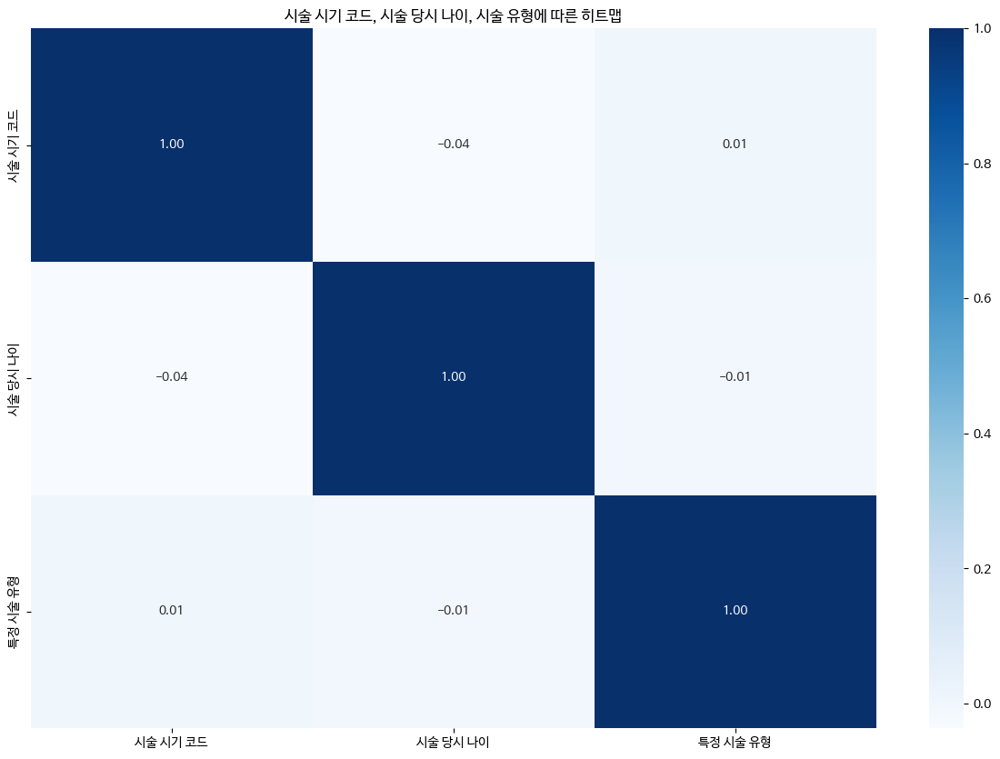

In [ ]:
# 시술 시기 코드, 시술 당시 나이, 시술 유형에 따른 히트맵 시각화
plt.figure(figsize=(15, 10))
plt.title('시술 시기 코드, 시술 당시 나이, 시술 유형에 따른 히트맵')
sns.heatmap(heatmap_1, annot=True, fmt='.2f', cmap='Blues')
plt.show()

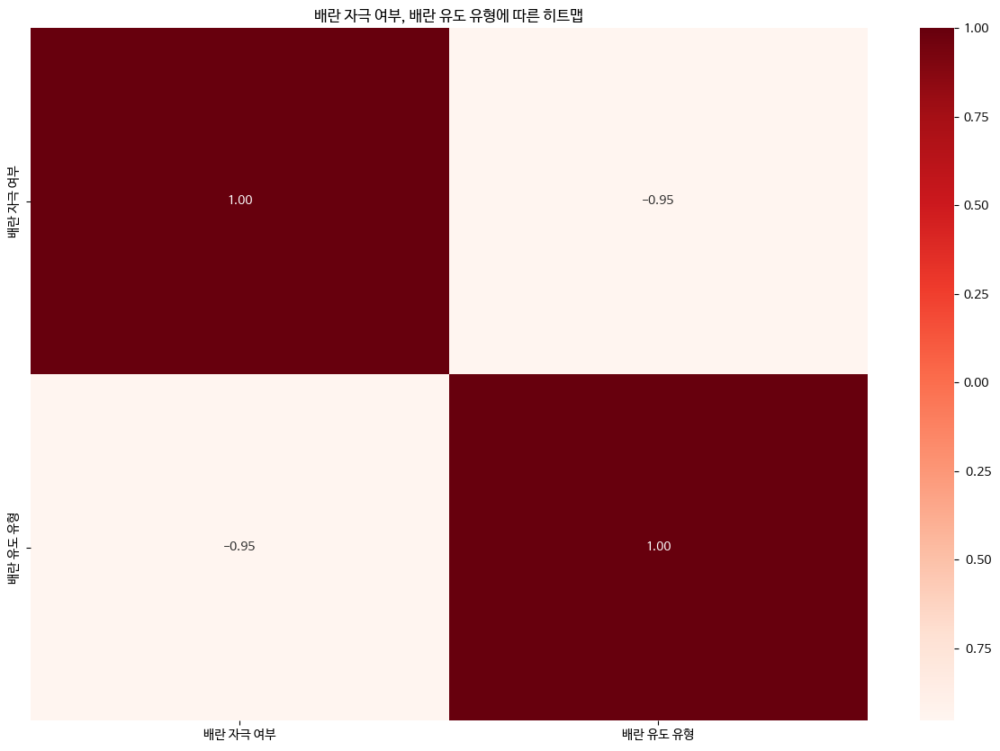

In [ ]:
# 배란 자극 여부, 배란 유도 유형
plt.figure(figsize=(15, 10))
plt.title('배란 자극 여부, 배란 유도 유형에 따른 히트맵')
sns.heatmap(heatmap_2, annot=True, fmt='.2f', cmap='Reds')
plt.show()

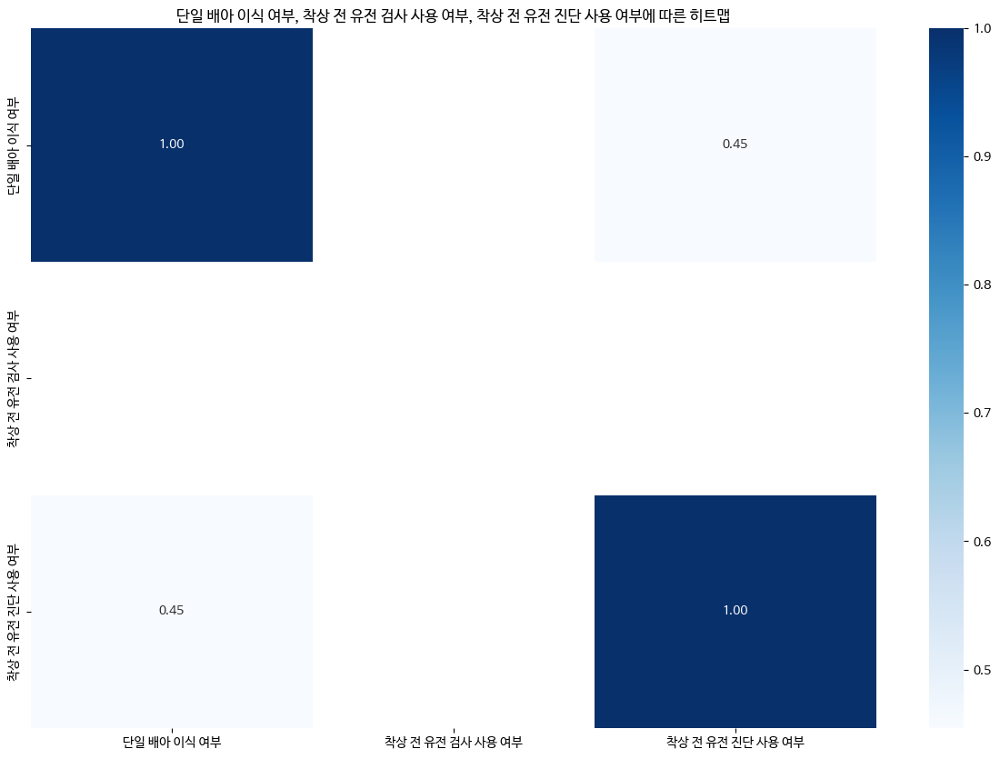

In [ ]:
# 단일 배아 이식 여부, 착상 전 유전 검사 사용 여부, 착상 전 유전 진단 사용 여부에 따른 히트맵 시각화
plt.figure(figsize=(15, 10))
plt.title('단일 배아 이식 여부, 착상 전 유전 검사 사용 여부, 착상 전 유전 진단 사용 여부에 따른 히트맵')
sns.heatmap(heatmap_3, annot=True, fmt='.2f', cmap='Blues')
plt.show()

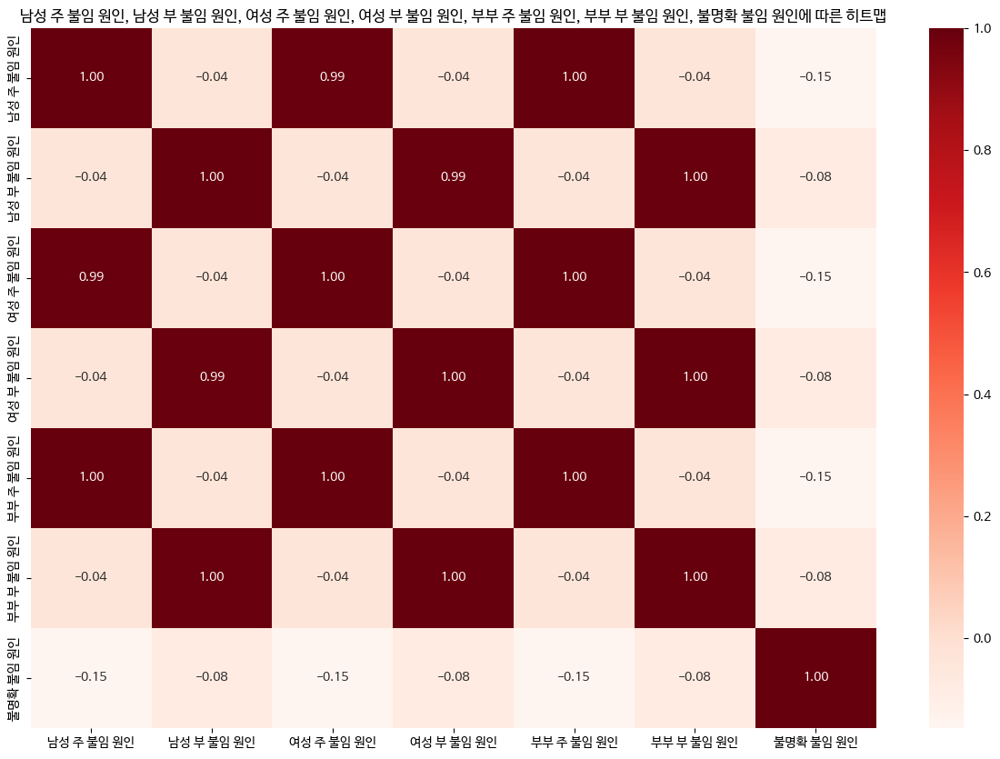

In [ ]:
# 남성 주 불임 원인, 남성 부 불임 원인, 여성 주 불임 원인, 여성 부 불임 원인, 부부 주 불임 원인, 부부 부 불임 원인, 불명확 불임 원인에 따른 히트맵 시각화
plt.figure(figsize=(15, 10))
plt.title('남성 주 불임 원인, 남성 부 불임 원인, 여성 주 불임 원인, 여성 부 불임 원인, 부부 주 불임 원인, 부부 부 불임 원인, 불명확 불임 원인에 따른 히트맵')
sns.heatmap(heatmap_4, annot=True, fmt='.2f', cmap='Reds')
plt.show()

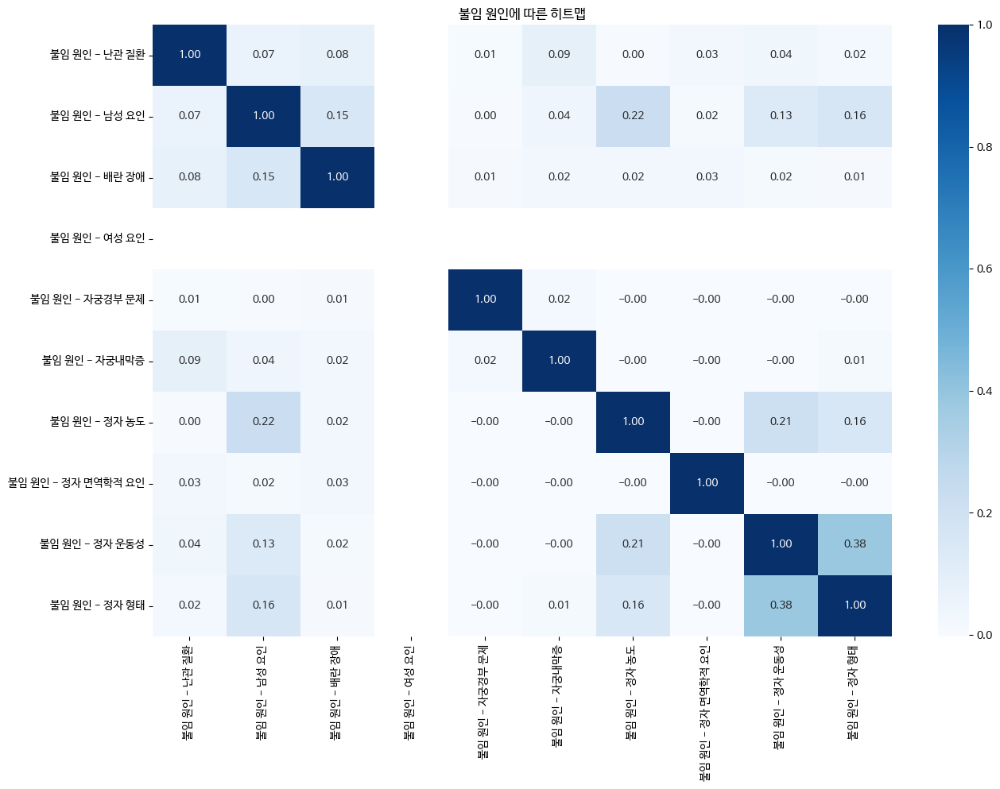

In [ ]:
# 불임 원인 - 난관 질환, 불임 원인 - 남성 요인, 불임 원인 - 배란 장애, 불임 원인 - 여성 요인, 불임 원인 - 자궁경부 문제, 불임 원인 - 자궁내막증, 불임 원인 - 정자 농도, 불임 원인 - 정자 면역학적 요인, 불임 원인 - 정자 운동성, 불임 원인 - 정자 형태에 따른 히트맵 시각화
plt.figure(figsize=(15, 10))
plt.title('불임 원인에 따른 히트맵')
sns.heatmap(heatmap_5, annot=True, fmt='.2f', cmap='Blues')
plt.show()

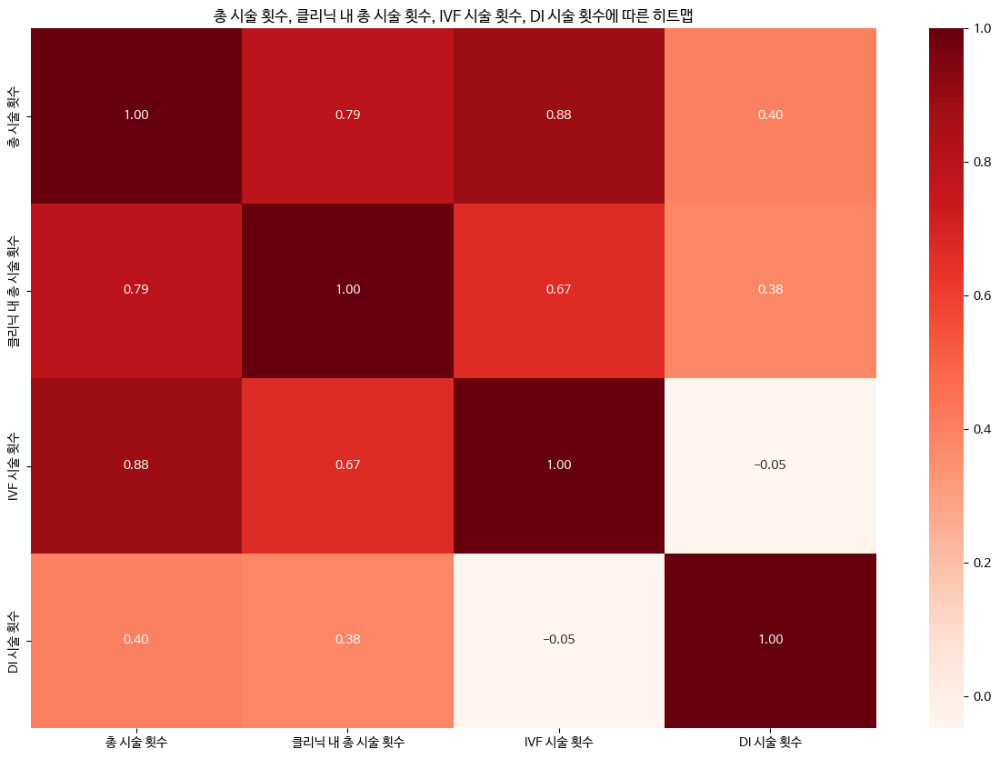

In [ ]:
# 총 시술 횟수, 클리닉 내 총 시술 횟수, IVF 시술 횟수, DI 시술 횟수에 따른 히트맵 시각화
plt.figure(figsize=(15, 10))
plt.title('총 시술 횟수, 클리닉 내 총 시술 횟수, IVF 시술 횟수, DI 시술 횟수에 따른 히트맵')
sns.heatmap(heatmap_6, annot=True, fmt='.2f', cmap='Reds')
plt.show()

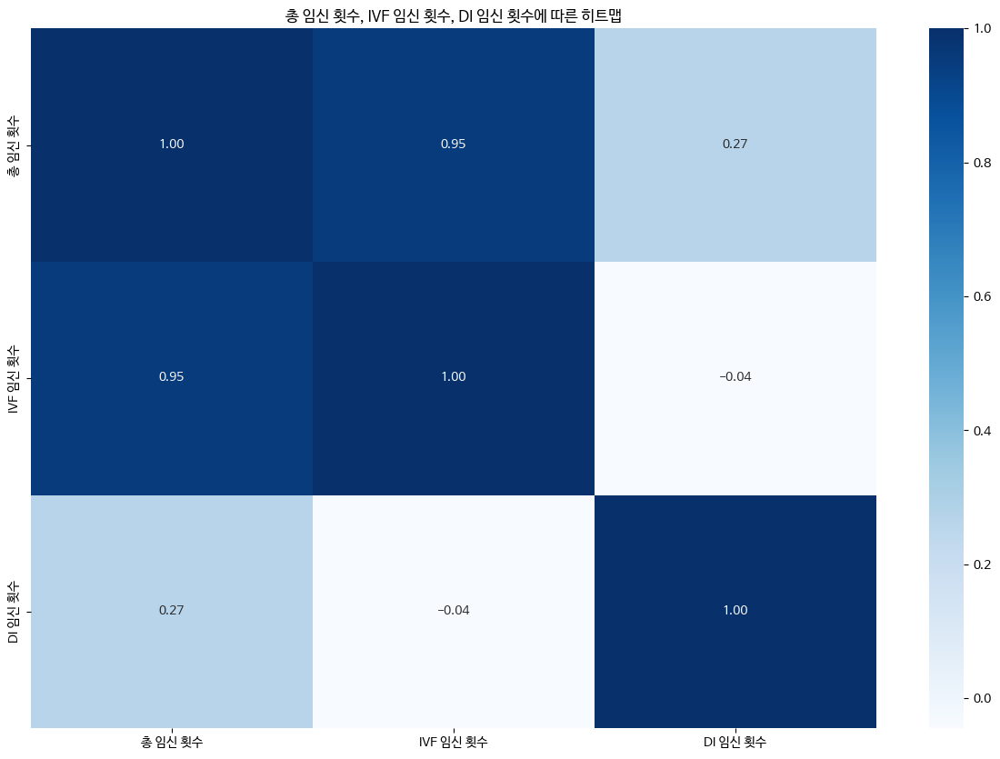

In [ ]:
# 총 임신 횟수, IVF 임신 횟수, DI 임신 횟수에 따른 히트맵 시각화
plt.figure(figsize=(15, 10))
plt.title('총 임신 횟수, IVF 임신 횟수, DI 임신 횟수에 따른 히트맵')
sns.heatmap(heatmap_7, annot=True, fmt='.2f', cmap='Blues')
plt.show()

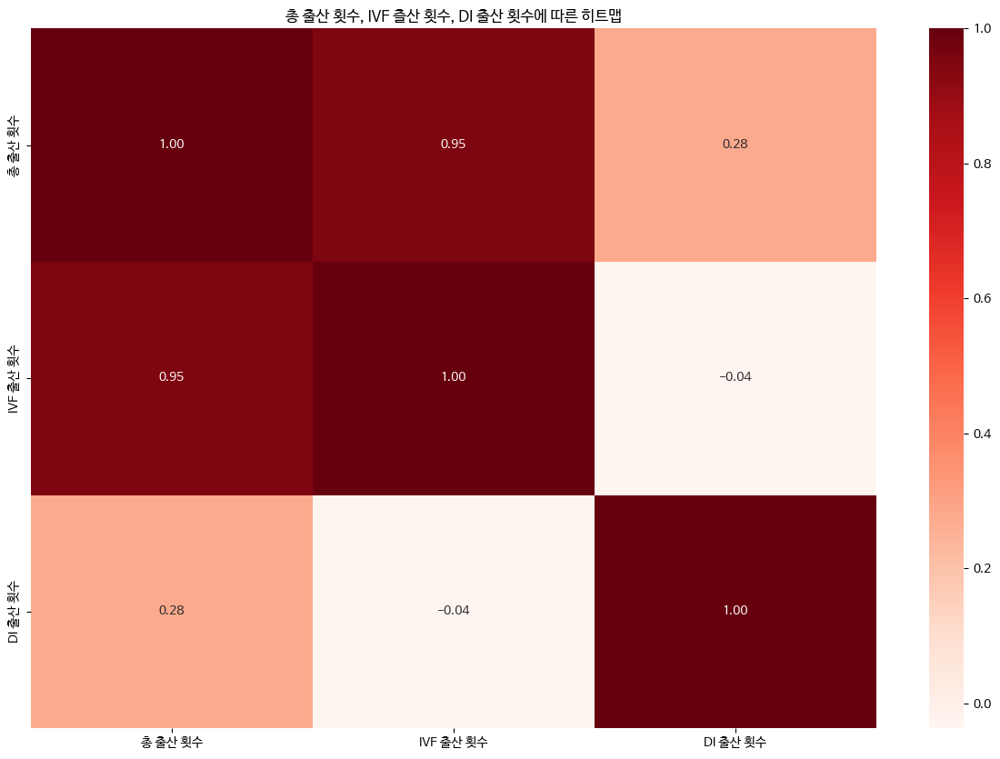

In [ ]:
# 총 출산 횟수, IVF 츨산 횟수, DI 출산 횟수에 따른 히트맵 시각화
plt.figure(figsize=(15, 10))
plt.title('총 출산 횟수, IVF 츨산 횟수, DI 출산 횟수에 따른 히트맵')
sns.heatmap(heatmap_8, annot=True, fmt='.2f', cmap='Reds')
plt.show()

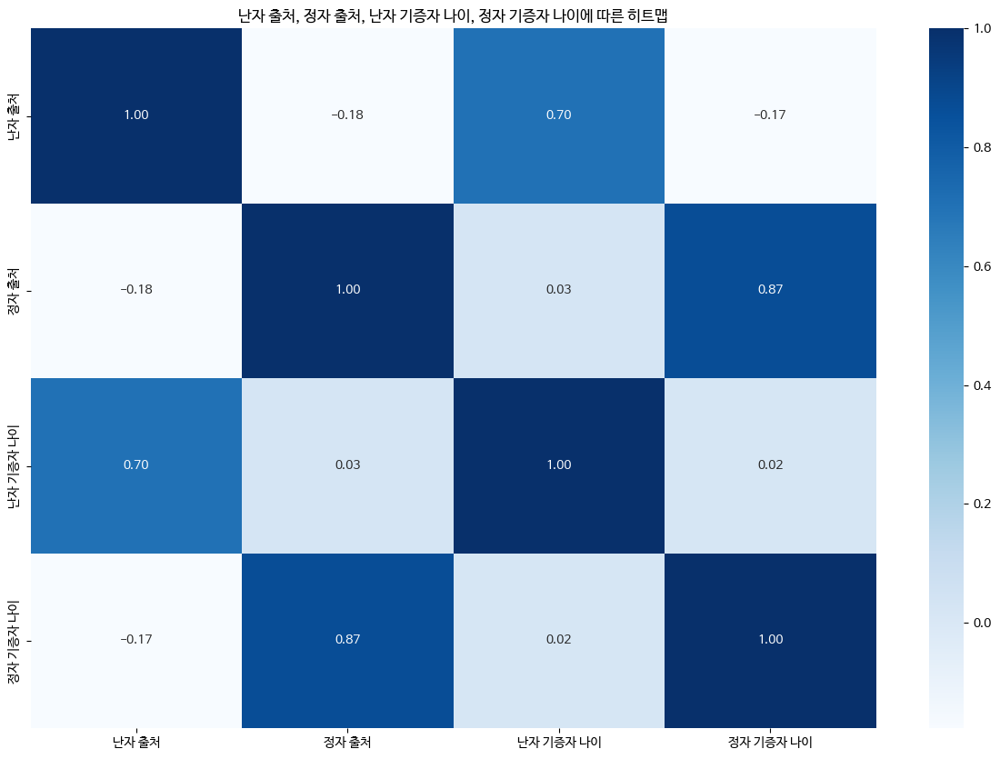

In [ ]:
# 난자 출처, 정자 출처, 난자 기증자 나이, 정자 기증자 나이에 따른 히트맵 시각화
plt.figure(figsize=(15, 10))
plt.title('난자 출처, 정자 출처, 난자 기증자 나이, 정자 기증자 나이에 따른 히트맵')
sns.heatmap(heatmap_9, annot=True, fmt='.2f', cmap='Blues')
plt.show()

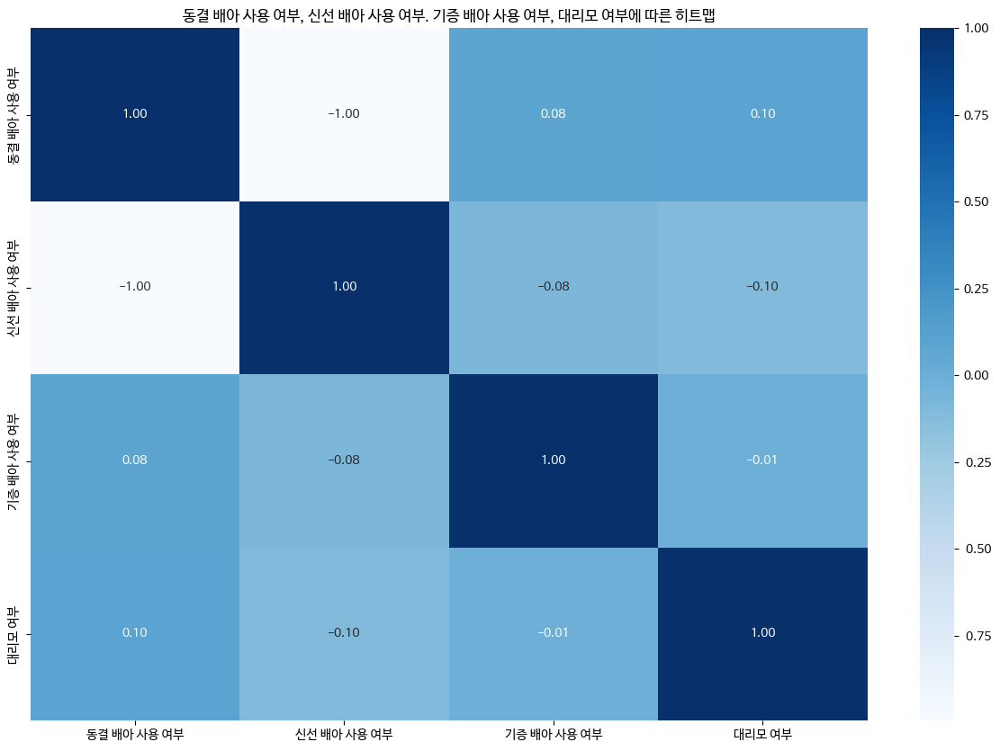

In [ ]:
# 동결 배아 사용 여부, 신선 배아 사용 여부. 기증 배아 사용 여부, 대리모 여부에 따른 히트맵 시각화
plt.figure(figsize=(15, 10))
plt.title('동결 배아 사용 여부, 신선 배아 사용 여부. 기증 배아 사용 여부, 대리모 여부에 따른 히트맵')
sns.heatmap(heatmap_10, annot=True, fmt='.2f', cmap='Blues')
plt.show()

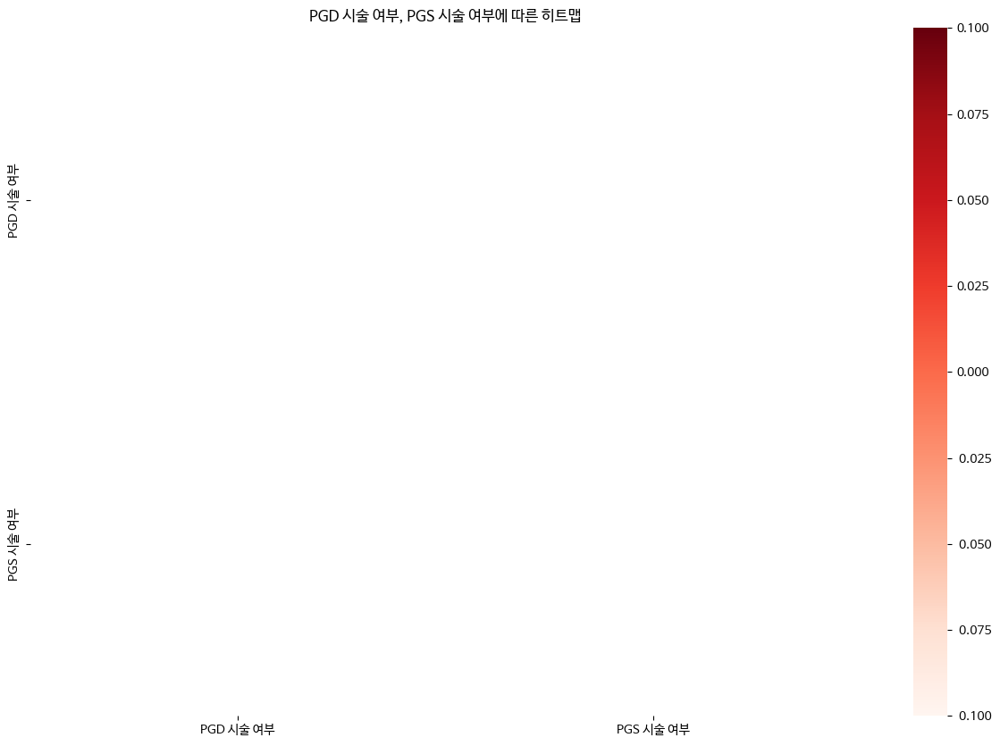

In [ ]:
# PGD 시술 여부, PGS 시술 여부
plt.figure(figsize=(15, 10))
plt.title('PGD 시술 여부, PGS 시술 여부에 따른 히트맵')
sns.heatmap(heatmap_11, annot=True, fmt='.2f', cmap='Reds')
plt.show()

In [ ]:
train.head()

,시술 시기 코드,시술 당시 나이,임신 시도 또는 마지막 임신 경과 연수,특정 시술 유형,배란 자극 여부,배란 유도 유형,단일 배아 이식 여부,착상 전 유전 검사 사용 여부,착상 전 유전 진단 사용 여부,남성 주 불임 원인,...,다태아률,미세주입된 배아 비율,미세주입된 난자 중 배아 생성율,미세주입 배아 이식율,미세주입 배아 저장율,주기당 이식된 배아 수,주기당 채취 신선 난자 수,주기당 혼합된 난자 수,저장된 신선 난자 비율,기증자 혼합된 난자 비율
1,TRYBLT,만45-50세,9,ICSI,0,알 수 없음,0,1,0,0,...,0.0,0.0,0.0,0.0,0.0,0.000000,0.0,0.0,0.0,0.0
7,TRXQMD,만40-42세,9,IVF,1,기록되지 않은 시행,0,1,0,0,...,0.0,0.0,0.0,0.0,0.0,0.400000,0.0,0.0,0.0,0.0
9,TRYBLT,만18-34세,9,IVF,1,기록되지 않은 시행,0,1,0,0,...,0.0,0.0,0.0,0.0,0.0,0.666667,0.0,0.0,0.0,0.0
10,TRCMWS,만40-42세,9,DI,0,알 수 없음,0,1,0,0,...,0.0,0.0,0.0,0.0,0.0,1.000000,0.0,0.0,0.0,0.0
11,TRZKPL,만40-42세,9,ICSI,1,기록되지 않은 시행,0,1,0,0,...,0.0,1.0,1.0,1.0,0.0,1.000000,0.0,0.0,0.0,1.0


In [ ]:
test.head()

,시술 시기 코드,시술 당시 나이,임신 시도 또는 마지막 임신 경과 연수,특정 시술 유형,배란 자극 여부,배란 유도 유형,단일 배아 이식 여부,착상 전 유전 검사 사용 여부,착상 전 유전 진단 사용 여부,남성 주 불임 원인,...,다태아률,미세주입된 배아 비율,미세주입된 난자 중 배아 생성율,미세주입 배아 이식율,미세주입 배아 저장율,주기당 이식된 배아 수,주기당 채취 신선 난자 수,주기당 혼합된 난자 수,저장된 신선 난자 비율,기증자 혼합된 난자 비율
0,TRYBLT,만35-37세,9,IVF,1,기록되지 않은 시행,0,1,0,0,...,0.0,0.0,0.000000,0.000000,0.000000,0.0,0.0,0.0,0.0,0.0
1,TRDQAZ,만18-34세,9,IVF,1,기록되지 않은 시행,0,1,0,0,...,0.0,0.0,0.000000,0.000000,0.000000,0.0,0.0,0.0,0.0,1.0
2,TRCMWS,만40-42세,9,ICSI,1,기록되지 않은 시행,0,1,0,0,...,0.0,1.0,0.555556,0.333333,0.000000,1.0,0.0,0.0,0.0,0.0
3,TRJXFG,만40-42세,9,ICSI,1,기록되지 않은 시행,0,1,0,0,...,0.0,1.0,1.000000,1.000000,0.000000,1.0,0.0,0.0,0.0,0.0
4,TRJXFG,만35-37세,9,ICSI,1,기록되지 않은 시행,0,1,0,0,...,0.0,1.0,1.000000,0.200000,0.583333,0.4,0.0,0.0,0.0,0.0


### Train

In [ ]:
# SMOTEENN 적용
smote_enn = SMOTEENN(sampling_strategy='auto', random_state=42)
X_resampled, y_resampled = smote_enn.fit_resample(X_train_encoded, y)

# 리샘플링된 데이터 확인 (선택 사항)
print(f"Original dataset shape: {X.shape}")
print(f"Resampled dataset shape: {X_resampled.shape}")

Original dataset shape: (86262, 88)
Resampled dataset shape: (95425, 88)


In [ ]:
print(X_resampled)
print(y_resampled)

       시술 시기 코드  시술 당시 나이  임신 시도 또는 마지막 임신 경과 연수  특정 시술 유형  배란 자극 여부  \
0      5.000000  5.000000                      9       1.0         0   
1      5.000000  0.000000                      9       2.0         1   
2      6.000000  3.000000                      9       1.0         1   
3      4.000000  2.000000                      9       0.0         0   
4      1.000000  4.000000                      9       2.0         0   
...         ...       ...                    ...       ...       ...   
95420  0.000000  2.000000                      9       2.0         1   
95421  1.000000  2.000000                      9       0.0         0   
95422  5.959946  0.040054                      9       1.0         1   
95423  5.860650  2.930325                      9       1.0         1   
95424  5.421855  0.421855                      9       1.0         1   

       배란 유도 유형  단일 배아 이식 여부  착상 전 유전 검사 사용 여부  착상 전 유전 진단 사용 여부  남성 주 불임 원인  \
0           2.0            0                 1         

#### Validate ROC-AUC Score

In [ ]:
# 데이터 분할 = dff(즉, train)에서 train과 val 7:3
import optuna
from lightgbm import LGBMClassifier
from lightgbm import callback
from lightgbm.callback import early_stopping, log_evaluation  # 콜백 함수 가져오기

In [ ]:
# 데이터 분할
X_train, X_valid, y_train, y_valid = train_test_split(
    X_resampled, y_resampled, test_size=0.2, random_state=42, stratify=y_resampled
)

In [ ]:
print("train 데이터:", X_train.shape)
print("test 데이터:", X_valid.shape)

train 데이터: (76340, 88)
test 데이터: (19085, 88)


In [ ]:
# LGBM
# def lgbm_roc_objective(trial):
#   param = {
#       'num_leaves': trial.suggest_int('num_leaves', 100, 200),
#       'max_depth' : trial.suggest_int('max_depth', -1, 600),
#       'learning_rate': trial.suggest_uniform('learning_rate', 0, 1),
#       'n_estimators': trial.suggest_int('n_estimators', 10, 5000),
#       'subsample_for_bin': trial.suggest_int('subsample_for_bin', 0, 400000),
#       'min_split_gain': trial.suggest_uniform('min_split_gain', 0, 1),
#       'min_child_weight': trial.suggest_uniform('min_child_weight', 0, 1),
#       'min_child_samples': trial.suggest_int('min_child_samples', 0, 100),
#   }
#   model = LGBMClassifier(**param, n_jobs=-1, objective='binary', random_state=0)
#   model.fit(
#       X = X_train,
#       y = y_train,
#       eval_metric='auc',
#       categorical_feature=categorical_columns
#   )
#   preds = model.predict_proba(X_valid)[:, 1]
#   roc_auc = roc_auc_score(y_valid, preds)
#   return roc_auc

# lgb_roc_study = optuna.create_study(direction='maximize', sampler=optuna.samplers.TPESampler(seed=0))
# lgb_roc_study.optimize(lgbm_roc_objective, n_trials=100)

# lgb_roc_best = lgb_roc_study.best_trial
# lgb_roc_best_params = lgb_roc_best.params
# print('score: {0}, params: {1}'.format(lgb_roc_best.value, lgb_roc_best_params))

In [ ]:
lgb_roc_model = LGBMClassifier(n_estimators = 400, n_jobs=-1, random_state=42)
# LGBM
lgb_roc_model.fit(
    X = X_train,
    y = y_train,
    eval_set=[(X_valid, y_valid)],
    eval_metric='logloss'
)
lgb_roc_pred = lgb_roc_model.predict_proba(X_valid)[:, 1]
lgb_roc_roc = roc_auc_score(y_valid, lgb_roc_pred)
print('LGBM ROC model - ROC AUC: %.4f' % (lgb_roc_roc))

[LightGBM] [Warning] Found whitespace in feature_names, replace with underlines
[LightGBM] [Info] Number of positive: 48222, number of negative: 28118
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.009221 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 8817
[LightGBM] [Info] Number of data points in the train set: 76340, number of used features: 78
[LightGBM] [Warning] Found whitespace in feature_names, replace with underlines
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.631674 -> initscore=0.539405
[LightGBM] [Info] Start training from score 0.539405
LGBM ROC model - ROC AUC: 0.9821


In [ ]:
# save model
import joblib
joblib.dump(lgb_roc_model, '/content/drive/MyDrive/data/lgb.ptd')

# load model
lgb_roc_model = joblib.load('/content/drive/MyDrive/data/lgb.ptd')

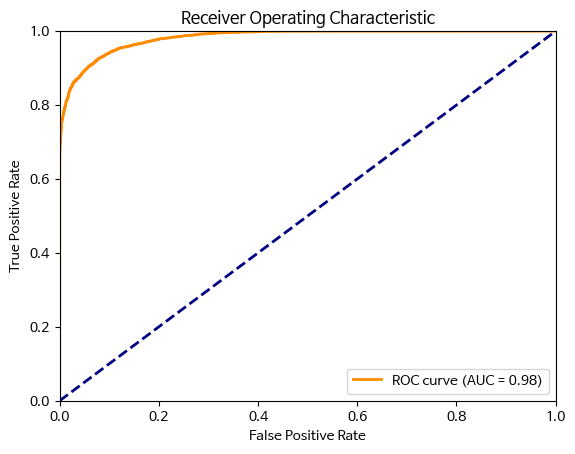

In [ ]:
# 예측 확률 계산
# ROC 곡선 계산
fpr, tpr, thresholds = roc_curve(y_valid, lgb_roc_pred)
# AUC 계산
roc_auc = auc(fpr, tpr)

# ROC 곡선 그리기
plt.figure()
plt.plot(fpr, tpr, color='darkorange', lw=2, label=f'ROC curve (AUC = {roc_auc:.2f})')
plt.plot([0, 1], [0, 1], color='navy', lw=2, linestyle='--')
plt.xlim([0.0, 1.0])
plt.ylim([0.0, 1.0])
plt.xlabel('False Positive Rate')
plt.ylabel('True Positive Rate')
plt.title('Receiver Operating Characteristic')
plt.legend(loc='lower right')
plt.show()

#### Train model

### Predict

In [ ]:
pred_proba = lgb_roc_model.predict_proba(X_test_encoded)[:, 1]

### Submission

In [ ]:
sample_submission = pd.read_csv('/content/drive/MyDrive/data/sample_submission.csv')
# sample_submission = pd.read_csv('/data/sample_submission.csv')
sample_submission['probability'] = pred_proba

In [ ]:
sample_submission.to_csv('/content/drive/MyDrive/data/baseline_submit.csv', index=False)
# sample_submission.to_csv('/data/baseline_submit.csv', index=False)